# State-of-the-Art PINNs for 4D-STEM Strain Reconstruction

## Data Efficiency with Physics-Informed Adaptive Learning

**Goal**: Reconstruct high-fidelity strain maps (e_xx, e_yy, e_xy, θ) using only **1%–75%** of 4D-STEM measurement data.

### Key Innovations

1. **SIREN Architecture**: Sine-activated residual encoding networks with proper weight initialization
2. **Adaptive Loss Balancing**: GradNorm-based dynamic weighting of data vs. physics terms
3. **Residual-Based Adaptive Refinement (RAR)**: Intelligently augment training set in high-error regions
4. **Physics Constraints**: Enforce linear elasticity equilibrium (div(σ)=0) as soft loss
5. **Multi-Sampling Strategy**: Compare 1%, 5%, 10%, 25%, 50%, 75% data utilization

### References
- [Curriculum-Enhanced Adaptive Sampling for PINNs](https://www.mdpi.com/2227-7390/13/24/3996)
- [Annealed Adaptive Importance Sampling (AAIS)](https://arxiv.org/abs/2405.03433)
- [R-PINN: Recovery-type Error Estimators](https://arxiv.org/html/2506.10243)
- [Failure-Informed Adaptive Sampling](https://epubs.siam.org/doi/10.1137/22M1527763)
- [Investigating Guiding Information for Adaptive Sampling](https://arxiv.org/html/2404.12282v1)


In [1]:
# ============================================================================
# SECTION 1: Environment Setup & Configuration
# ============================================================================
import sys
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import csv
import time
from tqdm import trange
from collections import defaultdict
import pandas as pd

# Versions
print(f"Python: {sys.version.split()[0]}")
print(f"NumPy: {np.__version__}")
print(f"PyTorch: {torch.__version__}")

# Device selection (prefer Apple MPS, then CUDA, then CPU)
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("✓ Using Apple Metal Performance Shaders (MPS)")
elif torch.cuda.is_available():
    device = torch.device("cuda")
    print(f"✓ Using CUDA: {torch.cuda.get_device_name(0)}")
else:
    device = torch.device("cpu")
    print("⚠ Using CPU (slow!)")

# Reproducibility
SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)

# Plotting defaults
plt.rcParams.update({
    "figure.figsize": (12, 8),
    "image.cmap": "RdBu",
    "axes.grid": False,
    "font.size": 14,
    "font.family": "sans-serif",
    "axes.labelsize": 13,
    "axes.titlesize": 14,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 12,
    "figure.titlesize": 15,
    "axes.linewidth": 0.8,
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
})

print("\n" + "="*70)
print("CONFIGURATION: STATE-OF-THE-ART PINN FOR STRAIN RECONSTRUCTION")
print("="*70)

Python: 3.10.15
NumPy: 1.26.4
PyTorch: 2.5.1
✓ Using Apple Metal Performance Shaders (MPS)

CONFIGURATION: STATE-OF-THE-ART PINN FOR STRAIN RECONSTRUCTION


In [2]:
# ============================================================================
# Comprehensive Configuration Dictionary
# ============================================================================
print("\n" + "="*70)
print("CONFIGURATION: PHYSICS-INFORMED PINN FOR STRAIN RECONSTRUCTION")
print("="*70)

config = {
    # --- DATA & GRID ---
    "sampling_fractions": [0.01, 0.05, 0.10, 0.25, 0.50, 0.75],
    "full_data_training": False,

    # --- SPECIMEN: Si / Si-Ge thin film (worked example) ---
    # Isotropic linear-elastic constants used to close elastic equilibrium.
    "specimen": "Si-SiGe thin film",
    "E": 150e9,                 # Young's modulus (Pa), representative Si/SiGe
    "nu": 0.27,                 # Poisson's ratio
    "px_um": 0.017872741,       # real-space pixel size (micrometre/pixel) from metadata

    # --- PHYSICS LOSS (autodiff @ collocation points) ---
    "n_collocation": 2000,      # collocation points resampled each step (Eq. for L_phys)
    "alpha_eq": 0.1,            # weight on elastic-equilibrium residual
    "alpha_co": 0.1,            # weight on Saint-Venant compatibility residual
    "w_data": 1.0,              # data-term weight (lambda_data)
    "lambda_phys_max": 1.0,     # asymptotic physics weight (lambda_phys^max)
    "ramp_tau": 500.0,          # ramp time-constant tau (epochs): lambda_phys(t)=max*(1-e^{-t/tau})

    # --- ARCHITECTURE (SIREN backbone) ---
    "architecture": "siren",
    "hidden_dim": 128,
    "num_layers": 6,
    "skip_connections": True,
    "omega_0": 1.0,

    # --- TRAINING ---
    "epochs": 5000,
    "lr": 1e-3,
    "lr_decay_factor": 0.95,
    "lr_decay_interval": 500,
    "early_stop": True,
    "patience": 300,            # patience on held-out VALIDATION data loss
    "min_delta": 1e-6,
    "val_fraction": 0.10,       # fraction of sampled points held out for validation/early-stop

    # --- ADAPTIVE COLLOCATION REFINEMENT (RAR) ---
    "enable_rar": True,
    "rar_trigger_epoch": 2000,
    "rar_interval": 500,
    "rar_num_new_points_pct": 0.10,   # add 10% of n_collocation high-residual points
    "rar_max_pool_mult": 5,           # cap persistent pool at 5x n_collocation

    # --- OUTPUTS ---
    "out_dir": "outputs/sota_adaptive-2",
    "save_checkpoints": False,
    "verbose": True,
    "compute_full_domain_error": True,
}

out_dir = Path(config["out_dir"]).resolve()
out_dir.mkdir(parents=True, exist_ok=True)

print(f"Specimen           : {config['specimen']}  (E={config['E']:.3g} Pa, nu={config['nu']})")
print(f"Pixel size         : {config['px_um']*1000:.3f} nm/pixel")
print(f"Sampling fractions : {config['sampling_fractions']}")
print(f"Architecture       : {config['architecture'].upper()} "
      f"({config['num_layers']} layers x {config['hidden_dim']}, omega_0={config['omega_0']})")
print(f"Physics            : autodiff equilibrium + Saint-Venant compatibility @ "
      f"{config['n_collocation']} collocation pts; ramp tau={config['ramp_tau']:.0f}")
print(f"RAR                : {config['enable_rar']} (from epoch {config['rar_trigger_epoch']}, "
      f"every {config['rar_interval']}, +{config['rar_num_new_points_pct']*100:.0f}%)")
print(f"Output dir         : {out_dir}")



CONFIGURATION: PHYSICS-INFORMED PINN FOR STRAIN RECONSTRUCTION
Specimen           : Si-SiGe thin film  (E=1.5e+11 Pa, nu=0.27)
Pixel size         : 17.873 nm/pixel
Sampling fractions : [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]
Architecture       : SIREN (6 layers x 128, omega_0=1.0)
Physics            : autodiff equilibrium + Saint-Venant compatibility @ 2000 collocation pts; ramp tau=500
RAR                : True (from epoch 2000, every 500, +10%)
Output dir         : /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2


In [3]:
# ============================================================================
# SECTION 2: Load & Visualize 4D-STEM Strain Data (SEPARATE FILES)
# ============================================================================

# Load separate strain component files
root = Path.cwd()
data_candidates = [
    (root / 'data' / 'strain_exx.npy', root / 'data' / 'strain_exy.npy', root / 'data' / 'strain_eyy.npy'),
    (root / 'strain_exx.npy', root / 'strain_exy.npy', root / 'strain_eyy.npy'),
]

data_paths = None
for paths in data_candidates:
    if all(p.exists() for p in paths):
        data_paths = paths
        break

if data_paths is None:
    raise FileNotFoundError("Could not find strain component files (strain_exx.npy, strain_exy.npy, strain_eyy.npy)")

exx_path, exy_path, eyy_path = data_paths
print(f"✓ Loading strain components from:")
print(f"   - {exx_path}")
print(f"   - {exy_path}")
print(f"   - {eyy_path}")

e_xx = np.load(exx_path)
e_xy = np.load(exy_path)
e_yy = np.load(eyy_path)

# Auto-compute derived fields from components
mask = np.isfinite(e_xx).astype(np.float32)
theta = np.arctan2(e_xy, (e_xx - e_yy) / 2.0 + 1e-10)
error = np.sqrt(e_xx**2 + e_yy**2 + 2*e_xy**2)

H, W = e_xx.shape
print(f"✓ Grid dimensions: {H} × {W} = {H*W:,} points")
print(f"✓ Valid masked region: {mask.sum():,} / {H*W:,} points ({100*mask.sum()/(H*W):.1f}%)")

# Compute normalization statistics on valid entries
valid = mask.astype(bool)
scalers = {}
for name, arr in {
    'e_xx': e_xx,
    'e_yy': e_yy,
    'e_xy': e_xy,
    'theta': theta,
}.items():
    vals = arr[valid]
    mean_val = float(np.nanmean(vals))
    std_val = float(np.nanstd(vals)) + 1e-8
    scalers[name] = {"mean": mean_val, "std": std_val}
    print(f"   {name:8s}: μ={mean_val:+.4e}, σ={std_val:.4e}")

# Scaling functions
def scale(arr, name):
    s = scalers[name]
    return (arr - s["mean"]) / s["std"]

def unscale(arr_tensor, name):
    s = scalers[name]
    if isinstance(arr_tensor, torch.Tensor):
        return arr_tensor * s["std"] + s["mean"]
    return arr_tensor * s["std"] + s["mean"]

# Create spatial grid
x_lin = torch.linspace(0, 1, W, dtype=torch.float32)
y_lin = torch.linspace(0, 1, H, dtype=torch.float32)
X, Y = torch.meshgrid(x_lin, y_lin, indexing='xy')

# Flatten and move to device
x_flat = X.flatten().to(device)
y_flat = Y.flatten().to(device)

# Prepare tensors with scaling
e_xx_scaled = torch.tensor(scale(e_xx, 'e_xx').flatten(), dtype=torch.float32, device=device)
e_yy_scaled = torch.tensor(scale(e_yy, 'e_yy').flatten(), dtype=torch.float32, device=device)
e_xy_scaled = torch.tensor(scale(e_xy, 'e_xy').flatten(), dtype=torch.float32, device=device)
theta_scaled = torch.tensor(scale(theta, 'theta').flatten(), dtype=torch.float32, device=device)
mask_flat = torch.tensor(mask.flatten(), dtype=torch.float32, device=device)

print(f"✓ Tensors prepared and moved to device: {device}")

✓ Loading strain components from:
   - /Users/robertodosreis/Documents/codes/pinns-4dstem/data/strain_exx.npy
   - /Users/robertodosreis/Documents/codes/pinns-4dstem/data/strain_exy.npy
   - /Users/robertodosreis/Documents/codes/pinns-4dstem/data/strain_eyy.npy
✓ Grid dimensions: 180 × 400 = 72,000 points
✓ Valid masked region: 72,000.0 / 72,000 points (100.0%)
   e_xx    : μ=-2.5194e-03, σ=5.2466e-02
   e_yy    : μ=-5.4923e-03, σ=1.0615e-01
   e_xy    : μ=+1.2601e-03, σ=5.5097e-02
   theta   : μ=-2.4607e-01, σ=1.7883e+00
✓ Tensors prepared and moved to device: mps


e_xx           : min=-2.4411e-01, max=+1.3867e-01, mean=-2.5194e-03, std=5.2466e-02
e_yy           : min=-3.7106e-01, max=+2.8278e-01, mean=-5.4923e-03, std=1.0615e-01
e_xy           : min=-1.2884e-01, max=+2.0437e-01, mean=+1.2601e-03, std=5.5097e-02
θ (rotation)   : min=-3.1414e+00, max=+3.1416e+00, mean=-2.4607e-01, std=1.7883e+00
Valid Mask     : min=+1.0000e+00, max=+1.0000e+00, mean=+1.0000e+00, std=0.0000e+00
Measurement Error: min=+1.8868e-03, max=+4.3881e-01, mean=+1.2792e-01, std=6.1381e-02


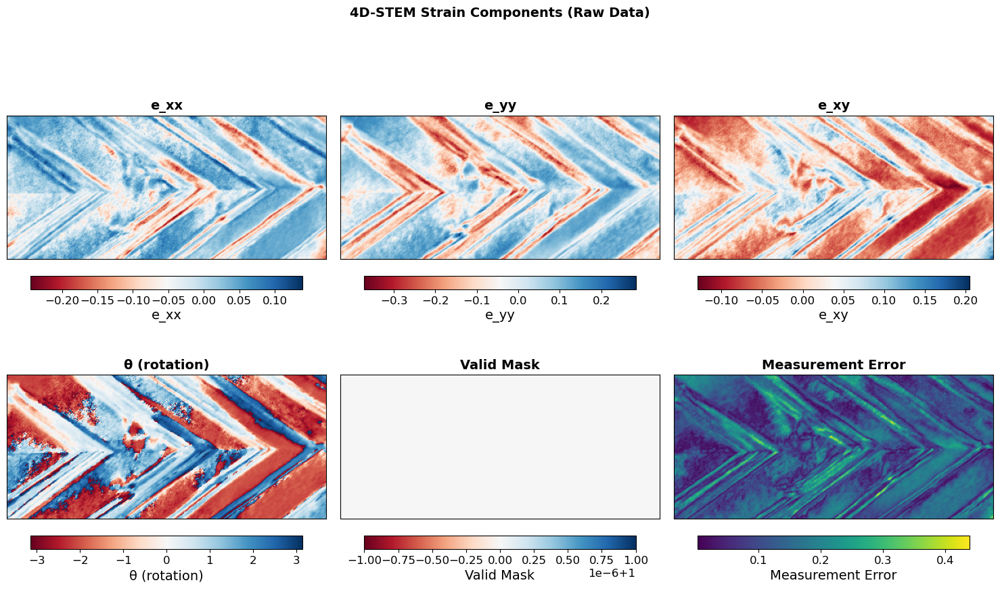

✓ Raw data visualization saved to: /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/00_raw_data_overview.png


In [4]:
# Visualize raw strain data
fig, axes = plt.subplots(2, 3, figsize=(15, 9))
fig.suptitle('4D-STEM Strain Components (Raw Data)', fontsize=14, fontweight='bold')

components = [
    (e_xx, 'e_xx', 0),
    (e_yy, 'e_yy', 1),
    (e_xy, 'e_xy', 2),
    (theta, 'θ (rotation)', 3),
    (mask, 'Valid Mask', 4),
    (error, 'Measurement Error', 5),
]

for arr, label, idx in components:
    ax = axes.flat[idx]
    
    # Replace NaN/Inf with valid values for visualization
    arr_display = np.copy(arr).astype(float)
    arr_display[~np.isfinite(arr_display)] = 0.0
    
    # Compute vmin/vmax from valid data only
    # Use only finite values to avoid NaN/Inf issues
    finite_mask = np.isfinite(arr_display)
    if np.any(finite_mask):
        valid_data = arr_display[finite_mask]
        vmin = float(np.min(valid_data))
        vmax = float(np.max(valid_data))
        # If all values are the same, add small epsilon for contrast
        if vmin == vmax:
            vmin -= 1e-6
            vmax += 1e-6
    else:
        vmin, vmax = 0.0, 1.0
    
    # Final safety check - ensure vmin and vmax are strictly finite
    if not (np.isfinite(vmin) and np.isfinite(vmax)):
        vmin, vmax = 0.0, 1.0
    
    # Ensure vmin <= vmax
    if vmin > vmax:
        vmin, vmax = vmax, vmin
    
    if idx < 5:
        im = ax.imshow(arr_display, cmap='RdBu', origin='lower', vmin=vmin, vmax=vmax)
    else:
        im = ax.imshow(arr_display, cmap='viridis', origin='lower', vmin=vmin, vmax=vmax)
    
    cbar = plt.colorbar(im, ax=ax, location='bottom', pad=0.06, shrink=0.85)
    cbar.set_label(label, fontsize=14)
    cbar.ax.tick_params(labelsize=12)
    
    ax.set_title(label, fontweight='bold', fontsize=14)
    ax.set_xticks([])
    ax.set_yticks([])
    
    # Print stats
    finite_mask = np.isfinite(arr)
    if np.any(finite_mask):
        valid_data = arr[finite_mask]
        print(f"{label:15s}: min={np.min(valid_data):+.4e}, max={np.max(valid_data):+.4e}, " + 
              f"mean={np.mean(valid_data):+.4e}, std={np.std(valid_data):.4e}")
    else:
        print(f"{label:15s}: [No finite data]")

plt.tight_layout()
plt.savefig(out_dir / "00_raw_data_overview.png", dpi=300, bbox_inches='tight')
plt.show()

print(f"✓ Raw data visualization saved to: {out_dir / '00_raw_data_overview.png'}")

In [5]:
# Diagnostic check for NaN/Inf values
print("\n=== DATA QUALITY CHECK ===")
for name, arr in [('e_xx', e_xx), ('e_yy', e_yy), ('e_xy', e_xy), ('theta', theta), ('mask', mask), ('error', error)]:
    n_nan = np.isnan(arr).sum()
    n_inf = np.isinf(arr).sum()
    n_finite = np.isfinite(arr).sum()
    print(f"{name:10s}: NaN={n_nan:6d}, Inf={n_inf:6d}, Finite={n_finite:6d} / {arr.size:6d}")

print("="*40)


=== DATA QUALITY CHECK ===
e_xx      : NaN=     0, Inf=     0, Finite= 72000 /  72000
e_yy      : NaN=     0, Inf=     0, Finite= 72000 /  72000
e_xy      : NaN=     0, Inf=     0, Finite= 72000 /  72000
theta     : NaN=     0, Inf=     0, Finite= 72000 /  72000
mask      : NaN=     0, Inf=     0, Finite= 72000 /  72000
error     : NaN=     0, Inf=     0, Finite= 72000 /  72000


In [6]:
# ============================================================================
# SECTION 3: State-of-the-Art PINN Architecture (SIREN + Skip Connections)
# ============================================================================

class SirenLayer(nn.Module):
    """SIREN layer with sine activation and proper weight initialization."""
    def __init__(self, in_features, out_features, is_first=False, omega_0=1.0):
        super().__init__()
        self.in_features = in_features
        self.is_first = is_first
        self.omega_0 = omega_0
        
        self.linear = nn.Linear(in_features, out_features)
        
        # Proper initialization (Sitzmann et al., 2020)
        with torch.no_grad():
            if is_first:
                self.linear.weight.uniform_(-1 / in_features, 1 / in_features)
            else:
                bound = np.sqrt(6 / in_features) / omega_0
                self.linear.weight.uniform_(-bound, bound)
    
    def forward(self, x):
        return torch.sin(self.omega_0 * self.linear(x))


class StrainPINN_SIREN(nn.Module):
    """State-of-the-art SIREN architecture with skip connections for strain maps."""
    def __init__(self, hidden_dim=128, num_layers=6, omega_0=1.0, skip_connections=True):
        super().__init__()
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers
        self.skip_connections = skip_connections
        
        # First layer: (x,y) -> hidden
        self.first = SirenLayer(2, hidden_dim, is_first=True, omega_0=omega_0)
        
        # Hidden layers with optional skip connections
        self.hidden_layers = nn.ModuleList([
            SirenLayer(hidden_dim, hidden_dim, is_first=False, omega_0=omega_0)
            for _ in range(num_layers - 2)
        ])
        
        # Skip connection projection (if used)
        if self.skip_connections:
            self.skip_proj = nn.Linear(hidden_dim, hidden_dim)
        
        # Final output layer
        self.final = nn.Linear(hidden_dim, 4)  # e_xx, e_yy, e_xy, theta
        
        # Initialize final layer to near-zero
        with torch.no_grad():
            self.final.weight.uniform_(-np.sqrt(6 / hidden_dim), np.sqrt(6 / hidden_dim))
    
    def forward(self, x):
        """x shape: (N, 2)"""
        # First layer
        x_h = self.first(x)  # (N, hidden_dim)
        
        # Hidden layers with skip connections
        for i, layer in enumerate(self.hidden_layers):
            if self.skip_connections and i % 2 == 0 and i > 0:
                # Skip connection every 2 layers
                x_h_new = layer(x_h) + self.skip_proj(x_h)
            else:
                x_h_new = layer(x_h)
            x_h = x_h_new
        
        # Final output
        out = self.final(x_h)  # (N, 4)
        return out


class StrainPINN_Fourier(nn.Module):
    """Fourier feature network: encodes spatial input with Fourier features."""
    def __init__(self, hidden_dim=128, num_layers=6, B_scale=1.0):
        super().__init__()
        self.B_scale = B_scale
        # Fixed Fourier feature matrix
        self.register_buffer('B', torch.randn(2, hidden_dim // 2) * B_scale)
        
        self.net = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            *[nn.Sequential(nn.Linear(hidden_dim, hidden_dim), nn.ReLU()) 
              for _ in range(num_layers - 2)],
            nn.Linear(hidden_dim, 4),
        )
    
    def forward(self, x):
        """x shape: (N, 2)"""
        # Compute Fourier features: [sin(2π*B*x), cos(2π*B*x)]
        proj = torch.matmul(x, self.B)  # (N, hidden_dim//2)
        x_enc = torch.cat([torch.sin(2 * np.pi * proj), torch.cos(2 * np.pi * proj)], dim=1)  # (N, hidden_dim)
        return self.net(x_enc)


class StrainPINN_Standard(nn.Module):
    """Standard MLP baseline."""
    def __init__(self, hidden_dim=128, num_layers=6):
        super().__init__()
        layers = [nn.Linear(2, hidden_dim), nn.ReLU()]
        for _ in range(num_layers - 2):
            layers.append(nn.Linear(hidden_dim, hidden_dim))
            layers.append(nn.ReLU())
        layers.append(nn.Linear(hidden_dim, 4))
        self.net = nn.Sequential(*layers)
    
    def forward(self, x):
        return self.net(x)


def create_pinn_model(arch_type, hidden_dim, num_layers, skip_connections=False):
    """Factory function to create PINN models."""
    if arch_type == "siren":
        return StrainPINN_SIREN(hidden_dim, num_layers, omega_0=1.0, skip_connections=skip_connections)
    elif arch_type == "fourier":
        return StrainPINN_Fourier(hidden_dim, num_layers, B_scale=1.0)
    elif arch_type == "standard":
        return StrainPINN_Standard(hidden_dim, num_layers)
    else:
        raise ValueError(f"Unknown architecture: {arch_type}")


# Instantiate model and show summary
model_test = create_pinn_model(config["architecture"], config["hidden_dim"], 
                               config["num_layers"], config["skip_connections"])
print(f"\n✓ Model Architecture: {config['architecture'].upper()}")
print(f"  Parameters: {sum(p.numel() for p in model_test.parameters()):,}")
print(model_test)


✓ Model Architecture: SIREN
  Parameters: 83,460
StrainPINN_SIREN(
  (first): SirenLayer(
    (linear): Linear(in_features=2, out_features=128, bias=True)
  )
  (hidden_layers): ModuleList(
    (0-3): 4 x SirenLayer(
      (linear): Linear(in_features=128, out_features=128, bias=True)
    )
  )
  (skip_proj): Linear(in_features=128, out_features=128, bias=True)
  (final): Linear(in_features=128, out_features=4, bias=True)
)



SAMPLING STRATEGY: SPARSE TRAINING MASKS
      1%:    720 / 72,000 points → spatial coverage: 1.0%
      5%:  3,600 / 72,000 points → spatial coverage: 5.0%
     10%:  7,200 / 72,000 points → spatial coverage: 10.0%
     25%: 18,000 / 72,000 points → spatial coverage: 25.0%
     50%: 36,000 / 72,000 points → spatial coverage: 50.0%
     75%: 54,000 / 72,000 points → spatial coverage: 75.0%


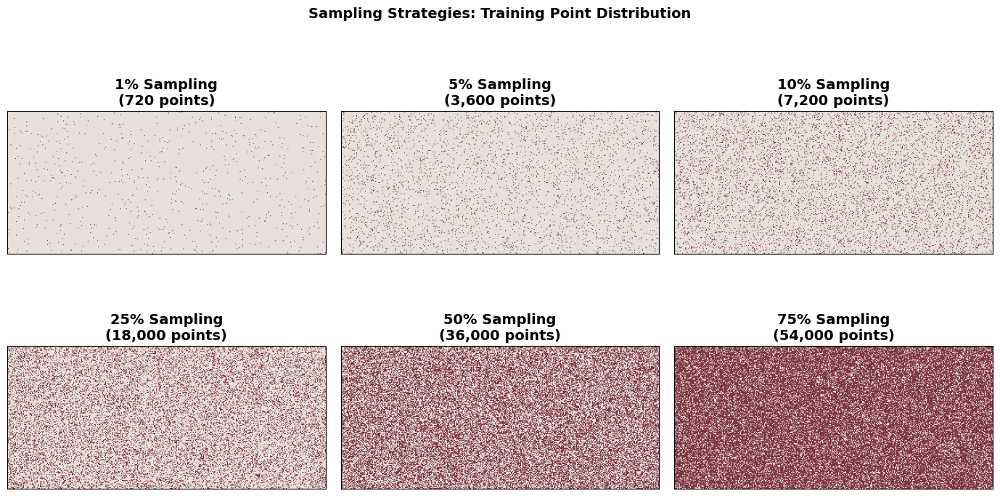

✓ Sampling visualization saved to: /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/01_sampling_patterns.png


In [7]:
# ============================================================================
# SECTION 4: Sampling Strategies & Sparse Masks
# ============================================================================

def create_sparse_mask(mask_full, sampling_fraction, seed=SEED):
    """
    Create sparse training mask by randomly selecting sampling_fraction of valid points.
    
    Args:
        mask_full: Full binary mask (H, W)
        sampling_fraction: Fraction of valid points to use [0, 1]
        seed: Random seed for reproducibility
        
    Returns:
        sparse_mask: Binary mask (H, W) with same shape as input
        selected_indices: 1D array of flat indices where mask_sparse == 1
    """
    rng = np.random.RandomState(seed)
    
    # Get indices of all valid points
    valid_indices = np.where(mask_full.flatten())[0]
    n_valid = len(valid_indices)
    
    # Sample points
    n_samples = max(1, int(np.ceil(sampling_fraction * n_valid)))
    selected_flat_indices = rng.choice(valid_indices, n_samples, replace=False)
    
    # Create sparse mask
    sparse_mask_flat = np.zeros(mask_full.size, dtype=np.float32)
    sparse_mask_flat[selected_flat_indices] = 1.0
    sparse_mask = sparse_mask_flat.reshape(mask_full.shape)
    
    return sparse_mask, selected_flat_indices


# Create sparse masks for all sampling fractions
sparse_masks = {}
sampled_indices = {}

print("\n" + "="*70)
print("SAMPLING STRATEGY: SPARSE TRAINING MASKS")
print("="*70)
for frac in config["sampling_fractions"]:
    sparse_mask, indices = create_sparse_mask(mask, frac, seed=SEED + int(frac * 1000))
    sparse_masks[frac] = torch.tensor(sparse_mask.flatten(), dtype=torch.float32, device=device)
    sampled_indices[frac] = indices
    
    n_train = sparse_mask.sum()
    n_valid = mask.sum()
    print(f"  {frac*100:5.0f}%: {int(n_train):6,d} / {int(n_valid):6,d} points → spatial coverage: {100*n_train/mask.size:.1f}%")

# Visualize sampling patterns
fig, axes = plt.subplots(2, 3, figsize=(14, 8))
fig.suptitle('Sampling Strategies: Training Point Distribution', fontsize=14, fontweight='bold')

for idx, frac in enumerate(config["sampling_fractions"]):
    ax = axes.flat[idx]
    
    # Show the full mask in light gray
    ax.imshow(mask, cmap='gray', alpha=0.3, origin='lower')
    
    # Overlay sparse mask
    sparse_mask_np = sparse_masks[frac].cpu().numpy().reshape(H, W)
    ax.imshow(sparse_mask_np, cmap='Reds', alpha=0.7, origin='lower')
    
    n_train = sparse_mask_np.sum()
    ax.set_title(f'{frac*100:.0f}% Sampling\n({int(n_train):,} points)', fontweight='bold', fontsize=14)
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.savefig(out_dir / "01_sampling_patterns.png", dpi=300, bbox_inches='tight')
plt.show()

print(f"✓ Sampling visualization saved to: {out_dir / '01_sampling_patterns.png'}")

In [8]:
# ============================================================================
# SECTION 5: Physics-Informed Loss (autodiff @ collocation points)
#   - Elastic equilibrium  div(sigma) = 0   (Hooke's law, plane stress)
#   - Saint-Venant compatibility  d2_yy e_xx + d2_xx e_yy - 2 d2_xy e_xy = 0
# Spatial derivatives are obtained by reverse-mode automatic differentiation of
# the network w.r.t. its input coordinate (no finite-difference stencil).
# ============================================================================

def compute_stress_from_strain(e_xx, e_yy, e_xy, E, nu):
    """Plane-stress linear elasticity.
        sigma_xx = E/(1-nu^2) (e_xx + nu e_yy)
        sigma_yy = E/(1-nu^2) (e_yy + nu e_xx)
        sigma_xy = E/(2(1+nu)) e_xy = G e_xy
    """
    factor = E / (1.0 - nu ** 2)
    sigma_xx = factor * (e_xx + nu * e_yy)
    sigma_yy = factor * (e_yy + nu * e_xx)
    G = E / (2.0 * (1.0 + nu))
    sigma_xy = G * e_xy
    return sigma_xx, sigma_yy, sigma_xy


def _grad(outputs, inputs):
    """First derivative d outputs / d inputs with graph retained for higher order."""
    return torch.autograd.grad(
        outputs, inputs, grad_outputs=torch.ones_like(outputs),
        create_graph=True, retain_graph=True)[0]


def physics_residuals_collocation(model, n_coll, device, cfg, extra_pts=None):
    """Equilibrium + compatibility residuals evaluated by autodiff at random
    collocation points in the unit square (normalised coordinates).

    Residuals are formed on the network's (scaled) strain outputs with the
    elastic operator non-dimensionalised by E/(1-nu^2) ('normalize_physics_by_E'),
    so the equilibrium and compatibility terms are O(1) and commensurate with the
    data MSE. Returns (L_equil, L_compat) as scalar mean-squared residuals.
    """
    nu = cfg["nu"]
    pts = torch.rand(n_coll, 2, device=device)
    if extra_pts is not None and extra_pts.numel() > 0:
        pts = torch.cat([pts, extra_pts.to(device)], dim=0)
    pts = pts.detach().requires_grad_(True)

    out = model(pts)
    e_xx, e_yy, e_xy = out[:, 0], out[:, 1], out[:, 2]

    g_xx = _grad(e_xx, pts); g_yy = _grad(e_yy, pts); g_xy = _grad(e_xy, pts)
    exx_x, exx_y = g_xx[:, 0], g_xx[:, 1]
    eyy_x, eyy_y = g_yy[:, 0], g_yy[:, 1]
    exy_x, exy_y = g_xy[:, 0], g_xy[:, 1]

    # dimensionless stress gradients (sigma / [E/(1-nu^2)])
    sxx_x = exx_x + nu * eyy_x
    syy_y = eyy_y + nu * exx_y
    syy_x = eyy_x + nu * exx_x
    c_xy  = (1.0 - nu) * 0.5                # sigma_xy / [E/(1-nu^2)] = (1-nu)/2 * e_xy
    sxy_x = c_xy * exy_x
    sxy_y = c_xy * exy_y

    eq1 = sxx_x + sxy_y                      # d_x sigma_xx + d_y sigma_xy
    eq2 = sxy_x + syy_y                      # d_x sigma_xy + d_y sigma_yy
    L_equil = (eq1 ** 2 + eq2 ** 2).mean()

    # second derivatives for Saint-Venant compatibility
    exx_yy = _grad(exx_y, pts)[:, 1]
    eyy_xx = _grad(eyy_x, pts)[:, 0]
    exy_xy = _grad(exy_x, pts)[:, 1]
    L_compat = (exx_yy + eyy_xx - 2.0 * exy_xy).pow(2).mean()

    return L_equil, L_compat


def grid_physics_diagnostics(e_xx_map, e_yy_map, e_xy_map, valid_mask, cfg):
    """Physical-unit physics-consistency diagnostics on a dense (H,W) strain map.
    Uses central finite differences on the reconstructed grid so the SAME operator
    can score networks (PINN, SIREN-only) and non-network baselines (CS, GP).

        R_equil  : sqrt(mean[ (d_x sx + d_y sxy)^2 + (d_x sxy + d_y syy)^2 ])  [GPa/um]
        R_compat : sqrt(mean[ (d2_yy exx + d2_xx eyy - 2 d2_xy exy)^2 ])       [1/um^2]
    """
    E_GPa = cfg["E"] / 1e9
    nu    = cfg["nu"]
    px    = cfg["px_um"]                      # um/pixel  -> derivatives per um

    sxx, syy, sxy = compute_stress_from_strain(e_xx_map, e_yy_map, e_xy_map, E_GPa, nu)
    # np.gradient(.., px) returns (d/dy, d/dx) for a (row=y, col=x) array
    dsxx_dy, dsxx_dx = np.gradient(sxx, px)
    dsyy_dy, dsyy_dx = np.gradient(syy, px)
    dsxy_dy, dsxy_dx = np.gradient(sxy, px)
    eq1 = dsxx_dx + dsxy_dy
    eq2 = dsxy_dx + dsyy_dy

    exx_y, exx_x = np.gradient(e_xx_map, px)
    eyy_y, eyy_x = np.gradient(e_yy_map, px)
    exy_y, exy_x = np.gradient(e_xy_map, px)
    exx_yy = np.gradient(exx_y, px, axis=0)
    eyy_xx = np.gradient(eyy_x, px, axis=1)
    exy_xy = np.gradient(exy_x, px, axis=0)
    comp = exx_yy + eyy_xx - 2.0 * exy_xy

    m = valid_mask > 0.5
    R_equil  = float(np.sqrt(np.mean(eq1[m] ** 2 + eq2[m] ** 2)))
    R_compat = float(np.sqrt(np.mean(comp[m] ** 2)))
    return R_equil, R_compat


def pinn_loss_with_physics(model, x, y, e_xx_true, e_yy_true, e_xy_true, theta_true,
                           sparse_mask, H, W, device, cfg):
    """Fixed-weight data + collocation-physics loss.
    Retained for the Bayesian variants (Section 10); the deterministic training
    loop below uses its own ramped objective.
    """
    idx = sparse_mask > 0.5
    inp = torch.stack([x[idx], y[idx]], dim=1)
    out = model(inp)
    tgt = torch.stack([e_xx_true[idx], e_yy_true[idx], e_xy_true[idx], theta_true[idx]], dim=1)
    loss_data = ((out - tgt) ** 2).mean()

    L_eq, L_co = physics_residuals_collocation(model, cfg["n_collocation"], device, cfg)
    loss_phys = cfg["alpha_eq"] * L_eq + cfg["alpha_co"] * L_co
    total = cfg["w_data"] * loss_data + cfg["lambda_phys_max"] * loss_phys
    return total, loss_data.detach(), loss_phys.detach()


print("✓ Physics-informed loss (autodiff equilibrium + Saint-Venant compatibility) defined")


✓ Physics-informed loss (autodiff equilibrium + Saint-Venant compatibility) defined


In [9]:
# ============================================================================
# SECTION 6: Residual-Based Adaptive Refinement (RAR) of collocation points
# Concentrates collocation density where the PDE residual is largest, the PINN
# analogue of adaptive mesh refinement. Operates on PHYSICS collocation points
# (it does not add measured data to the training set).
# ============================================================================

def adaptive_collocation_refinement(model, cfg, device, n_candidates=5000):
    """Draw a large random candidate set, score each point by its elastic-
    equilibrium residual, and return the top-(rar_pct * n_collocation) points to
    append to the persistent collocation pool.
    """
    nu = cfg["nu"]
    pts = torch.rand(n_candidates, 2, device=device, requires_grad=True)
    out = model(pts)
    e_xx, e_yy, e_xy = out[:, 0], out[:, 1], out[:, 2]
    g_xx = _grad(e_xx, pts); g_yy = _grad(e_yy, pts); g_xy = _grad(e_xy, pts)
    sxx_x = g_xx[:, 0] + nu * g_yy[:, 0]
    syy_y = g_yy[:, 1] + nu * g_xx[:, 1]
    c_xy  = (1.0 - nu) * 0.5
    sxy_x = c_xy * g_xy[:, 0]
    sxy_y = c_xy * g_xy[:, 1]
    resid = (sxx_x + sxy_y) ** 2 + (sxy_x + syy_y) ** 2

    k = max(1, int(cfg["rar_num_new_points_pct"] * cfg["n_collocation"]))
    k = min(k, resid.numel())
    idx = torch.topk(resid.detach(), k).indices
    return pts.detach()[idx]


print("✓ Residual-based adaptive collocation refinement (RAR) defined")


✓ Residual-based adaptive collocation refinement (RAR) defined


In [10]:
# ============================================================================
# SECTION 7: Main Training Loop (ramped physics weight + RAR + early stopping)
# ============================================================================

def train_pinn_sparse(sampling_fraction, sparse_mask, cfg, device, lambda_phys_scale=1.0):
    """Train one SIREN PINN on sparse data.

    lambda_phys_scale : multiplies the physics weight. Use 1.0 for the full PINN
                        and 0.0 for the data-only SIREN ablation (Section 4).

    Composite loss (Eq.):
        L = w_data * L_data
            + lambda_phys(t) * (alpha_eq * L_equil + alpha_co * L_compat)
        lambda_phys(t) = lambda_phys_max * (1 - exp(-t / tau)) * lambda_phys_scale

    Early stopping is on a held-out VALIDATION subset of the sampled points.
    """
    torch.manual_seed(SEED)
    model = create_pinn_model(cfg["architecture"], cfg["hidden_dim"],
                              cfg["num_layers"], cfg["skip_connections"]).to(device)
    opt = torch.optim.Adam(model.parameters(), lr=cfg["lr"], weight_decay=1e-6)
    sched = torch.optim.lr_scheduler.StepLR(opt, step_size=cfg["lr_decay_interval"],
                                            gamma=cfg["lr_decay_factor"])

    # ---- train / validation split of the sampled probe positions ----
    samp_idx = torch.where(sparse_mask > 0.5)[0].cpu().numpy()
    rng = np.random.RandomState(SEED)
    rng.shuffle(samp_idx)
    n_val = max(1, int(cfg["val_fraction"] * len(samp_idx)))
    val_idx = samp_idx[:n_val]
    tr_idx  = samp_idx[n_val:] if len(samp_idx) - n_val > 0 else samp_idx
    tr_idx  = torch.as_tensor(tr_idx, dtype=torch.long, device=device)
    val_idx = torch.as_tensor(val_idx, dtype=torch.long, device=device)

    coords_all = torch.stack([x_flat, y_flat], dim=1)
    tr_in  = coords_all[tr_idx]
    val_in = coords_all[val_idx]
    tgt_all = torch.stack([e_xx_scaled, e_yy_scaled, e_xy_scaled, theta_scaled], dim=1)
    tr_tgt  = tgt_all[tr_idx]
    val_tgt = tgt_all[val_idx]

    history = {"epoch": [], "loss_total": [], "loss_data": [],
               "loss_physics": [], "val_loss": [], "lr": [], "lambda_phys": []}

    best_val = float("inf"); best_state = None; patience_counter = 0
    coll_pool = torch.empty(0, 2, device=device)
    use_phys = lambda_phys_scale > 0.0

    desc = f"Train {sampling_fraction*100:.0f}%" + ("" if use_phys else " [data-only]")
    for epoch in trange(cfg["epochs"], desc=desc, leave=False):
        # RAR: grow the persistent collocation pool at high-residual regions
        if (use_phys and cfg["enable_rar"] and epoch >= cfg["rar_trigger_epoch"]
                and epoch % cfg["rar_interval"] == 0):
            new_pts = adaptive_collocation_refinement(model, cfg, device)
            coll_pool = torch.cat([coll_pool, new_pts], dim=0)
            cap = cfg["rar_max_pool_mult"] * cfg["n_collocation"]
            if coll_pool.shape[0] > cap:
                coll_pool = coll_pool[-cap:]

        model.train(); opt.zero_grad()
        pred = model(tr_in)
        loss_data = ((pred - tr_tgt) ** 2).mean()

        if use_phys:
            lam = cfg["lambda_phys_max"] * (1.0 - np.exp(-epoch / cfg["ramp_tau"])) * lambda_phys_scale
            L_eq, L_co = physics_residuals_collocation(
                model, cfg["n_collocation"], device, cfg,
                extra_pts=(coll_pool if coll_pool.numel() else None))
            loss_phys = cfg["alpha_eq"] * L_eq + cfg["alpha_co"] * L_co
            total = cfg["w_data"] * loss_data + lam * loss_phys
        else:
            lam = 0.0
            loss_phys = torch.zeros((), device=device)
            total = cfg["w_data"] * loss_data

        total.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        opt.step(); sched.step()

        with torch.no_grad():
            model.eval()
            val_loss = ((model(val_in) - val_tgt) ** 2).mean().item()

        history["epoch"].append(epoch)
        history["loss_total"].append(total.item())
        history["loss_data"].append(loss_data.item())
        history["loss_physics"].append(float(loss_phys.item()))
        history["val_loss"].append(val_loss)
        history["lr"].append(sched.get_last_lr()[0])
        history["lambda_phys"].append(float(lam))

        if (best_val - val_loss) > cfg["min_delta"]:
            best_val = val_loss; patience_counter = 0
            best_state = {k: v.detach().clone() for k, v in model.state_dict().items()}
        else:
            patience_counter += 1
        if cfg["early_stop"] and patience_counter >= cfg["patience"]:
            if cfg["verbose"]:
                print(f"      -> early stop @ epoch {epoch} (best val loss {best_val:.4e})")
            break

    if best_state is not None:
        model.load_state_dict(best_state)
    return model, history


# ---------------------------------------------------------------------------
print("\n" + "="*70)
print("TRAINING: PINNs across sampling fractions (autodiff physics + ramp + RAR)")
print("="*70)

trained_models     = {}
training_histories = {}
training_times     = {}

start_time_total = time.time()
for frac in config["sampling_fractions"]:
    print(f"\n▶ TRAINING on {frac*100:.0f}% data ...")
    t0 = time.time()
    model, history = train_pinn_sparse(frac, sparse_masks[frac], config, device,
                                       lambda_phys_scale=1.0)
    elapsed = time.time() - t0
    trained_models[frac]     = model
    training_histories[frac] = history
    training_times[frac]     = elapsed
    print(f"  ✓ {elapsed:.1f}s | {len(history['epoch'])} epochs | "
          f"final loss {history['loss_total'][-1]:.4e} | best val {min(history['val_loss']):.4e}")

total_time = time.time() - start_time_total
print(f"\n✓ All PINN training completed in {total_time:.1f}s")



TRAINING: PINNs across sampling fractions (autodiff physics + ramp + RAR)

▶ TRAINING on 1% data ...


Train 1%:   0%|          | 0/5000 [00:00<?, ?it/s]

Train 1%:   0%|          | 1/5000 [00:00<39:54,  2.09it/s]

Train 1%:   0%|          | 4/5000 [00:00<10:05,  8.24it/s]

Train 1%:   0%|          | 7/5000 [00:00<06:18, 13.18it/s]

Train 1%:   0%|          | 10/5000 [00:00<04:52, 17.04it/s]

Train 1%:   0%|          | 13/5000 [00:00<04:08, 20.07it/s]

Train 1%:   0%|          | 16/5000 [00:01<03:45, 22.09it/s]

Train 1%:   0%|          | 19/5000 [00:01<03:31, 23.57it/s]

Train 1%:   0%|          | 22/5000 [00:01<03:20, 24.77it/s]

Train 1%:   0%|          | 25/5000 [00:01<03:14, 25.59it/s]

Train 1%:   1%|          | 28/5000 [00:01<03:09, 26.18it/s]

Train 1%:   1%|          | 31/5000 [00:01<03:06, 26.62it/s]

Train 1%:   1%|          | 34/5000 [00:01<03:03, 27.00it/s]

Train 1%:   1%|          | 37/5000 [00:01<03:00, 27.42it/s]

Train 1%:   1%|          | 40/5000 [00:01<03:00, 27.51it/s]

Train 1%:   1%|          | 43/5000 [00:02<02:59, 27.57it/s]

Train 1%:   1%|          | 46/5000 [00:02<02:58, 27.71it/s]

Train 1%:   1%|          | 49/5000 [00:02<02:57, 27.84it/s]

Train 1%:   1%|          | 52/5000 [00:02<02:56, 28.02it/s]

Train 1%:   1%|          | 55/5000 [00:02<02:56, 28.01it/s]

Train 1%:   1%|          | 58/5000 [00:02<02:56, 28.01it/s]

Train 1%:   1%|          | 61/5000 [00:02<02:55, 28.09it/s]

Train 1%:   1%|▏         | 64/5000 [00:02<02:55, 28.07it/s]

Train 1%:   1%|▏         | 67/5000 [00:02<02:55, 28.07it/s]

Train 1%:   1%|▏         | 70/5000 [00:02<02:55, 28.13it/s]

Train 1%:   1%|▏         | 73/5000 [00:03<02:54, 28.21it/s]

Train 1%:   2%|▏         | 76/5000 [00:03<02:53, 28.33it/s]

Train 1%:   2%|▏         | 79/5000 [00:03<02:54, 28.21it/s]

Train 1%:   2%|▏         | 82/5000 [00:03<02:54, 28.13it/s]

Train 1%:   2%|▏         | 85/5000 [00:03<02:53, 28.31it/s]

Train 1%:   2%|▏         | 88/5000 [00:03<02:53, 28.36it/s]

Train 1%:   2%|▏         | 91/5000 [00:03<02:54, 28.20it/s]

Train 1%:   2%|▏         | 94/5000 [00:03<02:54, 28.17it/s]

Train 1%:   2%|▏         | 97/5000 [00:03<02:54, 28.13it/s]

Train 1%:   2%|▏         | 100/5000 [00:04<02:54, 28.09it/s]

Train 1%:   2%|▏         | 103/5000 [00:04<02:54, 28.10it/s]

Train 1%:   2%|▏         | 106/5000 [00:04<02:52, 28.37it/s]

Train 1%:   2%|▏         | 109/5000 [00:04<02:52, 28.33it/s]

Train 1%:   2%|▏         | 112/5000 [00:04<02:54, 27.99it/s]

Train 1%:   2%|▏         | 115/5000 [00:04<02:52, 28.29it/s]

Train 1%:   2%|▏         | 118/5000 [00:04<02:51, 28.53it/s]

Train 1%:   2%|▏         | 121/5000 [00:04<02:50, 28.64it/s]

Train 1%:   2%|▏         | 124/5000 [00:04<02:49, 28.79it/s]

Train 1%:   3%|▎         | 127/5000 [00:04<02:48, 28.94it/s]

Train 1%:   3%|▎         | 130/5000 [00:05<02:47, 29.07it/s]

Train 1%:   3%|▎         | 133/5000 [00:05<02:47, 29.08it/s]

Train 1%:   3%|▎         | 136/5000 [00:05<02:48, 28.91it/s]

Train 1%:   3%|▎         | 139/5000 [00:05<02:47, 29.03it/s]

Train 1%:   3%|▎         | 142/5000 [00:05<02:46, 29.23it/s]

Train 1%:   3%|▎         | 146/5000 [00:05<02:44, 29.49it/s]

Train 1%:   3%|▎         | 149/5000 [00:05<02:45, 29.36it/s]

Train 1%:   3%|▎         | 152/5000 [00:05<02:45, 29.34it/s]

Train 1%:   3%|▎         | 155/5000 [00:05<02:45, 29.31it/s]

Train 1%:   3%|▎         | 158/5000 [00:06<02:44, 29.37it/s]

Train 1%:   3%|▎         | 161/5000 [00:06<02:44, 29.38it/s]

Train 1%:   3%|▎         | 164/5000 [00:06<02:44, 29.34it/s]

Train 1%:   3%|▎         | 167/5000 [00:06<02:45, 29.18it/s]

Train 1%:   3%|▎         | 170/5000 [00:06<02:45, 29.16it/s]

Train 1%:   3%|▎         | 173/5000 [00:06<02:45, 29.19it/s]

Train 1%:   4%|▎         | 176/5000 [00:06<02:45, 29.17it/s]

Train 1%:   4%|▎         | 179/5000 [00:06<02:45, 29.04it/s]

Train 1%:   4%|▎         | 182/5000 [00:06<02:45, 29.16it/s]

Train 1%:   4%|▎         | 185/5000 [00:06<02:44, 29.24it/s]

Train 1%:   4%|▍         | 188/5000 [00:07<02:44, 29.29it/s]

Train 1%:   4%|▍         | 191/5000 [00:07<02:44, 29.27it/s]

Train 1%:   4%|▍         | 194/5000 [00:07<02:44, 29.20it/s]

Train 1%:   4%|▍         | 197/5000 [00:07<02:44, 29.25it/s]

Train 1%:   4%|▍         | 200/5000 [00:07<02:44, 29.22it/s]

Train 1%:   4%|▍         | 203/5000 [00:07<02:44, 29.21it/s]

Train 1%:   4%|▍         | 206/5000 [00:07<02:43, 29.23it/s]

Train 1%:   4%|▍         | 209/5000 [00:07<02:43, 29.24it/s]

Train 1%:   4%|▍         | 212/5000 [00:07<02:43, 29.30it/s]

Train 1%:   4%|▍         | 215/5000 [00:07<02:43, 29.34it/s]

Train 1%:   4%|▍         | 218/5000 [00:08<02:48, 28.42it/s]

Train 1%:   4%|▍         | 221/5000 [00:08<02:51, 27.95it/s]

Train 1%:   4%|▍         | 224/5000 [00:08<02:54, 27.41it/s]

Train 1%:   5%|▍         | 227/5000 [00:08<02:55, 27.23it/s]

Train 1%:   5%|▍         | 230/5000 [00:08<02:53, 27.55it/s]

Train 1%:   5%|▍         | 233/5000 [00:08<02:51, 27.74it/s]

Train 1%:   5%|▍         | 236/5000 [00:08<02:49, 28.09it/s]

Train 1%:   5%|▍         | 239/5000 [00:08<02:47, 28.46it/s]

Train 1%:   5%|▍         | 242/5000 [00:08<02:45, 28.75it/s]

Train 1%:   5%|▍         | 245/5000 [00:09<02:44, 28.95it/s]

Train 1%:   5%|▍         | 248/5000 [00:09<02:43, 28.98it/s]

Train 1%:   5%|▌         | 251/5000 [00:09<02:43, 29.06it/s]

Train 1%:   5%|▌         | 254/5000 [00:09<02:42, 29.23it/s]

Train 1%:   5%|▌         | 257/5000 [00:09<02:41, 29.35it/s]

Train 1%:   5%|▌         | 260/5000 [00:09<02:41, 29.44it/s]

Train 1%:   5%|▌         | 263/5000 [00:09<02:41, 29.30it/s]

Train 1%:   5%|▌         | 266/5000 [00:09<02:42, 29.22it/s]

Train 1%:   5%|▌         | 269/5000 [00:09<02:40, 29.40it/s]

Train 1%:   5%|▌         | 273/5000 [00:09<02:39, 29.64it/s]

Train 1%:   6%|▌         | 276/5000 [00:10<02:40, 29.48it/s]

Train 1%:   6%|▌         | 279/5000 [00:10<02:40, 29.47it/s]

Train 1%:   6%|▌         | 282/5000 [00:10<02:40, 29.44it/s]

Train 1%:   6%|▌         | 285/5000 [00:10<02:40, 29.44it/s]

Train 1%:   6%|▌         | 288/5000 [00:10<02:40, 29.33it/s]

Train 1%:   6%|▌         | 291/5000 [00:10<02:40, 29.27it/s]

Train 1%:   6%|▌         | 294/5000 [00:10<02:40, 29.33it/s]

Train 1%:   6%|▌         | 297/5000 [00:10<02:39, 29.42it/s]

Train 1%:   6%|▌         | 300/5000 [00:10<02:39, 29.48it/s]

Train 1%:   6%|▌         | 303/5000 [00:11<02:39, 29.51it/s]

Train 1%:   6%|▌         | 306/5000 [00:11<02:42, 28.90it/s]

Train 1%:   6%|▌         | 309/5000 [00:11<02:42, 28.89it/s]

Train 1%:   6%|▌         | 312/5000 [00:11<02:42, 28.84it/s]

Train 1%:   6%|▋         | 315/5000 [00:11<02:41, 28.95it/s]

Train 1%:   6%|▋         | 318/5000 [00:11<02:41, 28.99it/s]

Train 1%:   6%|▋         | 321/5000 [00:11<02:41, 29.05it/s]

Train 1%:   6%|▋         | 324/5000 [00:11<02:40, 29.09it/s]

Train 1%:   7%|▋         | 327/5000 [00:11<02:40, 29.14it/s]

Train 1%:   7%|▋         | 330/5000 [00:11<02:39, 29.26it/s]

Train 1%:   7%|▋         | 333/5000 [00:12<02:39, 29.26it/s]

Train 1%:   7%|▋         | 336/5000 [00:12<02:39, 29.33it/s]

Train 1%:   7%|▋         | 339/5000 [00:12<02:39, 29.27it/s]

Train 1%:   7%|▋         | 342/5000 [00:12<02:39, 29.19it/s]

Train 1%:   7%|▋         | 345/5000 [00:12<02:39, 29.20it/s]

Train 1%:   7%|▋         | 348/5000 [00:12<02:38, 29.33it/s]

Train 1%:   7%|▋         | 351/5000 [00:12<02:38, 29.37it/s]

      -> early stop @ epoch 352 (best val loss 9.8782e-01)
  ✓ 13.2s | 353 epochs | final loss 9.1989e-01 | best val 9.8782e-01

▶ TRAINING on 5% data ...


Train 5%:   0%|          | 0/5000 [00:00<?, ?it/s]

Train 5%:   0%|          | 1/5000 [00:00<17:21,  4.80it/s]

Train 5%:   0%|          | 4/5000 [00:00<05:41, 14.61it/s]

Train 5%:   0%|          | 7/5000 [00:00<04:12, 19.78it/s]

Train 5%:   0%|          | 10/5000 [00:00<03:39, 22.78it/s]

Train 5%:   0%|          | 13/5000 [00:00<03:22, 24.57it/s]

Train 5%:   0%|          | 16/5000 [00:00<03:13, 25.82it/s]

Train 5%:   0%|          | 19/5000 [00:00<03:06, 26.77it/s]

Train 5%:   0%|          | 22/5000 [00:00<03:01, 27.37it/s]

Train 5%:   0%|          | 25/5000 [00:01<02:59, 27.78it/s]

Train 5%:   1%|          | 28/5000 [00:01<02:58, 27.93it/s]

Train 5%:   1%|          | 31/5000 [00:01<02:56, 28.11it/s]

Train 5%:   1%|          | 34/5000 [00:01<02:56, 28.15it/s]

Train 5%:   1%|          | 37/5000 [00:01<02:56, 28.16it/s]

Train 5%:   1%|          | 40/5000 [00:01<02:55, 28.26it/s]

Train 5%:   1%|          | 43/5000 [00:01<02:54, 28.42it/s]

Train 5%:   1%|          | 46/5000 [00:01<02:53, 28.58it/s]

Train 5%:   1%|          | 49/5000 [00:01<02:52, 28.68it/s]

Train 5%:   1%|          | 52/5000 [00:01<02:52, 28.71it/s]

Train 5%:   1%|          | 55/5000 [00:02<02:52, 28.68it/s]

Train 5%:   1%|          | 58/5000 [00:02<02:51, 28.77it/s]

Train 5%:   1%|          | 61/5000 [00:02<02:51, 28.87it/s]

Train 5%:   1%|▏         | 64/5000 [00:02<02:50, 28.94it/s]

Train 5%:   1%|▏         | 67/5000 [00:02<02:49, 29.02it/s]

Train 5%:   1%|▏         | 70/5000 [00:02<02:49, 29.05it/s]

Train 5%:   1%|▏         | 73/5000 [00:02<02:50, 28.97it/s]

Train 5%:   2%|▏         | 76/5000 [00:02<02:49, 28.98it/s]

Train 5%:   2%|▏         | 79/5000 [00:02<02:49, 29.02it/s]

Train 5%:   2%|▏         | 82/5000 [00:03<02:49, 29.03it/s]

Train 5%:   2%|▏         | 85/5000 [00:03<02:49, 29.02it/s]

Train 5%:   2%|▏         | 88/5000 [00:03<02:49, 28.98it/s]

Train 5%:   2%|▏         | 91/5000 [00:03<02:50, 28.87it/s]

Train 5%:   2%|▏         | 94/5000 [00:03<02:49, 28.91it/s]

Train 5%:   2%|▏         | 97/5000 [00:03<02:49, 28.89it/s]

Train 5%:   2%|▏         | 100/5000 [00:03<02:49, 28.96it/s]

Train 5%:   2%|▏         | 103/5000 [00:03<02:52, 28.41it/s]

Train 5%:   2%|▏         | 106/5000 [00:03<02:51, 28.52it/s]

Train 5%:   2%|▏         | 109/5000 [00:03<02:51, 28.51it/s]

Train 5%:   2%|▏         | 112/5000 [00:04<02:50, 28.61it/s]

Train 5%:   2%|▏         | 115/5000 [00:04<02:50, 28.64it/s]

Train 5%:   2%|▏         | 118/5000 [00:04<02:50, 28.68it/s]

Train 5%:   2%|▏         | 121/5000 [00:04<02:54, 27.95it/s]

Train 5%:   2%|▏         | 124/5000 [00:04<02:54, 27.89it/s]

Train 5%:   3%|▎         | 127/5000 [00:04<02:55, 27.82it/s]

Train 5%:   3%|▎         | 130/5000 [00:04<02:53, 28.06it/s]

Train 5%:   3%|▎         | 133/5000 [00:04<02:51, 28.32it/s]

Train 5%:   3%|▎         | 136/5000 [00:04<02:50, 28.53it/s]

Train 5%:   3%|▎         | 139/5000 [00:05<02:50, 28.58it/s]

Train 5%:   3%|▎         | 142/5000 [00:05<02:49, 28.72it/s]

Train 5%:   3%|▎         | 145/5000 [00:05<02:48, 28.83it/s]

Train 5%:   3%|▎         | 148/5000 [00:05<02:48, 28.88it/s]

Train 5%:   3%|▎         | 151/5000 [00:05<02:47, 28.94it/s]

Train 5%:   3%|▎         | 154/5000 [00:05<02:47, 28.86it/s]

Train 5%:   3%|▎         | 157/5000 [00:05<02:48, 28.76it/s]

Train 5%:   3%|▎         | 160/5000 [00:05<02:47, 28.83it/s]

Train 5%:   3%|▎         | 163/5000 [00:05<02:47, 28.89it/s]

Train 5%:   3%|▎         | 166/5000 [00:05<02:47, 28.89it/s]

Train 5%:   3%|▎         | 169/5000 [00:06<02:47, 28.93it/s]

Train 5%:   3%|▎         | 172/5000 [00:06<02:46, 28.94it/s]

Train 5%:   4%|▎         | 175/5000 [00:06<02:46, 28.93it/s]

Train 5%:   4%|▎         | 178/5000 [00:06<02:46, 28.90it/s]

Train 5%:   4%|▎         | 181/5000 [00:06<02:47, 28.85it/s]

Train 5%:   4%|▎         | 184/5000 [00:06<02:47, 28.83it/s]

Train 5%:   4%|▎         | 187/5000 [00:06<02:47, 28.78it/s]

Train 5%:   4%|▍         | 190/5000 [00:06<02:46, 28.87it/s]

Train 5%:   4%|▍         | 193/5000 [00:06<02:46, 28.85it/s]

Train 5%:   4%|▍         | 196/5000 [00:07<02:47, 28.71it/s]

Train 5%:   4%|▍         | 199/5000 [00:07<02:49, 28.26it/s]

Train 5%:   4%|▍         | 202/5000 [00:07<02:48, 28.49it/s]

Train 5%:   4%|▍         | 205/5000 [00:07<02:47, 28.66it/s]

Train 5%:   4%|▍         | 208/5000 [00:07<02:46, 28.77it/s]

Train 5%:   4%|▍         | 211/5000 [00:07<02:46, 28.81it/s]

Train 5%:   4%|▍         | 214/5000 [00:07<02:47, 28.60it/s]

Train 5%:   4%|▍         | 217/5000 [00:07<02:46, 28.72it/s]

Train 5%:   4%|▍         | 220/5000 [00:07<02:46, 28.78it/s]

Train 5%:   4%|▍         | 223/5000 [00:07<02:45, 28.81it/s]

Train 5%:   5%|▍         | 226/5000 [00:08<02:45, 28.88it/s]

Train 5%:   5%|▍         | 229/5000 [00:08<02:44, 28.93it/s]

Train 5%:   5%|▍         | 232/5000 [00:08<02:45, 28.87it/s]

Train 5%:   5%|▍         | 235/5000 [00:08<02:45, 28.84it/s]

Train 5%:   5%|▍         | 238/5000 [00:08<02:45, 28.71it/s]

Train 5%:   5%|▍         | 241/5000 [00:08<02:46, 28.62it/s]

Train 5%:   5%|▍         | 244/5000 [00:08<02:46, 28.61it/s]

Train 5%:   5%|▍         | 247/5000 [00:08<02:45, 28.68it/s]

Train 5%:   5%|▌         | 250/5000 [00:08<02:45, 28.74it/s]

Train 5%:   5%|▌         | 253/5000 [00:08<02:45, 28.70it/s]

Train 5%:   5%|▌         | 256/5000 [00:09<02:45, 28.69it/s]

Train 5%:   5%|▌         | 259/5000 [00:09<02:45, 28.69it/s]

Train 5%:   5%|▌         | 262/5000 [00:09<02:44, 28.72it/s]

Train 5%:   5%|▌         | 265/5000 [00:09<02:44, 28.79it/s]

Train 5%:   5%|▌         | 268/5000 [00:09<02:44, 28.83it/s]

Train 5%:   5%|▌         | 271/5000 [00:09<02:44, 28.79it/s]

Train 5%:   5%|▌         | 274/5000 [00:09<02:43, 28.88it/s]

Train 5%:   6%|▌         | 277/5000 [00:09<02:43, 28.91it/s]

Train 5%:   6%|▌         | 280/5000 [00:09<02:42, 28.97it/s]

Train 5%:   6%|▌         | 283/5000 [00:10<02:42, 28.97it/s]

Train 5%:   6%|▌         | 286/5000 [00:10<02:43, 28.88it/s]

Train 5%:   6%|▌         | 289/5000 [00:10<02:42, 28.94it/s]

Train 5%:   6%|▌         | 292/5000 [00:10<02:42, 29.03it/s]

Train 5%:   6%|▌         | 295/5000 [00:10<02:43, 28.86it/s]

Train 5%:   6%|▌         | 298/5000 [00:10<02:42, 28.90it/s]

Train 5%:   6%|▌         | 301/5000 [00:10<02:42, 28.89it/s]

Train 5%:   6%|▌         | 304/5000 [00:10<02:42, 28.92it/s]

Train 5%:   6%|▌         | 307/5000 [00:10<02:42, 28.92it/s]

Train 5%:   6%|▌         | 310/5000 [00:10<02:42, 28.92it/s]

Train 5%:   6%|▋         | 313/5000 [00:11<02:41, 28.96it/s]

Train 5%:   6%|▋         | 316/5000 [00:11<02:43, 28.67it/s]

Train 5%:   6%|▋         | 319/5000 [00:11<02:44, 28.54it/s]

Train 5%:   6%|▋         | 322/5000 [00:11<02:44, 28.52it/s]

Train 5%:   6%|▋         | 325/5000 [00:11<02:43, 28.53it/s]

Train 5%:   7%|▋         | 328/5000 [00:11<02:43, 28.55it/s]

Train 5%:   7%|▋         | 331/5000 [00:11<02:43, 28.51it/s]

      -> early stop @ epoch 332 (best val loss 8.3695e-01)
  ✓ 11.8s | 333 epochs | final loss 9.2007e-01 | best val 8.3695e-01

▶ TRAINING on 10% data ...


Train 10%:   0%|          | 0/5000 [00:00<?, ?it/s]

Train 10%:   0%|          | 2/5000 [00:00<05:14, 15.91it/s]

Train 10%:   0%|          | 5/5000 [00:00<03:38, 22.82it/s]

Train 10%:   0%|          | 8/5000 [00:00<03:18, 25.21it/s]

Train 10%:   0%|          | 11/5000 [00:00<03:09, 26.32it/s]

Train 10%:   0%|          | 14/5000 [00:00<03:04, 27.07it/s]

Train 10%:   0%|          | 17/5000 [00:00<03:00, 27.53it/s]

Train 10%:   0%|          | 20/5000 [00:00<02:59, 27.76it/s]

Train 10%:   0%|          | 23/5000 [00:00<02:56, 28.12it/s]

Train 10%:   1%|          | 26/5000 [00:00<02:56, 28.25it/s]

Train 10%:   1%|          | 29/5000 [00:01<02:55, 28.36it/s]

Train 10%:   1%|          | 32/5000 [00:01<02:54, 28.43it/s]

Train 10%:   1%|          | 35/5000 [00:01<02:54, 28.42it/s]

Train 10%:   1%|          | 38/5000 [00:01<02:55, 28.32it/s]

Train 10%:   1%|          | 41/5000 [00:01<02:55, 28.21it/s]

Train 10%:   1%|          | 44/5000 [00:01<02:55, 28.20it/s]

Train 10%:   1%|          | 47/5000 [00:01<02:55, 28.15it/s]

Train 10%:   1%|          | 50/5000 [00:01<02:55, 28.24it/s]

Train 10%:   1%|          | 53/5000 [00:01<02:56, 28.08it/s]

Train 10%:   1%|          | 56/5000 [00:02<02:55, 28.15it/s]

Train 10%:   1%|          | 59/5000 [00:02<02:55, 28.08it/s]

Train 10%:   1%|          | 62/5000 [00:02<02:56, 27.93it/s]

Train 10%:   1%|▏         | 65/5000 [00:02<02:56, 28.00it/s]

Train 10%:   1%|▏         | 68/5000 [00:02<02:55, 28.18it/s]

Train 10%:   1%|▏         | 71/5000 [00:02<02:55, 28.14it/s]

Train 10%:   1%|▏         | 74/5000 [00:02<02:54, 28.30it/s]

Train 10%:   2%|▏         | 77/5000 [00:02<02:54, 28.28it/s]

Train 10%:   2%|▏         | 80/5000 [00:02<02:53, 28.33it/s]

Train 10%:   2%|▏         | 83/5000 [00:02<02:55, 28.02it/s]

Train 10%:   2%|▏         | 86/5000 [00:03<02:55, 28.05it/s]

Train 10%:   2%|▏         | 89/5000 [00:03<02:54, 28.08it/s]

Train 10%:   2%|▏         | 92/5000 [00:03<02:54, 28.13it/s]

Train 10%:   2%|▏         | 95/5000 [00:03<02:55, 27.97it/s]

Train 10%:   2%|▏         | 98/5000 [00:03<02:54, 28.16it/s]

Train 10%:   2%|▏         | 101/5000 [00:03<02:53, 28.29it/s]

Train 10%:   2%|▏         | 104/5000 [00:03<02:53, 28.28it/s]

Train 10%:   2%|▏         | 107/5000 [00:03<02:53, 28.25it/s]

Train 10%:   2%|▏         | 110/5000 [00:03<02:53, 28.23it/s]

Train 10%:   2%|▏         | 113/5000 [00:04<02:52, 28.31it/s]

Train 10%:   2%|▏         | 116/5000 [00:04<02:52, 28.28it/s]

Train 10%:   2%|▏         | 119/5000 [00:04<02:53, 28.15it/s]

Train 10%:   2%|▏         | 122/5000 [00:04<02:53, 28.08it/s]

Train 10%:   2%|▎         | 125/5000 [00:04<02:53, 28.16it/s]

Train 10%:   3%|▎         | 128/5000 [00:04<02:52, 28.32it/s]

Train 10%:   3%|▎         | 131/5000 [00:04<02:52, 28.20it/s]

Train 10%:   3%|▎         | 134/5000 [00:04<02:52, 28.24it/s]

Train 10%:   3%|▎         | 137/5000 [00:04<02:52, 28.15it/s]

Train 10%:   3%|▎         | 140/5000 [00:05<02:52, 28.23it/s]

Train 10%:   3%|▎         | 143/5000 [00:05<02:51, 28.38it/s]

Train 10%:   3%|▎         | 146/5000 [00:05<02:50, 28.48it/s]

Train 10%:   3%|▎         | 149/5000 [00:05<02:51, 28.32it/s]

Train 10%:   3%|▎         | 152/5000 [00:05<02:50, 28.40it/s]

Train 10%:   3%|▎         | 155/5000 [00:05<02:50, 28.42it/s]

Train 10%:   3%|▎         | 158/5000 [00:05<02:49, 28.54it/s]

Train 10%:   3%|▎         | 161/5000 [00:05<02:49, 28.57it/s]

Train 10%:   3%|▎         | 164/5000 [00:05<02:49, 28.52it/s]

Train 10%:   3%|▎         | 167/5000 [00:05<02:51, 28.19it/s]

Train 10%:   3%|▎         | 170/5000 [00:06<02:51, 28.18it/s]

Train 10%:   3%|▎         | 173/5000 [00:06<02:51, 28.19it/s]

Train 10%:   4%|▎         | 176/5000 [00:06<02:50, 28.32it/s]

Train 10%:   4%|▎         | 179/5000 [00:06<02:49, 28.43it/s]

Train 10%:   4%|▎         | 182/5000 [00:06<02:48, 28.54it/s]

Train 10%:   4%|▎         | 185/5000 [00:06<02:48, 28.62it/s]

Train 10%:   4%|▍         | 188/5000 [00:06<02:48, 28.64it/s]

Train 10%:   4%|▍         | 191/5000 [00:06<02:48, 28.54it/s]

Train 10%:   4%|▍         | 194/5000 [00:06<02:48, 28.47it/s]

Train 10%:   4%|▍         | 197/5000 [00:07<02:48, 28.59it/s]

Train 10%:   4%|▍         | 200/5000 [00:07<02:47, 28.69it/s]

Train 10%:   4%|▍         | 203/5000 [00:07<02:46, 28.79it/s]

Train 10%:   4%|▍         | 206/5000 [00:07<02:46, 28.86it/s]

Train 10%:   4%|▍         | 209/5000 [00:07<02:46, 28.83it/s]

Train 10%:   4%|▍         | 212/5000 [00:07<02:46, 28.79it/s]

Train 10%:   4%|▍         | 215/5000 [00:07<02:45, 28.86it/s]

Train 10%:   4%|▍         | 218/5000 [00:07<02:46, 28.74it/s]

Train 10%:   4%|▍         | 221/5000 [00:07<02:46, 28.75it/s]

Train 10%:   4%|▍         | 224/5000 [00:07<02:45, 28.83it/s]

Train 10%:   5%|▍         | 227/5000 [00:08<02:45, 28.88it/s]

Train 10%:   5%|▍         | 230/5000 [00:08<02:44, 28.95it/s]

Train 10%:   5%|▍         | 233/5000 [00:08<02:44, 29.07it/s]

Train 10%:   5%|▍         | 236/5000 [00:08<02:44, 28.98it/s]

Train 10%:   5%|▍         | 239/5000 [00:08<02:44, 28.90it/s]

Train 10%:   5%|▍         | 242/5000 [00:08<02:44, 28.91it/s]

Train 10%:   5%|▍         | 245/5000 [00:08<02:44, 28.86it/s]

Train 10%:   5%|▍         | 248/5000 [00:08<02:44, 28.81it/s]

Train 10%:   5%|▌         | 251/5000 [00:08<02:44, 28.82it/s]

Train 10%:   5%|▌         | 254/5000 [00:08<02:44, 28.80it/s]

Train 10%:   5%|▌         | 257/5000 [00:09<02:44, 28.89it/s]

Train 10%:   5%|▌         | 260/5000 [00:09<02:43, 28.92it/s]

Train 10%:   5%|▌         | 263/5000 [00:09<02:43, 29.00it/s]

Train 10%:   5%|▌         | 266/5000 [00:09<02:43, 29.01it/s]

Train 10%:   5%|▌         | 269/5000 [00:09<02:42, 29.03it/s]

Train 10%:   5%|▌         | 272/5000 [00:09<02:42, 29.01it/s]

Train 10%:   6%|▌         | 275/5000 [00:09<02:43, 28.92it/s]

Train 10%:   6%|▌         | 278/5000 [00:09<02:43, 28.80it/s]

Train 10%:   6%|▌         | 281/5000 [00:09<02:43, 28.81it/s]

Train 10%:   6%|▌         | 284/5000 [00:10<02:43, 28.91it/s]

Train 10%:   6%|▌         | 287/5000 [00:10<02:43, 28.90it/s]

Train 10%:   6%|▌         | 290/5000 [00:10<02:42, 29.04it/s]

Train 10%:   6%|▌         | 293/5000 [00:10<02:42, 29.01it/s]

Train 10%:   6%|▌         | 296/5000 [00:10<02:42, 28.98it/s]

Train 10%:   6%|▌         | 299/5000 [00:10<02:42, 28.99it/s]

Train 10%:   6%|▌         | 302/5000 [00:10<02:41, 29.05it/s]

Train 10%:   6%|▌         | 305/5000 [00:10<02:41, 29.06it/s]

Train 10%:   6%|▌         | 308/5000 [00:10<02:41, 29.07it/s]

Train 10%:   6%|▌         | 311/5000 [00:10<02:40, 29.13it/s]

Train 10%:   6%|▋         | 314/5000 [00:11<02:40, 29.24it/s]

Train 10%:   6%|▋         | 317/5000 [00:11<02:41, 29.07it/s]

Train 10%:   6%|▋         | 320/5000 [00:11<02:41, 29.05it/s]

Train 10%:   6%|▋         | 323/5000 [00:11<02:41, 28.92it/s]

Train 10%:   7%|▋         | 326/5000 [00:11<02:41, 28.95it/s]

Train 10%:   7%|▋         | 329/5000 [00:11<02:41, 28.86it/s]

Train 10%:   7%|▋         | 332/5000 [00:11<02:41, 28.95it/s]

Train 10%:   7%|▋         | 335/5000 [00:11<02:42, 28.72it/s]

Train 10%:   7%|▋         | 338/5000 [00:11<02:41, 28.79it/s]

Train 10%:   7%|▋         | 341/5000 [00:11<02:41, 28.92it/s]

Train 10%:   7%|▋         | 344/5000 [00:12<02:40, 28.99it/s]

Train 10%:   7%|▋         | 347/5000 [00:12<02:40, 29.01it/s]

Train 10%:   7%|▋         | 350/5000 [00:12<02:39, 29.09it/s]

Train 10%:   7%|▋         | 353/5000 [00:12<02:39, 29.10it/s]

Train 10%:   7%|▋         | 356/5000 [00:12<02:40, 28.97it/s]

Train 10%:   7%|▋         | 359/5000 [00:12<02:40, 28.91it/s]

Train 10%:   7%|▋         | 362/5000 [00:12<02:40, 28.92it/s]

Train 10%:   7%|▋         | 365/5000 [00:12<02:40, 28.92it/s]

Train 10%:   7%|▋         | 368/5000 [00:12<02:39, 29.03it/s]

Train 10%:   7%|▋         | 371/5000 [00:13<02:39, 29.09it/s]

Train 10%:   7%|▋         | 374/5000 [00:13<02:39, 29.06it/s]

Train 10%:   8%|▊         | 377/5000 [00:13<02:39, 29.01it/s]

      -> early stop @ epoch 377 (best val loss 8.7765e-01)
  ✓ 13.3s | 378 epochs | final loss 9.1462e-01 | best val 8.7765e-01

▶ TRAINING on 25% data ...


Train 25%:   0%|          | 0/5000 [00:00<?, ?it/s]

Train 25%:   0%|          | 1/5000 [00:00<36:57,  2.25it/s]

Train 25%:   0%|          | 4/5000 [00:00<09:25,  8.83it/s]

Train 25%:   0%|          | 7/5000 [00:00<05:56, 14.02it/s]

Train 25%:   0%|          | 10/5000 [00:00<04:37, 17.97it/s]

Train 25%:   0%|          | 13/5000 [00:00<03:58, 20.90it/s]

Train 25%:   0%|          | 16/5000 [00:00<03:37, 22.96it/s]

Train 25%:   0%|          | 19/5000 [00:01<03:24, 24.40it/s]

Train 25%:   0%|          | 22/5000 [00:01<03:14, 25.56it/s]

Train 25%:   0%|          | 25/5000 [00:01<03:08, 26.39it/s]

Train 25%:   1%|          | 28/5000 [00:01<03:03, 27.10it/s]

Train 25%:   1%|          | 31/5000 [00:01<03:01, 27.43it/s]

Train 25%:   1%|          | 34/5000 [00:01<03:00, 27.58it/s]

Train 25%:   1%|          | 37/5000 [00:01<02:58, 27.85it/s]

Train 25%:   1%|          | 40/5000 [00:01<02:57, 27.96it/s]

Train 25%:   1%|          | 43/5000 [00:01<02:56, 28.05it/s]

Train 25%:   1%|          | 46/5000 [00:02<02:55, 28.16it/s]

Train 25%:   1%|          | 49/5000 [00:02<02:54, 28.38it/s]

Train 25%:   1%|          | 52/5000 [00:02<02:54, 28.30it/s]

Train 25%:   1%|          | 55/5000 [00:02<02:54, 28.36it/s]

Train 25%:   1%|          | 58/5000 [00:02<02:54, 28.35it/s]

Train 25%:   1%|          | 61/5000 [00:02<02:54, 28.36it/s]

Train 25%:   1%|▏         | 64/5000 [00:02<02:54, 28.36it/s]

Train 25%:   1%|▏         | 67/5000 [00:02<02:53, 28.35it/s]

Train 25%:   1%|▏         | 70/5000 [00:02<02:54, 28.21it/s]

Train 25%:   1%|▏         | 73/5000 [00:02<02:54, 28.30it/s]

Train 25%:   2%|▏         | 76/5000 [00:03<02:54, 28.26it/s]

Train 25%:   2%|▏         | 79/5000 [00:03<02:53, 28.33it/s]

Train 25%:   2%|▏         | 82/5000 [00:03<02:53, 28.35it/s]

Train 25%:   2%|▏         | 85/5000 [00:03<02:52, 28.42it/s]

Train 25%:   2%|▏         | 88/5000 [00:03<02:53, 28.35it/s]

Train 25%:   2%|▏         | 91/5000 [00:03<02:52, 28.41it/s]

Train 25%:   2%|▏         | 94/5000 [00:03<02:52, 28.44it/s]

Train 25%:   2%|▏         | 97/5000 [00:03<02:52, 28.37it/s]

Train 25%:   2%|▏         | 100/5000 [00:03<02:52, 28.42it/s]

Train 25%:   2%|▏         | 103/5000 [00:04<02:52, 28.39it/s]

Train 25%:   2%|▏         | 106/5000 [00:04<02:51, 28.49it/s]

Train 25%:   2%|▏         | 109/5000 [00:04<02:51, 28.52it/s]

Train 25%:   2%|▏         | 112/5000 [00:04<02:51, 28.50it/s]

Train 25%:   2%|▏         | 115/5000 [00:04<02:51, 28.51it/s]

Train 25%:   2%|▏         | 118/5000 [00:04<02:51, 28.41it/s]

Train 25%:   2%|▏         | 121/5000 [00:04<02:51, 28.43it/s]

Train 25%:   2%|▏         | 124/5000 [00:04<02:51, 28.47it/s]

Train 25%:   3%|▎         | 127/5000 [00:04<02:51, 28.48it/s]

Train 25%:   3%|▎         | 130/5000 [00:04<02:50, 28.49it/s]

Train 25%:   3%|▎         | 133/5000 [00:05<02:50, 28.52it/s]

Train 25%:   3%|▎         | 136/5000 [00:05<02:50, 28.54it/s]

Train 25%:   3%|▎         | 139/5000 [00:05<02:50, 28.49it/s]

Train 25%:   3%|▎         | 142/5000 [00:05<02:50, 28.57it/s]

Train 25%:   3%|▎         | 145/5000 [00:05<02:49, 28.62it/s]

Train 25%:   3%|▎         | 148/5000 [00:05<02:49, 28.66it/s]

Train 25%:   3%|▎         | 151/5000 [00:05<02:49, 28.63it/s]

Train 25%:   3%|▎         | 154/5000 [00:05<02:49, 28.62it/s]

Train 25%:   3%|▎         | 157/5000 [00:05<02:49, 28.65it/s]

Train 25%:   3%|▎         | 160/5000 [00:06<02:48, 28.68it/s]

Train 25%:   3%|▎         | 163/5000 [00:06<02:49, 28.59it/s]

Train 25%:   3%|▎         | 166/5000 [00:06<02:49, 28.57it/s]

Train 25%:   3%|▎         | 169/5000 [00:06<02:49, 28.54it/s]

Train 25%:   3%|▎         | 172/5000 [00:06<02:49, 28.50it/s]

Train 25%:   4%|▎         | 175/5000 [00:06<02:48, 28.56it/s]

Train 25%:   4%|▎         | 178/5000 [00:06<02:48, 28.65it/s]

Train 25%:   4%|▎         | 181/5000 [00:06<02:47, 28.70it/s]

Train 25%:   4%|▎         | 184/5000 [00:06<02:47, 28.68it/s]

Train 25%:   4%|▎         | 187/5000 [00:06<02:47, 28.69it/s]

Train 25%:   4%|▍         | 190/5000 [00:07<02:47, 28.68it/s]

Train 25%:   4%|▍         | 193/5000 [00:07<02:47, 28.71it/s]

Train 25%:   4%|▍         | 196/5000 [00:07<02:47, 28.70it/s]

Train 25%:   4%|▍         | 199/5000 [00:07<02:47, 28.60it/s]

Train 25%:   4%|▍         | 202/5000 [00:07<02:47, 28.67it/s]

Train 25%:   4%|▍         | 205/5000 [00:07<02:47, 28.66it/s]

Train 25%:   4%|▍         | 208/5000 [00:07<02:47, 28.66it/s]

Train 25%:   4%|▍         | 211/5000 [00:07<02:47, 28.66it/s]

Train 25%:   4%|▍         | 214/5000 [00:07<02:47, 28.65it/s]

Train 25%:   4%|▍         | 217/5000 [00:08<02:47, 28.63it/s]

Train 25%:   4%|▍         | 220/5000 [00:08<02:46, 28.78it/s]

Train 25%:   4%|▍         | 223/5000 [00:08<02:45, 28.89it/s]

Train 25%:   5%|▍         | 226/5000 [00:08<02:44, 28.97it/s]

Train 25%:   5%|▍         | 229/5000 [00:08<02:44, 29.07it/s]

Train 25%:   5%|▍         | 232/5000 [00:08<02:43, 29.15it/s]

Train 25%:   5%|▍         | 235/5000 [00:08<02:43, 29.18it/s]

Train 25%:   5%|▍         | 238/5000 [00:08<02:42, 29.30it/s]

Train 25%:   5%|▍         | 241/5000 [00:08<02:42, 29.25it/s]

Train 25%:   5%|▍         | 244/5000 [00:08<02:43, 29.15it/s]

Train 25%:   5%|▍         | 247/5000 [00:09<02:42, 29.21it/s]

Train 25%:   5%|▌         | 250/5000 [00:09<02:42, 29.24it/s]

Train 25%:   5%|▌         | 253/5000 [00:09<02:42, 29.16it/s]

Train 25%:   5%|▌         | 256/5000 [00:09<02:42, 29.28it/s]

Train 25%:   5%|▌         | 259/5000 [00:09<02:42, 29.22it/s]

Train 25%:   5%|▌         | 262/5000 [00:09<02:42, 29.16it/s]

Train 25%:   5%|▌         | 265/5000 [00:09<02:42, 29.14it/s]

Train 25%:   5%|▌         | 268/5000 [00:09<02:42, 29.18it/s]

Train 25%:   5%|▌         | 271/5000 [00:09<02:42, 29.10it/s]

Train 25%:   5%|▌         | 274/5000 [00:09<02:42, 29.09it/s]

Train 25%:   6%|▌         | 277/5000 [00:10<02:42, 29.14it/s]

Train 25%:   6%|▌         | 280/5000 [00:10<02:42, 29.10it/s]

Train 25%:   6%|▌         | 283/5000 [00:10<02:41, 29.12it/s]

Train 25%:   6%|▌         | 286/5000 [00:10<02:42, 29.08it/s]

Train 25%:   6%|▌         | 289/5000 [00:10<02:42, 28.99it/s]

Train 25%:   6%|▌         | 292/5000 [00:10<02:42, 28.95it/s]

Train 25%:   6%|▌         | 295/5000 [00:10<02:42, 28.99it/s]

Train 25%:   6%|▌         | 298/5000 [00:10<02:41, 29.15it/s]

Train 25%:   6%|▌         | 301/5000 [00:10<02:41, 29.06it/s]

Train 25%:   6%|▌         | 304/5000 [00:11<02:41, 29.13it/s]

Train 25%:   6%|▌         | 307/5000 [00:11<02:40, 29.16it/s]

Train 25%:   6%|▌         | 310/5000 [00:11<02:40, 29.24it/s]

Train 25%:   6%|▋         | 313/5000 [00:11<02:40, 29.25it/s]

Train 25%:   6%|▋         | 316/5000 [00:11<02:40, 29.27it/s]

Train 25%:   6%|▋         | 319/5000 [00:11<02:39, 29.27it/s]

Train 25%:   6%|▋         | 322/5000 [00:11<02:39, 29.26it/s]

Train 25%:   6%|▋         | 325/5000 [00:11<02:39, 29.30it/s]

Train 25%:   7%|▋         | 328/5000 [00:11<02:39, 29.33it/s]

Train 25%:   7%|▋         | 331/5000 [00:11<02:39, 29.22it/s]

Train 25%:   7%|▋         | 334/5000 [00:12<02:39, 29.22it/s]

Train 25%:   7%|▋         | 337/5000 [00:12<02:39, 29.26it/s]

Train 25%:   7%|▋         | 340/5000 [00:12<02:39, 29.19it/s]

Train 25%:   7%|▋         | 343/5000 [00:12<02:40, 29.10it/s]

Train 25%:   7%|▋         | 346/5000 [00:12<02:39, 29.10it/s]

Train 25%:   7%|▋         | 349/5000 [00:12<02:39, 29.08it/s]

Train 25%:   7%|▋         | 352/5000 [00:12<02:39, 29.14it/s]

Train 25%:   7%|▋         | 355/5000 [00:12<02:39, 29.18it/s]

Train 25%:   7%|▋         | 358/5000 [00:12<02:39, 29.19it/s]

Train 25%:   7%|▋         | 361/5000 [00:12<02:38, 29.27it/s]

Train 25%:   7%|▋         | 364/5000 [00:13<02:38, 29.30it/s]

Train 25%:   7%|▋         | 367/5000 [00:13<02:37, 29.33it/s]

Train 25%:   7%|▋         | 370/5000 [00:13<02:37, 29.35it/s]

Train 25%:   7%|▋         | 373/5000 [00:13<02:37, 29.30it/s]

Train 25%:   8%|▊         | 376/5000 [00:13<02:38, 29.26it/s]

Train 25%:   8%|▊         | 379/5000 [00:13<02:38, 29.11it/s]

Train 25%:   8%|▊         | 382/5000 [00:13<02:39, 28.99it/s]

Train 25%:   8%|▊         | 385/5000 [00:13<02:38, 29.06it/s]

Train 25%:   8%|▊         | 388/5000 [00:13<02:38, 29.11it/s]

Train 25%:   8%|▊         | 391/5000 [00:13<02:38, 29.11it/s]

Train 25%:   8%|▊         | 394/5000 [00:14<02:37, 29.15it/s]

Train 25%:   8%|▊         | 397/5000 [00:14<02:37, 29.16it/s]

Train 25%:   8%|▊         | 400/5000 [00:14<02:37, 29.17it/s]

Train 25%:   8%|▊         | 403/5000 [00:14<02:37, 29.10it/s]

Train 25%:   8%|▊         | 406/5000 [00:14<02:37, 29.08it/s]

Train 25%:   8%|▊         | 409/5000 [00:14<02:37, 29.07it/s]

Train 25%:   8%|▊         | 412/5000 [00:14<02:37, 29.11it/s]

Train 25%:   8%|▊         | 415/5000 [00:14<02:37, 29.08it/s]

Train 25%:   8%|▊         | 418/5000 [00:14<02:37, 29.11it/s]

Train 25%:   8%|▊         | 421/5000 [00:15<02:39, 28.64it/s]

Train 25%:   8%|▊         | 424/5000 [00:15<02:39, 28.61it/s]

      -> early stop @ epoch 426 (best val loss 8.9563e-01)
  ✓ 15.2s | 427 epochs | final loss 9.1016e-01 | best val 8.9563e-01

▶ TRAINING on 50% data ...


Train 50%:   0%|          | 0/5000 [00:00<?, ?it/s]

Train 50%:   0%|          | 1/5000 [00:00<16:52,  4.94it/s]

Train 50%:   0%|          | 4/5000 [00:00<05:37, 14.81it/s]

Train 50%:   0%|          | 7/5000 [00:00<04:10, 19.96it/s]

Train 50%:   0%|          | 10/5000 [00:00<03:37, 22.91it/s]

Train 50%:   0%|          | 13/5000 [00:00<03:21, 24.71it/s]

Train 50%:   0%|          | 16/5000 [00:00<03:11, 25.96it/s]

Train 50%:   0%|          | 19/5000 [00:00<03:06, 26.70it/s]

Train 50%:   0%|          | 22/5000 [00:00<03:02, 27.28it/s]

Train 50%:   0%|          | 25/5000 [00:01<03:00, 27.63it/s]

Train 50%:   1%|          | 28/5000 [00:01<02:57, 28.00it/s]

Train 50%:   1%|          | 31/5000 [00:01<02:55, 28.25it/s]

Train 50%:   1%|          | 34/5000 [00:01<02:54, 28.44it/s]

Train 50%:   1%|          | 37/5000 [00:01<02:53, 28.60it/s]

Train 50%:   1%|          | 40/5000 [00:01<02:52, 28.67it/s]

Train 50%:   1%|          | 43/5000 [00:01<02:53, 28.65it/s]

Train 50%:   1%|          | 46/5000 [00:01<02:54, 28.44it/s]

Train 50%:   1%|          | 49/5000 [00:01<02:54, 28.39it/s]

Train 50%:   1%|          | 52/5000 [00:01<02:53, 28.48it/s]

Train 50%:   1%|          | 55/5000 [00:02<02:53, 28.54it/s]

Train 50%:   1%|          | 58/5000 [00:02<02:53, 28.43it/s]

Train 50%:   1%|          | 61/5000 [00:02<02:54, 28.38it/s]

Train 50%:   1%|▏         | 64/5000 [00:02<02:54, 28.34it/s]

Train 50%:   1%|▏         | 67/5000 [00:02<02:52, 28.54it/s]

Train 50%:   1%|▏         | 70/5000 [00:02<02:52, 28.61it/s]

Train 50%:   1%|▏         | 73/5000 [00:02<02:52, 28.53it/s]

Train 50%:   2%|▏         | 76/5000 [00:02<02:52, 28.57it/s]

Train 50%:   2%|▏         | 79/5000 [00:02<02:52, 28.61it/s]

Train 50%:   2%|▏         | 82/5000 [00:03<02:52, 28.58it/s]

Train 50%:   2%|▏         | 85/5000 [00:03<02:52, 28.50it/s]

Train 50%:   2%|▏         | 88/5000 [00:03<02:51, 28.59it/s]

Train 50%:   2%|▏         | 91/5000 [00:03<02:51, 28.67it/s]

Train 50%:   2%|▏         | 94/5000 [00:03<02:50, 28.73it/s]

Train 50%:   2%|▏         | 97/5000 [00:03<02:50, 28.78it/s]

Train 50%:   2%|▏         | 100/5000 [00:03<02:50, 28.68it/s]

Train 50%:   2%|▏         | 103/5000 [00:03<02:51, 28.55it/s]

Train 50%:   2%|▏         | 106/5000 [00:03<02:51, 28.49it/s]

Train 50%:   2%|▏         | 109/5000 [00:03<02:51, 28.51it/s]

Train 50%:   2%|▏         | 112/5000 [00:04<02:51, 28.57it/s]

Train 50%:   2%|▏         | 115/5000 [00:04<02:50, 28.57it/s]

Train 50%:   2%|▏         | 118/5000 [00:04<02:50, 28.63it/s]

Train 50%:   2%|▏         | 121/5000 [00:04<02:50, 28.67it/s]

Train 50%:   2%|▏         | 124/5000 [00:04<02:49, 28.76it/s]

Train 50%:   3%|▎         | 127/5000 [00:04<02:49, 28.78it/s]

Train 50%:   3%|▎         | 130/5000 [00:04<02:49, 28.72it/s]

Train 50%:   3%|▎         | 133/5000 [00:04<02:49, 28.76it/s]

Train 50%:   3%|▎         | 136/5000 [00:04<02:53, 28.04it/s]

Train 50%:   3%|▎         | 139/5000 [00:05<02:53, 28.06it/s]

Train 50%:   3%|▎         | 142/5000 [00:05<02:53, 28.07it/s]

Train 50%:   3%|▎         | 145/5000 [00:05<02:52, 28.14it/s]

Train 50%:   3%|▎         | 148/5000 [00:05<02:52, 28.14it/s]

Train 50%:   3%|▎         | 151/5000 [00:05<02:53, 27.98it/s]

Train 50%:   3%|▎         | 154/5000 [00:05<02:53, 27.92it/s]

Train 50%:   3%|▎         | 157/5000 [00:05<02:52, 28.10it/s]

Train 50%:   3%|▎         | 160/5000 [00:05<02:51, 28.27it/s]

Train 50%:   3%|▎         | 163/5000 [00:05<02:50, 28.44it/s]

Train 50%:   3%|▎         | 166/5000 [00:05<02:49, 28.52it/s]

Train 50%:   3%|▎         | 169/5000 [00:06<02:51, 28.19it/s]

Train 50%:   3%|▎         | 172/5000 [00:06<02:51, 28.20it/s]

Train 50%:   4%|▎         | 175/5000 [00:06<02:50, 28.38it/s]

Train 50%:   4%|▎         | 178/5000 [00:06<02:50, 28.36it/s]

Train 50%:   4%|▎         | 181/5000 [00:06<02:49, 28.44it/s]

Train 50%:   4%|▎         | 184/5000 [00:06<02:48, 28.58it/s]

Train 50%:   4%|▎         | 187/5000 [00:06<02:48, 28.49it/s]

Train 50%:   4%|▍         | 190/5000 [00:06<02:48, 28.56it/s]

Train 50%:   4%|▍         | 193/5000 [00:06<02:47, 28.62it/s]

Train 50%:   4%|▍         | 196/5000 [00:07<02:48, 28.48it/s]

Train 50%:   4%|▍         | 199/5000 [00:07<02:48, 28.49it/s]

Train 50%:   4%|▍         | 202/5000 [00:07<02:47, 28.57it/s]

Train 50%:   4%|▍         | 205/5000 [00:07<02:47, 28.62it/s]

Train 50%:   4%|▍         | 208/5000 [00:07<02:47, 28.53it/s]

Train 50%:   4%|▍         | 211/5000 [00:07<02:47, 28.55it/s]

Train 50%:   4%|▍         | 214/5000 [00:07<02:47, 28.54it/s]

Train 50%:   4%|▍         | 217/5000 [00:07<02:47, 28.60it/s]

Train 50%:   4%|▍         | 220/5000 [00:07<02:46, 28.71it/s]

Train 50%:   4%|▍         | 223/5000 [00:07<02:46, 28.64it/s]

Train 50%:   5%|▍         | 226/5000 [00:08<02:46, 28.59it/s]

Train 50%:   5%|▍         | 229/5000 [00:08<02:46, 28.61it/s]

Train 50%:   5%|▍         | 232/5000 [00:08<02:46, 28.61it/s]

Train 50%:   5%|▍         | 235/5000 [00:08<02:46, 28.62it/s]

Train 50%:   5%|▍         | 238/5000 [00:08<02:46, 28.60it/s]

Train 50%:   5%|▍         | 241/5000 [00:08<02:45, 28.67it/s]

Train 50%:   5%|▍         | 244/5000 [00:08<02:45, 28.65it/s]

Train 50%:   5%|▍         | 247/5000 [00:08<02:45, 28.69it/s]

Train 50%:   5%|▌         | 250/5000 [00:08<02:46, 28.57it/s]

Train 50%:   5%|▌         | 253/5000 [00:09<02:49, 27.97it/s]

Train 50%:   5%|▌         | 256/5000 [00:09<02:50, 27.89it/s]

Train 50%:   5%|▌         | 259/5000 [00:09<02:49, 28.00it/s]

Train 50%:   5%|▌         | 262/5000 [00:09<02:48, 28.18it/s]

Train 50%:   5%|▌         | 265/5000 [00:09<02:47, 28.33it/s]

Train 50%:   5%|▌         | 268/5000 [00:09<02:46, 28.45it/s]

Train 50%:   5%|▌         | 271/5000 [00:09<02:45, 28.55it/s]

Train 50%:   5%|▌         | 274/5000 [00:09<02:45, 28.54it/s]

Train 50%:   6%|▌         | 277/5000 [00:09<02:45, 28.54it/s]

Train 50%:   6%|▌         | 280/5000 [00:10<02:46, 28.37it/s]

Train 50%:   6%|▌         | 283/5000 [00:10<02:46, 28.39it/s]

Train 50%:   6%|▌         | 286/5000 [00:10<02:46, 28.30it/s]

Train 50%:   6%|▌         | 289/5000 [00:10<02:45, 28.39it/s]

Train 50%:   6%|▌         | 292/5000 [00:10<02:45, 28.40it/s]

Train 50%:   6%|▌         | 295/5000 [00:10<02:45, 28.46it/s]

Train 50%:   6%|▌         | 298/5000 [00:10<02:45, 28.47it/s]

Train 50%:   6%|▌         | 301/5000 [00:10<02:45, 28.44it/s]

Train 50%:   6%|▌         | 304/5000 [00:10<02:45, 28.31it/s]

Train 50%:   6%|▌         | 307/5000 [00:10<02:45, 28.33it/s]

Train 50%:   6%|▌         | 310/5000 [00:11<02:45, 28.29it/s]

Train 50%:   6%|▋         | 313/5000 [00:11<02:45, 28.32it/s]

Train 50%:   6%|▋         | 316/5000 [00:11<02:44, 28.43it/s]

Train 50%:   6%|▋         | 319/5000 [00:11<02:44, 28.48it/s]

Train 50%:   6%|▋         | 322/5000 [00:11<02:43, 28.56it/s]

Train 50%:   6%|▋         | 325/5000 [00:11<02:43, 28.57it/s]

Train 50%:   7%|▋         | 328/5000 [00:11<02:43, 28.60it/s]

Train 50%:   7%|▋         | 331/5000 [00:11<02:42, 28.65it/s]

Train 50%:   7%|▋         | 334/5000 [00:11<02:42, 28.69it/s]

Train 50%:   7%|▋         | 337/5000 [00:12<02:43, 28.61it/s]

Train 50%:   7%|▋         | 340/5000 [00:12<02:42, 28.59it/s]

Train 50%:   7%|▋         | 343/5000 [00:12<02:43, 28.57it/s]

Train 50%:   7%|▋         | 346/5000 [00:12<02:42, 28.62it/s]

Train 50%:   7%|▋         | 349/5000 [00:12<02:41, 28.72it/s]

Train 50%:   7%|▋         | 352/5000 [00:12<02:41, 28.81it/s]

Train 50%:   7%|▋         | 355/5000 [00:12<02:41, 28.77it/s]

Train 50%:   7%|▋         | 358/5000 [00:12<02:41, 28.69it/s]

      -> early stop @ epoch 358 (best val loss 8.7979e-01)
  ✓ 12.8s | 359 epochs | final loss 9.3081e-01 | best val 8.7979e-01

▶ TRAINING on 75% data ...


Train 75%:   0%|          | 0/5000 [00:00<?, ?it/s]

Train 75%:   0%|          | 1/5000 [00:00<27:34,  3.02it/s]

Train 75%:   0%|          | 4/5000 [00:00<07:45, 10.74it/s]

Train 75%:   0%|          | 7/5000 [00:00<05:14, 15.86it/s]

Train 75%:   0%|          | 10/5000 [00:00<04:18, 19.30it/s]

Train 75%:   0%|          | 13/5000 [00:00<03:50, 21.59it/s]

Train 75%:   0%|          | 16/5000 [00:00<03:33, 23.34it/s]

Train 75%:   0%|          | 19/5000 [00:00<03:22, 24.58it/s]

Train 75%:   0%|          | 22/5000 [00:01<03:15, 25.49it/s]

Train 75%:   0%|          | 25/5000 [00:01<03:10, 26.16it/s]

Train 75%:   1%|          | 28/5000 [00:01<03:07, 26.54it/s]

Train 75%:   1%|          | 31/5000 [00:01<03:05, 26.80it/s]

Train 75%:   1%|          | 34/5000 [00:01<03:04, 26.96it/s]

Train 75%:   1%|          | 37/5000 [00:01<03:02, 27.14it/s]

Train 75%:   1%|          | 40/5000 [00:01<03:01, 27.33it/s]

Train 75%:   1%|          | 43/5000 [00:01<03:01, 27.38it/s]

Train 75%:   1%|          | 46/5000 [00:01<03:00, 27.50it/s]

Train 75%:   1%|          | 49/5000 [00:02<02:59, 27.57it/s]

Train 75%:   1%|          | 52/5000 [00:02<03:00, 27.47it/s]

Train 75%:   1%|          | 55/5000 [00:02<03:00, 27.44it/s]

Train 75%:   1%|          | 58/5000 [00:02<03:00, 27.40it/s]

Train 75%:   1%|          | 61/5000 [00:02<03:00, 27.38it/s]

Train 75%:   1%|▏         | 64/5000 [00:02<03:03, 26.95it/s]

Train 75%:   1%|▏         | 67/5000 [00:02<03:06, 26.38it/s]

Train 75%:   1%|▏         | 70/5000 [00:02<03:10, 25.85it/s]

Train 75%:   1%|▏         | 73/5000 [00:02<03:11, 25.74it/s]

Train 75%:   2%|▏         | 76/5000 [00:03<03:09, 25.99it/s]

Train 75%:   2%|▏         | 79/5000 [00:03<03:08, 26.13it/s]

Train 75%:   2%|▏         | 82/5000 [00:03<03:05, 26.53it/s]

Train 75%:   2%|▏         | 85/5000 [00:03<03:02, 26.89it/s]

Train 75%:   2%|▏         | 88/5000 [00:03<03:02, 26.85it/s]

Train 75%:   2%|▏         | 91/5000 [00:03<03:01, 27.05it/s]

Train 75%:   2%|▏         | 94/5000 [00:03<03:00, 27.16it/s]

Train 75%:   2%|▏         | 97/5000 [00:03<02:59, 27.33it/s]

Train 75%:   2%|▏         | 100/5000 [00:03<02:57, 27.55it/s]

Train 75%:   2%|▏         | 103/5000 [00:04<02:57, 27.55it/s]

Train 75%:   2%|▏         | 106/5000 [00:04<02:57, 27.56it/s]

Train 75%:   2%|▏         | 109/5000 [00:04<02:57, 27.54it/s]

Train 75%:   2%|▏         | 112/5000 [00:04<02:56, 27.71it/s]

Train 75%:   2%|▏         | 115/5000 [00:04<02:55, 27.77it/s]

Train 75%:   2%|▏         | 118/5000 [00:04<02:55, 27.75it/s]

Train 75%:   2%|▏         | 121/5000 [00:04<02:55, 27.74it/s]

Train 75%:   2%|▏         | 124/5000 [00:04<02:55, 27.76it/s]

Train 75%:   3%|▎         | 127/5000 [00:04<02:56, 27.63it/s]

Train 75%:   3%|▎         | 130/5000 [00:05<02:55, 27.69it/s]

Train 75%:   3%|▎         | 133/5000 [00:05<02:56, 27.65it/s]

Train 75%:   3%|▎         | 136/5000 [00:05<02:55, 27.68it/s]

Train 75%:   3%|▎         | 139/5000 [00:05<02:54, 27.78it/s]

Train 75%:   3%|▎         | 142/5000 [00:05<02:55, 27.67it/s]

Train 75%:   3%|▎         | 145/5000 [00:05<02:55, 27.64it/s]

Train 75%:   3%|▎         | 148/5000 [00:05<02:55, 27.67it/s]

Train 75%:   3%|▎         | 151/5000 [00:05<02:56, 27.51it/s]

Train 75%:   3%|▎         | 154/5000 [00:05<02:55, 27.58it/s]

Train 75%:   3%|▎         | 157/5000 [00:06<02:55, 27.66it/s]

Train 75%:   3%|▎         | 160/5000 [00:06<02:54, 27.70it/s]

Train 75%:   3%|▎         | 163/5000 [00:06<02:55, 27.56it/s]

Train 75%:   3%|▎         | 166/5000 [00:06<02:55, 27.55it/s]

Train 75%:   3%|▎         | 169/5000 [00:06<02:55, 27.49it/s]

Train 75%:   3%|▎         | 172/5000 [00:06<02:55, 27.51it/s]

Train 75%:   4%|▎         | 175/5000 [00:06<02:54, 27.63it/s]

Train 75%:   4%|▎         | 178/5000 [00:06<02:55, 27.52it/s]

Train 75%:   4%|▎         | 181/5000 [00:06<02:54, 27.56it/s]

Train 75%:   4%|▎         | 184/5000 [00:07<02:54, 27.56it/s]

Train 75%:   4%|▎         | 187/5000 [00:07<02:54, 27.66it/s]

Train 75%:   4%|▍         | 190/5000 [00:07<02:54, 27.51it/s]

Train 75%:   4%|▍         | 193/5000 [00:07<02:55, 27.38it/s]

Train 75%:   4%|▍         | 196/5000 [00:07<02:55, 27.38it/s]

Train 75%:   4%|▍         | 199/5000 [00:07<02:55, 27.43it/s]

Train 75%:   4%|▍         | 202/5000 [00:07<02:55, 27.34it/s]

Train 75%:   4%|▍         | 205/5000 [00:07<02:55, 27.31it/s]

Train 75%:   4%|▍         | 208/5000 [00:07<02:54, 27.38it/s]

Train 75%:   4%|▍         | 211/5000 [00:08<02:54, 27.44it/s]

Train 75%:   4%|▍         | 214/5000 [00:08<02:53, 27.52it/s]

Train 75%:   4%|▍         | 217/5000 [00:08<02:54, 27.49it/s]

Train 75%:   4%|▍         | 220/5000 [00:08<02:54, 27.47it/s]

Train 75%:   4%|▍         | 223/5000 [00:08<02:53, 27.52it/s]

Train 75%:   5%|▍         | 226/5000 [00:08<02:52, 27.67it/s]

Train 75%:   5%|▍         | 229/5000 [00:08<02:52, 27.61it/s]

Train 75%:   5%|▍         | 232/5000 [00:08<02:52, 27.63it/s]

Train 75%:   5%|▍         | 235/5000 [00:08<02:51, 27.73it/s]

Train 75%:   5%|▍         | 238/5000 [00:08<02:52, 27.64it/s]

Train 75%:   5%|▍         | 241/5000 [00:09<02:52, 27.54it/s]

Train 75%:   5%|▍         | 244/5000 [00:09<02:53, 27.42it/s]

Train 75%:   5%|▍         | 247/5000 [00:09<02:53, 27.44it/s]

Train 75%:   5%|▌         | 250/5000 [00:09<02:52, 27.47it/s]

Train 75%:   5%|▌         | 253/5000 [00:09<02:52, 27.49it/s]

Train 75%:   5%|▌         | 256/5000 [00:09<02:52, 27.53it/s]

Train 75%:   5%|▌         | 259/5000 [00:09<02:51, 27.66it/s]

Train 75%:   5%|▌         | 262/5000 [00:09<02:51, 27.57it/s]

Train 75%:   5%|▌         | 265/5000 [00:09<02:51, 27.57it/s]

Train 75%:   5%|▌         | 268/5000 [00:10<02:51, 27.51it/s]

Train 75%:   5%|▌         | 271/5000 [00:10<02:51, 27.61it/s]

Train 75%:   5%|▌         | 274/5000 [00:10<02:51, 27.63it/s]

Train 75%:   6%|▌         | 277/5000 [00:10<02:51, 27.60it/s]

Train 75%:   6%|▌         | 280/5000 [00:10<02:50, 27.66it/s]

Train 75%:   6%|▌         | 283/5000 [00:10<02:51, 27.54it/s]

Train 75%:   6%|▌         | 286/5000 [00:10<02:52, 27.37it/s]

Train 75%:   6%|▌         | 289/5000 [00:10<02:52, 27.29it/s]

Train 75%:   6%|▌         | 292/5000 [00:10<02:57, 26.57it/s]

Train 75%:   6%|▌         | 295/5000 [00:11<03:00, 26.07it/s]

Train 75%:   6%|▌         | 298/5000 [00:11<02:59, 26.19it/s]

Train 75%:   6%|▌         | 301/5000 [00:11<02:57, 26.44it/s]

Train 75%:   6%|▌         | 304/5000 [00:11<02:56, 26.54it/s]

Train 75%:   6%|▌         | 307/5000 [00:11<02:55, 26.70it/s]

Train 75%:   6%|▌         | 310/5000 [00:11<02:54, 26.85it/s]

Train 75%:   6%|▋         | 313/5000 [00:11<02:57, 26.44it/s]

Train 75%:   6%|▋         | 316/5000 [00:11<02:56, 26.61it/s]

Train 75%:   6%|▋         | 319/5000 [00:11<02:57, 26.37it/s]

Train 75%:   6%|▋         | 322/5000 [00:12<02:57, 26.43it/s]

Train 75%:   6%|▋         | 325/5000 [00:12<02:56, 26.45it/s]

Train 75%:   7%|▋         | 328/5000 [00:12<02:55, 26.58it/s]

Train 75%:   7%|▋         | 331/5000 [00:12<02:55, 26.60it/s]

Train 75%:   7%|▋         | 334/5000 [00:12<02:54, 26.68it/s]

      -> early stop @ epoch 334 (best val loss 8.8727e-01)
  ✓ 12.6s | 335 epochs | final loss 9.1338e-01 | best val 8.8727e-01

✓ All PINN training completed in 78.8s


In [11]:
# ============================================================================
# SECTION 8: Evaluation & Metrics Computation
# ============================================================================

def evaluate_model(model, x, y, e_xx_true, e_yy_true, e_xy_true, theta_true,
                   mask_eval, H, W, device):
    """
    Evaluate model and compute comprehensive metrics.
    
    Returns:
        predictions: Dict of predicted strain components
        metrics: Dict of per-component metrics
    """
    with torch.no_grad():
        inputs = torch.stack([x, y], dim=1)
        outputs = model(inputs)
        e_xx_pred_s, e_yy_pred_s, e_xy_pred_s, theta_pred_s = outputs[:, 0], outputs[:, 1], outputs[:, 2], outputs[:, 3]
    
    # Unscale predictions
    e_xx_pred = unscale(e_xx_pred_s, 'e_xx')
    e_yy_pred = unscale(e_yy_pred_s, 'e_yy')
    e_xy_pred = unscale(e_xy_pred_s, 'e_xy')
    theta_pred = unscale(theta_pred_s, 'theta')
    
    # Move to CPU for numpy operations
    e_xx_pred_np = e_xx_pred.cpu().numpy().reshape(H, W)
    e_yy_pred_np = e_yy_pred.cpu().numpy().reshape(H, W)
    e_xy_pred_np = e_xy_pred.cpu().numpy().reshape(H, W)
    theta_pred_np = theta_pred.cpu().numpy().reshape(H, W)
    
    predictions = {
        'e_xx': e_xx_pred_np,
        'e_yy': e_yy_pred_np,
        'e_xy': e_xy_pred_np,
        'theta': theta_pred_np,
    }
    
    # Compute metrics per component
    metrics = {}
    for name, pred, true in [
        ('e_xx', e_xx_pred_np, e_xx),
        ('e_yy', e_yy_pred_np, e_yy),
        ('e_xy', e_xy_pred_np, e_xy),
        ('theta', theta_pred_np, theta),
    ]:
        valid_idx = mask_eval > 0.5
        pred_valid = pred[valid_idx]
        true_valid = true[valid_idx]
        
        mse = np.mean((pred_valid - true_valid) ** 2)
        rmse = np.sqrt(mse)
        mae = np.mean(np.abs(pred_valid - true_valid))
        max_err = np.max(np.abs(pred_valid - true_valid))
        
        # R² score
        ss_res = np.sum((true_valid - pred_valid) ** 2)
        ss_tot = np.sum((true_valid - np.mean(true_valid)) ** 2)
        r2 = 1 - (ss_res / ss_tot) if ss_tot > 0 else 0.0
        
        # Normalized RMSE
        range_true = np.max(true_valid) - np.min(true_valid)
        nrmse_range = rmse / range_true if range_true > 0 else 0.0
        
        std_true = np.std(true_valid)
        nrmse_std = rmse / std_true if std_true > 0 else 0.0
        
        metrics[name] = {
            'MSE': mse,
            'RMSE': rmse,
            'MAE': mae,
            'Max Error': max_err,
            'R²': r2,
            'NRMSE (range)': nrmse_range,
            'NRMSE (std)': nrmse_std,
        }
    
    return predictions, metrics


# Evaluate all models
print("\n" + "="*70)
print("EVALUATION: Computing Metrics Across All Models")
print("="*70)

all_predictions = {}
all_metrics = {}

for frac in config["sampling_fractions"]:
    print(f"  Evaluating {frac*100:.0f}%...")
    preds, metrics = evaluate_model(trained_models[frac], x_flat, y_flat,
                                   e_xx, e_yy, e_xy, theta,
                                   mask, H, W, device)
    all_predictions[frac] = preds
    all_metrics[frac] = metrics

print("✓ Evaluation complete")

# Create metrics summary table
print("\nMetrics Summary (R² Score):")
r2_summary = pd.DataFrame({
    'Sampling %': [f'{f*100:.0f}%' for f in config["sampling_fractions"]],
    'e_xx': [all_metrics[f]['e_xx']['R²'] for f in config["sampling_fractions"]],
    'e_yy': [all_metrics[f]['e_yy']['R²'] for f in config["sampling_fractions"]],
    'e_xy': [all_metrics[f]['e_xy']['R²'] for f in config["sampling_fractions"]],
    'theta': [all_metrics[f]['theta']['R²'] for f in config["sampling_fractions"]],
})
print(r2_summary.to_string(index=False))

print("\nMetrics Summary (RMSE):")
rmse_summary = pd.DataFrame({
    'Sampling %': [f'{f*100:.0f}%' for f in config["sampling_fractions"]],
    'e_xx': [all_metrics[f]['e_xx']['RMSE'] for f in config["sampling_fractions"]],
    'e_yy': [all_metrics[f]['e_yy']['RMSE'] for f in config["sampling_fractions"]],
    'e_xy': [all_metrics[f]['e_xy']['RMSE'] for f in config["sampling_fractions"]],
    'theta': [all_metrics[f]['theta']['RMSE'] for f in config["sampling_fractions"]],
})
print(rmse_summary.to_string(index=False))


EVALUATION: Computing Metrics Across All Models
  Evaluating 1%...
  Evaluating 5%...
  Evaluating 10%...
  Evaluating 25%...
  Evaluating 50%...
  Evaluating 75%...
✓ Evaluation complete

Metrics Summary (R² Score):
Sampling %     e_xx     e_yy     e_xy    theta
        1% 0.039647 0.119455 0.176723 0.117291
        5% 0.054317 0.148519 0.174532 0.108151
       10% 0.039643 0.126465 0.188794 0.132483
       25% 0.036120 0.111449 0.188949 0.144833
       50% 0.044390 0.133076 0.184697 0.128393
       75% 0.048751 0.137699 0.181662 0.113967

Metrics Summary (RMSE):
Sampling %     e_xx     e_yy     e_xy    theta
        1% 0.051416 0.099606 0.049992 1.680155
        5% 0.051022 0.097948 0.050059 1.688831
       10% 0.051416 0.099208 0.049624 1.665634
       25% 0.051510 0.100057 0.049620 1.653736
       50% 0.051289 0.098832 0.049750 1.669556
       75% 0.051172 0.098568 0.049842 1.683316


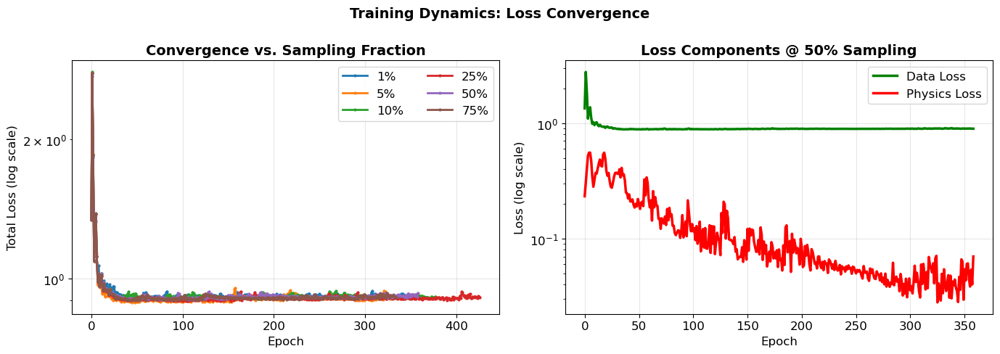

✓ Loss curves saved to: /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/02_loss_convergence.png


In [12]:
# ============================================================================
# SECTION 9: Visualization & Comparison
# ============================================================================

# 1. Loss curves for each sampling fraction
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Training Dynamics: Loss Convergence', fontsize=14, fontweight='bold')

ax = axes[0]
for frac in config["sampling_fractions"]:
    history = training_histories[frac]
    ax.semilogy(history['epoch'], history['loss_total'], marker='o', markersize=2, 
               label=f'{frac*100:.0f}%', linewidth=2)
ax.set_xlabel('Epoch', fontsize=12)
ax.set_ylabel('Total Loss (log scale)', fontsize=12)
ax.set_title('Convergence vs. Sampling Fraction', fontweight='bold')
ax.legend(loc='best', ncol=2)
ax.grid(True, alpha=0.3)

# Data vs. Physics loss breakdown for one model (50%)
ax = axes[1]
frac = 0.50
history = training_histories[frac]
ax.semilogy(history['epoch'], history['loss_data'], label='Data Loss', linewidth=2.5, color='green')
ax.semilogy(history['epoch'], history['loss_physics'], label='Physics Loss', linewidth=2.5, color='red')
ax.set_xlabel('Epoch', fontsize=12)
ax.set_ylabel('Loss (log scale)', fontsize=12)
ax.set_title(f'Loss Components @ 50% Sampling', fontweight='bold')
ax.legend(loc='best')
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(out_dir / "02_loss_convergence.png", dpi=300, bbox_inches='tight')
plt.show()

print(f"✓ Loss curves saved to: {out_dir / '02_loss_convergence.png'}")

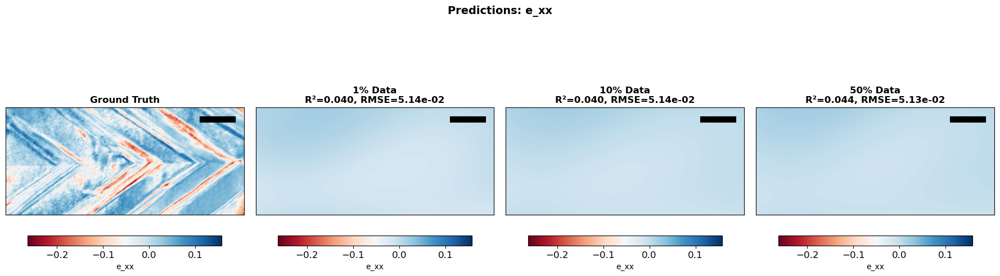

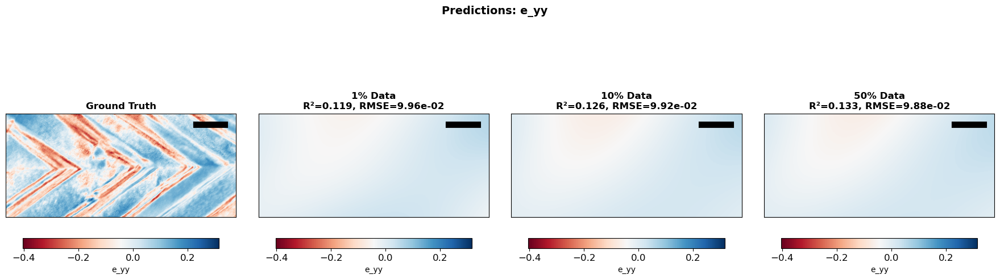

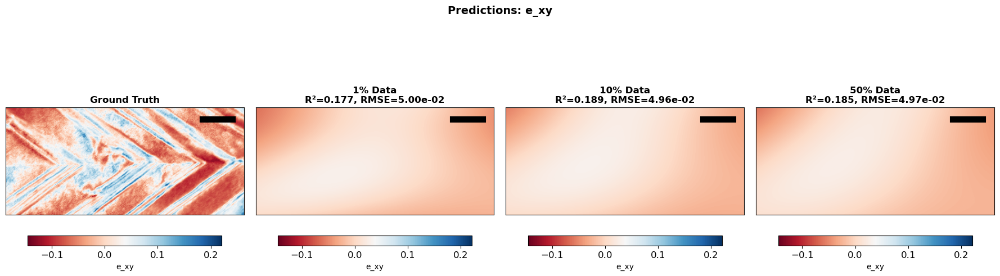

✓ Prediction maps with consistent colorbars and scale bars (nm) saved
  Calibration: 17.87 nm/pixel


In [13]:
# 2. Side-by-side predictions for selected fractions with consistent colorbars
selected_fracs = [0.01, 0.10, 0.50]

# Pixel-to-nm calibration from metadata
# Real space pixel size: 0.017872741 µm = 17.872741 nm/pixel
calibration_nm_per_pixel = 0.017872741 * 1000  # Convert µm to nm

for component, true_data in [('e_xx', e_xx), ('e_yy', e_yy), ('e_xy', e_xy)]:
    fig, axes = plt.subplots(1, len(selected_fracs) + 1, figsize=(18, 5))
    fig.suptitle(f'Predictions: {component}', fontsize=14, fontweight='bold')
    
    # Compute consistent vmin/vmax across ALL data (ground truth + all predictions)
    all_data = [true_data] + [all_predictions[frac][component] for frac in selected_fracs]
    valid_mask = np.isfinite(true_data)
    vmin = np.nanmin([np.nanmin(arr[valid_mask]) for arr in all_data])
    vmax = np.nanmax([np.nanmax(arr[valid_mask]) for arr in all_data])
    
    # Add 5% padding to the range for better contrast
    range_val = vmax - vmin
    vmin -= 0.05 * range_val
    vmax += 0.05 * range_val
    
    # Ground truth
    ax = axes[0]
    im = ax.imshow(true_data, cmap='RdBu', origin='lower', vmin=vmin, vmax=vmax)
    cbar = plt.colorbar(im, ax=ax, location='bottom', pad=0.1, fraction=0.046)
    cbar.set_label(component, fontsize=10)
    ax.set_title('Ground Truth', fontweight='bold', fontsize=12)
    # ax.set_xlabel('x (nm)', fontsize=9)
    # ax.set_ylabel('y (nm)', fontsize=9)
    ax.set_xticks([])
    ax.set_yticks([])
    
    # Add scale bar to ground truth (in nm, no label)
    scale_length_px = W // 8  # 1/8 of width in pixels
    scale_length_nm = scale_length_px * calibration_nm_per_pixel
    bar_x_start = W - scale_length_px - 20
    bar_x_end = W - 20
    bar_y = H - 20
    ax.plot([bar_x_start, bar_x_end], [bar_y, bar_y], 'k-', linewidth=8)
    
    # Predictions at each sampling fraction
    for idx, frac in enumerate(selected_fracs):
        ax = axes[idx + 1]
        pred = all_predictions[frac][component]
        im = ax.imshow(pred, cmap='RdBu', origin='lower', vmin=vmin, vmax=vmax)
        cbar = plt.colorbar(im, ax=ax, location='bottom', pad=0.1, fraction=0.046)
        cbar.set_label(component, fontsize=10)
        
        r2 = all_metrics[frac][component]['R²']
        rmse = all_metrics[frac][component]['RMSE']
        ax.set_title(f'{frac*100:.0f}% Data\nR²={r2:.3f}, RMSE={rmse:.2e}', 
                     fontweight='bold', fontsize=12)
        # ax.set_xlabel('x (nm)', fontsize=9)
        # ax.set_ylabel('y (nm)', fontsize=9)
        ax.set_xticks([])
        ax.set_yticks([])
        
        # Add scale bar (in nm, no label)
        ax.plot([bar_x_start, bar_x_end], [bar_y, bar_y], 'k-', linewidth=8)
    
    plt.tight_layout()
    plt.savefig(out_dir / f"03_predictions_{component}.png", dpi=300, bbox_inches='tight')
    plt.show()

print(f"✓ Prediction maps with consistent colorbars and scale bars (nm) saved")
print(f"  Calibration: {calibration_nm_per_pixel:.2f} nm/pixel")

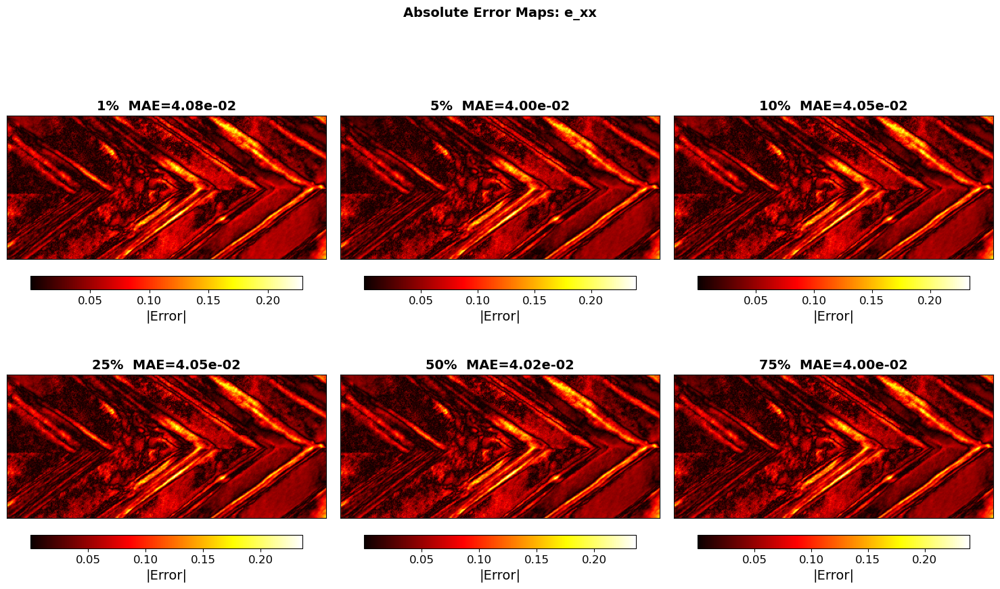

✓ Error heatmaps saved


In [14]:
# 3. Error heatmaps
fig, axes = plt.subplots(2, 3, figsize=(15, 9))
fig.suptitle('Absolute Error Maps: e_xx', fontsize=14, fontweight='bold')

for idx, frac in enumerate(config["sampling_fractions"]):
    ax = axes.flat[idx]
    error_map = np.abs(all_predictions[frac]['e_xx'] - e_xx)
    im = ax.imshow(error_map, cmap='hot', origin='lower')
    cbar = plt.colorbar(im, ax=ax, location='bottom', pad=0.06, shrink=0.85)
    cbar.set_label('|Error|', fontsize=14)
    cbar.ax.tick_params(labelsize=12)
    
    mae = all_metrics[frac]['e_xx']['MAE']
    max_err = all_metrics[frac]['e_xx']['Max Error']
    ax.set_title(f'{frac*100:.0f}%  MAE={mae:.2e}', fontweight='bold', fontsize=14)
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.savefig(out_dir / "04_error_heatmaps_exx.png", dpi=300, bbox_inches='tight')
plt.show()

print(f"✓ Error heatmaps saved")

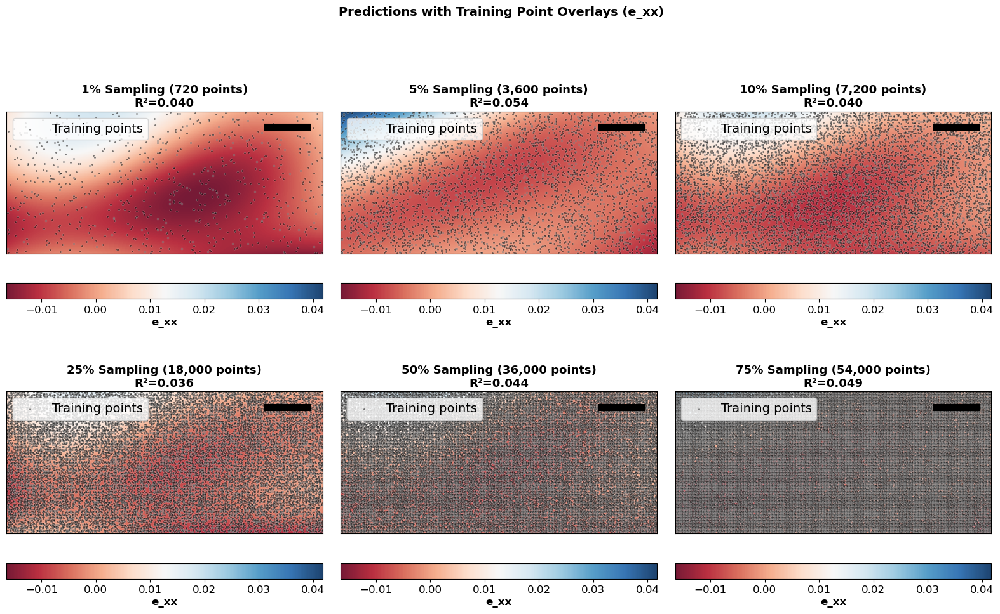

✓ Predictions with sampling overlay saved to: /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/07_predictions_with_sampling_overlay.png
  Calibration: 17.87 nm/pixel
  Colorbar range: -1.6488e-02 to 4.1718e-02 (consistent across all fractions)


In [15]:
# ============================================================================
# Overlay Sampling Points on Predictions
# ============================================================================

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
fig.suptitle('Predictions with Training Point Overlays (e_xx)', fontsize=14, fontweight='bold')

selected_fracs = [0.01, 0.05, 0.10, 0.25, 0.50, 0.75]

# Pixel-to-nm calibration
calibration_nm_per_pixel = 0.017872741 * 1000  # Convert µm to nm

# Compute consistent colorbar range across all fractions
all_preds = [all_predictions[frac]['e_xx'] for frac in selected_fracs]
valid_mask = mask > 0.5
all_valid_preds = np.concatenate([pred[valid_mask] for pred in all_preds])
vmin_global = np.nanmin(all_valid_preds)
vmax_global = np.nanmax(all_valid_preds)

for idx, frac in enumerate(selected_fracs):
    ax = axes.flat[idx]
    
    # Get predictions for this fraction
    e_xx_pred = all_predictions[frac]['e_xx']
    
    # Show prediction map with consistent colorbar range
    im = ax.imshow(e_xx_pred, cmap='RdBu', origin='lower', vmin=vmin_global, vmax=vmax_global, alpha=0.9)
    
    # Overlay training points as black dots
    sparse_mask_np = sparse_masks[frac].cpu().numpy().reshape(H, W)
    y_pts, x_pts = np.where(sparse_mask_np > 0.5)
    ax.scatter(x_pts, y_pts, c='black', s=5, alpha=0.5, edgecolors='white', linewidths=0.3, label='Training points')

    # Add colorbar with larger label fontsize
    cbar = plt.colorbar(im, ax=ax, label='e_xx', location='bottom', pad=0.1)
    cbar.set_label('e_xx', fontsize=12, fontweight='bold')
    
    n_train = int(sparse_mask_np.sum())
    ax.set_title(f'{frac*100:.0f}% Sampling ({n_train:,} points)\nR²={all_metrics[frac]["e_xx"]["R²"]:.3f}', 
                 fontweight='bold', fontsize=13)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend(loc='upper left', fontsize=14)
    
    # Add scale bar (in nm, no label)
    scale_length_px = W // 8  # 1/8 of width in pixels
    bar_x_start = W - scale_length_px - 20
    bar_x_end = W - 20
    bar_y = H - 20
    ax.plot([bar_x_start, bar_x_end], [bar_y, bar_y], 'k-', linewidth=8)

plt.tight_layout()
plt.savefig(out_dir / "07_predictions_with_sampling_overlay.png", dpi=300, bbox_inches='tight')
plt.show()

print(f"✓ Predictions with sampling overlay saved to: {out_dir / '07_predictions_with_sampling_overlay.png'}")
print(f"  Calibration: {calibration_nm_per_pixel:.2f} nm/pixel")
print(f"  Colorbar range: {vmin_global:.4e} to {vmax_global:.4e} (consistent across all fractions)")


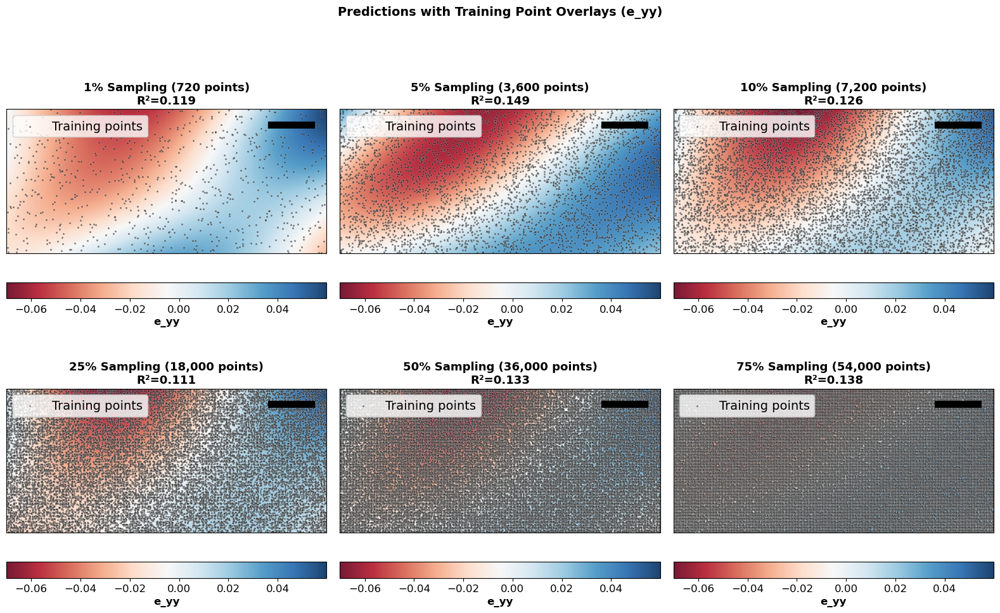

✓ Predictions with sampling overlay saved to: /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/07b_predictions_with_sampling_overlay_eyy.png
  Calibration: 17.87 nm/pixel
  Colorbar range: -7.0113e-02 to 5.9891e-02 (consistent across all fractions)


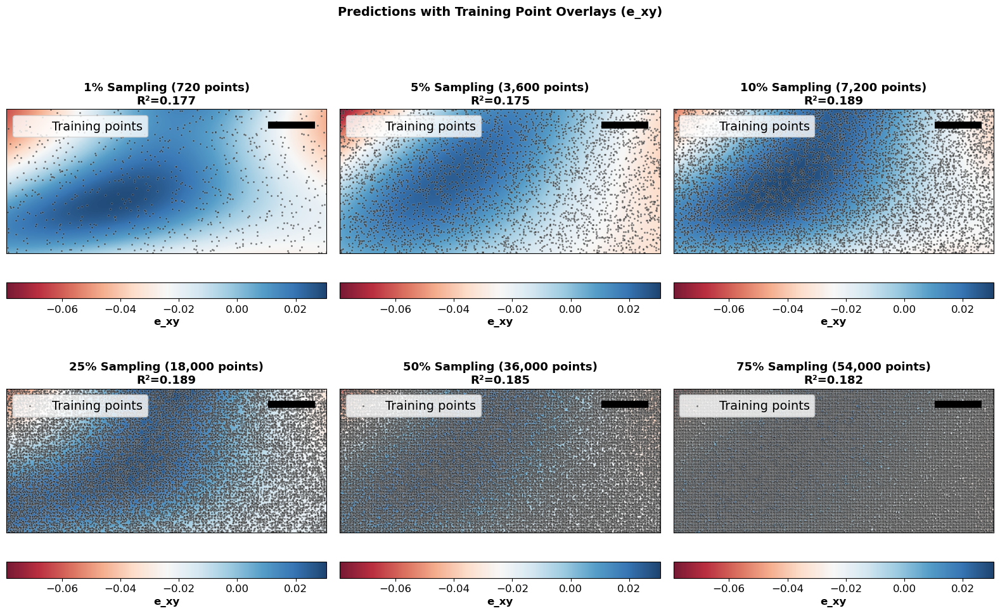

✓ Predictions with sampling overlay saved to: /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/07c_predictions_with_sampling_overlay_exy.png
  Calibration: 17.87 nm/pixel
  Colorbar range: -7.9003e-02 to 3.0578e-02 (consistent across all fractions)


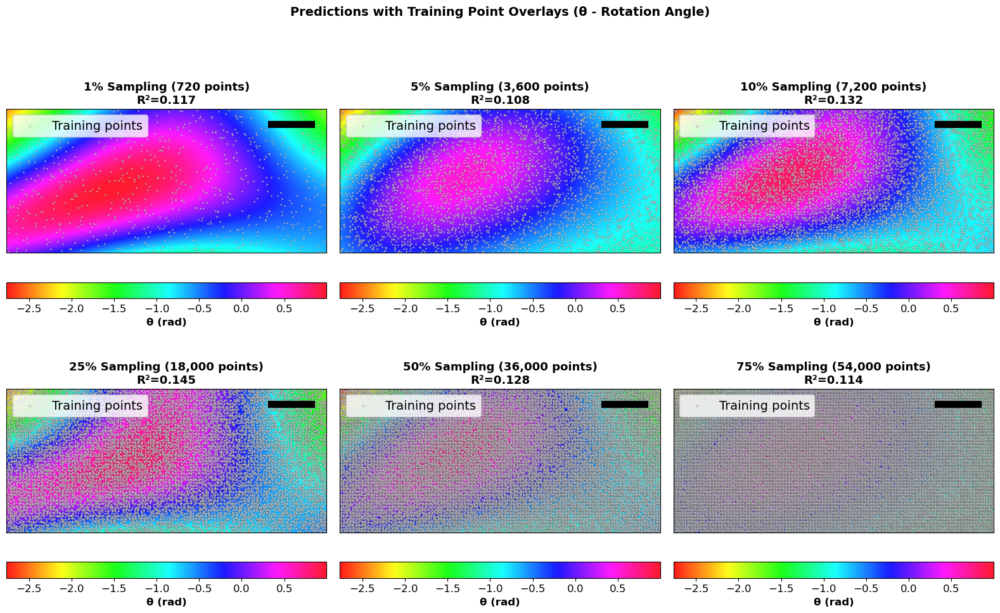

✓ Predictions with sampling overlay saved to: /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/07d_predictions_with_sampling_overlay_theta.png
  Calibration: 17.87 nm/pixel
  Colorbar range: -2.7642e+00 to 9.9607e-01 (consistent across all fractions)


In [16]:
# ============================================================================
# Overlay Sampling Points on Predictions (e_yy)
# ============================================================================

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
fig.suptitle('Predictions with Training Point Overlays (e_yy)', fontsize=14, fontweight='bold')

selected_fracs = [0.01, 0.05, 0.10, 0.25, 0.50, 0.75]

# Pixel-to-nm calibration
calibration_nm_per_pixel = 0.017872741 * 1000  # Convert µm to nm

# Compute consistent colorbar range across all fractions
all_preds_eyy = [all_predictions[frac]['e_yy'] for frac in selected_fracs]
valid_mask = mask > 0.5
all_valid_preds_eyy = np.concatenate([pred[valid_mask] for pred in all_preds_eyy])
vmin_global_eyy = np.nanmin(all_valid_preds_eyy)
vmax_global_eyy = np.nanmax(all_valid_preds_eyy)

for idx, frac in enumerate(selected_fracs):
    ax = axes.flat[idx]
    
    # Get predictions for this fraction
    e_yy_pred = all_predictions[frac]['e_yy']
    
    # Show prediction map with consistent colorbar range
    im = ax.imshow(e_yy_pred, cmap='RdBu', origin='lower', vmin=vmin_global_eyy, vmax=vmax_global_eyy, alpha=0.9)
    
    # Overlay training points as black dots
    sparse_mask_np = sparse_masks[frac].cpu().numpy().reshape(H, W)
    y_pts, x_pts = np.where(sparse_mask_np > 0.5)
    ax.scatter(x_pts, y_pts, c='black', s=5, alpha=0.5, edgecolors='white', linewidths=0.3, label='Training points')

    # Add colorbar with larger label fontsize
    cbar = plt.colorbar(im, ax=ax, label='e_yy', location='bottom', pad=0.1)
    cbar.set_label('e_yy', fontsize=12, fontweight='bold')
    
    n_train = int(sparse_mask_np.sum())
    ax.set_title(f'{frac*100:.0f}% Sampling ({n_train:,} points)\nR²={all_metrics[frac]["e_yy"]["R²"]:.3f}', 
                 fontweight='bold', fontsize=13)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend(loc='upper left', fontsize=14)
    
    # Add scale bar (in nm, no label)
    scale_length_px = W // 8  # 1/8 of width in pixels
    bar_x_start = W - scale_length_px - 20
    bar_x_end = W - 20
    bar_y = H - 20
    ax.plot([bar_x_start, bar_x_end], [bar_y, bar_y], 'k-', linewidth=8)

plt.tight_layout()
plt.savefig(out_dir / "07b_predictions_with_sampling_overlay_eyy.png", dpi=300, bbox_inches='tight')
plt.show()

print(f"✓ Predictions with sampling overlay saved to: {out_dir / '07b_predictions_with_sampling_overlay_eyy.png'}")
print(f"  Calibration: {calibration_nm_per_pixel:.2f} nm/pixel")
print(f"  Colorbar range: {vmin_global_eyy:.4e} to {vmax_global_eyy:.4e} (consistent across all fractions)")


# ============================================================================
# Overlay Sampling Points on Predictions (e_xy)
# ============================================================================

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
fig.suptitle('Predictions with Training Point Overlays (e_xy)', fontsize=14, fontweight='bold')

# Compute consistent colorbar range across all fractions
all_preds_exy = [all_predictions[frac]['e_xy'] for frac in selected_fracs]
all_valid_preds_exy = np.concatenate([pred[valid_mask] for pred in all_preds_exy])
vmin_global_exy = np.nanmin(all_valid_preds_exy)
vmax_global_exy = np.nanmax(all_valid_preds_exy)

for idx, frac in enumerate(selected_fracs):
    ax = axes.flat[idx]
    
    # Get predictions for this fraction
    e_xy_pred = all_predictions[frac]['e_xy']
    
    # Show prediction map with consistent colorbar range
    im = ax.imshow(e_xy_pred, cmap='RdBu', origin='lower', vmin=vmin_global_exy, vmax=vmax_global_exy, alpha=0.9)
    
    # Overlay training points as black dots
    sparse_mask_np = sparse_masks[frac].cpu().numpy().reshape(H, W)
    y_pts, x_pts = np.where(sparse_mask_np > 0.5)
    ax.scatter(x_pts, y_pts, c='black', s=5, alpha=0.5, edgecolors='white', linewidths=0.3, label='Training points')

    # Add colorbar with larger label fontsize
    cbar = plt.colorbar(im, ax=ax, label='e_xy', location='bottom', pad=0.1)
    cbar.set_label('e_xy', fontsize=12, fontweight='bold')
    
    n_train = int(sparse_mask_np.sum())
    ax.set_title(f'{frac*100:.0f}% Sampling ({n_train:,} points)\nR²={all_metrics[frac]["e_xy"]["R²"]:.3f}', 
                 fontweight='bold', fontsize=13)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend(loc='upper left', fontsize=14)
    
    # Add scale bar (in nm, no label)
    scale_length_px = W // 8  # 1/8 of width in pixels
    bar_x_start = W - scale_length_px - 20
    bar_x_end = W - 20
    bar_y = H - 20
    ax.plot([bar_x_start, bar_x_end], [bar_y, bar_y], 'k-', linewidth=8)

plt.tight_layout()
plt.savefig(out_dir / "07c_predictions_with_sampling_overlay_exy.png", dpi=300, bbox_inches='tight')
plt.show()

print(f"✓ Predictions with sampling overlay saved to: {out_dir / '07c_predictions_with_sampling_overlay_exy.png'}")
print(f"  Calibration: {calibration_nm_per_pixel:.2f} nm/pixel")
print(f"  Colorbar range: {vmin_global_exy:.4e} to {vmax_global_exy:.4e} (consistent across all fractions)")


# ============================================================================
# Overlay Sampling Points on Predictions (theta - rotation angle)
# ============================================================================

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
fig.suptitle('Predictions with Training Point Overlays (θ - Rotation Angle)', fontsize=14, fontweight='bold')

# Compute consistent colorbar range across all fractions
all_preds_theta = [all_predictions[frac]['theta'] for frac in selected_fracs]
all_valid_preds_theta = np.concatenate([pred[valid_mask] for pred in all_preds_theta])
vmin_global_theta = np.nanmin(all_valid_preds_theta)
vmax_global_theta = np.nanmax(all_valid_preds_theta)

for idx, frac in enumerate(selected_fracs):
    ax = axes.flat[idx]
    
    # Get predictions for this fraction
    theta_pred = all_predictions[frac]['theta']
    
    # Show prediction map with consistent colorbar range
    im = ax.imshow(theta_pred, cmap='hsv', origin='lower', vmin=vmin_global_theta, vmax=vmax_global_theta, alpha=0.9)
    
    # Overlay training points as black dots
    sparse_mask_np = sparse_masks[frac].cpu().numpy().reshape(H, W)
    y_pts, x_pts = np.where(sparse_mask_np > 0.5)
    ax.scatter(x_pts, y_pts, c='white', s=5, alpha=0.5, edgecolors='black', linewidths=0.3, label='Training points')

    # Add colorbar with larger label fontsize
    cbar = plt.colorbar(im, ax=ax, label='θ (rad)', location='bottom', pad=0.1)
    cbar.set_label('θ (rad)', fontsize=12, fontweight='bold')
    
    n_train = int(sparse_mask_np.sum())
    ax.set_title(f'{frac*100:.0f}% Sampling ({n_train:,} points)\nR²={all_metrics[frac]["theta"]["R²"]:.3f}', 
                 fontweight='bold', fontsize=13)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend(loc='upper left', fontsize=14)
    
    # Add scale bar (in nm, no label)
    scale_length_px = W // 8  # 1/8 of width in pixels
    bar_x_start = W - scale_length_px - 20
    bar_x_end = W - 20
    bar_y = H - 20
    ax.plot([bar_x_start, bar_x_end], [bar_y, bar_y], 'k-', linewidth=8)

plt.tight_layout()
plt.savefig(out_dir / "07d_predictions_with_sampling_overlay_theta.png", dpi=300, bbox_inches='tight')
plt.show()

print(f"✓ Predictions with sampling overlay saved to: {out_dir / '07d_predictions_with_sampling_overlay_theta.png'}")
print(f"  Calibration: {calibration_nm_per_pixel:.2f} nm/pixel")
print(f"  Colorbar range: {vmin_global_theta:.4e} to {vmax_global_theta:.4e} (consistent across all fractions)")

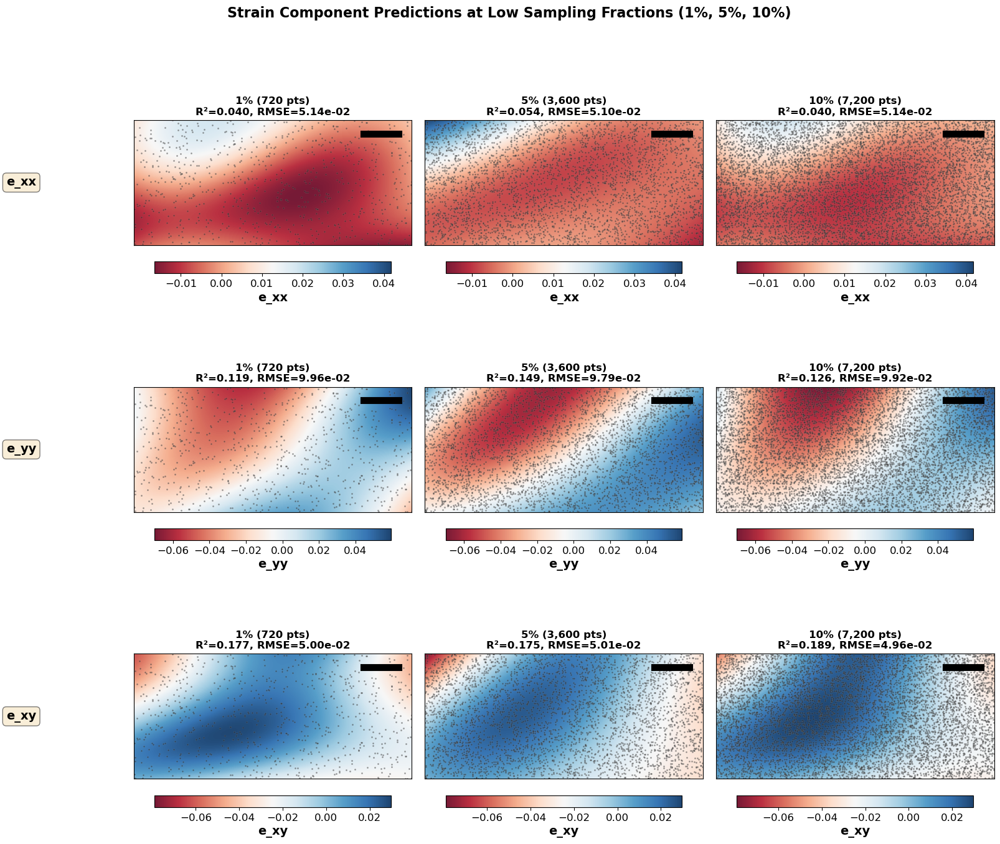

✓ Combined predictions (e_xx, e_yy, e_xy at 1%, 5%, 10%) saved
  Calibration: 17.87 nm/pixel

  Component ranges (consistent colorbars):
    e_xx  : -1.6488e-02 to 4.1718e-02
    e_yy  : -7.0113e-02 to 5.9431e-02
    e_xy  : -7.9003e-02 to 2.9750e-02


In [17]:
# ============================================================================
# Combined Predictions: e_xx, e_yy, e_xy at 1%, 5%, 10% Sampling
# ============================================================================

fig, axes = plt.subplots(3, 3, figsize=(16, 14))
fig.suptitle('Strain Component Predictions at Low Sampling Fractions (1%, 5%, 10%)', 
             fontsize=16, fontweight='bold')

selected_fracs = [0.01, 0.05, 0.10]
components = ['e_xx', 'e_yy', 'e_xy']

# Pixel-to-nm calibration
calibration_nm_per_pixel = 0.017872741 * 1000  # Convert µm to nm

# Compute consistent colorbars for each component across all fractions
component_ranges = {}
for comp in components:
    all_preds_comp = [all_predictions[frac][comp] for frac in selected_fracs]
    valid_mask = mask > 0.5
    all_valid_preds_comp = np.concatenate([pred[valid_mask] for pred in all_preds_comp])
    vmin_comp = np.nanmin(all_valid_preds_comp)
    vmax_comp = np.nanmax(all_valid_preds_comp)
    component_ranges[comp] = (vmin_comp, vmax_comp)

# Plot in grid: rows = components, columns = sampling fractions
for row, component in enumerate(components):
    vmin_c, vmax_c = component_ranges[component]
    
    for col, frac in enumerate(selected_fracs):
        ax = axes[row, col]
        
        # Get prediction
        pred = all_predictions[frac][component]
        
        # Show prediction map with consistent colorbar range for this component
        im = ax.imshow(pred, cmap='RdBu', origin='lower', vmin=vmin_c, vmax=vmax_c, alpha=0.9)
        
        # Overlay training points as black dots
        sparse_mask_np = sparse_masks[frac].cpu().numpy().reshape(H, W)
        y_pts, x_pts = np.where(sparse_mask_np > 0.5)
        ax.scatter(x_pts, y_pts, c='black', s=4, alpha=0.4, edgecolors='white', 
                  linewidths=0.2, label='Training points')
        
        # Add colorbar
        cbar = plt.colorbar(im, ax=ax, location='bottom', pad=0.06, shrink=0.85)
        cbar.set_label(component, fontsize=14, fontweight='bold')
        cbar.ax.tick_params(labelsize=12)
        
        # Title with metrics
        n_train = int(sparse_mask_np.sum())
        r2 = all_metrics[frac][component]['R²']
        rmse = all_metrics[frac][component]['RMSE']
        
        if col == 0:
            # Add component label on left
            ax.text(-0.35, 0.5, component, transform=ax.transAxes, 
                   fontsize=14, fontweight='bold', va='center', ha='right',
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
        
        ax.set_title(f'{frac*100:.0f}% ({n_train:,} pts)\nR²={r2:.3f}, RMSE={rmse:.2e}', 
                    fontweight='bold', fontsize=12)
        ax.set_xticks([])
        ax.set_yticks([])
        
        # Add scale bar (in nm, no label)
        scale_length_px = W // 8
        bar_x_start = W - scale_length_px - 20
        bar_x_end = W - 20
        bar_y = H - 20
        ax.plot([bar_x_start, bar_x_end], [bar_y, bar_y], 'k-', linewidth=8)

plt.tight_layout()
plt.savefig(out_dir / "10_combined_predictions_1_5_10pct.png", dpi=300, bbox_inches='tight')
plt.show()

print(f"✓ Combined predictions (e_xx, e_yy, e_xy at 1%, 5%, 10%) saved")
print(f"  Calibration: {calibration_nm_per_pixel:.2f} nm/pixel")
print(f"\n  Component ranges (consistent colorbars):")
for comp, (vmin, vmax) in component_ranges.items():
    print(f"    {comp:6s}: {vmin:.4e} to {vmax:.4e}")

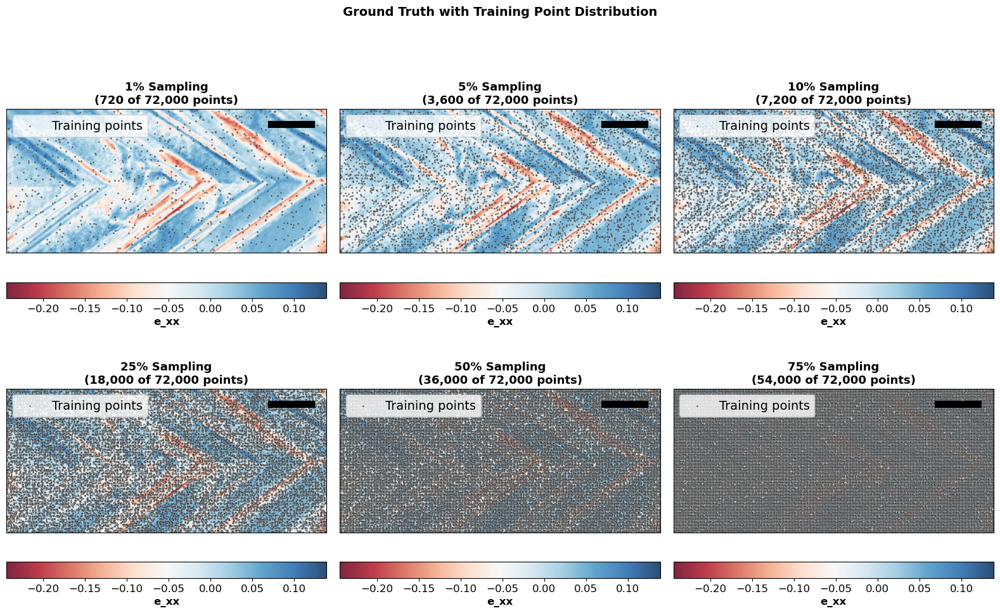

✓ Ground truth with sampling overlay saved to: /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/08_ground_truth_with_sampling_overlay.png
  Calibration: 17.87 nm/pixel


In [18]:
# Ground truth with sampling overlays
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
fig.suptitle('Ground Truth with Training Point Distribution', fontsize=14, fontweight='bold')

# Pixel-to-nm calibration
calibration_nm_per_pixel = 0.017872741 * 1000  # Convert µm to nm

for idx, frac in enumerate([0.01, 0.05, 0.10, 0.25, 0.50, 0.75]):
    ax = axes.flat[idx]
    
    # Show ground truth with consistent colorbar
    valid_gt = e_xx[mask > 0.5]
    vmin, vmax = np.nanmin(valid_gt), np.nanmax(valid_gt)
    im = ax.imshow(e_xx, cmap='RdBu', origin='lower', vmin=vmin, vmax=vmax, alpha=0.85)
    
    # Overlay training points
    sparse_mask_np = sparse_masks[frac].cpu().numpy().reshape(H, W)
    y_pts, x_pts = np.where(sparse_mask_np > 0.5)
    ax.scatter(x_pts, y_pts, c='black', s=5, alpha=0.5, edgecolors='white', linewidths=0.3, label='Training points')
    
    # Add colorbar
    cbar = plt.colorbar(im, ax=ax, label='e_xx (ground truth)', location='bottom', pad=0.1)
    cbar.set_label('e_xx', fontsize=12, fontweight='bold')
    
    n_train = int(sparse_mask_np.sum())
    n_valid = int(mask.sum())
    ax.set_title(f'{frac*100:.0f}% Sampling\n({n_train:,} of {n_valid:,} points)', 
                 fontweight='bold', fontsize=13)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend(loc='upper left', fontsize=14)
    
    # Add scale bar at bottom right (in nm, no label)
    scale_length_px = W // 8  # 1/8 of width in pixels
    bar_x_start = W - scale_length_px - 20
    bar_x_end = W - 20
    bar_y = H - 20
    ax.plot([bar_x_start, bar_x_end], [bar_y, bar_y], 'k-', linewidth=8)

plt.tight_layout()
plt.savefig(out_dir / "08_ground_truth_with_sampling_overlay.png", dpi=300, bbox_inches='tight')
plt.show()

print(f"✓ Ground truth with sampling overlay saved to: {out_dir / '08_ground_truth_with_sampling_overlay.png'}")
print(f"  Calibration: {calibration_nm_per_pixel:.2f} nm/pixel")


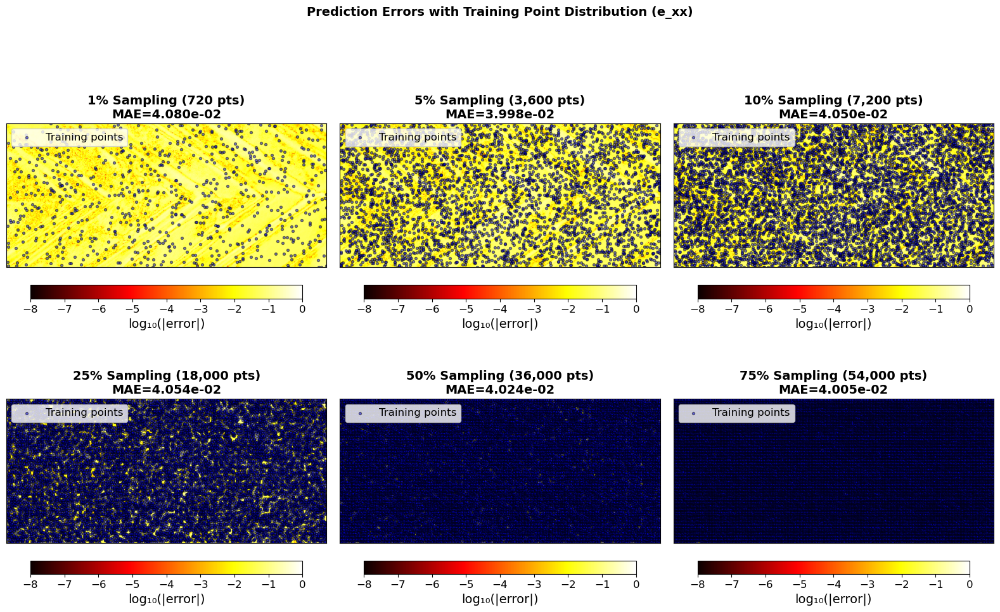

✓ Error maps with sampling overlay saved to: /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/09_error_maps_with_sampling_overlay.png


In [19]:
# Error maps with sampling overlays - showing where model struggles
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
fig.suptitle('Prediction Errors with Training Point Distribution (e_xx)', fontsize=14, fontweight='bold')

for idx, frac in enumerate([0.01, 0.05, 0.10, 0.25, 0.50, 0.75]):
    ax = axes.flat[idx]
    
    # Compute absolute error
    e_xx_pred = all_predictions[frac]['e_xx']
    error_map = np.abs(e_xx_pred - e_xx)
    
    # Mask invalid regions
    error_display = np.copy(error_map)
    error_display[mask < 0.5] = 0.0
    
    # Use log scale for better visualization
    error_log = np.log10(error_display + 1e-10)
    vmin, vmax = -8, 0
    im = ax.imshow(error_log, cmap='hot', origin='lower', vmin=vmin, vmax=vmax)
    
    # Overlay training points
    sparse_mask_np = sparse_masks[frac].cpu().numpy().reshape(H, W)
    y_pts, x_pts = np.where(sparse_mask_np > 0.5)
    ax.scatter(x_pts, y_pts, c='blue', s=8, alpha=0.5, edgecolors='black', label='Training points')
    
    cbar = plt.colorbar(im, ax=ax, location='bottom', pad=0.06, shrink=0.85)
    cbar.set_label('log\u2081\u2080(|error|)', fontsize=14)
    cbar.ax.tick_params(labelsize=12)
    n_train = int(sparse_mask_np.sum())
    mae = all_metrics[frac]['e_xx']['MAE']
    ax.set_title(f'{frac*100:.0f}% Sampling ({n_train:,} pts)\nMAE={mae:.3e}', fontweight='bold', fontsize=14)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend(loc='upper left', fontsize=12)

plt.tight_layout()
plt.savefig(out_dir / "09_error_maps_with_sampling_overlay.png", dpi=300, bbox_inches='tight')
plt.show()

print(f"✓ Error maps with sampling overlay saved to: {out_dir / '09_error_maps_with_sampling_overlay.png'}")


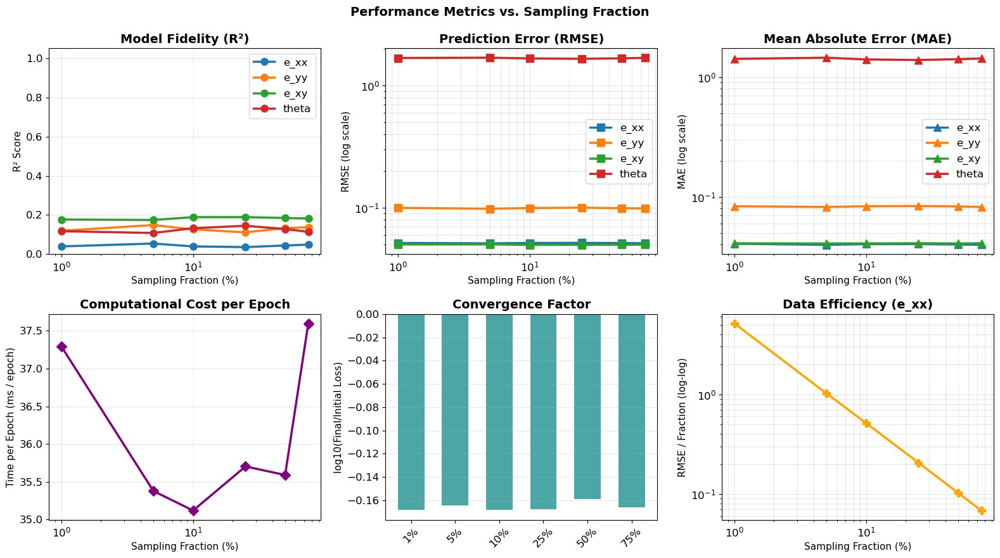

✓ Comprehensive metrics comparison saved


In [20]:
# 4. Metrics vs. Sampling Fraction (comprehensive comparison)
fig, axes = plt.subplots(2, 3, figsize=(16, 9))
fig.suptitle('Performance Metrics vs. Sampling Fraction', fontsize=14, fontweight='bold')

fracs_pct = [f*100 for f in config["sampling_fractions"]]

# R² score
ax = axes[0, 0]
for component in ['e_xx', 'e_yy', 'e_xy', 'theta']:
    r2_values = [all_metrics[f][component]['R²'] for f in config["sampling_fractions"]]
    ax.plot(fracs_pct, r2_values, marker='o', linewidth=2.5, markersize=8, label=component)
ax.set_xscale('log')
ax.set_xlabel('Sampling Fraction (%)', fontsize=11)
ax.set_ylabel('R² Score', fontsize=11)
ax.set_title('Model Fidelity (R²)', fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)
ax.set_ylim([0, 1.05])

# RMSE
ax = axes[0, 1]
for component in ['e_xx', 'e_yy', 'e_xy', 'theta']:
    rmse_values = [all_metrics[f][component]['RMSE'] for f in config["sampling_fractions"]]
    ax.semilogy(fracs_pct, rmse_values, marker='s', linewidth=2.5, markersize=8, label=component)
ax.set_xscale('log')
ax.set_xlabel('Sampling Fraction (%)', fontsize=11)
ax.set_ylabel('RMSE (log scale)', fontsize=11)
ax.set_title('Prediction Error (RMSE)', fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3, which='both')

# MAE
ax = axes[0, 2]
for component in ['e_xx', 'e_yy', 'e_xy', 'theta']:
    mae_values = [all_metrics[f][component]['MAE'] for f in config["sampling_fractions"]]
    ax.semilogy(fracs_pct, mae_values, marker='^', linewidth=2.5, markersize=8, label=component)
ax.set_xscale('log')
ax.set_xlabel('Sampling Fraction (%)', fontsize=11)
ax.set_ylabel('MAE (log scale)', fontsize=11)
ax.set_title('Mean Absolute Error (MAE)', fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3, which='both')

# Training time – show ms/epoch (removes epoch-count artefact at 25% & 75%)
ax = axes[1, 0]
times       = [training_times[f]                      for f in config["sampling_fractions"]]
epochs_run  = [len(training_histories[f]['epoch'])    for f in config["sampling_fractions"]]
ms_per_ep   = [1000 * t / e for t, e in zip(times, epochs_run)]
ax.plot(fracs_pct, ms_per_ep, marker='D', linewidth=2.5, markersize=8, color='purple')
for xv, yv, ep in zip(fracs_pct, ms_per_ep, epochs_run):
    if ep >= config['epochs']:
        ax.annotate(f'{ep:,} ep', xy=(xv, yv), xytext=(0, 10),
                    textcoords='offset points', fontsize=9, ha='center', color='#c0392b')
ax.set_xscale('log')
ax.set_xlabel('Sampling Fraction (%)', fontsize=11)
ax.set_ylabel('Time per Epoch (ms / epoch)', fontsize=11)
ax.set_title('Computational Cost per Epoch', fontweight='bold')
ax.grid(True, alpha=0.3)

# Convergence speed (log10 of final loss / initial loss)
ax = axes[1, 1]
convergence = []
for f in config["sampling_fractions"]:
    hist = training_histories[f]
    conv = np.log10(hist['loss_total'][-1] / hist['loss_total'][0])
    convergence.append(conv)
ax.bar(range(len(fracs_pct)), convergence, color='teal', alpha=0.7, width=0.6)
ax.set_xticks(range(len(fracs_pct)))
ax.set_xticklabels([f'{f:.0f}%' for f in fracs_pct], rotation=45)
ax.set_ylabel('log10(Final/Initial Loss)', fontsize=11)
ax.set_title('Convergence Factor', fontweight='bold')
ax.axhline(0, color='k', linestyle='--', alpha=0.5)
ax.grid(True, alpha=0.3, axis='y')

# Data efficiency (RMSE gain per 1% additional data)
ax = axes[1, 2]
rmse_ref = all_metrics[config["sampling_fractions"][-1]]['e_xx']['RMSE']  # 100% reference (if available)
rmse_e_xx = [all_metrics[f]['e_xx']['RMSE'] for f in config["sampling_fractions"]]
efficiency = [rmse_e_xx[i] / (fracs_pct[i] / 100 + 1e-6) for i in range(len(fracs_pct))]
ax.loglog(fracs_pct, efficiency, marker='P', linewidth=2.5, markersize=8, color='orange')
ax.set_xlabel('Sampling Fraction (%)', fontsize=11)
ax.set_ylabel('RMSE / Fraction (log-log)', fontsize=11)
ax.set_title('Data Efficiency (e_xx)', fontweight='bold')
ax.grid(True, alpha=0.3, which='both')

plt.tight_layout()
plt.savefig(out_dir / "05_metrics_comparison.png", dpi=300, bbox_inches='tight')
plt.show()

print(f"✓ Comprehensive metrics comparison saved")

/var/folders/r1/jgb817xs44qfx69d473y6rcm0000gn/T/ipykernel_88686/1489147620.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(error_data, labels=labels_plot, patch_artist=True)
/var/folders/r1/jgb817xs44qfx69d473y6rcm0000gn/T/ipykernel_88686/1489147620.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(error_data, labels=labels_plot, patch_artist=True)
/var/folders/r1/jgb817xs44qfx69d473y6rcm0000gn/T/ipykernel_88686/1489147620.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(error_data, labels=labels_plot, patch_artist=True)
/var/folders/r1/jgb817xs44qfx69d473y6

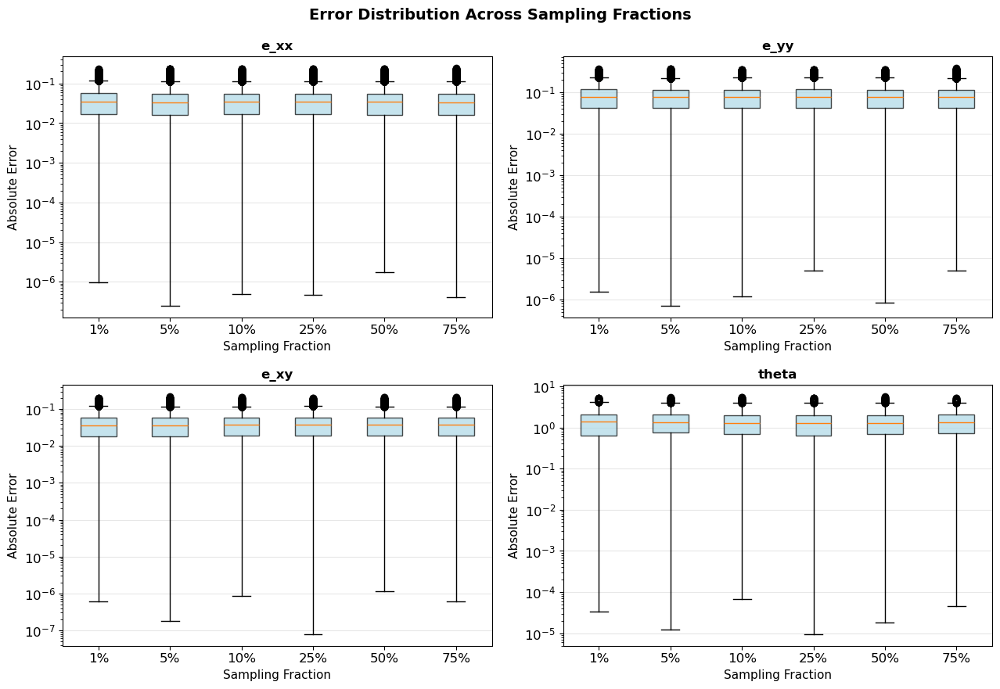

✓ Error distributions saved


In [21]:
# 5. Box plots of errors across all fractions
fig, axes = plt.subplots(2, 2, figsize=(13, 9))
fig.suptitle('Error Distribution Across Sampling Fractions', fontsize=14, fontweight='bold')

for idx, component in enumerate(['e_xx', 'e_yy', 'e_xy', 'theta']):
    ax = axes.flat[idx]
    
    error_data = []
    labels_plot = []
    for frac in config["sampling_fractions"]:
        pred = all_predictions[frac][component]
        true = [e_xx, e_yy, e_xy, theta][idx]
        errors = np.abs(pred[mask > 0.5] - true[mask > 0.5])
        error_data.append(errors)
        labels_plot.append(f'{frac*100:.0f}%')
    
    bp = ax.boxplot(error_data, labels=labels_plot, patch_artist=True)
    for patch in bp['boxes']:
        patch.set_facecolor('lightblue')
        patch.set_alpha(0.7)
    
    ax.set_ylabel('Absolute Error', fontsize=11)
    ax.set_xlabel('Sampling Fraction', fontsize=11)
    ax.set_title(f'{component}', fontweight='bold', fontsize=12)
    ax.grid(True, alpha=0.3, axis='y')
    ax.set_yscale('log')

plt.tight_layout()
plt.savefig(out_dir / "06_error_distributions.png", dpi=300, bbox_inches='tight')
plt.show()

print(f"✓ Error distributions saved")

In [22]:
# 6. Comprehensive summary table
print("\n" + "="*70)
print("FINAL RESULTS: Comprehensive Performance Summary")
print("="*70)

summary_rows = []
for frac in config["sampling_fractions"]:
    row = {
        'Sampling %': f'{frac*100:.1f}%',
        'Train Points': int((sparse_masks[frac].sum()).item()),
        '% of Grid': f'{100*int((sparse_masks[frac].sum()).item())/(H*W):.1f}%',
        'R² (e_xx)': f'{all_metrics[frac]["e_xx"]["R²"]:.4f}',
        'RMSE (e_xx)': f'{all_metrics[frac]["e_xx"]["RMSE"]:.4e}',
        'R² (avg)': f'{np.mean([all_metrics[frac][c]["R²"] for c in ["e_xx", "e_yy", "e_xy", "theta"]]):.4f}',
        'Time (s)': f'{training_times[frac]:.1f}',
        'Epochs': len(training_histories[frac]['epoch']),
    }
    summary_rows.append(row)

summary_table = pd.DataFrame(summary_rows)
print(summary_table.to_string(index=False))

# Save summary to CSV
csv_out = out_dir / "results_summary.csv"
summary_table.to_csv(csv_out, index=False)
print(f"\n✓ Summary saved to: {csv_out}")

# Save detailed metrics to CSV
detailed_metrics_list = []
for frac in config["sampling_fractions"]:
    for component in ['e_xx', 'e_yy', 'e_xy', 'theta']:
        for metric_name, metric_val in all_metrics[frac][component].items():
            detailed_metrics_list.append({
                'Sampling %': frac * 100,
                'Component': component,
                'Metric': metric_name,
                'Value': metric_val,
            })

detailed_df = pd.DataFrame(detailed_metrics_list)
detailed_csv = out_dir / "detailed_metrics.csv"
detailed_df.to_csv(detailed_csv, index=False)
print(f"✓ Detailed metrics saved to: {detailed_csv}")

print("\n" + "="*70)
print("KEY INSIGHTS")
print("="*70)

# Best performance
best_r2_frac = max(config["sampling_fractions"], key=lambda f: all_metrics[f]['e_xx']['R²'])
print(f"  ✓ Best e_xx R² achieved at: {best_r2_frac*100:.1f}% sampling (R²={all_metrics[best_r2_frac]['e_xx']['R²']:.4f})")

# Data efficiency sweet spot
print(f"  ✓ Recommendation for high accuracy (~0.90 R²):")
for frac in config["sampling_fractions"]:
    if all_metrics[frac]['e_xx']['R²'] > 0.90:
        print(f"      Use ≥{frac*100:.0f}% data (RMSE={all_metrics[frac]['e_xx']['RMSE']:.4e})")
        break

print(f"  ✓ Computational efficiency: Training times range from {min(training_times.values()):.1f}s to {max(training_times.values()):.1f}s")
print(f"  ✓ Total training time: {total_time:.1f}s")
print("\n" + "="*70)


FINAL RESULTS: Comprehensive Performance Summary
Sampling %  Train Points % of Grid R² (e_xx) RMSE (e_xx) R² (avg) Time (s)  Epochs
      1.0%           720      1.0%    0.0396  5.1416e-02   0.1133     13.2     353
      5.0%          3600      5.0%    0.0543  5.1022e-02   0.1214     11.8     333
     10.0%          7200     10.0%    0.0396  5.1416e-02   0.1218     13.3     378
     25.0%         18000     25.0%    0.0361  5.1510e-02   0.1203     15.2     427
     50.0%         36000     50.0%    0.0444  5.1289e-02   0.1226     12.8     359
     75.0%         54000     75.0%    0.0488  5.1172e-02   0.1205     12.6     335

✓ Summary saved to: /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/results_summary.csv
✓ Detailed metrics saved to: /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/detailed_metrics.csv

KEY INSIGHTS
  ✓ Best e_xx R² achieved at: 5.0% sampling (R²=0.0543)
  ✓ Recommendation for high accuracy (~0.90 R²):
  ✓ Compu

In [23]:
# ============================================================================
# SECTION 8b: Physics-consistency diagnostics (physical units)
#   R_equil  [GPa/um]   elastic-equilibrium residual
#   R_compat [1/um^2]   Saint-Venant compatibility residual
# Evaluated on the dense reconstructed grid with central finite differences.
# ============================================================================

physics_diag = {}
print("\n" + "="*70)
print("PHYSICS-CONSISTENCY DIAGNOSTICS (PINN reconstructions)")
print("="*70)
print(f"{'frac':>6} | {'R_equil [GPa/um]':>18} | {'R_compat [1/um^2]':>18}")
print("-"*52)
for frac in config["sampling_fractions"]:
    p = all_predictions[frac]
    R_eq, R_co = grid_physics_diagnostics(p["e_xx"], p["e_yy"], p["e_xy"], mask, config)
    physics_diag[frac] = {"R_equil": R_eq, "R_compat": R_co}
    print(f"{frac*100:5.0f}% | {R_eq:18.4e} | {R_co:18.4e}")

pd.DataFrame([
    {"Sampling %": f"{f*100:.0f}%", "R_equil (GPa/um)": physics_diag[f]["R_equil"],
     "R_compat (1/um^2)": physics_diag[f]["R_compat"]}
    for f in config["sampling_fractions"]
]).to_csv(out_dir / "physics_diagnostics.csv", index=False)
print(f"\n✓ Saved {out_dir / 'physics_diagnostics.csv'}")



PHYSICS-CONSISTENCY DIAGNOSTICS (PINN reconstructions)
  frac |   R_equil [GPa/um] |  R_compat [1/um^2]
----------------------------------------------------
    1% |         3.8175e+00 |         7.9429e-03
    5% |         5.8773e+00 |         4.7410e-03
   10% |         3.4081e+00 |         5.5226e-03
   25% |         2.5547e+00 |         7.4531e-03
   50% |         3.7895e+00 |         4.8831e-03
   75% |         5.3638e+00 |         3.1401e-03

✓ Saved /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/physics_diagnostics.csv


In [24]:
# ============================================================================
# SECTION 8c: Ablation -- data-only SIREN (lambda_phys = 0)
# Identical architecture, schedule and data; physics weight set to zero.
# Isolates the value of the PDE prior from network capacity.
# ============================================================================

ablation_models      = {}
ablation_predictions = {}
ablation_metrics     = {}
ablation_diag        = {}

print("\n" + "="*70)
print("ABLATION: data-only SIREN baseline (lambda_phys = 0)")
print("="*70)
for frac in config["sampling_fractions"]:
    print(f"\n▶ Ablation on {frac*100:.0f}% data ...")
    m0, _ = train_pinn_sparse(frac, sparse_masks[frac], config, device, lambda_phys_scale=0.0)
    preds0, mets0 = evaluate_model(m0, x_flat, y_flat, e_xx, e_yy, e_xy, theta,
                                   mask, H, W, device)
    R_eq0, R_co0 = grid_physics_diagnostics(preds0["e_xx"], preds0["e_yy"], preds0["e_xy"],
                                            mask, config)
    ablation_models[frac]      = m0
    ablation_predictions[frac] = preds0
    ablation_metrics[frac]     = mets0
    ablation_diag[frac]        = {"R_equil": R_eq0, "R_compat": R_co0}

# Comparison table: physics residual reduction and MAE change vs data-only SIREN
print("\n" + "="*78)
print("PINN vs data-only SIREN  (equal data, equal capacity, equal schedule)")
print("="*78)
print(f"{'frac':>6} | {'R_equil x':>10} | {'R_compat x':>11} | "
      f"{'MAE PINN':>10} | {'MAE SIREN':>10} | {'MAE redux':>9}")
print("-"*78)
ablation_rows = []
for frac in config["sampling_fractions"]:
    re_pinn = physics_diag[frac]["R_equil"];  re_abl = ablation_diag[frac]["R_equil"]
    rc_pinn = physics_diag[frac]["R_compat"]; rc_abl = ablation_diag[frac]["R_compat"]
    mae_pinn = all_metrics[frac]["e_xx"]["MAE"]
    mae_abl  = ablation_metrics[frac]["e_xx"]["MAE"]
    eq_ratio = re_abl / re_pinn if re_pinn > 0 else float("nan")
    co_ratio = rc_abl / rc_pinn if rc_pinn > 0 else float("nan")
    mae_redux = 100.0 * (mae_abl - mae_pinn) / mae_abl if mae_abl > 0 else float("nan")
    print(f"{frac*100:5.0f}% | {eq_ratio:10.2f} | {co_ratio:11.2f} | "
          f"{mae_pinn:10.4e} | {mae_abl:10.4e} | {mae_redux:8.1f}%")
    ablation_rows.append({
        "Sampling %": f"{frac*100:.0f}%",
        "R_equil PINN": re_pinn, "R_equil SIREN-only": re_abl, "R_equil ratio": eq_ratio,
        "R_compat PINN": rc_pinn, "R_compat SIREN-only": rc_abl, "R_compat ratio": co_ratio,
        "MAE PINN (e_xx)": mae_pinn, "MAE SIREN-only (e_xx)": mae_abl,
        "MAE reduction %": mae_redux,
    })

pd.DataFrame(ablation_rows).to_csv(out_dir / "ablation_summary.csv", index=False)
eq_ratios = [r["R_equil ratio"] for r in ablation_rows]
co_ratios = [r["R_compat ratio"] for r in ablation_rows]
print(f"\nEquilibrium-residual reduction: {min(eq_ratios):.1f}x - {max(eq_ratios):.1f}x")
print(f"Compatibility-residual reduction: {min(co_ratios):.1f}x - {max(co_ratios):.1f}x")
print(f"✓ Saved {out_dir / 'ablation_summary.csv'}")



ABLATION: data-only SIREN baseline (lambda_phys = 0)

▶ Ablation on 1% data ...


Train 1% [data-only]:   0%|          | 0/5000 [00:00<?, ?it/s]

Train 1% [data-only]:   0%|          | 14/5000 [00:00<00:35, 139.00it/s]

Train 1% [data-only]:   1%|          | 29/5000 [00:00<00:35, 141.50it/s]

Train 1% [data-only]:   1%|          | 44/5000 [00:00<00:34, 143.85it/s]

Train 1% [data-only]:   1%|          | 59/5000 [00:00<00:34, 144.84it/s]

Train 1% [data-only]:   1%|▏         | 74/5000 [00:00<00:33, 145.90it/s]

Train 1% [data-only]:   2%|▏         | 89/5000 [00:00<00:33, 147.18it/s]

Train 1% [data-only]:   2%|▏         | 104/5000 [00:00<00:33, 147.16it/s]

Train 1% [data-only]:   2%|▏         | 119/5000 [00:00<00:33, 146.94it/s]

Train 1% [data-only]:   3%|▎         | 134/5000 [00:00<00:33, 146.37it/s]

Train 1% [data-only]:   3%|▎         | 149/5000 [00:01<00:33, 145.69it/s]

Train 1% [data-only]:   3%|▎         | 164/5000 [00:01<00:32, 146.57it/s]

Train 1% [data-only]:   4%|▎         | 179/5000 [00:01<00:32, 147.25it/s]

Train 1% [data-only]:   4%|▍         | 194/5000 [00:01<00:32, 147.81it/s]

Train 1% [data-only]:   4%|▍         | 210/5000 [00:01<00:32, 148.64it/s]

Train 1% [data-only]:   5%|▍         | 226/5000 [00:01<00:31, 149.33it/s]

Train 1% [data-only]:   5%|▍         | 241/5000 [00:01<00:31, 149.38it/s]

Train 1% [data-only]:   5%|▌         | 257/5000 [00:01<00:31, 149.99it/s]

Train 1% [data-only]:   5%|▌         | 272/5000 [00:01<00:31, 148.66it/s]

Train 1% [data-only]:   6%|▌         | 287/5000 [00:01<00:32, 146.32it/s]

Train 1% [data-only]:   6%|▌         | 302/5000 [00:02<00:32, 145.66it/s]

Train 1% [data-only]:   6%|▋         | 317/5000 [00:02<00:32, 144.90it/s]

Train 1% [data-only]:   7%|▋         | 332/5000 [00:02<00:32, 144.79it/s]

Train 1% [data-only]:   7%|▋         | 347/5000 [00:02<00:32, 143.89it/s]

Train 1% [data-only]:   7%|▋         | 362/5000 [00:02<00:32, 144.39it/s]

Train 1% [data-only]:   8%|▊         | 377/5000 [00:02<00:31, 145.58it/s]

Train 1% [data-only]:   8%|▊         | 392/5000 [00:02<00:31, 145.94it/s]

Train 1% [data-only]:   8%|▊         | 407/5000 [00:02<00:31, 146.36it/s]

Train 1% [data-only]:   8%|▊         | 422/5000 [00:02<00:31, 146.95it/s]

Train 1% [data-only]:   9%|▊         | 437/5000 [00:02<00:30, 147.68it/s]

Train 1% [data-only]:   9%|▉         | 452/5000 [00:03<00:30, 147.72it/s]

Train 1% [data-only]:   9%|▉         | 467/5000 [00:03<00:30, 147.27it/s]

Train 1% [data-only]:  10%|▉         | 482/5000 [00:03<00:30, 147.88it/s]

Train 1% [data-only]:  10%|▉         | 497/5000 [00:03<00:30, 146.85it/s]

Train 1% [data-only]:  10%|█         | 512/5000 [00:03<00:30, 147.17it/s]

Train 1% [data-only]:  11%|█         | 527/5000 [00:03<00:30, 147.85it/s]

Train 1% [data-only]:  11%|█         | 543/5000 [00:03<00:29, 148.74it/s]

Train 1% [data-only]:  11%|█         | 559/5000 [00:03<00:29, 149.07it/s]

Train 1% [data-only]:  11%|█▏        | 574/5000 [00:03<00:29, 149.22it/s]

Train 1% [data-only]:  12%|█▏        | 589/5000 [00:04<00:29, 148.73it/s]

Train 1% [data-only]:  12%|█▏        | 604/5000 [00:04<00:29, 147.69it/s]

Train 1% [data-only]:  12%|█▏        | 619/5000 [00:04<00:29, 147.62it/s]

Train 1% [data-only]:  13%|█▎        | 635/5000 [00:04<00:29, 148.43it/s]

Train 1% [data-only]:  13%|█▎        | 650/5000 [00:04<00:29, 148.76it/s]

Train 1% [data-only]:  13%|█▎        | 665/5000 [00:04<00:29, 148.40it/s]

Train 1% [data-only]:  14%|█▎        | 680/5000 [00:04<00:29, 148.19it/s]

Train 1% [data-only]:  14%|█▍        | 695/5000 [00:04<00:29, 147.83it/s]

Train 1% [data-only]:  14%|█▍        | 710/5000 [00:04<00:28, 148.09it/s]

Train 1% [data-only]:  14%|█▍        | 725/5000 [00:04<00:28, 148.56it/s]

Train 1% [data-only]:  15%|█▍        | 740/5000 [00:05<00:28, 147.34it/s]

Train 1% [data-only]:  15%|█▌        | 755/5000 [00:05<00:28, 146.93it/s]

      -> early stop @ epoch 757 (best val loss 4.0856e-01)

▶ Ablation on 5% data ...


Train 5% [data-only]:   0%|          | 0/5000 [00:00<?, ?it/s]

Train 5% [data-only]:   0%|          | 15/5000 [00:00<00:34, 142.84it/s]

Train 5% [data-only]:   1%|          | 30/5000 [00:00<00:34, 143.99it/s]

Train 5% [data-only]:   1%|          | 45/5000 [00:00<00:34, 143.31it/s]

Train 5% [data-only]:   1%|          | 60/5000 [00:00<00:34, 143.97it/s]

Train 5% [data-only]:   2%|▏         | 75/5000 [00:00<00:34, 144.03it/s]

Train 5% [data-only]:   2%|▏         | 90/5000 [00:00<00:34, 143.97it/s]

Train 5% [data-only]:   2%|▏         | 105/5000 [00:00<00:33, 144.03it/s]

Train 5% [data-only]:   2%|▏         | 120/5000 [00:00<00:33, 143.57it/s]

Train 5% [data-only]:   3%|▎         | 135/5000 [00:00<00:33, 143.35it/s]

Train 5% [data-only]:   3%|▎         | 150/5000 [00:01<00:33, 143.57it/s]

Train 5% [data-only]:   3%|▎         | 165/5000 [00:01<00:33, 144.08it/s]

Train 5% [data-only]:   4%|▎         | 180/5000 [00:01<00:34, 139.40it/s]

Train 5% [data-only]:   4%|▍         | 195/5000 [00:01<00:34, 141.04it/s]

Train 5% [data-only]:   4%|▍         | 210/5000 [00:01<00:33, 141.90it/s]

Train 5% [data-only]:   4%|▍         | 225/5000 [00:01<00:33, 142.40it/s]

Train 5% [data-only]:   5%|▍         | 240/5000 [00:01<00:33, 143.02it/s]

Train 5% [data-only]:   5%|▌         | 255/5000 [00:01<00:33, 142.87it/s]

Train 5% [data-only]:   5%|▌         | 270/5000 [00:01<00:33, 142.76it/s]

Train 5% [data-only]:   6%|▌         | 285/5000 [00:01<00:33, 141.07it/s]

Train 5% [data-only]:   6%|▌         | 300/5000 [00:02<00:33, 142.21it/s]

Train 5% [data-only]:   6%|▋         | 315/5000 [00:02<00:32, 142.56it/s]

Train 5% [data-only]:   7%|▋         | 330/5000 [00:02<00:32, 142.47it/s]

Train 5% [data-only]:   7%|▋         | 345/5000 [00:02<00:32, 143.83it/s]

Train 5% [data-only]:   7%|▋         | 360/5000 [00:02<00:32, 143.62it/s]

Train 5% [data-only]:   8%|▊         | 375/5000 [00:02<00:32, 144.29it/s]

Train 5% [data-only]:   8%|▊         | 390/5000 [00:02<00:32, 144.03it/s]

Train 5% [data-only]:   8%|▊         | 405/5000 [00:02<00:31, 144.44it/s]

Train 5% [data-only]:   8%|▊         | 420/5000 [00:02<00:31, 144.41it/s]

Train 5% [data-only]:   9%|▊         | 435/5000 [00:03<00:31, 144.91it/s]

Train 5% [data-only]:   9%|▉         | 450/5000 [00:03<00:31, 144.76it/s]

Train 5% [data-only]:   9%|▉         | 465/5000 [00:03<00:31, 144.68it/s]

Train 5% [data-only]:  10%|▉         | 480/5000 [00:03<00:31, 143.62it/s]

Train 5% [data-only]:  10%|▉         | 495/5000 [00:03<00:31, 144.21it/s]

Train 5% [data-only]:  10%|█         | 510/5000 [00:03<00:31, 144.82it/s]

Train 5% [data-only]:  10%|█         | 525/5000 [00:03<00:30, 144.78it/s]

Train 5% [data-only]:  11%|█         | 540/5000 [00:03<00:30, 144.30it/s]

Train 5% [data-only]:  11%|█         | 555/5000 [00:03<00:30, 144.48it/s]

Train 5% [data-only]:  11%|█▏        | 570/5000 [00:03<00:30, 144.74it/s]

Train 5% [data-only]:  12%|█▏        | 585/5000 [00:04<00:30, 145.27it/s]

Train 5% [data-only]:  12%|█▏        | 600/5000 [00:04<00:30, 145.63it/s]

Train 5% [data-only]:  12%|█▏        | 615/5000 [00:04<00:30, 144.88it/s]

Train 5% [data-only]:  13%|█▎        | 630/5000 [00:04<00:30, 144.96it/s]

Train 5% [data-only]:  13%|█▎        | 645/5000 [00:04<00:29, 145.35it/s]

Train 5% [data-only]:  13%|█▎        | 660/5000 [00:04<00:29, 145.22it/s]

Train 5% [data-only]:  14%|█▎        | 675/5000 [00:04<00:29, 144.59it/s]

Train 5% [data-only]:  14%|█▍        | 690/5000 [00:04<00:29, 144.38it/s]

Train 5% [data-only]:  14%|█▍        | 705/5000 [00:04<00:29, 144.58it/s]

Train 5% [data-only]:  14%|█▍        | 720/5000 [00:05<00:29, 144.09it/s]

Train 5% [data-only]:  15%|█▍        | 735/5000 [00:05<00:29, 143.88it/s]

Train 5% [data-only]:  15%|█▌        | 750/5000 [00:05<00:29, 143.37it/s]

Train 5% [data-only]:  15%|█▌        | 765/5000 [00:05<00:29, 143.69it/s]

Train 5% [data-only]:  16%|█▌        | 780/5000 [00:05<00:29, 144.20it/s]

Train 5% [data-only]:  16%|█▌        | 795/5000 [00:05<00:29, 144.38it/s]

Train 5% [data-only]:  16%|█▌        | 810/5000 [00:05<00:29, 143.88it/s]

Train 5% [data-only]:  16%|█▋        | 825/5000 [00:05<00:29, 143.96it/s]

Train 5% [data-only]:  17%|█▋        | 840/5000 [00:05<00:28, 144.08it/s]

Train 5% [data-only]:  17%|█▋        | 855/5000 [00:05<00:28, 144.36it/s]

Train 5% [data-only]:  17%|█▋        | 870/5000 [00:06<00:28, 144.56it/s]

Train 5% [data-only]:  18%|█▊        | 885/5000 [00:06<00:28, 144.14it/s]

Train 5% [data-only]:  18%|█▊        | 900/5000 [00:06<00:28, 144.70it/s]

Train 5% [data-only]:  18%|█▊        | 915/5000 [00:06<00:28, 145.26it/s]

Train 5% [data-only]:  19%|█▊        | 930/5000 [00:06<00:27, 145.62it/s]

Train 5% [data-only]:  19%|█▉        | 945/5000 [00:06<00:27, 145.24it/s]

Train 5% [data-only]:  19%|█▉        | 960/5000 [00:06<00:27, 145.62it/s]

Train 5% [data-only]:  20%|█▉        | 975/5000 [00:06<00:27, 145.67it/s]

Train 5% [data-only]:  20%|█▉        | 990/5000 [00:06<00:28, 142.80it/s]

Train 5% [data-only]:  20%|██        | 1005/5000 [00:06<00:28, 142.21it/s]

Train 5% [data-only]:  20%|██        | 1020/5000 [00:07<00:27, 143.03it/s]

Train 5% [data-only]:  21%|██        | 1035/5000 [00:07<00:27, 143.83it/s]

Train 5% [data-only]:  21%|██        | 1050/5000 [00:07<00:27, 144.26it/s]

Train 5% [data-only]:  21%|██▏       | 1065/5000 [00:07<00:27, 143.85it/s]

Train 5% [data-only]:  22%|██▏       | 1080/5000 [00:07<00:27, 144.62it/s]

Train 5% [data-only]:  22%|██▏       | 1095/5000 [00:07<00:26, 145.16it/s]

Train 5% [data-only]:  22%|██▏       | 1110/5000 [00:07<00:26, 145.91it/s]

Train 5% [data-only]:  22%|██▎       | 1125/5000 [00:07<00:26, 146.24it/s]

Train 5% [data-only]:  23%|██▎       | 1140/5000 [00:07<00:26, 145.58it/s]

Train 5% [data-only]:  23%|██▎       | 1155/5000 [00:08<00:26, 145.21it/s]

Train 5% [data-only]:  23%|██▎       | 1170/5000 [00:08<00:26, 145.96it/s]

Train 5% [data-only]:  24%|██▎       | 1185/5000 [00:08<00:26, 146.18it/s]

Train 5% [data-only]:  24%|██▍       | 1200/5000 [00:08<00:25, 146.75it/s]

Train 5% [data-only]:  24%|██▍       | 1215/5000 [00:08<00:25, 146.77it/s]

Train 5% [data-only]:  25%|██▍       | 1230/5000 [00:08<00:25, 147.06it/s]

Train 5% [data-only]:  25%|██▍       | 1245/5000 [00:08<00:25, 146.85it/s]

Train 5% [data-only]:  25%|██▌       | 1260/5000 [00:08<00:25, 147.60it/s]

Train 5% [data-only]:  26%|██▌       | 1275/5000 [00:08<00:25, 147.51it/s]

Train 5% [data-only]:  26%|██▌       | 1290/5000 [00:08<00:25, 147.66it/s]

Train 5% [data-only]:  26%|██▌       | 1305/5000 [00:09<00:25, 147.26it/s]

Train 5% [data-only]:  26%|██▋       | 1320/5000 [00:09<00:25, 146.07it/s]

Train 5% [data-only]:  27%|██▋       | 1335/5000 [00:09<00:25, 146.15it/s]

Train 5% [data-only]:  27%|██▋       | 1350/5000 [00:09<00:25, 145.69it/s]

Train 5% [data-only]:  27%|██▋       | 1365/5000 [00:09<00:24, 146.05it/s]

Train 5% [data-only]:  28%|██▊       | 1380/5000 [00:09<00:24, 145.67it/s]

Train 5% [data-only]:  28%|██▊       | 1395/5000 [00:09<00:24, 146.18it/s]

Train 5% [data-only]:  28%|██▊       | 1410/5000 [00:09<00:24, 146.32it/s]

Train 5% [data-only]:  28%|██▊       | 1425/5000 [00:09<00:24, 146.07it/s]

Train 5% [data-only]:  29%|██▉       | 1440/5000 [00:09<00:24, 146.24it/s]

Train 5% [data-only]:  29%|██▉       | 1455/5000 [00:10<00:24, 146.07it/s]

Train 5% [data-only]:  29%|██▉       | 1470/5000 [00:10<00:24, 146.14it/s]

Train 5% [data-only]:  30%|██▉       | 1485/5000 [00:10<00:23, 146.55it/s]

Train 5% [data-only]:  30%|███       | 1500/5000 [00:10<00:23, 146.46it/s]

Train 5% [data-only]:  30%|███       | 1515/5000 [00:10<00:23, 146.64it/s]

Train 5% [data-only]:  31%|███       | 1530/5000 [00:10<00:23, 146.94it/s]

Train 5% [data-only]:  31%|███       | 1545/5000 [00:10<00:23, 147.41it/s]

Train 5% [data-only]:  31%|███       | 1560/5000 [00:10<00:23, 147.19it/s]

Train 5% [data-only]:  32%|███▏      | 1575/5000 [00:10<00:23, 146.51it/s]

Train 5% [data-only]:  32%|███▏      | 1590/5000 [00:10<00:23, 146.11it/s]

Train 5% [data-only]:  32%|███▏      | 1605/5000 [00:11<00:23, 146.25it/s]

Train 5% [data-only]:  32%|███▏      | 1620/5000 [00:11<00:23, 146.48it/s]

Train 5% [data-only]:  33%|███▎      | 1635/5000 [00:11<00:22, 146.43it/s]

Train 5% [data-only]:  33%|███▎      | 1650/5000 [00:11<00:22, 146.57it/s]

Train 5% [data-only]:  33%|███▎      | 1665/5000 [00:11<00:22, 146.67it/s]

Train 5% [data-only]:  34%|███▎      | 1680/5000 [00:11<00:22, 146.16it/s]

Train 5% [data-only]:  34%|███▍      | 1695/5000 [00:11<00:22, 146.43it/s]

Train 5% [data-only]:  34%|███▍      | 1710/5000 [00:11<00:22, 146.89it/s]

Train 5% [data-only]:  34%|███▍      | 1725/5000 [00:11<00:22, 146.80it/s]

Train 5% [data-only]:  35%|███▍      | 1740/5000 [00:12<00:22, 146.80it/s]

Train 5% [data-only]:  35%|███▌      | 1755/5000 [00:12<00:22, 147.40it/s]

Train 5% [data-only]:  35%|███▌      | 1770/5000 [00:12<00:21, 147.86it/s]

Train 5% [data-only]:  36%|███▌      | 1785/5000 [00:12<00:21, 147.14it/s]

Train 5% [data-only]:  36%|███▌      | 1800/5000 [00:12<00:21, 147.75it/s]

Train 5% [data-only]:  36%|███▋      | 1815/5000 [00:12<00:21, 148.22it/s]

Train 5% [data-only]:  37%|███▋      | 1830/5000 [00:12<00:21, 148.30it/s]

Train 5% [data-only]:  37%|███▋      | 1845/5000 [00:12<00:21, 148.55it/s]

Train 5% [data-only]:  37%|███▋      | 1860/5000 [00:12<00:21, 148.58it/s]

Train 5% [data-only]:  38%|███▊      | 1875/5000 [00:12<00:21, 148.15it/s]

Train 5% [data-only]:  38%|███▊      | 1890/5000 [00:13<00:21, 148.09it/s]

Train 5% [data-only]:  38%|███▊      | 1905/5000 [00:13<00:20, 148.50it/s]

Train 5% [data-only]:  38%|███▊      | 1920/5000 [00:13<00:20, 148.64it/s]

Train 5% [data-only]:  39%|███▊      | 1935/5000 [00:13<00:20, 148.43it/s]

Train 5% [data-only]:  39%|███▉      | 1950/5000 [00:13<00:20, 148.86it/s]

Train 5% [data-only]:  39%|███▉      | 1965/5000 [00:13<00:20, 149.06it/s]

Train 5% [data-only]:  40%|███▉      | 1980/5000 [00:13<00:20, 149.20it/s]

Train 5% [data-only]:  40%|███▉      | 1995/5000 [00:13<00:20, 149.13it/s]

Train 5% [data-only]:  40%|████      | 2010/5000 [00:13<00:20, 148.70it/s]

Train 5% [data-only]:  40%|████      | 2025/5000 [00:13<00:20, 148.58it/s]

Train 5% [data-only]:  41%|████      | 2040/5000 [00:14<00:19, 148.68it/s]

Train 5% [data-only]:  41%|████      | 2055/5000 [00:14<00:19, 148.60it/s]

Train 5% [data-only]:  41%|████▏     | 2070/5000 [00:14<00:19, 148.77it/s]

Train 5% [data-only]:  42%|████▏     | 2085/5000 [00:14<00:19, 148.75it/s]

      -> early stop @ epoch 2095 (best val loss 2.8688e-01)

▶ Ablation on 10% data ...


Train 10% [data-only]:   0%|          | 0/5000 [00:00<?, ?it/s]

Train 10% [data-only]:   0%|          | 15/5000 [00:00<00:34, 144.24it/s]

Train 10% [data-only]:   1%|          | 30/5000 [00:00<00:34, 145.41it/s]

Train 10% [data-only]:   1%|          | 45/5000 [00:00<00:34, 145.59it/s]

Train 10% [data-only]:   1%|          | 60/5000 [00:00<00:33, 145.52it/s]

Train 10% [data-only]:   2%|▏         | 75/5000 [00:00<00:33, 145.20it/s]

Train 10% [data-only]:   2%|▏         | 90/5000 [00:00<00:33, 145.32it/s]

Train 10% [data-only]:   2%|▏         | 105/5000 [00:00<00:33, 145.24it/s]

Train 10% [data-only]:   2%|▏         | 120/5000 [00:00<00:33, 145.68it/s]

Train 10% [data-only]:   3%|▎         | 135/5000 [00:00<00:33, 145.82it/s]

Train 10% [data-only]:   3%|▎         | 150/5000 [00:01<00:33, 145.82it/s]

Train 10% [data-only]:   3%|▎         | 165/5000 [00:01<00:33, 143.28it/s]

Train 10% [data-only]:   4%|▎         | 180/5000 [00:01<00:33, 144.04it/s]

Train 10% [data-only]:   4%|▍         | 195/5000 [00:01<00:33, 144.57it/s]

Train 10% [data-only]:   4%|▍         | 210/5000 [00:01<00:33, 144.98it/s]

Train 10% [data-only]:   4%|▍         | 225/5000 [00:01<00:32, 145.32it/s]

Train 10% [data-only]:   5%|▍         | 240/5000 [00:01<00:32, 145.80it/s]

Train 10% [data-only]:   5%|▌         | 255/5000 [00:01<00:32, 145.74it/s]

Train 10% [data-only]:   5%|▌         | 270/5000 [00:01<00:32, 146.35it/s]

Train 10% [data-only]:   6%|▌         | 285/5000 [00:01<00:32, 146.37it/s]

Train 10% [data-only]:   6%|▌         | 300/5000 [00:02<00:32, 146.25it/s]

Train 10% [data-only]:   6%|▋         | 315/5000 [00:02<00:31, 146.63it/s]

Train 10% [data-only]:   7%|▋         | 330/5000 [00:02<00:31, 147.02it/s]

Train 10% [data-only]:   7%|▋         | 345/5000 [00:02<00:31, 146.81it/s]

Train 10% [data-only]:   7%|▋         | 360/5000 [00:02<00:31, 146.36it/s]

Train 10% [data-only]:   8%|▊         | 375/5000 [00:02<00:31, 145.67it/s]

Train 10% [data-only]:   8%|▊         | 390/5000 [00:02<00:31, 145.66it/s]

Train 10% [data-only]:   8%|▊         | 405/5000 [00:02<00:31, 145.47it/s]

Train 10% [data-only]:   8%|▊         | 420/5000 [00:02<00:31, 145.86it/s]

Train 10% [data-only]:   9%|▊         | 435/5000 [00:02<00:31, 146.24it/s]

Train 10% [data-only]:   9%|▉         | 450/5000 [00:03<00:31, 146.10it/s]

Train 10% [data-only]:   9%|▉         | 465/5000 [00:03<00:30, 146.73it/s]

Train 10% [data-only]:  10%|▉         | 480/5000 [00:03<00:30, 147.63it/s]

Train 10% [data-only]:  10%|▉         | 495/5000 [00:03<00:30, 147.58it/s]

Train 10% [data-only]:  10%|█         | 510/5000 [00:03<00:30, 147.77it/s]

Train 10% [data-only]:  10%|█         | 525/5000 [00:03<00:30, 147.28it/s]

Train 10% [data-only]:  11%|█         | 540/5000 [00:03<00:30, 147.74it/s]

Train 10% [data-only]:  11%|█         | 555/5000 [00:03<00:30, 147.74it/s]

Train 10% [data-only]:  11%|█▏        | 570/5000 [00:03<00:29, 148.27it/s]

Train 10% [data-only]:  12%|█▏        | 585/5000 [00:03<00:29, 148.33it/s]

Train 10% [data-only]:  12%|█▏        | 600/5000 [00:04<00:29, 147.47it/s]

Train 10% [data-only]:  12%|█▏        | 615/5000 [00:04<00:29, 147.63it/s]

Train 10% [data-only]:  13%|█▎        | 630/5000 [00:04<00:29, 147.94it/s]

Train 10% [data-only]:  13%|█▎        | 645/5000 [00:04<00:29, 147.53it/s]

Train 10% [data-only]:  13%|█▎        | 660/5000 [00:04<00:29, 147.07it/s]

Train 10% [data-only]:  14%|█▎        | 675/5000 [00:04<00:29, 146.80it/s]

Train 10% [data-only]:  14%|█▍        | 690/5000 [00:04<00:29, 146.33it/s]

Train 10% [data-only]:  14%|█▍        | 705/5000 [00:04<00:29, 146.77it/s]

Train 10% [data-only]:  14%|█▍        | 720/5000 [00:04<00:29, 146.93it/s]

Train 10% [data-only]:  15%|█▍        | 735/5000 [00:05<00:28, 147.17it/s]

Train 10% [data-only]:  15%|█▌        | 750/5000 [00:05<00:28, 146.89it/s]

Train 10% [data-only]:  15%|█▌        | 765/5000 [00:05<00:28, 147.45it/s]

Train 10% [data-only]:  16%|█▌        | 780/5000 [00:05<00:28, 147.67it/s]

Train 10% [data-only]:  16%|█▌        | 795/5000 [00:05<00:28, 147.42it/s]

Train 10% [data-only]:  16%|█▌        | 810/5000 [00:05<00:28, 147.42it/s]

Train 10% [data-only]:  16%|█▋        | 825/5000 [00:05<00:28, 147.36it/s]

Train 10% [data-only]:  17%|█▋        | 840/5000 [00:05<00:28, 147.77it/s]

Train 10% [data-only]:  17%|█▋        | 855/5000 [00:05<00:27, 148.12it/s]

Train 10% [data-only]:  17%|█▋        | 870/5000 [00:05<00:27, 148.07it/s]

Train 10% [data-only]:  18%|█▊        | 885/5000 [00:06<00:27, 147.79it/s]

Train 10% [data-only]:  18%|█▊        | 900/5000 [00:06<00:27, 147.98it/s]

Train 10% [data-only]:  18%|█▊        | 915/5000 [00:06<00:27, 147.95it/s]

Train 10% [data-only]:  19%|█▊        | 930/5000 [00:06<00:27, 148.17it/s]

Train 10% [data-only]:  19%|█▉        | 945/5000 [00:06<00:27, 147.56it/s]

Train 10% [data-only]:  19%|█▉        | 960/5000 [00:06<00:27, 147.38it/s]

Train 10% [data-only]:  20%|█▉        | 975/5000 [00:06<00:27, 146.95it/s]

Train 10% [data-only]:  20%|█▉        | 990/5000 [00:06<00:27, 146.68it/s]

Train 10% [data-only]:  20%|██        | 1005/5000 [00:06<00:27, 147.01it/s]

Train 10% [data-only]:  20%|██        | 1020/5000 [00:06<00:27, 147.39it/s]

Train 10% [data-only]:  21%|██        | 1035/5000 [00:07<00:26, 147.83it/s]

Train 10% [data-only]:  21%|██        | 1050/5000 [00:07<00:26, 147.78it/s]

Train 10% [data-only]:  21%|██▏       | 1065/5000 [00:07<00:26, 147.79it/s]

Train 10% [data-only]:  22%|██▏       | 1080/5000 [00:07<00:26, 146.54it/s]

Train 10% [data-only]:  22%|██▏       | 1095/5000 [00:07<00:26, 144.70it/s]

Train 10% [data-only]:  22%|██▏       | 1110/5000 [00:07<00:27, 143.49it/s]

Train 10% [data-only]:  22%|██▎       | 1125/5000 [00:07<00:27, 142.96it/s]

Train 10% [data-only]:  23%|██▎       | 1140/5000 [00:07<00:27, 142.56it/s]

Train 10% [data-only]:  23%|██▎       | 1155/5000 [00:07<00:26, 142.94it/s]

Train 10% [data-only]:  23%|██▎       | 1170/5000 [00:07<00:26, 143.41it/s]

Train 10% [data-only]:  24%|██▎       | 1185/5000 [00:08<00:26, 143.27it/s]

Train 10% [data-only]:  24%|██▍       | 1200/5000 [00:08<00:26, 143.28it/s]

Train 10% [data-only]:  24%|██▍       | 1215/5000 [00:08<00:26, 143.84it/s]

Train 10% [data-only]:  25%|██▍       | 1230/5000 [00:08<00:26, 143.90it/s]

Train 10% [data-only]:  25%|██▍       | 1245/5000 [00:08<00:26, 143.54it/s]

Train 10% [data-only]:  25%|██▌       | 1260/5000 [00:08<00:25, 144.28it/s]

Train 10% [data-only]:  26%|██▌       | 1275/5000 [00:08<00:25, 144.89it/s]

Train 10% [data-only]:  26%|██▌       | 1290/5000 [00:08<00:25, 145.11it/s]

Train 10% [data-only]:  26%|██▌       | 1305/5000 [00:08<00:25, 144.86it/s]

Train 10% [data-only]:  26%|██▋       | 1320/5000 [00:09<00:25, 144.62it/s]

Train 10% [data-only]:  27%|██▋       | 1335/5000 [00:09<00:25, 144.80it/s]

Train 10% [data-only]:  27%|██▋       | 1350/5000 [00:09<00:25, 145.01it/s]

Train 10% [data-only]:  27%|██▋       | 1365/5000 [00:09<00:24, 145.59it/s]

Train 10% [data-only]:  28%|██▊       | 1380/5000 [00:09<00:24, 145.62it/s]

Train 10% [data-only]:  28%|██▊       | 1395/5000 [00:09<00:24, 145.72it/s]

Train 10% [data-only]:  28%|██▊       | 1410/5000 [00:09<00:24, 145.59it/s]

Train 10% [data-only]:  28%|██▊       | 1425/5000 [00:09<00:24, 146.64it/s]

Train 10% [data-only]:  29%|██▉       | 1440/5000 [00:09<00:24, 147.38it/s]

Train 10% [data-only]:  29%|██▉       | 1455/5000 [00:09<00:24, 146.95it/s]

Train 10% [data-only]:  29%|██▉       | 1470/5000 [00:10<00:24, 146.28it/s]

Train 10% [data-only]:  30%|██▉       | 1485/5000 [00:10<00:24, 146.43it/s]

Train 10% [data-only]:  30%|███       | 1500/5000 [00:10<00:23, 146.43it/s]

Train 10% [data-only]:  30%|███       | 1515/5000 [00:10<00:23, 146.68it/s]

Train 10% [data-only]:  31%|███       | 1530/5000 [00:10<00:23, 146.79it/s]

Train 10% [data-only]:  31%|███       | 1545/5000 [00:10<00:23, 147.22it/s]

Train 10% [data-only]:  31%|███       | 1560/5000 [00:10<00:23, 146.95it/s]

Train 10% [data-only]:  32%|███▏      | 1575/5000 [00:10<00:23, 147.45it/s]

Train 10% [data-only]:  32%|███▏      | 1590/5000 [00:10<00:23, 147.37it/s]

Train 10% [data-only]:  32%|███▏      | 1605/5000 [00:10<00:22, 147.71it/s]

Train 10% [data-only]:  32%|███▏      | 1620/5000 [00:11<00:22, 147.98it/s]

Train 10% [data-only]:  33%|███▎      | 1635/5000 [00:11<00:22, 147.82it/s]

Train 10% [data-only]:  33%|███▎      | 1650/5000 [00:11<00:22, 147.80it/s]

Train 10% [data-only]:  33%|███▎      | 1665/5000 [00:11<00:22, 147.61it/s]

Train 10% [data-only]:  34%|███▎      | 1680/5000 [00:11<00:22, 146.79it/s]

Train 10% [data-only]:  34%|███▍      | 1695/5000 [00:11<00:22, 147.35it/s]

Train 10% [data-only]:  34%|███▍      | 1710/5000 [00:11<00:22, 147.25it/s]

Train 10% [data-only]:  34%|███▍      | 1725/5000 [00:11<00:22, 147.67it/s]

Train 10% [data-only]:  35%|███▍      | 1740/5000 [00:11<00:22, 147.02it/s]

Train 10% [data-only]:  35%|███▌      | 1755/5000 [00:11<00:22, 147.10it/s]

Train 10% [data-only]:  35%|███▌      | 1770/5000 [00:12<00:21, 147.22it/s]

Train 10% [data-only]:  36%|███▌      | 1785/5000 [00:12<00:21, 146.58it/s]

Train 10% [data-only]:  36%|███▌      | 1800/5000 [00:12<00:21, 146.60it/s]

Train 10% [data-only]:  36%|███▋      | 1815/5000 [00:12<00:21, 146.54it/s]

Train 10% [data-only]:  37%|███▋      | 1830/5000 [00:12<00:21, 146.57it/s]

Train 10% [data-only]:  37%|███▋      | 1845/5000 [00:12<00:21, 146.79it/s]

Train 10% [data-only]:  37%|███▋      | 1860/5000 [00:12<00:21, 147.53it/s]

Train 10% [data-only]:  38%|███▊      | 1875/5000 [00:12<00:21, 147.46it/s]

Train 10% [data-only]:  38%|███▊      | 1890/5000 [00:12<00:21, 147.35it/s]

Train 10% [data-only]:  38%|███▊      | 1905/5000 [00:13<00:21, 146.61it/s]

Train 10% [data-only]:  38%|███▊      | 1920/5000 [00:13<00:21, 141.09it/s]

Train 10% [data-only]:  39%|███▊      | 1935/5000 [00:13<00:22, 138.40it/s]

Train 10% [data-only]:  39%|███▉      | 1949/5000 [00:13<00:22, 136.20it/s]

Train 10% [data-only]:  39%|███▉      | 1963/5000 [00:13<00:22, 134.44it/s]

Train 10% [data-only]:  40%|███▉      | 1977/5000 [00:13<00:22, 135.36it/s]

Train 10% [data-only]:  40%|███▉      | 1992/5000 [00:13<00:21, 136.98it/s]

Train 10% [data-only]:  40%|████      | 2007/5000 [00:13<00:21, 139.92it/s]

Train 10% [data-only]:  40%|████      | 2022/5000 [00:13<00:20, 141.91it/s]

Train 10% [data-only]:  41%|████      | 2037/5000 [00:13<00:20, 143.74it/s]

Train 10% [data-only]:  41%|████      | 2052/5000 [00:14<00:20, 144.90it/s]

Train 10% [data-only]:  41%|████▏     | 2067/5000 [00:14<00:20, 146.09it/s]

Train 10% [data-only]:  42%|████▏     | 2082/5000 [00:14<00:19, 146.91it/s]

Train 10% [data-only]:  42%|████▏     | 2097/5000 [00:14<00:19, 146.60it/s]

Train 10% [data-only]:  42%|████▏     | 2112/5000 [00:14<00:19, 146.38it/s]

Train 10% [data-only]:  43%|████▎     | 2127/5000 [00:14<00:19, 146.15it/s]

Train 10% [data-only]:  43%|████▎     | 2142/5000 [00:14<00:19, 146.20it/s]

Train 10% [data-only]:  43%|████▎     | 2157/5000 [00:14<00:19, 146.97it/s]

Train 10% [data-only]:  43%|████▎     | 2172/5000 [00:14<00:19, 147.68it/s]

Train 10% [data-only]:  44%|████▎     | 2187/5000 [00:14<00:19, 147.81it/s]

Train 10% [data-only]:  44%|████▍     | 2202/5000 [00:15<00:18, 147.33it/s]

Train 10% [data-only]:  44%|████▍     | 2217/5000 [00:15<00:18, 147.28it/s]

Train 10% [data-only]:  45%|████▍     | 2232/5000 [00:15<00:18, 147.39it/s]

Train 10% [data-only]:  45%|████▍     | 2247/5000 [00:15<00:18, 147.37it/s]

Train 10% [data-only]:  45%|████▌     | 2262/5000 [00:15<00:18, 147.51it/s]

Train 10% [data-only]:  46%|████▌     | 2277/5000 [00:15<00:18, 147.24it/s]

Train 10% [data-only]:  46%|████▌     | 2292/5000 [00:15<00:18, 147.61it/s]

Train 10% [data-only]:  46%|████▌     | 2307/5000 [00:15<00:18, 147.92it/s]

Train 10% [data-only]:  46%|████▋     | 2322/5000 [00:15<00:18, 147.30it/s]

Train 10% [data-only]:  47%|████▋     | 2337/5000 [00:16<00:18, 147.48it/s]

Train 10% [data-only]:  47%|████▋     | 2352/5000 [00:16<00:17, 147.94it/s]

Train 10% [data-only]:  47%|████▋     | 2367/5000 [00:16<00:17, 148.18it/s]

Train 10% [data-only]:  48%|████▊     | 2382/5000 [00:16<00:17, 148.51it/s]

Train 10% [data-only]:  48%|████▊     | 2397/5000 [00:16<00:17, 148.24it/s]

Train 10% [data-only]:  48%|████▊     | 2412/5000 [00:16<00:17, 148.22it/s]

Train 10% [data-only]:  49%|████▊     | 2427/5000 [00:16<00:17, 148.36it/s]

Train 10% [data-only]:  49%|████▉     | 2442/5000 [00:16<00:17, 148.19it/s]

Train 10% [data-only]:  49%|████▉     | 2457/5000 [00:16<00:17, 148.28it/s]

Train 10% [data-only]:  49%|████▉     | 2472/5000 [00:16<00:17, 147.40it/s]

Train 10% [data-only]:  50%|████▉     | 2487/5000 [00:17<00:17, 147.17it/s]

Train 10% [data-only]:  50%|█████     | 2502/5000 [00:17<00:16, 147.37it/s]

Train 10% [data-only]:  50%|█████     | 2517/5000 [00:17<00:16, 146.75it/s]

Train 10% [data-only]:  51%|█████     | 2532/5000 [00:17<00:16, 146.48it/s]

Train 10% [data-only]:  51%|█████     | 2547/5000 [00:17<00:16, 145.96it/s]

Train 10% [data-only]:  51%|█████     | 2562/5000 [00:17<00:16, 146.33it/s]

Train 10% [data-only]:  52%|█████▏    | 2577/5000 [00:17<00:16, 146.81it/s]

Train 10% [data-only]:  52%|█████▏    | 2592/5000 [00:17<00:16, 147.18it/s]

Train 10% [data-only]:  52%|█████▏    | 2607/5000 [00:17<00:16, 147.25it/s]

Train 10% [data-only]:  52%|█████▏    | 2622/5000 [00:17<00:16, 147.77it/s]

Train 10% [data-only]:  53%|█████▎    | 2637/5000 [00:18<00:16, 147.65it/s]

Train 10% [data-only]:  53%|█████▎    | 2652/5000 [00:18<00:15, 148.13it/s]

Train 10% [data-only]:  53%|█████▎    | 2667/5000 [00:18<00:15, 148.26it/s]

Train 10% [data-only]:  54%|█████▎    | 2682/5000 [00:18<00:15, 147.99it/s]

Train 10% [data-only]:  54%|█████▍    | 2697/5000 [00:18<00:15, 147.81it/s]

Train 10% [data-only]:  54%|█████▍    | 2712/5000 [00:18<00:15, 147.55it/s]

Train 10% [data-only]:  55%|█████▍    | 2727/5000 [00:18<00:15, 146.95it/s]

Train 10% [data-only]:  55%|█████▍    | 2742/5000 [00:18<00:15, 146.73it/s]

Train 10% [data-only]:  55%|█████▌    | 2757/5000 [00:18<00:15, 147.00it/s]

Train 10% [data-only]:  55%|█████▌    | 2772/5000 [00:18<00:15, 145.81it/s]

Train 10% [data-only]:  56%|█████▌    | 2787/5000 [00:19<00:15, 145.71it/s]

Train 10% [data-only]:  56%|█████▌    | 2802/5000 [00:19<00:15, 145.56it/s]

Train 10% [data-only]:  56%|█████▋    | 2817/5000 [00:19<00:14, 145.94it/s]

Train 10% [data-only]:  57%|█████▋    | 2832/5000 [00:19<00:14, 146.37it/s]

Train 10% [data-only]:  57%|█████▋    | 2847/5000 [00:19<00:14, 145.65it/s]

Train 10% [data-only]:  57%|█████▋    | 2862/5000 [00:19<00:14, 145.60it/s]

Train 10% [data-only]:  58%|█████▊    | 2877/5000 [00:19<00:14, 145.34it/s]

Train 10% [data-only]:  58%|█████▊    | 2892/5000 [00:19<00:14, 145.96it/s]

Train 10% [data-only]:  58%|█████▊    | 2907/5000 [00:19<00:14, 145.31it/s]

Train 10% [data-only]:  58%|█████▊    | 2922/5000 [00:19<00:14, 145.73it/s]

Train 10% [data-only]:  59%|█████▊    | 2937/5000 [00:20<00:14, 145.67it/s]

Train 10% [data-only]:  59%|█████▉    | 2952/5000 [00:20<00:14, 145.93it/s]

Train 10% [data-only]:  59%|█████▉    | 2967/5000 [00:20<00:13, 146.51it/s]

Train 10% [data-only]:  60%|█████▉    | 2982/5000 [00:20<00:13, 146.47it/s]

Train 10% [data-only]:  60%|█████▉    | 2997/5000 [00:20<00:13, 146.35it/s]

Train 10% [data-only]:  60%|██████    | 3012/5000 [00:20<00:13, 146.84it/s]

Train 10% [data-only]:  61%|██████    | 3027/5000 [00:20<00:13, 146.77it/s]

Train 10% [data-only]:  61%|██████    | 3042/5000 [00:20<00:13, 147.25it/s]

Train 10% [data-only]:  61%|██████    | 3057/5000 [00:20<00:13, 147.44it/s]

Train 10% [data-only]:  61%|██████▏   | 3072/5000 [00:21<00:13, 147.77it/s]

Train 10% [data-only]:  62%|██████▏   | 3087/5000 [00:21<00:12, 148.19it/s]

Train 10% [data-only]:  62%|██████▏   | 3102/5000 [00:21<00:12, 148.39it/s]

Train 10% [data-only]:  62%|██████▏   | 3117/5000 [00:21<00:12, 147.68it/s]

Train 10% [data-only]:  63%|██████▎   | 3132/5000 [00:21<00:12, 146.89it/s]

Train 10% [data-only]:  63%|██████▎   | 3147/5000 [00:21<00:13, 142.35it/s]

Train 10% [data-only]:  63%|██████▎   | 3162/5000 [00:21<00:12, 142.80it/s]

Train 10% [data-only]:  64%|██████▎   | 3177/5000 [00:21<00:12, 143.04it/s]

Train 10% [data-only]:  64%|██████▍   | 3192/5000 [00:21<00:12, 143.26it/s]

Train 10% [data-only]:  64%|██████▍   | 3207/5000 [00:21<00:12, 143.64it/s]

Train 10% [data-only]:  64%|██████▍   | 3222/5000 [00:22<00:12, 144.16it/s]

Train 10% [data-only]:  65%|██████▍   | 3237/5000 [00:22<00:12, 140.97it/s]

Train 10% [data-only]:  65%|██████▌   | 3252/5000 [00:22<00:12, 141.90it/s]

Train 10% [data-only]:  65%|██████▌   | 3267/5000 [00:22<00:12, 142.10it/s]

Train 10% [data-only]:  66%|██████▌   | 3282/5000 [00:22<00:12, 143.14it/s]

Train 10% [data-only]:  66%|██████▌   | 3297/5000 [00:22<00:11, 144.28it/s]

Train 10% [data-only]:  66%|██████▌   | 3312/5000 [00:22<00:11, 144.85it/s]

Train 10% [data-only]:  67%|██████▋   | 3327/5000 [00:22<00:11, 145.28it/s]

Train 10% [data-only]:  67%|██████▋   | 3342/5000 [00:22<00:11, 145.94it/s]

Train 10% [data-only]:  67%|██████▋   | 3357/5000 [00:22<00:11, 145.83it/s]

Train 10% [data-only]:  67%|██████▋   | 3372/5000 [00:23<00:11, 146.46it/s]

Train 10% [data-only]:  68%|██████▊   | 3387/5000 [00:23<00:10, 146.84it/s]

Train 10% [data-only]:  68%|██████▊   | 3402/5000 [00:23<00:10, 147.13it/s]

Train 10% [data-only]:  68%|██████▊   | 3417/5000 [00:23<00:10, 146.60it/s]

Train 10% [data-only]:  69%|██████▊   | 3432/5000 [00:23<00:10, 146.53it/s]

Train 10% [data-only]:  69%|██████▉   | 3447/5000 [00:23<00:10, 146.28it/s]

Train 10% [data-only]:  69%|██████▉   | 3462/5000 [00:23<00:10, 146.84it/s]

Train 10% [data-only]:  70%|██████▉   | 3477/5000 [00:23<00:10, 146.85it/s]

Train 10% [data-only]:  70%|██████▉   | 3492/5000 [00:23<00:10, 147.03it/s]

Train 10% [data-only]:  70%|███████   | 3507/5000 [00:24<00:10, 147.00it/s]

Train 10% [data-only]:  70%|███████   | 3522/5000 [00:24<00:10, 147.02it/s]

Train 10% [data-only]:  71%|███████   | 3537/5000 [00:24<00:09, 147.32it/s]

Train 10% [data-only]:  71%|███████   | 3552/5000 [00:24<00:09, 147.66it/s]

Train 10% [data-only]:  71%|███████▏  | 3567/5000 [00:24<00:09, 147.31it/s]

Train 10% [data-only]:  72%|███████▏  | 3582/5000 [00:24<00:09, 147.13it/s]

Train 10% [data-only]:  72%|███████▏  | 3597/5000 [00:24<00:09, 147.37it/s]

Train 10% [data-only]:  72%|███████▏  | 3612/5000 [00:24<00:09, 147.90it/s]

Train 10% [data-only]:  73%|███████▎  | 3627/5000 [00:24<00:09, 147.53it/s]

Train 10% [data-only]:  73%|███████▎  | 3642/5000 [00:24<00:09, 147.29it/s]

Train 10% [data-only]:  73%|███████▎  | 3657/5000 [00:25<00:09, 147.30it/s]

Train 10% [data-only]:  73%|███████▎  | 3672/5000 [00:25<00:09, 146.86it/s]

Train 10% [data-only]:  74%|███████▎  | 3687/5000 [00:25<00:08, 146.93it/s]

Train 10% [data-only]:  74%|███████▍  | 3702/5000 [00:25<00:08, 147.34it/s]

Train 10% [data-only]:  74%|███████▍  | 3717/5000 [00:25<00:08, 147.26it/s]

Train 10% [data-only]:  75%|███████▍  | 3732/5000 [00:25<00:08, 147.37it/s]

Train 10% [data-only]:  75%|███████▍  | 3747/5000 [00:25<00:08, 147.20it/s]

Train 10% [data-only]:  75%|███████▌  | 3762/5000 [00:25<00:08, 147.67it/s]

Train 10% [data-only]:  76%|███████▌  | 3777/5000 [00:25<00:08, 147.38it/s]

Train 10% [data-only]:  76%|███████▌  | 3792/5000 [00:25<00:08, 147.71it/s]

Train 10% [data-only]:  76%|███████▌  | 3807/5000 [00:26<00:08, 147.62it/s]

Train 10% [data-only]:  76%|███████▋  | 3822/5000 [00:26<00:07, 147.75it/s]

Train 10% [data-only]:  77%|███████▋  | 3837/5000 [00:26<00:07, 147.73it/s]

Train 10% [data-only]:  77%|███████▋  | 3852/5000 [00:26<00:07, 147.25it/s]

Train 10% [data-only]:  77%|███████▋  | 3867/5000 [00:26<00:07, 146.72it/s]

Train 10% [data-only]:  78%|███████▊  | 3882/5000 [00:26<00:07, 146.15it/s]

Train 10% [data-only]:  78%|███████▊  | 3897/5000 [00:26<00:07, 145.63it/s]

Train 10% [data-only]:  78%|███████▊  | 3912/5000 [00:26<00:07, 144.67it/s]

Train 10% [data-only]:  79%|███████▊  | 3927/5000 [00:26<00:07, 144.41it/s]

Train 10% [data-only]:  79%|███████▉  | 3942/5000 [00:26<00:07, 144.95it/s]

Train 10% [data-only]:  79%|███████▉  | 3957/5000 [00:27<00:07, 145.22it/s]

Train 10% [data-only]:  79%|███████▉  | 3972/5000 [00:27<00:07, 145.70it/s]

Train 10% [data-only]:  80%|███████▉  | 3987/5000 [00:27<00:06, 146.02it/s]

Train 10% [data-only]:  80%|████████  | 4002/5000 [00:27<00:06, 146.11it/s]

Train 10% [data-only]:  80%|████████  | 4017/5000 [00:27<00:06, 146.16it/s]

Train 10% [data-only]:  81%|████████  | 4032/5000 [00:27<00:06, 145.99it/s]

Train 10% [data-only]:  81%|████████  | 4047/5000 [00:27<00:06, 146.24it/s]

Train 10% [data-only]:  81%|████████  | 4062/5000 [00:27<00:06, 146.43it/s]

Train 10% [data-only]:  82%|████████▏ | 4077/5000 [00:27<00:06, 146.83it/s]

Train 10% [data-only]:  82%|████████▏ | 4092/5000 [00:27<00:06, 146.72it/s]

Train 10% [data-only]:  82%|████████▏ | 4107/5000 [00:28<00:06, 146.92it/s]

Train 10% [data-only]:  82%|████████▏ | 4122/5000 [00:28<00:05, 147.30it/s]

Train 10% [data-only]:  83%|████████▎ | 4137/5000 [00:28<00:05, 147.67it/s]

Train 10% [data-only]:  83%|████████▎ | 4152/5000 [00:28<00:05, 147.08it/s]

Train 10% [data-only]:  83%|████████▎ | 4167/5000 [00:28<00:05, 146.31it/s]

Train 10% [data-only]:  84%|████████▎ | 4182/5000 [00:28<00:05, 145.74it/s]

Train 10% [data-only]:  84%|████████▍ | 4197/5000 [00:28<00:05, 146.09it/s]

Train 10% [data-only]:  84%|████████▍ | 4212/5000 [00:28<00:05, 146.26it/s]

Train 10% [data-only]:  85%|████████▍ | 4227/5000 [00:28<00:05, 146.54it/s]

Train 10% [data-only]:  85%|████████▍ | 4242/5000 [00:29<00:05, 146.50it/s]

Train 10% [data-only]:  85%|████████▌ | 4257/5000 [00:29<00:05, 146.94it/s]

Train 10% [data-only]:  85%|████████▌ | 4272/5000 [00:29<00:04, 147.06it/s]

Train 10% [data-only]:  86%|████████▌ | 4287/5000 [00:29<00:04, 147.37it/s]

Train 10% [data-only]:  86%|████████▌ | 4302/5000 [00:29<00:04, 147.37it/s]

Train 10% [data-only]:  86%|████████▋ | 4317/5000 [00:29<00:04, 147.78it/s]

Train 10% [data-only]:  87%|████████▋ | 4332/5000 [00:29<00:04, 147.49it/s]

Train 10% [data-only]:  87%|████████▋ | 4347/5000 [00:29<00:04, 147.77it/s]

Train 10% [data-only]:  87%|████████▋ | 4362/5000 [00:29<00:04, 147.42it/s]

Train 10% [data-only]:  88%|████████▊ | 4378/5000 [00:29<00:04, 148.44it/s]

Train 10% [data-only]:  88%|████████▊ | 4393/5000 [00:30<00:04, 148.47it/s]

Train 10% [data-only]:  88%|████████▊ | 4408/5000 [00:30<00:03, 148.32it/s]

Train 10% [data-only]:  88%|████████▊ | 4423/5000 [00:30<00:03, 147.96it/s]

Train 10% [data-only]:  89%|████████▉ | 4438/5000 [00:30<00:03, 148.04it/s]

Train 10% [data-only]:  89%|████████▉ | 4453/5000 [00:30<00:03, 147.91it/s]

Train 10% [data-only]:  89%|████████▉ | 4468/5000 [00:30<00:03, 148.17it/s]

Train 10% [data-only]:  90%|████████▉ | 4483/5000 [00:30<00:03, 148.23it/s]

Train 10% [data-only]:  90%|████████▉ | 4498/5000 [00:30<00:03, 147.93it/s]

Train 10% [data-only]:  90%|█████████ | 4513/5000 [00:30<00:03, 147.88it/s]

Train 10% [data-only]:  91%|█████████ | 4528/5000 [00:30<00:03, 147.82it/s]

Train 10% [data-only]:  91%|█████████ | 4543/5000 [00:31<00:03, 146.58it/s]

Train 10% [data-only]:  91%|█████████ | 4558/5000 [00:31<00:03, 146.60it/s]

Train 10% [data-only]:  91%|█████████▏| 4573/5000 [00:31<00:02, 147.01it/s]

Train 10% [data-only]:  92%|█████████▏| 4588/5000 [00:31<00:02, 147.02it/s]

Train 10% [data-only]:  92%|█████████▏| 4603/5000 [00:31<00:02, 147.04it/s]

Train 10% [data-only]:  92%|█████████▏| 4618/5000 [00:31<00:02, 146.66it/s]

Train 10% [data-only]:  93%|█████████▎| 4633/5000 [00:31<00:02, 146.58it/s]

Train 10% [data-only]:  93%|█████████▎| 4648/5000 [00:31<00:02, 146.35it/s]

Train 10% [data-only]:  93%|█████████▎| 4663/5000 [00:31<00:02, 145.99it/s]

Train 10% [data-only]:  94%|█████████▎| 4678/5000 [00:31<00:02, 146.18it/s]

Train 10% [data-only]:  94%|█████████▍| 4693/5000 [00:32<00:02, 146.28it/s]

Train 10% [data-only]:  94%|█████████▍| 4708/5000 [00:32<00:01, 146.31it/s]

Train 10% [data-only]:  94%|█████████▍| 4723/5000 [00:32<00:01, 146.67it/s]

Train 10% [data-only]:  95%|█████████▍| 4738/5000 [00:32<00:01, 146.96it/s]

Train 10% [data-only]:  95%|█████████▌| 4753/5000 [00:32<00:01, 146.53it/s]

Train 10% [data-only]:  95%|█████████▌| 4768/5000 [00:32<00:01, 146.59it/s]

Train 10% [data-only]:  96%|█████████▌| 4783/5000 [00:32<00:01, 147.01it/s]

Train 10% [data-only]:  96%|█████████▌| 4798/5000 [00:32<00:01, 146.85it/s]

Train 10% [data-only]:  96%|█████████▋| 4813/5000 [00:32<00:01, 147.06it/s]

Train 10% [data-only]:  97%|█████████▋| 4828/5000 [00:32<00:01, 146.95it/s]

Train 10% [data-only]:  97%|█████████▋| 4843/5000 [00:33<00:01, 146.78it/s]

Train 10% [data-only]:  97%|█████████▋| 4858/5000 [00:33<00:00, 146.81it/s]

Train 10% [data-only]:  97%|█████████▋| 4873/5000 [00:33<00:00, 146.89it/s]

Train 10% [data-only]:  98%|█████████▊| 4888/5000 [00:33<00:00, 146.47it/s]

Train 10% [data-only]:  98%|█████████▊| 4903/5000 [00:33<00:00, 146.28it/s]

Train 10% [data-only]:  98%|█████████▊| 4918/5000 [00:33<00:00, 146.46it/s]

Train 10% [data-only]:  99%|█████████▊| 4933/5000 [00:33<00:00, 146.60it/s]

Train 10% [data-only]:  99%|█████████▉| 4948/5000 [00:33<00:00, 146.60it/s]

Train 10% [data-only]:  99%|█████████▉| 4963/5000 [00:33<00:00, 146.61it/s]

Train 10% [data-only]: 100%|█████████▉| 4978/5000 [00:34<00:00, 146.47it/s]

Train 10% [data-only]: 100%|█████████▉| 4993/5000 [00:34<00:00, 146.80it/s]


▶ Ablation on 25% data ...


Train 25% [data-only]:   0%|          | 0/5000 [00:00<?, ?it/s]

Train 25% [data-only]:   0%|          | 15/5000 [00:00<00:34, 142.60it/s]

Train 25% [data-only]:   1%|          | 30/5000 [00:00<00:34, 144.18it/s]

Train 25% [data-only]:   1%|          | 45/5000 [00:00<00:34, 144.22it/s]

Train 25% [data-only]:   1%|          | 60/5000 [00:00<00:34, 144.56it/s]

Train 25% [data-only]:   2%|▏         | 75/5000 [00:00<00:33, 145.14it/s]

Train 25% [data-only]:   2%|▏         | 90/5000 [00:00<00:33, 145.03it/s]

Train 25% [data-only]:   2%|▏         | 105/5000 [00:00<00:33, 144.71it/s]

Train 25% [data-only]:   2%|▏         | 120/5000 [00:00<00:33, 143.99it/s]

Train 25% [data-only]:   3%|▎         | 135/5000 [00:00<00:33, 143.61it/s]

Train 25% [data-only]:   3%|▎         | 150/5000 [00:01<00:33, 143.37it/s]

Train 25% [data-only]:   3%|▎         | 165/5000 [00:01<00:33, 143.67it/s]

Train 25% [data-only]:   4%|▎         | 180/5000 [00:01<00:33, 143.13it/s]

Train 25% [data-only]:   4%|▍         | 195/5000 [00:01<00:33, 143.61it/s]

Train 25% [data-only]:   4%|▍         | 210/5000 [00:01<00:33, 143.30it/s]

Train 25% [data-only]:   4%|▍         | 225/5000 [00:01<00:33, 144.28it/s]

Train 25% [data-only]:   5%|▍         | 240/5000 [00:01<00:32, 144.69it/s]

Train 25% [data-only]:   5%|▌         | 255/5000 [00:01<00:32, 145.21it/s]

Train 25% [data-only]:   5%|▌         | 270/5000 [00:01<00:32, 145.15it/s]

Train 25% [data-only]:   6%|▌         | 285/5000 [00:01<00:32, 145.19it/s]

Train 25% [data-only]:   6%|▌         | 300/5000 [00:02<00:32, 145.01it/s]

Train 25% [data-only]:   6%|▋         | 315/5000 [00:02<00:32, 145.24it/s]

Train 25% [data-only]:   7%|▋         | 330/5000 [00:02<00:32, 144.98it/s]

Train 25% [data-only]:   7%|▋         | 345/5000 [00:02<00:32, 145.20it/s]

Train 25% [data-only]:   7%|▋         | 360/5000 [00:02<00:31, 145.11it/s]

Train 25% [data-only]:   8%|▊         | 375/5000 [00:02<00:31, 145.19it/s]

Train 25% [data-only]:   8%|▊         | 390/5000 [00:02<00:31, 144.99it/s]

Train 25% [data-only]:   8%|▊         | 405/5000 [00:02<00:31, 144.29it/s]

Train 25% [data-only]:   8%|▊         | 420/5000 [00:02<00:31, 144.34it/s]

Train 25% [data-only]:   9%|▊         | 435/5000 [00:03<00:31, 144.36it/s]

Train 25% [data-only]:   9%|▉         | 450/5000 [00:03<00:31, 145.00it/s]

Train 25% [data-only]:   9%|▉         | 465/5000 [00:03<00:31, 144.72it/s]

Train 25% [data-only]:  10%|▉         | 480/5000 [00:03<00:31, 145.06it/s]

Train 25% [data-only]:  10%|▉         | 495/5000 [00:03<00:31, 144.97it/s]

Train 25% [data-only]:  10%|█         | 510/5000 [00:03<00:30, 145.38it/s]

Train 25% [data-only]:  10%|█         | 525/5000 [00:03<00:30, 145.64it/s]

Train 25% [data-only]:  11%|█         | 540/5000 [00:03<00:30, 145.73it/s]

Train 25% [data-only]:  11%|█         | 555/5000 [00:03<00:30, 146.24it/s]

Train 25% [data-only]:  11%|█▏        | 570/5000 [00:03<00:30, 146.07it/s]

Train 25% [data-only]:  12%|█▏        | 585/5000 [00:04<00:30, 146.55it/s]

Train 25% [data-only]:  12%|█▏        | 600/5000 [00:04<00:29, 146.96it/s]

Train 25% [data-only]:  12%|█▏        | 615/5000 [00:04<00:29, 147.05it/s]

Train 25% [data-only]:  13%|█▎        | 630/5000 [00:04<00:29, 146.49it/s]

Train 25% [data-only]:  13%|█▎        | 645/5000 [00:04<00:29, 146.71it/s]

Train 25% [data-only]:  13%|█▎        | 660/5000 [00:04<00:29, 146.52it/s]

Train 25% [data-only]:  14%|█▎        | 675/5000 [00:04<00:29, 146.45it/s]

Train 25% [data-only]:  14%|█▍        | 690/5000 [00:04<00:29, 146.60it/s]

Train 25% [data-only]:  14%|█▍        | 705/5000 [00:04<00:29, 146.28it/s]

Train 25% [data-only]:  14%|█▍        | 720/5000 [00:04<00:29, 146.52it/s]

Train 25% [data-only]:  15%|█▍        | 735/5000 [00:05<00:29, 146.76it/s]

Train 25% [data-only]:  15%|█▌        | 750/5000 [00:05<00:29, 146.39it/s]

Train 25% [data-only]:  15%|█▌        | 765/5000 [00:05<00:28, 146.29it/s]

Train 25% [data-only]:  16%|█▌        | 780/5000 [00:05<00:28, 145.99it/s]

Train 25% [data-only]:  16%|█▌        | 795/5000 [00:05<00:28, 145.35it/s]

Train 25% [data-only]:  16%|█▌        | 810/5000 [00:05<00:28, 145.05it/s]

Train 25% [data-only]:  16%|█▋        | 825/5000 [00:05<00:28, 145.78it/s]

Train 25% [data-only]:  17%|█▋        | 840/5000 [00:05<00:28, 146.07it/s]

Train 25% [data-only]:  17%|█▋        | 855/5000 [00:05<00:28, 145.90it/s]

Train 25% [data-only]:  17%|█▋        | 870/5000 [00:05<00:28, 146.05it/s]

Train 25% [data-only]:  18%|█▊        | 885/5000 [00:06<00:28, 145.63it/s]

Train 25% [data-only]:  18%|█▊        | 900/5000 [00:06<00:28, 145.42it/s]

Train 25% [data-only]:  18%|█▊        | 915/5000 [00:06<00:28, 145.14it/s]

Train 25% [data-only]:  19%|█▊        | 930/5000 [00:06<00:27, 145.48it/s]

Train 25% [data-only]:  19%|█▉        | 945/5000 [00:06<00:27, 145.58it/s]

Train 25% [data-only]:  19%|█▉        | 960/5000 [00:06<00:27, 145.97it/s]

Train 25% [data-only]:  20%|█▉        | 975/5000 [00:06<00:27, 146.27it/s]

Train 25% [data-only]:  20%|█▉        | 990/5000 [00:06<00:27, 146.29it/s]

Train 25% [data-only]:  20%|██        | 1005/5000 [00:06<00:27, 146.55it/s]

Train 25% [data-only]:  20%|██        | 1020/5000 [00:07<00:27, 146.92it/s]

Train 25% [data-only]:  21%|██        | 1035/5000 [00:07<00:27, 146.50it/s]

Train 25% [data-only]:  21%|██        | 1050/5000 [00:07<00:27, 146.04it/s]

Train 25% [data-only]:  21%|██▏       | 1065/5000 [00:07<00:27, 145.27it/s]

Train 25% [data-only]:  22%|██▏       | 1080/5000 [00:07<00:26, 145.21it/s]

Train 25% [data-only]:  22%|██▏       | 1095/5000 [00:07<00:26, 145.11it/s]

Train 25% [data-only]:  22%|██▏       | 1110/5000 [00:07<00:26, 145.58it/s]

Train 25% [data-only]:  22%|██▎       | 1125/5000 [00:07<00:26, 145.43it/s]

Train 25% [data-only]:  23%|██▎       | 1140/5000 [00:07<00:26, 145.68it/s]

Train 25% [data-only]:  23%|██▎       | 1155/5000 [00:07<00:26, 145.45it/s]

Train 25% [data-only]:  23%|██▎       | 1170/5000 [00:08<00:26, 145.97it/s]

Train 25% [data-only]:  24%|██▎       | 1185/5000 [00:08<00:26, 146.53it/s]

Train 25% [data-only]:  24%|██▍       | 1200/5000 [00:08<00:25, 146.59it/s]

Train 25% [data-only]:  24%|██▍       | 1215/5000 [00:08<00:25, 146.52it/s]

Train 25% [data-only]:  25%|██▍       | 1230/5000 [00:08<00:25, 146.61it/s]

Train 25% [data-only]:  25%|██▍       | 1245/5000 [00:08<00:25, 146.92it/s]

Train 25% [data-only]:  25%|██▌       | 1260/5000 [00:08<00:25, 146.77it/s]

Train 25% [data-only]:  26%|██▌       | 1275/5000 [00:08<00:25, 147.26it/s]

Train 25% [data-only]:  26%|██▌       | 1290/5000 [00:08<00:25, 147.47it/s]

Train 25% [data-only]:  26%|██▌       | 1305/5000 [00:08<00:25, 147.46it/s]

Train 25% [data-only]:  26%|██▋       | 1320/5000 [00:09<00:25, 146.99it/s]

Train 25% [data-only]:  27%|██▋       | 1335/5000 [00:09<00:24, 147.22it/s]

Train 25% [data-only]:  27%|██▋       | 1350/5000 [00:09<00:24, 147.30it/s]

Train 25% [data-only]:  27%|██▋       | 1365/5000 [00:09<00:24, 146.68it/s]

Train 25% [data-only]:  28%|██▊       | 1380/5000 [00:09<00:24, 146.85it/s]

Train 25% [data-only]:  28%|██▊       | 1395/5000 [00:09<00:24, 145.71it/s]

Train 25% [data-only]:  28%|██▊       | 1410/5000 [00:09<00:24, 146.14it/s]

Train 25% [data-only]:  28%|██▊       | 1425/5000 [00:09<00:24, 146.08it/s]

Train 25% [data-only]:  29%|██▉       | 1440/5000 [00:09<00:24, 145.76it/s]

Train 25% [data-only]:  29%|██▉       | 1455/5000 [00:09<00:24, 146.07it/s]

Train 25% [data-only]:  29%|██▉       | 1470/5000 [00:10<00:24, 145.47it/s]

Train 25% [data-only]:  30%|██▉       | 1485/5000 [00:10<00:24, 145.32it/s]

Train 25% [data-only]:  30%|███       | 1500/5000 [00:10<00:24, 144.63it/s]

Train 25% [data-only]:  30%|███       | 1515/5000 [00:10<00:24, 144.35it/s]

Train 25% [data-only]:  31%|███       | 1530/5000 [00:10<00:24, 144.33it/s]

Train 25% [data-only]:  31%|███       | 1545/5000 [00:10<00:23, 144.84it/s]

Train 25% [data-only]:  31%|███       | 1560/5000 [00:10<00:23, 145.23it/s]

Train 25% [data-only]:  32%|███▏      | 1575/5000 [00:10<00:23, 145.38it/s]

Train 25% [data-only]:  32%|███▏      | 1590/5000 [00:10<00:23, 145.38it/s]

Train 25% [data-only]:  32%|███▏      | 1605/5000 [00:11<00:23, 145.48it/s]

Train 25% [data-only]:  32%|███▏      | 1620/5000 [00:11<00:23, 146.04it/s]

Train 25% [data-only]:  33%|███▎      | 1635/5000 [00:11<00:22, 146.34it/s]

Train 25% [data-only]:  33%|███▎      | 1650/5000 [00:11<00:22, 145.88it/s]

Train 25% [data-only]:  33%|███▎      | 1665/5000 [00:11<00:22, 146.05it/s]

Train 25% [data-only]:  34%|███▎      | 1680/5000 [00:11<00:22, 146.63it/s]

Train 25% [data-only]:  34%|███▍      | 1695/5000 [00:11<00:22, 146.20it/s]

Train 25% [data-only]:  34%|███▍      | 1710/5000 [00:11<00:22, 146.96it/s]

Train 25% [data-only]:  34%|███▍      | 1725/5000 [00:11<00:22, 147.04it/s]

Train 25% [data-only]:  35%|███▍      | 1740/5000 [00:11<00:22, 146.97it/s]

Train 25% [data-only]:  35%|███▌      | 1755/5000 [00:12<00:22, 147.01it/s]

Train 25% [data-only]:  35%|███▌      | 1770/5000 [00:12<00:22, 146.60it/s]

Train 25% [data-only]:  36%|███▌      | 1785/5000 [00:12<00:21, 146.46it/s]

Train 25% [data-only]:  36%|███▌      | 1800/5000 [00:12<00:21, 146.96it/s]

Train 25% [data-only]:  36%|███▋      | 1815/5000 [00:12<00:21, 147.06it/s]

Train 25% [data-only]:  37%|███▋      | 1830/5000 [00:12<00:21, 147.93it/s]

Train 25% [data-only]:  37%|███▋      | 1845/5000 [00:12<00:21, 148.52it/s]

Train 25% [data-only]:  37%|███▋      | 1860/5000 [00:12<00:21, 148.80it/s]

Train 25% [data-only]:  38%|███▊      | 1875/5000 [00:12<00:21, 148.66it/s]

Train 25% [data-only]:  38%|███▊      | 1890/5000 [00:12<00:21, 147.87it/s]

Train 25% [data-only]:  38%|███▊      | 1905/5000 [00:13<00:20, 147.71it/s]

Train 25% [data-only]:  38%|███▊      | 1920/5000 [00:13<00:20, 148.15it/s]

Train 25% [data-only]:  39%|███▊      | 1935/5000 [00:13<00:20, 148.55it/s]

Train 25% [data-only]:  39%|███▉      | 1950/5000 [00:13<00:20, 148.84it/s]

Train 25% [data-only]:  39%|███▉      | 1965/5000 [00:13<00:20, 148.06it/s]

Train 25% [data-only]:  40%|███▉      | 1980/5000 [00:13<00:20, 147.75it/s]

Train 25% [data-only]:  40%|███▉      | 1995/5000 [00:13<00:20, 146.95it/s]

Train 25% [data-only]:  40%|████      | 2010/5000 [00:13<00:20, 146.57it/s]

Train 25% [data-only]:  40%|████      | 2025/5000 [00:13<00:20, 146.56it/s]

Train 25% [data-only]:  41%|████      | 2040/5000 [00:13<00:20, 146.06it/s]

Train 25% [data-only]:  41%|████      | 2055/5000 [00:14<00:20, 146.24it/s]

Train 25% [data-only]:  41%|████▏     | 2070/5000 [00:14<00:19, 146.63it/s]

Train 25% [data-only]:  42%|████▏     | 2085/5000 [00:14<00:19, 146.01it/s]

Train 25% [data-only]:  42%|████▏     | 2100/5000 [00:14<00:19, 146.46it/s]

Train 25% [data-only]:  42%|████▏     | 2115/5000 [00:14<00:19, 146.15it/s]

Train 25% [data-only]:  43%|████▎     | 2130/5000 [00:14<00:19, 146.57it/s]

Train 25% [data-only]:  43%|████▎     | 2145/5000 [00:14<00:19, 146.58it/s]

Train 25% [data-only]:  43%|████▎     | 2160/5000 [00:14<00:19, 146.43it/s]

Train 25% [data-only]:  44%|████▎     | 2175/5000 [00:14<00:19, 146.28it/s]

Train 25% [data-only]:  44%|████▍     | 2190/5000 [00:15<00:19, 146.70it/s]

Train 25% [data-only]:  44%|████▍     | 2205/5000 [00:15<00:19, 145.82it/s]

Train 25% [data-only]:  44%|████▍     | 2220/5000 [00:15<00:19, 145.55it/s]

Train 25% [data-only]:  45%|████▍     | 2235/5000 [00:15<00:19, 145.11it/s]

Train 25% [data-only]:  45%|████▌     | 2250/5000 [00:15<00:19, 144.65it/s]

Train 25% [data-only]:  45%|████▌     | 2265/5000 [00:15<00:18, 144.88it/s]

Train 25% [data-only]:  46%|████▌     | 2280/5000 [00:15<00:18, 144.90it/s]

Train 25% [data-only]:  46%|████▌     | 2295/5000 [00:15<00:18, 145.79it/s]

Train 25% [data-only]:  46%|████▌     | 2310/5000 [00:15<00:18, 146.26it/s]

Train 25% [data-only]:  46%|████▋     | 2325/5000 [00:15<00:18, 146.30it/s]

Train 25% [data-only]:  47%|████▋     | 2340/5000 [00:16<00:18, 146.45it/s]

Train 25% [data-only]:  47%|████▋     | 2355/5000 [00:16<00:18, 146.74it/s]

Train 25% [data-only]:  47%|████▋     | 2370/5000 [00:16<00:17, 146.49it/s]

Train 25% [data-only]:  48%|████▊     | 2385/5000 [00:16<00:17, 146.68it/s]

Train 25% [data-only]:  48%|████▊     | 2400/5000 [00:16<00:17, 146.62it/s]

Train 25% [data-only]:  48%|████▊     | 2415/5000 [00:16<00:17, 146.52it/s]

Train 25% [data-only]:  49%|████▊     | 2430/5000 [00:16<00:17, 147.03it/s]

Train 25% [data-only]:  49%|████▉     | 2445/5000 [00:16<00:17, 147.42it/s]

Train 25% [data-only]:  49%|████▉     | 2460/5000 [00:16<00:17, 147.34it/s]

Train 25% [data-only]:  50%|████▉     | 2475/5000 [00:16<00:17, 146.97it/s]

Train 25% [data-only]:  50%|████▉     | 2490/5000 [00:17<00:17, 147.22it/s]

Train 25% [data-only]:  50%|█████     | 2505/5000 [00:17<00:16, 147.42it/s]

Train 25% [data-only]:  50%|█████     | 2520/5000 [00:17<00:16, 146.80it/s]

Train 25% [data-only]:  51%|█████     | 2535/5000 [00:17<00:16, 147.03it/s]

Train 25% [data-only]:  51%|█████     | 2550/5000 [00:17<00:16, 147.08it/s]

Train 25% [data-only]:  51%|█████▏    | 2565/5000 [00:17<00:16, 147.54it/s]

Train 25% [data-only]:  52%|█████▏    | 2580/5000 [00:17<00:16, 147.30it/s]

Train 25% [data-only]:  52%|█████▏    | 2595/5000 [00:17<00:16, 147.55it/s]

Train 25% [data-only]:  52%|█████▏    | 2610/5000 [00:17<00:16, 147.97it/s]

Train 25% [data-only]:  52%|█████▎    | 2625/5000 [00:17<00:16, 147.63it/s]

Train 25% [data-only]:  53%|█████▎    | 2640/5000 [00:18<00:16, 146.61it/s]

Train 25% [data-only]:  53%|█████▎    | 2655/5000 [00:18<00:16, 146.15it/s]

Train 25% [data-only]:  53%|█████▎    | 2670/5000 [00:18<00:16, 144.95it/s]

Train 25% [data-only]:  54%|█████▎    | 2685/5000 [00:18<00:15, 144.85it/s]

Train 25% [data-only]:  54%|█████▍    | 2700/5000 [00:18<00:15, 144.87it/s]

Train 25% [data-only]:  54%|█████▍    | 2715/5000 [00:18<00:15, 144.49it/s]

Train 25% [data-only]:  55%|█████▍    | 2730/5000 [00:18<00:15, 145.08it/s]

Train 25% [data-only]:  55%|█████▍    | 2745/5000 [00:18<00:15, 145.40it/s]

Train 25% [data-only]:  55%|█████▌    | 2760/5000 [00:18<00:15, 145.72it/s]

Train 25% [data-only]:  56%|█████▌    | 2775/5000 [00:19<00:15, 146.16it/s]

Train 25% [data-only]:  56%|█████▌    | 2790/5000 [00:19<00:15, 145.97it/s]

Train 25% [data-only]:  56%|█████▌    | 2805/5000 [00:19<00:14, 146.45it/s]

Train 25% [data-only]:  56%|█████▋    | 2820/5000 [00:19<00:14, 146.40it/s]

Train 25% [data-only]:  57%|█████▋    | 2835/5000 [00:19<00:14, 146.26it/s]

Train 25% [data-only]:  57%|█████▋    | 2850/5000 [00:19<00:14, 146.71it/s]

Train 25% [data-only]:  57%|█████▋    | 2865/5000 [00:19<00:14, 146.86it/s]

Train 25% [data-only]:  58%|█████▊    | 2880/5000 [00:19<00:14, 146.12it/s]

Train 25% [data-only]:  58%|█████▊    | 2895/5000 [00:19<00:14, 146.17it/s]

Train 25% [data-only]:  58%|█████▊    | 2910/5000 [00:19<00:14, 145.56it/s]

Train 25% [data-only]:  58%|█████▊    | 2925/5000 [00:20<00:14, 142.81it/s]

Train 25% [data-only]:  59%|█████▉    | 2940/5000 [00:20<00:14, 140.92it/s]

Train 25% [data-only]:  59%|█████▉    | 2955/5000 [00:20<00:14, 140.72it/s]

Train 25% [data-only]:  59%|█████▉    | 2970/5000 [00:20<00:14, 141.02it/s]

Train 25% [data-only]:  60%|█████▉    | 2985/5000 [00:20<00:14, 141.45it/s]

Train 25% [data-only]:  60%|██████    | 3000/5000 [00:20<00:14, 141.82it/s]

Train 25% [data-only]:  60%|██████    | 3015/5000 [00:20<00:13, 142.24it/s]

Train 25% [data-only]:  61%|██████    | 3030/5000 [00:20<00:13, 143.32it/s]

Train 25% [data-only]:  61%|██████    | 3045/5000 [00:20<00:13, 143.85it/s]

Train 25% [data-only]:  61%|██████    | 3060/5000 [00:20<00:13, 144.55it/s]

Train 25% [data-only]:  62%|██████▏   | 3075/5000 [00:21<00:13, 144.84it/s]

Train 25% [data-only]:  62%|██████▏   | 3090/5000 [00:21<00:13, 145.66it/s]

Train 25% [data-only]:  62%|██████▏   | 3105/5000 [00:21<00:13, 145.33it/s]

Train 25% [data-only]:  62%|██████▏   | 3120/5000 [00:21<00:12, 145.63it/s]

Train 25% [data-only]:  63%|██████▎   | 3135/5000 [00:21<00:12, 146.03it/s]

Train 25% [data-only]:  63%|██████▎   | 3150/5000 [00:21<00:12, 146.59it/s]

Train 25% [data-only]:  63%|██████▎   | 3165/5000 [00:21<00:12, 146.62it/s]

Train 25% [data-only]:  64%|██████▎   | 3180/5000 [00:21<00:12, 146.48it/s]

Train 25% [data-only]:  64%|██████▍   | 3195/5000 [00:21<00:12, 146.85it/s]

Train 25% [data-only]:  64%|██████▍   | 3210/5000 [00:22<00:12, 146.63it/s]

Train 25% [data-only]:  64%|██████▍   | 3225/5000 [00:22<00:12, 146.56it/s]

Train 25% [data-only]:  65%|██████▍   | 3240/5000 [00:22<00:12, 145.13it/s]

Train 25% [data-only]:  65%|██████▌   | 3255/5000 [00:22<00:12, 143.74it/s]

Train 25% [data-only]:  65%|██████▌   | 3270/5000 [00:22<00:12, 144.00it/s]

Train 25% [data-only]:  66%|██████▌   | 3285/5000 [00:22<00:11, 143.78it/s]

Train 25% [data-only]:  66%|██████▌   | 3300/5000 [00:22<00:11, 143.57it/s]

Train 25% [data-only]:  66%|██████▋   | 3315/5000 [00:22<00:11, 143.42it/s]

Train 25% [data-only]:  67%|██████▋   | 3330/5000 [00:22<00:11, 143.15it/s]

Train 25% [data-only]:  67%|██████▋   | 3345/5000 [00:22<00:11, 142.63it/s]

Train 25% [data-only]:  67%|██████▋   | 3360/5000 [00:23<00:11, 140.63it/s]

Train 25% [data-only]:  68%|██████▊   | 3375/5000 [00:23<00:11, 141.39it/s]

Train 25% [data-only]:  68%|██████▊   | 3390/5000 [00:23<00:11, 142.17it/s]

Train 25% [data-only]:  68%|██████▊   | 3405/5000 [00:23<00:11, 142.77it/s]

Train 25% [data-only]:  68%|██████▊   | 3420/5000 [00:23<00:11, 143.23it/s]

Train 25% [data-only]:  69%|██████▊   | 3435/5000 [00:23<00:10, 143.89it/s]

Train 25% [data-only]:  69%|██████▉   | 3450/5000 [00:23<00:10, 143.79it/s]

Train 25% [data-only]:  69%|██████▉   | 3465/5000 [00:23<00:10, 143.37it/s]

Train 25% [data-only]:  70%|██████▉   | 3480/5000 [00:23<00:10, 143.13it/s]

Train 25% [data-only]:  70%|██████▉   | 3495/5000 [00:23<00:10, 143.20it/s]

Train 25% [data-only]:  70%|███████   | 3510/5000 [00:24<00:10, 142.91it/s]

Train 25% [data-only]:  70%|███████   | 3525/5000 [00:24<00:10, 143.92it/s]

Train 25% [data-only]:  71%|███████   | 3540/5000 [00:24<00:10, 143.59it/s]

Train 25% [data-only]:  71%|███████   | 3555/5000 [00:24<00:10, 144.38it/s]

Train 25% [data-only]:  71%|███████▏  | 3570/5000 [00:24<00:09, 145.53it/s]

Train 25% [data-only]:  72%|███████▏  | 3585/5000 [00:24<00:09, 145.89it/s]

Train 25% [data-only]:  72%|███████▏  | 3600/5000 [00:24<00:09, 146.16it/s]

Train 25% [data-only]:  72%|███████▏  | 3615/5000 [00:24<00:09, 145.75it/s]

Train 25% [data-only]:  73%|███████▎  | 3630/5000 [00:24<00:09, 145.72it/s]

Train 25% [data-only]:  73%|███████▎  | 3645/5000 [00:25<00:09, 146.00it/s]

Train 25% [data-only]:  73%|███████▎  | 3660/5000 [00:25<00:09, 145.62it/s]

Train 25% [data-only]:  74%|███████▎  | 3675/5000 [00:25<00:09, 145.59it/s]

Train 25% [data-only]:  74%|███████▍  | 3690/5000 [00:25<00:08, 145.61it/s]

Train 25% [data-only]:  74%|███████▍  | 3705/5000 [00:25<00:08, 145.19it/s]

Train 25% [data-only]:  74%|███████▍  | 3720/5000 [00:25<00:08, 145.43it/s]

Train 25% [data-only]:  75%|███████▍  | 3735/5000 [00:25<00:08, 145.43it/s]

Train 25% [data-only]:  75%|███████▌  | 3750/5000 [00:25<00:08, 145.47it/s]

Train 25% [data-only]:  75%|███████▌  | 3765/5000 [00:25<00:08, 145.46it/s]

Train 25% [data-only]:  76%|███████▌  | 3780/5000 [00:25<00:08, 145.36it/s]

Train 25% [data-only]:  76%|███████▌  | 3795/5000 [00:26<00:08, 145.65it/s]

Train 25% [data-only]:  76%|███████▌  | 3810/5000 [00:26<00:08, 146.28it/s]

Train 25% [data-only]:  76%|███████▋  | 3825/5000 [00:26<00:08, 145.67it/s]

Train 25% [data-only]:  77%|███████▋  | 3840/5000 [00:26<00:07, 145.86it/s]

Train 25% [data-only]:  77%|███████▋  | 3855/5000 [00:26<00:07, 145.51it/s]

Train 25% [data-only]:  77%|███████▋  | 3870/5000 [00:26<00:07, 145.99it/s]

Train 25% [data-only]:  78%|███████▊  | 3885/5000 [00:26<00:07, 145.77it/s]

Train 25% [data-only]:  78%|███████▊  | 3900/5000 [00:26<00:07, 146.16it/s]

Train 25% [data-only]:  78%|███████▊  | 3915/5000 [00:26<00:07, 146.69it/s]

Train 25% [data-only]:  79%|███████▊  | 3930/5000 [00:26<00:07, 147.46it/s]

Train 25% [data-only]:  79%|███████▉  | 3945/5000 [00:27<00:07, 147.87it/s]

Train 25% [data-only]:  79%|███████▉  | 3960/5000 [00:27<00:07, 147.50it/s]

Train 25% [data-only]:  80%|███████▉  | 3975/5000 [00:27<00:06, 146.88it/s]

Train 25% [data-only]:  80%|███████▉  | 3990/5000 [00:27<00:06, 146.27it/s]

Train 25% [data-only]:  80%|████████  | 4005/5000 [00:27<00:06, 146.09it/s]

Train 25% [data-only]:  80%|████████  | 4020/5000 [00:27<00:06, 145.90it/s]

Train 25% [data-only]:  81%|████████  | 4035/5000 [00:27<00:06, 146.07it/s]

Train 25% [data-only]:  81%|████████  | 4050/5000 [00:27<00:06, 146.24it/s]

Train 25% [data-only]:  81%|████████▏ | 4065/5000 [00:27<00:06, 145.72it/s]

Train 25% [data-only]:  82%|████████▏ | 4080/5000 [00:28<00:06, 145.16it/s]

Train 25% [data-only]:  82%|████████▏ | 4095/5000 [00:28<00:06, 145.42it/s]

Train 25% [data-only]:  82%|████████▏ | 4110/5000 [00:28<00:06, 145.25it/s]

Train 25% [data-only]:  82%|████████▎ | 4125/5000 [00:28<00:06, 144.60it/s]

Train 25% [data-only]:  83%|████████▎ | 4140/5000 [00:28<00:05, 144.76it/s]

Train 25% [data-only]:  83%|████████▎ | 4155/5000 [00:28<00:05, 144.86it/s]

Train 25% [data-only]:  83%|████████▎ | 4170/5000 [00:28<00:05, 145.28it/s]

Train 25% [data-only]:  84%|████████▎ | 4185/5000 [00:28<00:05, 145.55it/s]

Train 25% [data-only]:  84%|████████▍ | 4200/5000 [00:28<00:05, 145.45it/s]

Train 25% [data-only]:  84%|████████▍ | 4215/5000 [00:28<00:05, 145.40it/s]

Train 25% [data-only]:  85%|████████▍ | 4230/5000 [00:29<00:05, 144.77it/s]

Train 25% [data-only]:  85%|████████▍ | 4245/5000 [00:29<00:05, 144.43it/s]

Train 25% [data-only]:  85%|████████▌ | 4260/5000 [00:29<00:05, 143.94it/s]

Train 25% [data-only]:  86%|████████▌ | 4275/5000 [00:29<00:05, 144.10it/s]

Train 25% [data-only]:  86%|████████▌ | 4290/5000 [00:29<00:04, 143.87it/s]

Train 25% [data-only]:  86%|████████▌ | 4305/5000 [00:29<00:04, 143.72it/s]

Train 25% [data-only]:  86%|████████▋ | 4320/5000 [00:29<00:04, 144.02it/s]

Train 25% [data-only]:  87%|████████▋ | 4335/5000 [00:29<00:04, 144.45it/s]

Train 25% [data-only]:  87%|████████▋ | 4350/5000 [00:29<00:04, 144.81it/s]

Train 25% [data-only]:  87%|████████▋ | 4365/5000 [00:29<00:04, 144.85it/s]

Train 25% [data-only]:  88%|████████▊ | 4380/5000 [00:30<00:04, 145.24it/s]

Train 25% [data-only]:  88%|████████▊ | 4395/5000 [00:30<00:04, 145.26it/s]

Train 25% [data-only]:  88%|████████▊ | 4410/5000 [00:30<00:04, 145.52it/s]

Train 25% [data-only]:  88%|████████▊ | 4425/5000 [00:30<00:03, 145.78it/s]

Train 25% [data-only]:  89%|████████▉ | 4440/5000 [00:30<00:03, 145.81it/s]

Train 25% [data-only]:  89%|████████▉ | 4455/5000 [00:30<00:03, 146.52it/s]

Train 25% [data-only]:  89%|████████▉ | 4470/5000 [00:30<00:03, 146.39it/s]

Train 25% [data-only]:  90%|████████▉ | 4485/5000 [00:30<00:03, 146.72it/s]

Train 25% [data-only]:  90%|█████████ | 4500/5000 [00:30<00:03, 144.99it/s]

Train 25% [data-only]:  90%|█████████ | 4515/5000 [00:31<00:03, 145.47it/s]

Train 25% [data-only]:  91%|█████████ | 4530/5000 [00:31<00:03, 145.47it/s]

Train 25% [data-only]:  91%|█████████ | 4545/5000 [00:31<00:03, 146.21it/s]

Train 25% [data-only]:  91%|█████████ | 4560/5000 [00:31<00:03, 146.12it/s]

Train 25% [data-only]:  92%|█████████▏| 4575/5000 [00:31<00:02, 145.90it/s]

Train 25% [data-only]:  92%|█████████▏| 4590/5000 [00:31<00:02, 146.25it/s]

Train 25% [data-only]:  92%|█████████▏| 4605/5000 [00:31<00:02, 146.69it/s]

Train 25% [data-only]:  92%|█████████▏| 4620/5000 [00:31<00:02, 146.42it/s]

Train 25% [data-only]:  93%|█████████▎| 4635/5000 [00:31<00:02, 146.66it/s]

Train 25% [data-only]:  93%|█████████▎| 4650/5000 [00:31<00:02, 147.12it/s]

Train 25% [data-only]:  93%|█████████▎| 4665/5000 [00:32<00:02, 146.79it/s]

Train 25% [data-only]:  94%|█████████▎| 4680/5000 [00:32<00:02, 147.07it/s]

Train 25% [data-only]:  94%|█████████▍| 4695/5000 [00:32<00:02, 146.85it/s]

Train 25% [data-only]:  94%|█████████▍| 4710/5000 [00:32<00:01, 146.34it/s]

Train 25% [data-only]:  94%|█████████▍| 4725/5000 [00:32<00:01, 146.42it/s]

Train 25% [data-only]:  95%|█████████▍| 4740/5000 [00:32<00:01, 146.77it/s]

Train 25% [data-only]:  95%|█████████▌| 4755/5000 [00:32<00:01, 146.22it/s]

Train 25% [data-only]:  95%|█████████▌| 4770/5000 [00:32<00:01, 146.30it/s]

Train 25% [data-only]:  96%|█████████▌| 4785/5000 [00:32<00:01, 146.05it/s]

Train 25% [data-only]:  96%|█████████▌| 4800/5000 [00:32<00:01, 145.90it/s]

Train 25% [data-only]:  96%|█████████▋| 4815/5000 [00:33<00:01, 145.98it/s]

Train 25% [data-only]:  97%|█████████▋| 4830/5000 [00:33<00:01, 146.14it/s]

Train 25% [data-only]:  97%|█████████▋| 4845/5000 [00:33<00:01, 145.56it/s]

Train 25% [data-only]:  97%|█████████▋| 4860/5000 [00:33<00:00, 145.70it/s]

Train 25% [data-only]:  98%|█████████▊| 4875/5000 [00:33<00:00, 145.18it/s]

Train 25% [data-only]:  98%|█████████▊| 4890/5000 [00:33<00:00, 145.23it/s]

Train 25% [data-only]:  98%|█████████▊| 4905/5000 [00:33<00:00, 145.29it/s]

Train 25% [data-only]:  98%|█████████▊| 4920/5000 [00:33<00:00, 145.08it/s]

Train 25% [data-only]:  99%|█████████▊| 4935/5000 [00:33<00:00, 144.99it/s]

Train 25% [data-only]:  99%|█████████▉| 4950/5000 [00:33<00:00, 144.44it/s]

Train 25% [data-only]:  99%|█████████▉| 4965/5000 [00:34<00:00, 143.40it/s]

Train 25% [data-only]: 100%|█████████▉| 4980/5000 [00:34<00:00, 143.28it/s]

Train 25% [data-only]: 100%|█████████▉| 4995/5000 [00:34<00:00, 142.72it/s]


▶ Ablation on 50% data ...


Train 50% [data-only]:   0%|          | 0/5000 [00:00<?, ?it/s]

Train 50% [data-only]:   0%|          | 14/5000 [00:00<00:35, 139.50it/s]

Train 50% [data-only]:   1%|          | 29/5000 [00:00<00:34, 143.32it/s]

Train 50% [data-only]:   1%|          | 44/5000 [00:00<00:34, 144.93it/s]

Train 50% [data-only]:   1%|          | 59/5000 [00:00<00:34, 145.25it/s]

Train 50% [data-only]:   1%|▏         | 74/5000 [00:00<00:34, 144.41it/s]

Train 50% [data-only]:   2%|▏         | 89/5000 [00:00<00:34, 144.42it/s]

Train 50% [data-only]:   2%|▏         | 104/5000 [00:00<00:33, 144.57it/s]

Train 50% [data-only]:   2%|▏         | 119/5000 [00:00<00:33, 144.89it/s]

Train 50% [data-only]:   3%|▎         | 134/5000 [00:00<00:33, 145.21it/s]

Train 50% [data-only]:   3%|▎         | 149/5000 [00:01<00:33, 145.95it/s]

Train 50% [data-only]:   3%|▎         | 164/5000 [00:01<00:33, 145.83it/s]

Train 50% [data-only]:   4%|▎         | 179/5000 [00:01<00:32, 146.91it/s]

Train 50% [data-only]:   4%|▍         | 194/5000 [00:01<00:32, 146.85it/s]

Train 50% [data-only]:   4%|▍         | 209/5000 [00:01<00:32, 146.40it/s]

Train 50% [data-only]:   4%|▍         | 224/5000 [00:01<00:32, 145.83it/s]

Train 50% [data-only]:   5%|▍         | 239/5000 [00:01<00:32, 145.54it/s]

Train 50% [data-only]:   5%|▌         | 254/5000 [00:01<00:32, 146.09it/s]

Train 50% [data-only]:   5%|▌         | 269/5000 [00:01<00:32, 146.69it/s]

Train 50% [data-only]:   6%|▌         | 284/5000 [00:01<00:32, 145.96it/s]

Train 50% [data-only]:   6%|▌         | 299/5000 [00:02<00:32, 146.16it/s]

Train 50% [data-only]:   6%|▋         | 314/5000 [00:02<00:32, 145.56it/s]

Train 50% [data-only]:   7%|▋         | 329/5000 [00:02<00:32, 145.44it/s]

Train 50% [data-only]:   7%|▋         | 344/5000 [00:02<00:31, 145.65it/s]

Train 50% [data-only]:   7%|▋         | 359/5000 [00:02<00:31, 145.82it/s]

Train 50% [data-only]:   7%|▋         | 374/5000 [00:02<00:31, 146.47it/s]

Train 50% [data-only]:   8%|▊         | 389/5000 [00:02<00:31, 146.40it/s]

Train 50% [data-only]:   8%|▊         | 404/5000 [00:02<00:31, 146.63it/s]

Train 50% [data-only]:   8%|▊         | 419/5000 [00:02<00:31, 146.76it/s]

Train 50% [data-only]:   9%|▊         | 434/5000 [00:02<00:31, 146.44it/s]

Train 50% [data-only]:   9%|▉         | 449/5000 [00:03<00:31, 146.10it/s]

Train 50% [data-only]:   9%|▉         | 464/5000 [00:03<00:31, 146.07it/s]

Train 50% [data-only]:  10%|▉         | 479/5000 [00:03<00:30, 146.78it/s]

Train 50% [data-only]:  10%|▉         | 494/5000 [00:03<00:30, 147.42it/s]

Train 50% [data-only]:  10%|█         | 509/5000 [00:03<00:30, 148.00it/s]

Train 50% [data-only]:  10%|█         | 524/5000 [00:03<00:30, 148.06it/s]

Train 50% [data-only]:  11%|█         | 539/5000 [00:03<00:30, 147.81it/s]

Train 50% [data-only]:  11%|█         | 554/5000 [00:03<00:30, 147.28it/s]

Train 50% [data-only]:  11%|█▏        | 569/5000 [00:03<00:30, 147.12it/s]

Train 50% [data-only]:  12%|█▏        | 584/5000 [00:03<00:30, 147.18it/s]

Train 50% [data-only]:  12%|█▏        | 599/5000 [00:04<00:29, 147.09it/s]

Train 50% [data-only]:  12%|█▏        | 614/5000 [00:04<00:29, 147.88it/s]

Train 50% [data-only]:  13%|█▎        | 629/5000 [00:04<00:29, 148.41it/s]

Train 50% [data-only]:  13%|█▎        | 644/5000 [00:04<00:29, 148.62it/s]

Train 50% [data-only]:  13%|█▎        | 659/5000 [00:04<00:29, 148.43it/s]

Train 50% [data-only]:  13%|█▎        | 674/5000 [00:04<00:29, 148.40it/s]

Train 50% [data-only]:  14%|█▍        | 689/5000 [00:04<00:29, 147.69it/s]

Train 50% [data-only]:  14%|█▍        | 704/5000 [00:04<00:29, 146.73it/s]

Train 50% [data-only]:  14%|█▍        | 719/5000 [00:04<00:30, 141.81it/s]

Train 50% [data-only]:  15%|█▍        | 734/5000 [00:05<00:31, 136.67it/s]

Train 50% [data-only]:  15%|█▍        | 748/5000 [00:05<00:32, 132.57it/s]

Train 50% [data-only]:  15%|█▌        | 762/5000 [00:05<00:32, 130.44it/s]

Train 50% [data-only]:  16%|█▌        | 776/5000 [00:05<00:32, 130.26it/s]

Train 50% [data-only]:  16%|█▌        | 790/5000 [00:05<00:31, 131.67it/s]

Train 50% [data-only]:  16%|█▌        | 805/5000 [00:05<00:31, 135.09it/s]

Train 50% [data-only]:  16%|█▋        | 820/5000 [00:05<00:30, 137.81it/s]

Train 50% [data-only]:  17%|█▋        | 835/5000 [00:05<00:29, 140.07it/s]

Train 50% [data-only]:  17%|█▋        | 850/5000 [00:05<00:29, 141.19it/s]

Train 50% [data-only]:  17%|█▋        | 865/5000 [00:05<00:28, 142.76it/s]

Train 50% [data-only]:  18%|█▊        | 880/5000 [00:06<00:28, 142.63it/s]

Train 50% [data-only]:  18%|█▊        | 895/5000 [00:06<00:28, 143.60it/s]

Train 50% [data-only]:  18%|█▊        | 910/5000 [00:06<00:28, 144.20it/s]

Train 50% [data-only]:  18%|█▊        | 925/5000 [00:06<00:28, 145.31it/s]

Train 50% [data-only]:  19%|█▉        | 940/5000 [00:06<00:27, 146.24it/s]

Train 50% [data-only]:  19%|█▉        | 955/5000 [00:06<00:27, 146.37it/s]

Train 50% [data-only]:  19%|█▉        | 970/5000 [00:06<00:27, 147.14it/s]

Train 50% [data-only]:  20%|█▉        | 985/5000 [00:06<00:27, 147.38it/s]

Train 50% [data-only]:  20%|██        | 1000/5000 [00:06<00:27, 146.80it/s]

Train 50% [data-only]:  20%|██        | 1015/5000 [00:07<00:27, 146.20it/s]

Train 50% [data-only]:  21%|██        | 1030/5000 [00:07<00:27, 145.60it/s]

Train 50% [data-only]:  21%|██        | 1045/5000 [00:07<00:27, 146.37it/s]

Train 50% [data-only]:  21%|██        | 1060/5000 [00:07<00:26, 146.31it/s]

Train 50% [data-only]:  22%|██▏       | 1075/5000 [00:07<00:26, 146.10it/s]

Train 50% [data-only]:  22%|██▏       | 1090/5000 [00:07<00:26, 146.64it/s]

Train 50% [data-only]:  22%|██▏       | 1105/5000 [00:07<00:26, 146.64it/s]

Train 50% [data-only]:  22%|██▏       | 1120/5000 [00:07<00:26, 146.66it/s]

Train 50% [data-only]:  23%|██▎       | 1135/5000 [00:07<00:26, 146.50it/s]

Train 50% [data-only]:  23%|██▎       | 1150/5000 [00:07<00:26, 146.11it/s]

Train 50% [data-only]:  23%|██▎       | 1165/5000 [00:08<00:26, 146.42it/s]

Train 50% [data-only]:  24%|██▎       | 1180/5000 [00:08<00:26, 146.58it/s]

Train 50% [data-only]:  24%|██▍       | 1195/5000 [00:08<00:25, 147.31it/s]

Train 50% [data-only]:  24%|██▍       | 1210/5000 [00:08<00:25, 147.63it/s]

Train 50% [data-only]:  24%|██▍       | 1225/5000 [00:08<00:25, 146.91it/s]

Train 50% [data-only]:  25%|██▍       | 1240/5000 [00:08<00:25, 147.05it/s]

Train 50% [data-only]:  25%|██▌       | 1255/5000 [00:08<00:25, 146.90it/s]

Train 50% [data-only]:  25%|██▌       | 1270/5000 [00:08<00:25, 145.89it/s]

Train 50% [data-only]:  26%|██▌       | 1285/5000 [00:08<00:25, 145.63it/s]

Train 50% [data-only]:  26%|██▌       | 1300/5000 [00:08<00:25, 145.57it/s]

Train 50% [data-only]:  26%|██▋       | 1315/5000 [00:09<00:25, 145.95it/s]

Train 50% [data-only]:  27%|██▋       | 1330/5000 [00:09<00:25, 146.19it/s]

Train 50% [data-only]:  27%|██▋       | 1345/5000 [00:09<00:24, 146.75it/s]

Train 50% [data-only]:  27%|██▋       | 1360/5000 [00:09<00:24, 147.55it/s]

Train 50% [data-only]:  28%|██▊       | 1375/5000 [00:09<00:24, 147.58it/s]

Train 50% [data-only]:  28%|██▊       | 1390/5000 [00:09<00:24, 147.05it/s]

Train 50% [data-only]:  28%|██▊       | 1405/5000 [00:09<00:24, 147.26it/s]

Train 50% [data-only]:  28%|██▊       | 1420/5000 [00:09<00:24, 146.86it/s]

Train 50% [data-only]:  29%|██▊       | 1435/5000 [00:09<00:24, 146.58it/s]

Train 50% [data-only]:  29%|██▉       | 1450/5000 [00:09<00:24, 146.33it/s]

Train 50% [data-only]:  29%|██▉       | 1465/5000 [00:10<00:24, 145.49it/s]

Train 50% [data-only]:  30%|██▉       | 1480/5000 [00:10<00:24, 145.55it/s]

Train 50% [data-only]:  30%|██▉       | 1495/5000 [00:10<00:24, 145.18it/s]

Train 50% [data-only]:  30%|███       | 1510/5000 [00:10<00:24, 145.23it/s]

Train 50% [data-only]:  30%|███       | 1525/5000 [00:10<00:23, 145.18it/s]

Train 50% [data-only]:  31%|███       | 1540/5000 [00:10<00:23, 145.47it/s]

Train 50% [data-only]:  31%|███       | 1555/5000 [00:10<00:23, 145.36it/s]

Train 50% [data-only]:  31%|███▏      | 1570/5000 [00:10<00:23, 145.82it/s]

Train 50% [data-only]:  32%|███▏      | 1585/5000 [00:10<00:23, 145.88it/s]

Train 50% [data-only]:  32%|███▏      | 1600/5000 [00:11<00:23, 146.01it/s]

Train 50% [data-only]:  32%|███▏      | 1615/5000 [00:11<00:23, 146.02it/s]

Train 50% [data-only]:  33%|███▎      | 1630/5000 [00:11<00:23, 146.07it/s]

Train 50% [data-only]:  33%|███▎      | 1645/5000 [00:11<00:22, 146.74it/s]

Train 50% [data-only]:  33%|███▎      | 1660/5000 [00:11<00:22, 147.13it/s]

Train 50% [data-only]:  34%|███▎      | 1675/5000 [00:11<00:22, 147.57it/s]

Train 50% [data-only]:  34%|███▍      | 1690/5000 [00:11<00:22, 147.97it/s]

Train 50% [data-only]:  34%|███▍      | 1705/5000 [00:11<00:22, 148.01it/s]

Train 50% [data-only]:  34%|███▍      | 1720/5000 [00:11<00:22, 147.85it/s]

Train 50% [data-only]:  35%|███▍      | 1735/5000 [00:11<00:22, 147.31it/s]

Train 50% [data-only]:  35%|███▌      | 1750/5000 [00:12<00:22, 147.51it/s]

Train 50% [data-only]:  35%|███▌      | 1765/5000 [00:12<00:22, 145.44it/s]

Train 50% [data-only]:  36%|███▌      | 1780/5000 [00:12<00:22, 145.37it/s]

Train 50% [data-only]:  36%|███▌      | 1795/5000 [00:12<00:22, 145.48it/s]

Train 50% [data-only]:  36%|███▌      | 1810/5000 [00:12<00:21, 145.12it/s]

Train 50% [data-only]:  36%|███▋      | 1825/5000 [00:12<00:21, 145.47it/s]

Train 50% [data-only]:  37%|███▋      | 1840/5000 [00:12<00:21, 145.22it/s]

Train 50% [data-only]:  37%|███▋      | 1855/5000 [00:12<00:21, 144.71it/s]

Train 50% [data-only]:  37%|███▋      | 1870/5000 [00:12<00:21, 144.91it/s]

Train 50% [data-only]:  38%|███▊      | 1885/5000 [00:12<00:21, 144.59it/s]

Train 50% [data-only]:  38%|███▊      | 1900/5000 [00:13<00:21, 143.84it/s]

Train 50% [data-only]:  38%|███▊      | 1915/5000 [00:13<00:21, 144.26it/s]

Train 50% [data-only]:  39%|███▊      | 1930/5000 [00:13<00:21, 144.73it/s]

Train 50% [data-only]:  39%|███▉      | 1945/5000 [00:13<00:21, 140.50it/s]

Train 50% [data-only]:  39%|███▉      | 1960/5000 [00:13<00:21, 141.82it/s]

Train 50% [data-only]:  40%|███▉      | 1975/5000 [00:13<00:21, 141.27it/s]

Train 50% [data-only]:  40%|███▉      | 1990/5000 [00:13<00:21, 142.48it/s]

Train 50% [data-only]:  40%|████      | 2005/5000 [00:13<00:20, 142.91it/s]

Train 50% [data-only]:  40%|████      | 2020/5000 [00:13<00:20, 142.47it/s]

Train 50% [data-only]:  41%|████      | 2035/5000 [00:14<00:21, 138.46it/s]

Train 50% [data-only]:  41%|████      | 2049/5000 [00:14<00:21, 138.85it/s]

Train 50% [data-only]:  41%|████▏     | 2064/5000 [00:14<00:20, 139.95it/s]

Train 50% [data-only]:  42%|████▏     | 2079/5000 [00:14<00:20, 141.05it/s]

Train 50% [data-only]:  42%|████▏     | 2094/5000 [00:14<00:20, 141.32it/s]

Train 50% [data-only]:  42%|████▏     | 2109/5000 [00:14<00:20, 142.61it/s]

Train 50% [data-only]:  42%|████▏     | 2124/5000 [00:14<00:20, 143.47it/s]

Train 50% [data-only]:  43%|████▎     | 2139/5000 [00:14<00:19, 144.75it/s]

Train 50% [data-only]:  43%|████▎     | 2154/5000 [00:14<00:19, 145.49it/s]

Train 50% [data-only]:  43%|████▎     | 2169/5000 [00:14<00:19, 145.20it/s]

Train 50% [data-only]:  44%|████▎     | 2184/5000 [00:15<00:19, 145.53it/s]

Train 50% [data-only]:  44%|████▍     | 2199/5000 [00:15<00:19, 145.19it/s]

Train 50% [data-only]:  44%|████▍     | 2214/5000 [00:15<00:19, 145.78it/s]

Train 50% [data-only]:  45%|████▍     | 2229/5000 [00:15<00:18, 146.21it/s]

Train 50% [data-only]:  45%|████▍     | 2244/5000 [00:15<00:18, 146.19it/s]

Train 50% [data-only]:  45%|████▌     | 2259/5000 [00:15<00:18, 146.38it/s]

Train 50% [data-only]:  45%|████▌     | 2274/5000 [00:15<00:18, 146.55it/s]

Train 50% [data-only]:  46%|████▌     | 2289/5000 [00:15<00:18, 146.14it/s]

Train 50% [data-only]:  46%|████▌     | 2304/5000 [00:15<00:18, 146.00it/s]

Train 50% [data-only]:  46%|████▋     | 2319/5000 [00:15<00:18, 145.47it/s]

Train 50% [data-only]:  47%|████▋     | 2334/5000 [00:16<00:18, 145.45it/s]

Train 50% [data-only]:  47%|████▋     | 2349/5000 [00:16<00:18, 145.58it/s]

Train 50% [data-only]:  47%|████▋     | 2364/5000 [00:16<00:18, 146.19it/s]

Train 50% [data-only]:  48%|████▊     | 2379/5000 [00:16<00:17, 146.20it/s]

Train 50% [data-only]:  48%|████▊     | 2394/5000 [00:16<00:17, 146.05it/s]

Train 50% [data-only]:  48%|████▊     | 2409/5000 [00:16<00:17, 146.35it/s]

Train 50% [data-only]:  48%|████▊     | 2424/5000 [00:16<00:17, 146.28it/s]

Train 50% [data-only]:  49%|████▉     | 2439/5000 [00:16<00:17, 146.17it/s]

Train 50% [data-only]:  49%|████▉     | 2454/5000 [00:16<00:17, 146.12it/s]

Train 50% [data-only]:  49%|████▉     | 2469/5000 [00:17<00:17, 145.96it/s]

Train 50% [data-only]:  50%|████▉     | 2484/5000 [00:17<00:17, 145.83it/s]

Train 50% [data-only]:  50%|████▉     | 2499/5000 [00:17<00:17, 145.82it/s]

Train 50% [data-only]:  50%|█████     | 2514/5000 [00:17<00:16, 146.46it/s]

Train 50% [data-only]:  51%|█████     | 2529/5000 [00:17<00:16, 146.35it/s]

Train 50% [data-only]:  51%|█████     | 2544/5000 [00:17<00:16, 146.31it/s]

Train 50% [data-only]:  51%|█████     | 2559/5000 [00:17<00:16, 146.65it/s]

Train 50% [data-only]:  51%|█████▏    | 2574/5000 [00:17<00:16, 146.90it/s]

Train 50% [data-only]:  52%|█████▏    | 2589/5000 [00:17<00:16, 146.94it/s]

Train 50% [data-only]:  52%|█████▏    | 2604/5000 [00:17<00:16, 146.03it/s]

Train 50% [data-only]:  52%|█████▏    | 2619/5000 [00:18<00:16, 146.17it/s]

Train 50% [data-only]:  53%|█████▎    | 2634/5000 [00:18<00:16, 145.82it/s]

Train 50% [data-only]:  53%|█████▎    | 2649/5000 [00:18<00:16, 145.76it/s]

Train 50% [data-only]:  53%|█████▎    | 2664/5000 [00:18<00:16, 145.86it/s]

Train 50% [data-only]:  54%|█████▎    | 2679/5000 [00:18<00:15, 146.15it/s]

Train 50% [data-only]:  54%|█████▍    | 2694/5000 [00:18<00:15, 145.44it/s]

Train 50% [data-only]:  54%|█████▍    | 2709/5000 [00:18<00:15, 145.65it/s]

Train 50% [data-only]:  54%|█████▍    | 2724/5000 [00:18<00:15, 144.96it/s]

Train 50% [data-only]:  55%|█████▍    | 2739/5000 [00:18<00:15, 144.64it/s]

Train 50% [data-only]:  55%|█████▌    | 2754/5000 [00:18<00:15, 144.40it/s]

Train 50% [data-only]:  55%|█████▌    | 2769/5000 [00:19<00:15, 144.63it/s]

Train 50% [data-only]:  56%|█████▌    | 2784/5000 [00:19<00:15, 145.45it/s]

Train 50% [data-only]:  56%|█████▌    | 2799/5000 [00:19<00:15, 146.27it/s]

Train 50% [data-only]:  56%|█████▋    | 2814/5000 [00:19<00:14, 146.87it/s]

Train 50% [data-only]:  57%|█████▋    | 2829/5000 [00:19<00:14, 147.04it/s]

Train 50% [data-only]:  57%|█████▋    | 2844/5000 [00:19<00:14, 146.72it/s]

Train 50% [data-only]:  57%|█████▋    | 2859/5000 [00:19<00:14, 146.84it/s]

Train 50% [data-only]:  57%|█████▋    | 2874/5000 [00:19<00:14, 146.84it/s]

Train 50% [data-only]:  58%|█████▊    | 2889/5000 [00:19<00:14, 146.82it/s]

Train 50% [data-only]:  58%|█████▊    | 2904/5000 [00:19<00:14, 147.27it/s]

Train 50% [data-only]:  58%|█████▊    | 2919/5000 [00:20<00:14, 147.85it/s]

Train 50% [data-only]:  59%|█████▊    | 2934/5000 [00:20<00:13, 148.24it/s]

Train 50% [data-only]:  59%|█████▉    | 2949/5000 [00:20<00:13, 148.15it/s]

Train 50% [data-only]:  59%|█████▉    | 2964/5000 [00:20<00:13, 147.52it/s]

Train 50% [data-only]:  60%|█████▉    | 2979/5000 [00:20<00:13, 147.39it/s]

Train 50% [data-only]:  60%|█████▉    | 2994/5000 [00:20<00:13, 147.84it/s]

Train 50% [data-only]:  60%|██████    | 3009/5000 [00:20<00:13, 147.28it/s]

Train 50% [data-only]:  60%|██████    | 3024/5000 [00:20<00:13, 147.35it/s]

Train 50% [data-only]:  61%|██████    | 3039/5000 [00:20<00:13, 147.11it/s]

Train 50% [data-only]:  61%|██████    | 3054/5000 [00:21<00:13, 146.75it/s]

Train 50% [data-only]:  61%|██████▏   | 3069/5000 [00:21<00:13, 146.45it/s]

Train 50% [data-only]:  62%|██████▏   | 3084/5000 [00:21<00:13, 146.40it/s]

Train 50% [data-only]:  62%|██████▏   | 3099/5000 [00:21<00:13, 145.88it/s]

Train 50% [data-only]:  62%|██████▏   | 3114/5000 [00:21<00:12, 146.92it/s]

Train 50% [data-only]:  63%|██████▎   | 3129/5000 [00:21<00:12, 147.71it/s]

Train 50% [data-only]:  63%|██████▎   | 3144/5000 [00:21<00:12, 148.06it/s]

Train 50% [data-only]:  63%|██████▎   | 3159/5000 [00:21<00:12, 147.76it/s]

Train 50% [data-only]:  63%|██████▎   | 3174/5000 [00:21<00:12, 147.63it/s]

Train 50% [data-only]:  64%|██████▍   | 3189/5000 [00:21<00:12, 147.52it/s]

Train 50% [data-only]:  64%|██████▍   | 3204/5000 [00:22<00:12, 147.15it/s]

Train 50% [data-only]:  64%|██████▍   | 3219/5000 [00:22<00:12, 147.42it/s]

Train 50% [data-only]:  65%|██████▍   | 3234/5000 [00:22<00:11, 148.13it/s]

Train 50% [data-only]:  65%|██████▍   | 3249/5000 [00:22<00:11, 148.36it/s]

Train 50% [data-only]:  65%|██████▌   | 3264/5000 [00:22<00:11, 148.54it/s]

Train 50% [data-only]:  66%|██████▌   | 3279/5000 [00:22<00:11, 148.70it/s]

Train 50% [data-only]:  66%|██████▌   | 3294/5000 [00:22<00:11, 148.68it/s]

Train 50% [data-only]:  66%|██████▌   | 3309/5000 [00:22<00:11, 147.78it/s]

Train 50% [data-only]:  66%|██████▋   | 3324/5000 [00:22<00:11, 146.89it/s]

Train 50% [data-only]:  67%|██████▋   | 3339/5000 [00:22<00:11, 145.79it/s]

Train 50% [data-only]:  67%|██████▋   | 3354/5000 [00:23<00:11, 145.40it/s]

Train 50% [data-only]:  67%|██████▋   | 3369/5000 [00:23<00:11, 144.92it/s]

Train 50% [data-only]:  68%|██████▊   | 3384/5000 [00:23<00:11, 145.00it/s]

Train 50% [data-only]:  68%|██████▊   | 3399/5000 [00:23<00:11, 145.24it/s]

Train 50% [data-only]:  68%|██████▊   | 3414/5000 [00:23<00:10, 144.96it/s]

Train 50% [data-only]:  69%|██████▊   | 3429/5000 [00:23<00:10, 144.95it/s]

Train 50% [data-only]:  69%|██████▉   | 3444/5000 [00:23<00:10, 143.94it/s]

Train 50% [data-only]:  69%|██████▉   | 3459/5000 [00:23<00:10, 145.21it/s]

Train 50% [data-only]:  69%|██████▉   | 3474/5000 [00:23<00:10, 146.16it/s]

Train 50% [data-only]:  70%|██████▉   | 3489/5000 [00:23<00:10, 145.64it/s]

Train 50% [data-only]:  70%|███████   | 3504/5000 [00:24<00:10, 146.09it/s]

Train 50% [data-only]:  70%|███████   | 3519/5000 [00:24<00:10, 145.90it/s]

Train 50% [data-only]:  71%|███████   | 3534/5000 [00:24<00:10, 146.36it/s]

Train 50% [data-only]:  71%|███████   | 3549/5000 [00:24<00:09, 146.50it/s]

Train 50% [data-only]:  71%|███████▏  | 3564/5000 [00:24<00:09, 146.21it/s]

Train 50% [data-only]:  72%|███████▏  | 3579/5000 [00:24<00:09, 146.89it/s]

Train 50% [data-only]:  72%|███████▏  | 3594/5000 [00:24<00:09, 147.36it/s]

Train 50% [data-only]:  72%|███████▏  | 3609/5000 [00:24<00:09, 147.83it/s]

Train 50% [data-only]:  72%|███████▏  | 3624/5000 [00:24<00:09, 147.36it/s]

Train 50% [data-only]:  73%|███████▎  | 3639/5000 [00:24<00:09, 146.93it/s]

Train 50% [data-only]:  73%|███████▎  | 3654/5000 [00:25<00:09, 146.58it/s]

Train 50% [data-only]:  73%|███████▎  | 3669/5000 [00:25<00:09, 145.98it/s]

Train 50% [data-only]:  74%|███████▎  | 3684/5000 [00:25<00:09, 146.18it/s]

Train 50% [data-only]:  74%|███████▍  | 3699/5000 [00:25<00:08, 146.37it/s]

Train 50% [data-only]:  74%|███████▍  | 3714/5000 [00:25<00:08, 146.45it/s]

Train 50% [data-only]:  75%|███████▍  | 3729/5000 [00:25<00:08, 146.62it/s]

Train 50% [data-only]:  75%|███████▍  | 3744/5000 [00:25<00:08, 146.47it/s]

Train 50% [data-only]:  75%|███████▌  | 3759/5000 [00:25<00:08, 146.59it/s]

Train 50% [data-only]:  75%|███████▌  | 3774/5000 [00:25<00:08, 146.38it/s]

Train 50% [data-only]:  76%|███████▌  | 3789/5000 [00:26<00:08, 145.98it/s]

Train 50% [data-only]:  76%|███████▌  | 3804/5000 [00:26<00:08, 146.19it/s]

Train 50% [data-only]:  76%|███████▋  | 3819/5000 [00:26<00:08, 146.33it/s]

Train 50% [data-only]:  77%|███████▋  | 3834/5000 [00:26<00:07, 146.67it/s]

Train 50% [data-only]:  77%|███████▋  | 3849/5000 [00:26<00:07, 147.44it/s]

Train 50% [data-only]:  77%|███████▋  | 3864/5000 [00:26<00:07, 147.74it/s]

Train 50% [data-only]:  78%|███████▊  | 3879/5000 [00:26<00:07, 147.92it/s]

Train 50% [data-only]:  78%|███████▊  | 3894/5000 [00:26<00:07, 147.47it/s]

Train 50% [data-only]:  78%|███████▊  | 3909/5000 [00:26<00:07, 147.08it/s]

Train 50% [data-only]:  78%|███████▊  | 3924/5000 [00:26<00:07, 145.81it/s]

Train 50% [data-only]:  79%|███████▉  | 3939/5000 [00:27<00:07, 145.78it/s]

Train 50% [data-only]:  79%|███████▉  | 3954/5000 [00:27<00:07, 145.51it/s]

Train 50% [data-only]:  79%|███████▉  | 3969/5000 [00:27<00:07, 145.55it/s]

Train 50% [data-only]:  80%|███████▉  | 3984/5000 [00:27<00:07, 144.99it/s]

Train 50% [data-only]:  80%|███████▉  | 3999/5000 [00:27<00:06, 145.26it/s]

Train 50% [data-only]:  80%|████████  | 4014/5000 [00:27<00:06, 144.87it/s]

Train 50% [data-only]:  81%|████████  | 4029/5000 [00:27<00:06, 145.42it/s]

Train 50% [data-only]:  81%|████████  | 4044/5000 [00:27<00:06, 144.96it/s]

Train 50% [data-only]:  81%|████████  | 4059/5000 [00:27<00:06, 145.43it/s]

Train 50% [data-only]:  81%|████████▏ | 4074/5000 [00:27<00:06, 145.18it/s]

Train 50% [data-only]:  82%|████████▏ | 4089/5000 [00:28<00:06, 145.46it/s]

Train 50% [data-only]:  82%|████████▏ | 4104/5000 [00:28<00:06, 145.04it/s]

Train 50% [data-only]:  82%|████████▏ | 4119/5000 [00:28<00:06, 145.63it/s]

Train 50% [data-only]:  83%|████████▎ | 4134/5000 [00:28<00:05, 146.26it/s]

Train 50% [data-only]:  83%|████████▎ | 4149/5000 [00:28<00:05, 145.59it/s]

Train 50% [data-only]:  83%|████████▎ | 4164/5000 [00:28<00:05, 145.98it/s]

Train 50% [data-only]:  84%|████████▎ | 4179/5000 [00:28<00:05, 146.21it/s]

Train 50% [data-only]:  84%|████████▍ | 4194/5000 [00:28<00:05, 146.56it/s]

Train 50% [data-only]:  84%|████████▍ | 4209/5000 [00:28<00:05, 147.34it/s]

Train 50% [data-only]:  84%|████████▍ | 4224/5000 [00:28<00:05, 147.65it/s]

Train 50% [data-only]:  85%|████████▍ | 4239/5000 [00:29<00:05, 147.82it/s]

Train 50% [data-only]:  85%|████████▌ | 4254/5000 [00:29<00:05, 147.30it/s]

Train 50% [data-only]:  85%|████████▌ | 4269/5000 [00:29<00:04, 147.15it/s]

Train 50% [data-only]:  86%|████████▌ | 4284/5000 [00:29<00:04, 146.87it/s]

Train 50% [data-only]:  86%|████████▌ | 4299/5000 [00:29<00:04, 146.91it/s]

Train 50% [data-only]:  86%|████████▋ | 4314/5000 [00:29<00:04, 147.23it/s]

Train 50% [data-only]:  87%|████████▋ | 4329/5000 [00:29<00:04, 147.28it/s]

Train 50% [data-only]:  87%|████████▋ | 4344/5000 [00:29<00:04, 147.46it/s]

Train 50% [data-only]:  87%|████████▋ | 4359/5000 [00:29<00:04, 146.22it/s]

Train 50% [data-only]:  87%|████████▋ | 4374/5000 [00:30<00:04, 146.63it/s]

Train 50% [data-only]:  88%|████████▊ | 4389/5000 [00:30<00:04, 145.83it/s]

Train 50% [data-only]:  88%|████████▊ | 4404/5000 [00:30<00:04, 146.26it/s]

Train 50% [data-only]:  88%|████████▊ | 4419/5000 [00:30<00:03, 146.26it/s]

Train 50% [data-only]:  89%|████████▊ | 4434/5000 [00:30<00:03, 146.77it/s]

Train 50% [data-only]:  89%|████████▉ | 4449/5000 [00:30<00:03, 147.42it/s]

Train 50% [data-only]:  89%|████████▉ | 4464/5000 [00:30<00:03, 147.89it/s]

Train 50% [data-only]:  90%|████████▉ | 4479/5000 [00:30<00:03, 148.24it/s]

Train 50% [data-only]:  90%|████████▉ | 4494/5000 [00:30<00:03, 148.24it/s]

Train 50% [data-only]:  90%|█████████ | 4509/5000 [00:30<00:03, 147.22it/s]

Train 50% [data-only]:  90%|█████████ | 4524/5000 [00:31<00:03, 147.70it/s]

Train 50% [data-only]:  91%|█████████ | 4539/5000 [00:31<00:03, 147.81it/s]

Train 50% [data-only]:  91%|█████████ | 4555/5000 [00:31<00:02, 148.81it/s]

Train 50% [data-only]:  91%|█████████▏| 4570/5000 [00:31<00:02, 148.39it/s]

Train 50% [data-only]:  92%|█████████▏| 4585/5000 [00:31<00:02, 147.78it/s]

Train 50% [data-only]:  92%|█████████▏| 4600/5000 [00:31<00:02, 147.60it/s]

Train 50% [data-only]:  92%|█████████▏| 4615/5000 [00:31<00:02, 147.29it/s]

Train 50% [data-only]:  93%|█████████▎| 4630/5000 [00:31<00:02, 146.59it/s]

Train 50% [data-only]:  93%|█████████▎| 4645/5000 [00:31<00:02, 147.33it/s]

Train 50% [data-only]:  93%|█████████▎| 4660/5000 [00:31<00:02, 147.40it/s]

Train 50% [data-only]:  94%|█████████▎| 4675/5000 [00:32<00:02, 147.72it/s]

Train 50% [data-only]:  94%|█████████▍| 4690/5000 [00:32<00:02, 146.77it/s]

Train 50% [data-only]:  94%|█████████▍| 4705/5000 [00:32<00:02, 146.80it/s]

Train 50% [data-only]:  94%|█████████▍| 4720/5000 [00:32<00:01, 146.29it/s]

Train 50% [data-only]:  95%|█████████▍| 4735/5000 [00:32<00:01, 145.45it/s]

Train 50% [data-only]:  95%|█████████▌| 4750/5000 [00:32<00:01, 145.83it/s]

Train 50% [data-only]:  95%|█████████▌| 4765/5000 [00:32<00:01, 146.18it/s]

Train 50% [data-only]:  96%|█████████▌| 4780/5000 [00:32<00:01, 146.59it/s]

Train 50% [data-only]:  96%|█████████▌| 4795/5000 [00:32<00:01, 146.63it/s]

Train 50% [data-only]:  96%|█████████▌| 4810/5000 [00:32<00:01, 146.49it/s]

Train 50% [data-only]:  96%|█████████▋| 4825/5000 [00:33<00:01, 146.32it/s]

Train 50% [data-only]:  97%|█████████▋| 4840/5000 [00:33<00:01, 145.59it/s]

Train 50% [data-only]:  97%|█████████▋| 4855/5000 [00:33<00:00, 145.08it/s]

Train 50% [data-only]:  97%|█████████▋| 4870/5000 [00:33<00:00, 145.87it/s]

Train 50% [data-only]:  98%|█████████▊| 4885/5000 [00:33<00:00, 146.37it/s]

Train 50% [data-only]:  98%|█████████▊| 4900/5000 [00:33<00:00, 146.76it/s]

Train 50% [data-only]:  98%|█████████▊| 4915/5000 [00:33<00:00, 146.75it/s]

Train 50% [data-only]:  99%|█████████▊| 4930/5000 [00:33<00:00, 147.06it/s]

Train 50% [data-only]:  99%|█████████▉| 4945/5000 [00:33<00:00, 146.84it/s]

Train 50% [data-only]:  99%|█████████▉| 4960/5000 [00:34<00:00, 146.29it/s]

Train 50% [data-only]: 100%|█████████▉| 4975/5000 [00:34<00:00, 146.21it/s]

Train 50% [data-only]: 100%|█████████▉| 4990/5000 [00:34<00:00, 145.94it/s]


▶ Ablation on 75% data ...


Train 75% [data-only]:   0%|          | 0/5000 [00:00<?, ?it/s]

Train 75% [data-only]:   0%|          | 12/5000 [00:00<00:42, 118.13it/s]

Train 75% [data-only]:   0%|          | 25/5000 [00:00<00:40, 123.62it/s]

Train 75% [data-only]:   1%|          | 38/5000 [00:00<00:39, 125.87it/s]

Train 75% [data-only]:   1%|          | 51/5000 [00:00<00:39, 126.73it/s]

Train 75% [data-only]:   1%|▏         | 64/5000 [00:00<00:38, 127.32it/s]

Train 75% [data-only]:   2%|▏         | 77/5000 [00:00<00:38, 127.17it/s]

Train 75% [data-only]:   2%|▏         | 90/5000 [00:00<00:38, 127.32it/s]

Train 75% [data-only]:   2%|▏         | 103/5000 [00:00<00:38, 127.07it/s]

Train 75% [data-only]:   2%|▏         | 116/5000 [00:00<00:38, 127.49it/s]

Train 75% [data-only]:   3%|▎         | 129/5000 [00:01<00:38, 127.56it/s]

Train 75% [data-only]:   3%|▎         | 142/5000 [00:01<00:37, 127.93it/s]

Train 75% [data-only]:   3%|▎         | 155/5000 [00:01<00:37, 127.74it/s]

Train 75% [data-only]:   3%|▎         | 168/5000 [00:01<00:37, 127.77it/s]

Train 75% [data-only]:   4%|▎         | 181/5000 [00:01<00:38, 126.69it/s]

Train 75% [data-only]:   4%|▍         | 194/5000 [00:01<00:37, 126.90it/s]

Train 75% [data-only]:   4%|▍         | 207/5000 [00:01<00:37, 127.54it/s]

Train 75% [data-only]:   4%|▍         | 221/5000 [00:01<00:37, 128.73it/s]

Train 75% [data-only]:   5%|▍         | 234/5000 [00:01<00:37, 128.56it/s]

Train 75% [data-only]:   5%|▍         | 247/5000 [00:01<00:36, 128.80it/s]

Train 75% [data-only]:   5%|▌         | 260/5000 [00:02<00:36, 128.32it/s]

Train 75% [data-only]:   5%|▌         | 273/5000 [00:02<00:36, 128.23it/s]

Train 75% [data-only]:   6%|▌         | 286/5000 [00:02<00:36, 128.35it/s]

Train 75% [data-only]:   6%|▌         | 299/5000 [00:02<00:36, 128.36it/s]

Train 75% [data-only]:   6%|▌         | 312/5000 [00:02<00:36, 128.04it/s]

Train 75% [data-only]:   7%|▋         | 326/5000 [00:02<00:36, 128.39it/s]

Train 75% [data-only]:   7%|▋         | 339/5000 [00:02<00:36, 128.47it/s]

Train 75% [data-only]:   7%|▋         | 352/5000 [00:02<00:36, 128.06it/s]

Train 75% [data-only]:   7%|▋         | 365/5000 [00:02<00:36, 127.79it/s]

Train 75% [data-only]:   8%|▊         | 378/5000 [00:02<00:36, 127.45it/s]

Train 75% [data-only]:   8%|▊         | 391/5000 [00:03<00:36, 127.83it/s]

Train 75% [data-only]:   8%|▊         | 404/5000 [00:03<00:35, 128.19it/s]

Train 75% [data-only]:   8%|▊         | 417/5000 [00:03<00:35, 128.73it/s]

Train 75% [data-only]:   9%|▊         | 430/5000 [00:03<00:35, 128.54it/s]

Train 75% [data-only]:   9%|▉         | 443/5000 [00:03<00:35, 127.88it/s]

Train 75% [data-only]:   9%|▉         | 456/5000 [00:03<00:35, 127.43it/s]

Train 75% [data-only]:   9%|▉         | 469/5000 [00:03<00:35, 127.31it/s]

Train 75% [data-only]:  10%|▉         | 482/5000 [00:03<00:35, 127.11it/s]

Train 75% [data-only]:  10%|▉         | 495/5000 [00:03<00:35, 126.59it/s]

Train 75% [data-only]:  10%|█         | 508/5000 [00:03<00:35, 127.00it/s]

Train 75% [data-only]:  10%|█         | 521/5000 [00:04<00:35, 127.24it/s]

Train 75% [data-only]:  11%|█         | 534/5000 [00:04<00:34, 127.71it/s]

Train 75% [data-only]:  11%|█         | 547/5000 [00:04<00:34, 128.02it/s]

Train 75% [data-only]:  11%|█         | 560/5000 [00:04<00:34, 127.90it/s]

Train 75% [data-only]:  11%|█▏        | 573/5000 [00:04<00:34, 128.07it/s]

Train 75% [data-only]:  12%|█▏        | 586/5000 [00:04<00:34, 128.12it/s]

Train 75% [data-only]:  12%|█▏        | 599/5000 [00:04<00:34, 128.08it/s]

Train 75% [data-only]:  12%|█▏        | 612/5000 [00:04<00:34, 128.15it/s]

Train 75% [data-only]:  12%|█▎        | 625/5000 [00:04<00:34, 128.48it/s]

Train 75% [data-only]:  13%|█▎        | 638/5000 [00:04<00:33, 128.73it/s]

Train 75% [data-only]:  13%|█▎        | 651/5000 [00:05<00:33, 128.55it/s]

Train 75% [data-only]:  13%|█▎        | 664/5000 [00:05<00:33, 128.67it/s]

Train 75% [data-only]:  14%|█▎        | 677/5000 [00:05<00:33, 128.46it/s]

Train 75% [data-only]:  14%|█▍        | 690/5000 [00:05<00:33, 128.70it/s]

Train 75% [data-only]:  14%|█▍        | 703/5000 [00:05<00:33, 128.41it/s]

Train 75% [data-only]:  14%|█▍        | 716/5000 [00:05<00:33, 127.93it/s]

Train 75% [data-only]:  15%|█▍        | 729/5000 [00:05<00:33, 127.44it/s]

Train 75% [data-only]:  15%|█▍        | 742/5000 [00:05<00:33, 127.48it/s]

Train 75% [data-only]:  15%|█▌        | 755/5000 [00:05<00:33, 127.09it/s]

Train 75% [data-only]:  15%|█▌        | 768/5000 [00:06<00:33, 127.18it/s]

Train 75% [data-only]:  16%|█▌        | 781/5000 [00:06<00:33, 127.24it/s]

Train 75% [data-only]:  16%|█▌        | 794/5000 [00:06<00:33, 127.11it/s]

Train 75% [data-only]:  16%|█▌        | 807/5000 [00:06<00:33, 126.75it/s]

Train 75% [data-only]:  16%|█▋        | 820/5000 [00:06<00:32, 126.85it/s]

Train 75% [data-only]:  17%|█▋        | 833/5000 [00:06<00:32, 127.03it/s]

Train 75% [data-only]:  17%|█▋        | 846/5000 [00:06<00:32, 127.14it/s]

Train 75% [data-only]:  17%|█▋        | 859/5000 [00:06<00:32, 126.97it/s]

Train 75% [data-only]:  17%|█▋        | 872/5000 [00:06<00:32, 126.75it/s]

Train 75% [data-only]:  18%|█▊        | 885/5000 [00:06<00:32, 126.86it/s]

Train 75% [data-only]:  18%|█▊        | 898/5000 [00:07<00:32, 126.92it/s]

Train 75% [data-only]:  18%|█▊        | 911/5000 [00:07<00:32, 127.55it/s]

Train 75% [data-only]:  18%|█▊        | 924/5000 [00:07<00:31, 127.73it/s]

Train 75% [data-only]:  19%|█▊        | 937/5000 [00:07<00:31, 127.47it/s]

Train 75% [data-only]:  19%|█▉        | 950/5000 [00:07<00:31, 127.98it/s]

Train 75% [data-only]:  19%|█▉        | 963/5000 [00:07<00:31, 128.19it/s]

Train 75% [data-only]:  20%|█▉        | 976/5000 [00:07<00:31, 128.19it/s]

Train 75% [data-only]:  20%|█▉        | 989/5000 [00:07<00:31, 128.67it/s]

Train 75% [data-only]:  20%|██        | 1002/5000 [00:07<00:31, 128.76it/s]

Train 75% [data-only]:  20%|██        | 1015/5000 [00:07<00:30, 129.07it/s]

Train 75% [data-only]:  21%|██        | 1029/5000 [00:08<00:30, 129.47it/s]

Train 75% [data-only]:  21%|██        | 1042/5000 [00:08<00:30, 129.59it/s]

Train 75% [data-only]:  21%|██        | 1056/5000 [00:08<00:30, 129.75it/s]

Train 75% [data-only]:  21%|██▏       | 1070/5000 [00:08<00:30, 130.10it/s]

Train 75% [data-only]:  22%|██▏       | 1084/5000 [00:08<00:30, 129.99it/s]

Train 75% [data-only]:  22%|██▏       | 1097/5000 [00:08<00:30, 129.71it/s]

Train 75% [data-only]:  22%|██▏       | 1110/5000 [00:08<00:30, 129.24it/s]

Train 75% [data-only]:  22%|██▏       | 1123/5000 [00:08<00:30, 128.80it/s]

Train 75% [data-only]:  23%|██▎       | 1136/5000 [00:08<00:30, 128.77it/s]

Train 75% [data-only]:  23%|██▎       | 1149/5000 [00:08<00:29, 128.39it/s]

Train 75% [data-only]:  23%|██▎       | 1162/5000 [00:09<00:29, 128.28it/s]

Train 75% [data-only]:  24%|██▎       | 1175/5000 [00:09<00:29, 128.50it/s]

Train 75% [data-only]:  24%|██▍       | 1188/5000 [00:09<00:29, 127.71it/s]

Train 75% [data-only]:  24%|██▍       | 1201/5000 [00:09<00:29, 128.32it/s]

Train 75% [data-only]:  24%|██▍       | 1214/5000 [00:09<00:29, 128.41it/s]

Train 75% [data-only]:  25%|██▍       | 1227/5000 [00:09<00:29, 128.31it/s]

Train 75% [data-only]:  25%|██▍       | 1240/5000 [00:09<00:29, 128.28it/s]

Train 75% [data-only]:  25%|██▌       | 1253/5000 [00:09<00:29, 128.55it/s]

Train 75% [data-only]:  25%|██▌       | 1266/5000 [00:09<00:29, 128.55it/s]

Train 75% [data-only]:  26%|██▌       | 1279/5000 [00:09<00:28, 128.69it/s]

Train 75% [data-only]:  26%|██▌       | 1292/5000 [00:10<00:28, 128.72it/s]

Train 75% [data-only]:  26%|██▌       | 1305/5000 [00:10<00:28, 128.51it/s]

Train 75% [data-only]:  26%|██▋       | 1318/5000 [00:10<00:28, 128.76it/s]

Train 75% [data-only]:  27%|██▋       | 1331/5000 [00:10<00:28, 128.31it/s]

Train 75% [data-only]:  27%|██▋       | 1344/5000 [00:10<00:28, 128.58it/s]

Train 75% [data-only]:  27%|██▋       | 1357/5000 [00:10<00:28, 128.59it/s]

Train 75% [data-only]:  27%|██▋       | 1370/5000 [00:10<00:28, 128.26it/s]

Train 75% [data-only]:  28%|██▊       | 1383/5000 [00:10<00:28, 128.30it/s]

Train 75% [data-only]:  28%|██▊       | 1396/5000 [00:10<00:28, 128.29it/s]

Train 75% [data-only]:  28%|██▊       | 1409/5000 [00:11<00:27, 128.44it/s]

Train 75% [data-only]:  28%|██▊       | 1422/5000 [00:11<00:27, 128.08it/s]

Train 75% [data-only]:  29%|██▊       | 1435/5000 [00:11<00:27, 127.96it/s]

Train 75% [data-only]:  29%|██▉       | 1448/5000 [00:11<00:27, 127.45it/s]

Train 75% [data-only]:  29%|██▉       | 1461/5000 [00:11<00:27, 127.34it/s]

Train 75% [data-only]:  29%|██▉       | 1474/5000 [00:11<00:27, 127.48it/s]

Train 75% [data-only]:  30%|██▉       | 1487/5000 [00:11<00:27, 127.21it/s]

Train 75% [data-only]:  30%|███       | 1500/5000 [00:11<00:27, 127.20it/s]

Train 75% [data-only]:  30%|███       | 1513/5000 [00:11<00:27, 127.03it/s]

Train 75% [data-only]:  31%|███       | 1526/5000 [00:11<00:27, 127.14it/s]

Train 75% [data-only]:  31%|███       | 1539/5000 [00:12<00:27, 127.29it/s]

Train 75% [data-only]:  31%|███       | 1552/5000 [00:12<00:27, 127.33it/s]

Train 75% [data-only]:  31%|███▏      | 1565/5000 [00:12<00:26, 127.41it/s]

Train 75% [data-only]:  32%|███▏      | 1578/5000 [00:12<00:26, 127.83it/s]

Train 75% [data-only]:  32%|███▏      | 1591/5000 [00:12<00:26, 128.22it/s]

Train 75% [data-only]:  32%|███▏      | 1604/5000 [00:12<00:26, 128.06it/s]

Train 75% [data-only]:  32%|███▏      | 1617/5000 [00:12<00:26, 128.43it/s]

Train 75% [data-only]:  33%|███▎      | 1630/5000 [00:12<00:26, 128.26it/s]

Train 75% [data-only]:  33%|███▎      | 1643/5000 [00:12<00:26, 128.33it/s]

Train 75% [data-only]:  33%|███▎      | 1656/5000 [00:12<00:26, 128.55it/s]

Train 75% [data-only]:  33%|███▎      | 1669/5000 [00:13<00:25, 128.82it/s]

Train 75% [data-only]:  34%|███▎      | 1682/5000 [00:13<00:25, 128.82it/s]

Train 75% [data-only]:  34%|███▍      | 1695/5000 [00:13<00:25, 129.12it/s]

Train 75% [data-only]:  34%|███▍      | 1708/5000 [00:13<00:25, 129.13it/s]

Train 75% [data-only]:  34%|███▍      | 1721/5000 [00:13<00:25, 129.07it/s]

Train 75% [data-only]:  35%|███▍      | 1735/5000 [00:13<00:25, 129.23it/s]

Train 75% [data-only]:  35%|███▍      | 1748/5000 [00:13<00:25, 129.40it/s]

Train 75% [data-only]:  35%|███▌      | 1762/5000 [00:13<00:24, 129.81it/s]

Train 75% [data-only]:  36%|███▌      | 1775/5000 [00:13<00:24, 129.52it/s]

Train 75% [data-only]:  36%|███▌      | 1788/5000 [00:13<00:24, 129.55it/s]

Train 75% [data-only]:  36%|███▌      | 1801/5000 [00:14<00:24, 129.68it/s]

Train 75% [data-only]:  36%|███▋      | 1814/5000 [00:14<00:24, 128.81it/s]

Train 75% [data-only]:  37%|███▋      | 1827/5000 [00:14<00:24, 128.71it/s]

Train 75% [data-only]:  37%|███▋      | 1840/5000 [00:14<00:24, 128.58it/s]

Train 75% [data-only]:  37%|███▋      | 1853/5000 [00:14<00:24, 128.06it/s]

Train 75% [data-only]:  37%|███▋      | 1866/5000 [00:14<00:24, 128.27it/s]

Train 75% [data-only]:  38%|███▊      | 1879/5000 [00:14<00:24, 127.66it/s]

Train 75% [data-only]:  38%|███▊      | 1892/5000 [00:14<00:24, 127.96it/s]

Train 75% [data-only]:  38%|███▊      | 1905/5000 [00:14<00:24, 127.88it/s]

Train 75% [data-only]:  38%|███▊      | 1918/5000 [00:14<00:24, 128.12it/s]

Train 75% [data-only]:  39%|███▊      | 1931/5000 [00:15<00:23, 127.92it/s]

Train 75% [data-only]:  39%|███▉      | 1944/5000 [00:15<00:23, 128.43it/s]

Train 75% [data-only]:  39%|███▉      | 1957/5000 [00:15<00:23, 128.41it/s]

Train 75% [data-only]:  39%|███▉      | 1970/5000 [00:15<00:23, 128.77it/s]

Train 75% [data-only]:  40%|███▉      | 1983/5000 [00:15<00:23, 128.97it/s]

Train 75% [data-only]:  40%|███▉      | 1996/5000 [00:15<00:23, 129.01it/s]

Train 75% [data-only]:  40%|████      | 2009/5000 [00:15<00:23, 129.20it/s]

Train 75% [data-only]:  40%|████      | 2022/5000 [00:15<00:23, 129.13it/s]

Train 75% [data-only]:  41%|████      | 2035/5000 [00:15<00:22, 129.17it/s]

Train 75% [data-only]:  41%|████      | 2048/5000 [00:15<00:22, 129.41it/s]

Train 75% [data-only]:  41%|████      | 2061/5000 [00:16<00:22, 129.32it/s]

Train 75% [data-only]:  41%|████▏     | 2074/5000 [00:16<00:22, 128.80it/s]

Train 75% [data-only]:  42%|████▏     | 2087/5000 [00:16<00:22, 128.72it/s]

Train 75% [data-only]:  42%|████▏     | 2100/5000 [00:16<00:22, 128.74it/s]

Train 75% [data-only]:  42%|████▏     | 2114/5000 [00:16<00:22, 129.31it/s]

Train 75% [data-only]:  43%|████▎     | 2127/5000 [00:16<00:22, 129.39it/s]

Train 75% [data-only]:  43%|████▎     | 2141/5000 [00:16<00:22, 129.55it/s]

Train 75% [data-only]:  43%|████▎     | 2154/5000 [00:16<00:21, 129.58it/s]

Train 75% [data-only]:  43%|████▎     | 2168/5000 [00:16<00:21, 129.91it/s]

Train 75% [data-only]:  44%|████▎     | 2181/5000 [00:17<00:21, 129.69it/s]

Train 75% [data-only]:  44%|████▍     | 2194/5000 [00:17<00:21, 129.76it/s]

Train 75% [data-only]:  44%|████▍     | 2208/5000 [00:17<00:21, 129.73it/s]

Train 75% [data-only]:  44%|████▍     | 2221/5000 [00:17<00:21, 129.66it/s]

Train 75% [data-only]:  45%|████▍     | 2234/5000 [00:17<00:21, 129.69it/s]

Train 75% [data-only]:  45%|████▍     | 2248/5000 [00:17<00:21, 129.87it/s]

Train 75% [data-only]:  45%|████▌     | 2262/5000 [00:17<00:21, 129.97it/s]

Train 75% [data-only]:  46%|████▌     | 2276/5000 [00:17<00:20, 129.98it/s]

Train 75% [data-only]:  46%|████▌     | 2289/5000 [00:17<00:20, 129.76it/s]

Train 75% [data-only]:  46%|████▌     | 2302/5000 [00:17<00:20, 129.04it/s]

Train 75% [data-only]:  46%|████▋     | 2315/5000 [00:18<00:20, 129.17it/s]

Train 75% [data-only]:  47%|████▋     | 2329/5000 [00:18<00:20, 129.65it/s]

Train 75% [data-only]:  47%|████▋     | 2342/5000 [00:18<00:20, 128.79it/s]

Train 75% [data-only]:  47%|████▋     | 2355/5000 [00:18<00:20, 129.03it/s]

Train 75% [data-only]:  47%|████▋     | 2368/5000 [00:18<00:20, 129.22it/s]

Train 75% [data-only]:  48%|████▊     | 2381/5000 [00:18<00:20, 128.97it/s]

Train 75% [data-only]:  48%|████▊     | 2394/5000 [00:18<00:20, 128.22it/s]

Train 75% [data-only]:  48%|████▊     | 2407/5000 [00:18<00:20, 128.52it/s]

Train 75% [data-only]:  48%|████▊     | 2420/5000 [00:18<00:20, 128.35it/s]

Train 75% [data-only]:  49%|████▊     | 2433/5000 [00:18<00:19, 128.50it/s]

Train 75% [data-only]:  49%|████▉     | 2446/5000 [00:19<00:19, 128.76it/s]

Train 75% [data-only]:  49%|████▉     | 2459/5000 [00:19<00:19, 128.84it/s]

Train 75% [data-only]:  49%|████▉     | 2472/5000 [00:19<00:19, 128.58it/s]

Train 75% [data-only]:  50%|████▉     | 2485/5000 [00:19<00:19, 128.84it/s]

Train 75% [data-only]:  50%|████▉     | 2498/5000 [00:19<00:19, 128.57it/s]

Train 75% [data-only]:  50%|█████     | 2511/5000 [00:19<00:19, 128.84it/s]

Train 75% [data-only]:  50%|█████     | 2524/5000 [00:19<00:19, 127.91it/s]

Train 75% [data-only]:  51%|█████     | 2537/5000 [00:19<00:19, 127.83it/s]

Train 75% [data-only]:  51%|█████     | 2550/5000 [00:19<00:19, 127.86it/s]

Train 75% [data-only]:  51%|█████▏    | 2563/5000 [00:19<00:18, 128.38it/s]

Train 75% [data-only]:  52%|█████▏    | 2576/5000 [00:20<00:18, 128.55it/s]

Train 75% [data-only]:  52%|█████▏    | 2589/5000 [00:20<00:18, 128.82it/s]

Train 75% [data-only]:  52%|█████▏    | 2602/5000 [00:20<00:18, 128.67it/s]

Train 75% [data-only]:  52%|█████▏    | 2615/5000 [00:20<00:18, 128.64it/s]

Train 75% [data-only]:  53%|█████▎    | 2628/5000 [00:20<00:18, 128.15it/s]

Train 75% [data-only]:  53%|█████▎    | 2641/5000 [00:20<00:18, 127.78it/s]

Train 75% [data-only]:  53%|█████▎    | 2654/5000 [00:20<00:18, 128.02it/s]

Train 75% [data-only]:  53%|█████▎    | 2667/5000 [00:20<00:18, 128.47it/s]

Train 75% [data-only]:  54%|█████▎    | 2680/5000 [00:20<00:18, 128.54it/s]

Train 75% [data-only]:  54%|█████▍    | 2693/5000 [00:20<00:17, 128.90it/s]

Train 75% [data-only]:  54%|█████▍    | 2706/5000 [00:21<00:17, 128.88it/s]

Train 75% [data-only]:  54%|█████▍    | 2719/5000 [00:21<00:17, 128.46it/s]

Train 75% [data-only]:  55%|█████▍    | 2732/5000 [00:21<00:17, 128.29it/s]

Train 75% [data-only]:  55%|█████▍    | 2745/5000 [00:21<00:17, 128.63it/s]

Train 75% [data-only]:  55%|█████▌    | 2759/5000 [00:21<00:17, 129.23it/s]

Train 75% [data-only]:  55%|█████▌    | 2772/5000 [00:21<00:17, 129.32it/s]

Train 75% [data-only]:  56%|█████▌    | 2785/5000 [00:21<00:17, 129.06it/s]

Train 75% [data-only]:  56%|█████▌    | 2798/5000 [00:21<00:17, 128.96it/s]

Train 75% [data-only]:  56%|█████▌    | 2811/5000 [00:21<00:16, 128.84it/s]

Train 75% [data-only]:  56%|█████▋    | 2824/5000 [00:22<00:16, 128.74it/s]

Train 75% [data-only]:  57%|█████▋    | 2838/5000 [00:22<00:16, 129.32it/s]

Train 75% [data-only]:  57%|█████▋    | 2851/5000 [00:22<00:16, 129.20it/s]

Train 75% [data-only]:  57%|█████▋    | 2865/5000 [00:22<00:16, 129.35it/s]

Train 75% [data-only]:  58%|█████▊    | 2878/5000 [00:22<00:16, 129.53it/s]

Train 75% [data-only]:  58%|█████▊    | 2891/5000 [00:22<00:16, 129.58it/s]

Train 75% [data-only]:  58%|█████▊    | 2904/5000 [00:22<00:16, 129.27it/s]

Train 75% [data-only]:  58%|█████▊    | 2917/5000 [00:22<00:16, 128.99it/s]

Train 75% [data-only]:  59%|█████▊    | 2930/5000 [00:22<00:16, 129.08it/s]

Train 75% [data-only]:  59%|█████▉    | 2943/5000 [00:22<00:15, 129.32it/s]

Train 75% [data-only]:  59%|█████▉    | 2957/5000 [00:23<00:15, 129.76it/s]

Train 75% [data-only]:  59%|█████▉    | 2970/5000 [00:23<00:15, 129.83it/s]

Train 75% [data-only]:  60%|█████▉    | 2983/5000 [00:23<00:15, 129.52it/s]

Train 75% [data-only]:  60%|█████▉    | 2996/5000 [00:23<00:15, 129.06it/s]

Train 75% [data-only]:  60%|██████    | 3009/5000 [00:23<00:15, 128.32it/s]

Train 75% [data-only]:  60%|██████    | 3022/5000 [00:23<00:15, 128.14it/s]

Train 75% [data-only]:  61%|██████    | 3035/5000 [00:23<00:15, 128.33it/s]

Train 75% [data-only]:  61%|██████    | 3049/5000 [00:23<00:15, 128.89it/s]

Train 75% [data-only]:  61%|██████    | 3062/5000 [00:23<00:15, 128.98it/s]

Train 75% [data-only]:  62%|██████▏   | 3076/5000 [00:23<00:14, 129.57it/s]

Train 75% [data-only]:  62%|██████▏   | 3089/5000 [00:24<00:14, 129.59it/s]

Train 75% [data-only]:  62%|██████▏   | 3102/5000 [00:24<00:14, 129.55it/s]

Train 75% [data-only]:  62%|██████▏   | 3115/5000 [00:24<00:14, 128.68it/s]

Train 75% [data-only]:  63%|██████▎   | 3128/5000 [00:24<00:14, 128.39it/s]

Train 75% [data-only]:  63%|██████▎   | 3141/5000 [00:24<00:14, 128.71it/s]

Train 75% [data-only]:  63%|██████▎   | 3154/5000 [00:24<00:14, 128.43it/s]

Train 75% [data-only]:  63%|██████▎   | 3167/5000 [00:24<00:14, 128.56it/s]

Train 75% [data-only]:  64%|██████▎   | 3180/5000 [00:24<00:14, 128.85it/s]

Train 75% [data-only]:  64%|██████▍   | 3193/5000 [00:24<00:14, 128.96it/s]

Train 75% [data-only]:  64%|██████▍   | 3206/5000 [00:24<00:13, 128.80it/s]

Train 75% [data-only]:  64%|██████▍   | 3219/5000 [00:25<00:13, 128.60it/s]

Train 75% [data-only]:  65%|██████▍   | 3232/5000 [00:25<00:13, 128.70it/s]

Train 75% [data-only]:  65%|██████▍   | 3245/5000 [00:25<00:13, 128.97it/s]

Train 75% [data-only]:  65%|██████▌   | 3258/5000 [00:25<00:13, 128.33it/s]

Train 75% [data-only]:  65%|██████▌   | 3271/5000 [00:25<00:13, 128.78it/s]

Train 75% [data-only]:  66%|██████▌   | 3284/5000 [00:25<00:13, 129.02it/s]

Train 75% [data-only]:  66%|██████▌   | 3297/5000 [00:25<00:13, 128.69it/s]

Train 75% [data-only]:  66%|██████▌   | 3310/5000 [00:25<00:13, 128.70it/s]

Train 75% [data-only]:  66%|██████▋   | 3323/5000 [00:25<00:13, 128.57it/s]

Train 75% [data-only]:  67%|██████▋   | 3336/5000 [00:25<00:12, 128.84it/s]

Train 75% [data-only]:  67%|██████▋   | 3349/5000 [00:26<00:12, 129.00it/s]

Train 75% [data-only]:  67%|██████▋   | 3362/5000 [00:26<00:12, 128.77it/s]

Train 75% [data-only]:  68%|██████▊   | 3375/5000 [00:26<00:12, 128.73it/s]

Train 75% [data-only]:  68%|██████▊   | 3388/5000 [00:26<00:12, 128.97it/s]

Train 75% [data-only]:  68%|██████▊   | 3401/5000 [00:26<00:12, 128.89it/s]

Train 75% [data-only]:  68%|██████▊   | 3415/5000 [00:26<00:12, 129.60it/s]

Train 75% [data-only]:  69%|██████▊   | 3428/5000 [00:26<00:12, 128.85it/s]

Train 75% [data-only]:  69%|██████▉   | 3442/5000 [00:26<00:12, 128.93it/s]

Train 75% [data-only]:  69%|██████▉   | 3455/5000 [00:26<00:12, 128.51it/s]

Train 75% [data-only]:  69%|██████▉   | 3468/5000 [00:26<00:11, 128.33it/s]

Train 75% [data-only]:  70%|██████▉   | 3481/5000 [00:27<00:11, 128.41it/s]

Train 75% [data-only]:  70%|██████▉   | 3494/5000 [00:27<00:11, 128.24it/s]

Train 75% [data-only]:  70%|███████   | 3507/5000 [00:27<00:11, 128.36it/s]

Train 75% [data-only]:  70%|███████   | 3520/5000 [00:27<00:11, 128.60it/s]

Train 75% [data-only]:  71%|███████   | 3533/5000 [00:27<00:11, 128.59it/s]

Train 75% [data-only]:  71%|███████   | 3546/5000 [00:27<00:11, 128.16it/s]

Train 75% [data-only]:  71%|███████   | 3559/5000 [00:27<00:11, 127.65it/s]

Train 75% [data-only]:  71%|███████▏  | 3572/5000 [00:27<00:11, 127.84it/s]

Train 75% [data-only]:  72%|███████▏  | 3585/5000 [00:27<00:11, 127.82it/s]

Train 75% [data-only]:  72%|███████▏  | 3598/5000 [00:28<00:10, 128.13it/s]

Train 75% [data-only]:  72%|███████▏  | 3611/5000 [00:28<00:10, 128.57it/s]

Train 75% [data-only]:  72%|███████▏  | 3624/5000 [00:28<00:10, 128.97it/s]

Train 75% [data-only]:  73%|███████▎  | 3637/5000 [00:28<00:10, 129.04it/s]

Train 75% [data-only]:  73%|███████▎  | 3651/5000 [00:28<00:10, 129.40it/s]

Train 75% [data-only]:  73%|███████▎  | 3664/5000 [00:28<00:10, 129.20it/s]

Train 75% [data-only]:  74%|███████▎  | 3677/5000 [00:28<00:10, 129.17it/s]

Train 75% [data-only]:  74%|███████▍  | 3690/5000 [00:28<00:10, 128.97it/s]

Train 75% [data-only]:  74%|███████▍  | 3703/5000 [00:28<00:10, 128.60it/s]

Train 75% [data-only]:  74%|███████▍  | 3716/5000 [00:28<00:09, 128.89it/s]

Train 75% [data-only]:  75%|███████▍  | 3729/5000 [00:29<00:09, 129.22it/s]

Train 75% [data-only]:  75%|███████▍  | 3743/5000 [00:29<00:09, 129.51it/s]

Train 75% [data-only]:  75%|███████▌  | 3757/5000 [00:29<00:09, 129.73it/s]

Train 75% [data-only]:  75%|███████▌  | 3770/5000 [00:29<00:09, 129.72it/s]

Train 75% [data-only]:  76%|███████▌  | 3783/5000 [00:29<00:09, 129.66it/s]

Train 75% [data-only]:  76%|███████▌  | 3796/5000 [00:29<00:09, 129.68it/s]

Train 75% [data-only]:  76%|███████▌  | 3809/5000 [00:29<00:09, 129.59it/s]

Train 75% [data-only]:  76%|███████▋  | 3822/5000 [00:29<00:09, 129.45it/s]

Train 75% [data-only]:  77%|███████▋  | 3835/5000 [00:29<00:09, 129.03it/s]

Train 75% [data-only]:  77%|███████▋  | 3849/5000 [00:29<00:08, 129.47it/s]

Train 75% [data-only]:  77%|███████▋  | 3863/5000 [00:30<00:08, 129.63it/s]

Train 75% [data-only]:  78%|███████▊  | 3876/5000 [00:30<00:08, 129.72it/s]

Train 75% [data-only]:  78%|███████▊  | 3889/5000 [00:30<00:08, 129.75it/s]

Train 75% [data-only]:  78%|███████▊  | 3902/5000 [00:30<00:08, 129.77it/s]

Train 75% [data-only]:  78%|███████▊  | 3915/5000 [00:30<00:08, 129.55it/s]

Train 75% [data-only]:  79%|███████▊  | 3928/5000 [00:30<00:08, 129.62it/s]

Train 75% [data-only]:  79%|███████▉  | 3941/5000 [00:30<00:08, 129.14it/s]

Train 75% [data-only]:  79%|███████▉  | 3954/5000 [00:30<00:08, 129.31it/s]

Train 75% [data-only]:  79%|███████▉  | 3967/5000 [00:30<00:08, 129.01it/s]

Train 75% [data-only]:  80%|███████▉  | 3980/5000 [00:30<00:07, 127.91it/s]

Train 75% [data-only]:  80%|███████▉  | 3993/5000 [00:31<00:08, 120.51it/s]

Train 75% [data-only]:  80%|████████  | 4006/5000 [00:31<00:08, 119.35it/s]

Train 75% [data-only]:  80%|████████  | 4019/5000 [00:31<00:08, 115.49it/s]

Train 75% [data-only]:  81%|████████  | 4031/5000 [00:31<00:08, 115.25it/s]

Train 75% [data-only]:  81%|████████  | 4043/5000 [00:31<00:08, 116.35it/s]

Train 75% [data-only]:  81%|████████  | 4056/5000 [00:31<00:07, 119.82it/s]

Train 75% [data-only]:  81%|████████▏ | 4069/5000 [00:31<00:07, 122.30it/s]

Train 75% [data-only]:  82%|████████▏ | 4082/5000 [00:31<00:07, 124.00it/s]

Train 75% [data-only]:  82%|████████▏ | 4095/5000 [00:31<00:07, 124.90it/s]

Train 75% [data-only]:  82%|████████▏ | 4108/5000 [00:32<00:07, 125.88it/s]

Train 75% [data-only]:  82%|████████▏ | 4121/5000 [00:32<00:06, 126.62it/s]

Train 75% [data-only]:  83%|████████▎ | 4134/5000 [00:32<00:06, 127.32it/s]

Train 75% [data-only]:  83%|████████▎ | 4147/5000 [00:32<00:06, 127.75it/s]

Train 75% [data-only]:  83%|████████▎ | 4160/5000 [00:32<00:06, 127.64it/s]

Train 75% [data-only]:  83%|████████▎ | 4173/5000 [00:32<00:06, 127.55it/s]

Train 75% [data-only]:  84%|████████▎ | 4186/5000 [00:32<00:06, 127.53it/s]

Train 75% [data-only]:  84%|████████▍ | 4199/5000 [00:32<00:06, 127.60it/s]

Train 75% [data-only]:  84%|████████▍ | 4212/5000 [00:32<00:06, 127.92it/s]

Train 75% [data-only]:  84%|████████▍ | 4225/5000 [00:32<00:06, 128.10it/s]

Train 75% [data-only]:  85%|████████▍ | 4238/5000 [00:33<00:05, 128.14it/s]

Train 75% [data-only]:  85%|████████▌ | 4251/5000 [00:33<00:05, 128.15it/s]

Train 75% [data-only]:  85%|████████▌ | 4264/5000 [00:33<00:05, 128.40it/s]

Train 75% [data-only]:  86%|████████▌ | 4277/5000 [00:33<00:05, 127.87it/s]

Train 75% [data-only]:  86%|████████▌ | 4290/5000 [00:33<00:05, 127.42it/s]

Train 75% [data-only]:  86%|████████▌ | 4303/5000 [00:33<00:05, 127.40it/s]

Train 75% [data-only]:  86%|████████▋ | 4316/5000 [00:33<00:05, 127.19it/s]

Train 75% [data-only]:  87%|████████▋ | 4329/5000 [00:33<00:05, 127.49it/s]

Train 75% [data-only]:  87%|████████▋ | 4342/5000 [00:33<00:05, 127.25it/s]

Train 75% [data-only]:  87%|████████▋ | 4355/5000 [00:33<00:05, 127.48it/s]

Train 75% [data-only]:  87%|████████▋ | 4368/5000 [00:34<00:04, 127.70it/s]

Train 75% [data-only]:  88%|████████▊ | 4381/5000 [00:34<00:04, 127.87it/s]

Train 75% [data-only]:  88%|████████▊ | 4394/5000 [00:34<00:04, 127.93it/s]

Train 75% [data-only]:  88%|████████▊ | 4407/5000 [00:34<00:04, 127.90it/s]

Train 75% [data-only]:  88%|████████▊ | 4420/5000 [00:34<00:04, 127.84it/s]

Train 75% [data-only]:  89%|████████▊ | 4433/5000 [00:34<00:04, 127.72it/s]

Train 75% [data-only]:  89%|████████▉ | 4446/5000 [00:34<00:04, 127.43it/s]

Train 75% [data-only]:  89%|████████▉ | 4459/5000 [00:34<00:04, 128.13it/s]

Train 75% [data-only]:  89%|████████▉ | 4472/5000 [00:34<00:04, 127.94it/s]

Train 75% [data-only]:  90%|████████▉ | 4485/5000 [00:34<00:04, 128.20it/s]

Train 75% [data-only]:  90%|████████▉ | 4498/5000 [00:35<00:03, 128.69it/s]

Train 75% [data-only]:  90%|█████████ | 4511/5000 [00:35<00:03, 128.40it/s]

Train 75% [data-only]:  90%|█████████ | 4524/5000 [00:35<00:03, 128.79it/s]

Train 75% [data-only]:  91%|█████████ | 4537/5000 [00:35<00:03, 128.99it/s]

Train 75% [data-only]:  91%|█████████ | 4550/5000 [00:35<00:03, 128.97it/s]

Train 75% [data-only]:  91%|█████████▏| 4563/5000 [00:35<00:03, 129.05it/s]

Train 75% [data-only]:  92%|█████████▏| 4576/5000 [00:35<00:03, 129.07it/s]

Train 75% [data-only]:  92%|█████████▏| 4590/5000 [00:35<00:03, 129.44it/s]

Train 75% [data-only]:  92%|█████████▏| 4603/5000 [00:35<00:03, 129.40it/s]

Train 75% [data-only]:  92%|█████████▏| 4616/5000 [00:35<00:02, 128.95it/s]

Train 75% [data-only]:  93%|█████████▎| 4629/5000 [00:36<00:02, 129.05it/s]

Train 75% [data-only]:  93%|█████████▎| 4642/5000 [00:36<00:02, 128.61it/s]

Train 75% [data-only]:  93%|█████████▎| 4655/5000 [00:36<00:02, 128.98it/s]

Train 75% [data-only]:  93%|█████████▎| 4668/5000 [00:36<00:02, 129.23it/s]

Train 75% [data-only]:  94%|█████████▎| 4681/5000 [00:36<00:02, 129.36it/s]

Train 75% [data-only]:  94%|█████████▍| 4694/5000 [00:36<00:02, 129.22it/s]

Train 75% [data-only]:  94%|█████████▍| 4707/5000 [00:36<00:02, 128.46it/s]

Train 75% [data-only]:  94%|█████████▍| 4720/5000 [00:36<00:02, 128.38it/s]

Train 75% [data-only]:  95%|█████████▍| 4733/5000 [00:36<00:02, 128.00it/s]

Train 75% [data-only]:  95%|█████████▍| 4746/5000 [00:37<00:01, 128.30it/s]

Train 75% [data-only]:  95%|█████████▌| 4759/5000 [00:37<00:01, 127.95it/s]

Train 75% [data-only]:  95%|█████████▌| 4772/5000 [00:37<00:01, 127.73it/s]

Train 75% [data-only]:  96%|█████████▌| 4785/5000 [00:37<00:01, 128.12it/s]

Train 75% [data-only]:  96%|█████████▌| 4798/5000 [00:37<00:01, 127.94it/s]

Train 75% [data-only]:  96%|█████████▌| 4811/5000 [00:37<00:01, 127.83it/s]

Train 75% [data-only]:  96%|█████████▋| 4824/5000 [00:37<00:01, 128.00it/s]

Train 75% [data-only]:  97%|█████████▋| 4837/5000 [00:37<00:01, 127.79it/s]

Train 75% [data-only]:  97%|█████████▋| 4850/5000 [00:37<00:01, 128.18it/s]

Train 75% [data-only]:  97%|█████████▋| 4863/5000 [00:37<00:01, 128.47it/s]

Train 75% [data-only]:  98%|█████████▊| 4876/5000 [00:38<00:00, 128.29it/s]

Train 75% [data-only]:  98%|█████████▊| 4889/5000 [00:38<00:00, 128.29it/s]

Train 75% [data-only]:  98%|█████████▊| 4902/5000 [00:38<00:00, 128.24it/s]

Train 75% [data-only]:  98%|█████████▊| 4915/5000 [00:38<00:00, 128.54it/s]

Train 75% [data-only]:  99%|█████████▊| 4928/5000 [00:38<00:00, 127.12it/s]

Train 75% [data-only]:  99%|█████████▉| 4941/5000 [00:38<00:00, 127.42it/s]

Train 75% [data-only]:  99%|█████████▉| 4954/5000 [00:38<00:00, 127.61it/s]

Train 75% [data-only]:  99%|█████████▉| 4967/5000 [00:38<00:00, 127.67it/s]

Train 75% [data-only]: 100%|█████████▉| 4980/5000 [00:38<00:00, 127.35it/s]

Train 75% [data-only]: 100%|█████████▉| 4993/5000 [00:38<00:00, 127.59it/s]


PINN vs data-only SIREN  (equal data, equal capacity, equal schedule)
  frac |  R_equil x |  R_compat x |   MAE PINN |  MAE SIREN | MAE redux
------------------------------------------------------------------------------
    1% |      18.76 |      315.01 | 4.0801e-02 | 2.7214e-02 |    -49.9%
    5% |      18.02 |     1592.01 | 3.9975e-02 | 2.1053e-02 |    -89.9%
   10% |      45.66 |     3047.68 | 4.0499e-02 | 1.6552e-02 |   -144.7%
   25% |      58.10 |     2224.39 | 4.0538e-02 | 1.5563e-02 |   -160.5%
   50% |      37.23 |     2907.95 | 4.0239e-02 | 1.6030e-02 |   -151.0%
   75% |      25.17 |     4115.11 | 4.0047e-02 | 1.6665e-02 |   -140.3%

Equilibrium-residual reduction: 18.0x - 58.1x
Compatibility-residual reduction: 315.0x - 4115.1x
✓ Saved /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/ablation_summary.csv


In [25]:
# ============================================================================
# SECTION 8d: Classical sparse-reconstruction baselines
#   CS : compressed sensing, L1 in a Daubechies wavelet basis solved by ISTA
#   GP : Gaussian-process regression with a Matern-3/2 kernel
# Both are evaluated on the same sampling masks as the PINN. The data-only SIREN
# (Section 8c ablation) is the third baseline. Equilibrium / compatibility
# residuals use the SAME finite-difference operator as the PINN diagnostics.
# ============================================================================
import pywt
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel, WhiteKernel

def cs_reconstruct(channel_map, samp_mask_2d, n_iter=300, lam=None, wavelet="db4"):
    """Scattered-sample -> full image via ISTA with soft-thresholding in a 2D
    wavelet basis. M is a pixel-selection operator so ||M^T M|| = 1 (step = 1)."""
    M = samp_mask_2d > 0.5
    y = np.where(M, channel_map, 0.0).astype(np.float64)
    x = np.full_like(y, channel_map[M].mean())
    level = pywt.dwtn_max_level(channel_map.shape, wavelet)
    level = max(1, min(level, 4))
    coeffs0 = pywt.wavedec2(y, wavelet, level=level)
    arr0, slices = pywt.coeffs_to_array(coeffs0)
    if lam is None:
        lam = 0.02 * np.abs(arr0).max()
    for _ in range(n_iter):
        x[M] = channel_map[M]                          # enforce data consistency
        arr, sl = pywt.coeffs_to_array(pywt.wavedec2(x, wavelet, level=level))
        arr = np.sign(arr) * np.maximum(np.abs(arr) - lam, 0.0)  # soft threshold
        x = pywt.waverec2(pywt.array_to_coeffs(arr, sl, output_format="wavedec2"),
                          wavelet)[:channel_map.shape[0], :channel_map.shape[1]]
    x[M] = channel_map[M]
    return x

def gp_reconstruct(channel_map, samp_flat_idx, n_cap=1500):
    """GP regression (Matern-3/2) over normalised coordinates; train points
    capped at n_cap for tractability, prediction over the full grid in batches."""
    xs = x_flat.cpu().numpy(); ys = y_flat.cpu().numpy()
    vals = channel_map.flatten()
    idx = np.asarray(samp_flat_idx)
    if len(idx) > n_cap:
        idx = np.random.RandomState(SEED).choice(idx, n_cap, replace=False)
    Xtr = np.stack([xs[idx], ys[idx]], axis=1); ytr = vals[idx]
    ymu = ytr.mean()
    kernel = (ConstantKernel(1.0) * Matern(length_scale=0.1, nu=1.5)
              + WhiteKernel(noise_level=1e-3))
    gp = GaussianProcessRegressor(kernel=kernel, normalize_y=False, alpha=1e-6)
    gp.fit(Xtr, ytr - ymu)
    Xall = np.stack([xs, ys], axis=1)
    pred = np.empty(Xall.shape[0])
    for s in range(0, Xall.shape[0], 8000):
        pred[s:s+8000] = gp.predict(Xall[s:s+8000])
    return (pred + ymu).reshape(channel_map.shape)

def _metrics(pred, true, m):
    pv, tv = pred[m], true[m]
    rmse = float(np.sqrt(np.mean((pv - tv) ** 2)))
    mae  = float(np.mean(np.abs(pv - tv)))
    ss_res = np.sum((tv - pv) ** 2); ss_tot = np.sum((tv - tv.mean()) ** 2)
    r2 = float(1 - ss_res / ss_tot) if ss_tot > 0 else 0.0
    return rmse, mae, r2

m_valid = mask > 0.5
baseline_rows = []
baseline_store = {}
print("\n" + "="*70)
print("BASELINES: compressed sensing (CS) and Gaussian process (GP)")
print("="*70)
for frac in config["sampling_fractions"]:
    sp2d = sparse_masks[frac].cpu().numpy().reshape(H, W)
    sidx = sampled_indices[frac]
    chans = {}
    for nm, cmap in [("e_xx", e_xx), ("e_yy", e_yy), ("e_xy", e_xy)]:
        chans[nm] = {
            "cs": cs_reconstruct(cmap, sp2d),
            "gp": gp_reconstruct(cmap, sidx),
        }
    baseline_store[frac] = chans
    for method in ["cs", "gp"]:
        rmse, mae, r2 = _metrics(chans["e_xx"][method], e_xx, m_valid)
        R_eq, R_co = grid_physics_diagnostics(
            chans["e_xx"][method], chans["e_yy"][method], chans["e_xy"][method], mask, config)
        baseline_rows.append({
            "Sampling %": f"{frac*100:.0f}%", "method": method.upper(),
            "RMSE (e_xx)": rmse, "MAE (e_xx)": mae, "R2 (e_xx)": r2,
            "R_equil (GPa/um)": R_eq, "R_compat (1/um^2)": R_co})
    # SIREN-only (ablation) row for the same fraction
    rmse, mae, r2 = (ablation_metrics[frac]["e_xx"]["RMSE"],
                     ablation_metrics[frac]["e_xx"]["MAE"],
                     ablation_metrics[frac]["e_xx"]["R²"])
    baseline_rows.append({
        "Sampling %": f"{frac*100:.0f}%", "method": "SIREN-only",
        "RMSE (e_xx)": rmse, "MAE (e_xx)": mae, "R2 (e_xx)": r2,
        "R_equil (GPa/um)": ablation_diag[frac]["R_equil"],
        "R_compat (1/um^2)": ablation_diag[frac]["R_compat"]})
    # PINN row
    baseline_rows.append({
        "Sampling %": f"{frac*100:.0f}%", "method": "PINN",
        "RMSE (e_xx)": all_metrics[frac]["e_xx"]["RMSE"],
        "MAE (e_xx)": all_metrics[frac]["e_xx"]["MAE"],
        "R2 (e_xx)": all_metrics[frac]["e_xx"]["R²"],
        "R_equil (GPa/um)": physics_diag[frac]["R_equil"],
        "R_compat (1/um^2)": physics_diag[frac]["R_compat"]})
    print(f"  {frac*100:5.0f}% done")

baseline_df = pd.DataFrame(baseline_rows)
baseline_df.to_csv(out_dir / "baselines_summary.csv", index=False)
print(f"\n✓ Saved {out_dir / 'baselines_summary.csv'}")

# Headline comparison at 10% sampling (MAE on e_xx, relative to PINN)
f10 = 0.10
sub = baseline_df[baseline_df["Sampling %"] == "10%"].set_index("method")
mae_pinn = sub.loc["PINN", "MAE (e_xx)"]
print(f"\nAt 10% sampling -- MAE(e_xx) reduction of PINN vs baseline:")
for meth in ["CS", "GP", "SIREN-only"]:
    mae_b = sub.loc[meth, "MAE (e_xx)"]
    print(f"  vs {meth:11s}: {100*(mae_b-mae_pinn)/mae_b:5.1f}%   "
          f"(R_equil ratio {sub.loc[meth,'R_equil (GPa/um)']/sub.loc['PINN','R_equil (GPa/um)']:.1f}x)")



BASELINES: compressed sensing (CS) and Gaussian process (GP)


      1% done


      5% done


     10% done


     25% done


     50% done


     75% done

✓ Saved /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/baselines_summary.csv

At 10% sampling -- MAE(e_xx) reduction of PINN vs baseline:
  vs CS         : -76.3%   (R_equil ratio 65.4x)
  vs GP         : -86.1%   (R_equil ratio 37.3x)
  vs SIREN-only : -144.7%   (R_equil ratio 45.7x)


In [26]:
# ============================================================================
# SECTION 10: Bayesian Epistemic Uncertainty (MC Dropout + MFVI)
# ============================================================================

# --- MC Dropout SIREN ---
class StrainPINN_MCDropout(nn.Module):
    def __init__(self, hidden_dim=128, num_layers=6, omega_0=1.0, drop_p=0.1):
        super().__init__()
        self.drop = nn.Dropout(p=drop_p)
        self.first = SirenLayer(2, hidden_dim, is_first=True, omega_0=omega_0)
        self.hidden_layers = nn.ModuleList([
            SirenLayer(hidden_dim, hidden_dim, is_first=False, omega_0=omega_0)
            for _ in range(num_layers - 2)
        ])
        self.skip_proj = nn.Linear(hidden_dim, hidden_dim)
        self.final = nn.Linear(hidden_dim, 4)
        with torch.no_grad():
            self.final.weight.uniform_(-np.sqrt(6 / hidden_dim), np.sqrt(6 / hidden_dim))

    def forward(self, x):
        x_h = self.drop(self.first(x))
        for i, layer in enumerate(self.hidden_layers):
            if i % 2 == 0 and i > 0:
                x_h = layer(x_h) + self.skip_proj(x_h)
            else:
                x_h = layer(x_h)
            x_h = self.drop(x_h)
        return self.final(x_h)

    def predict_uncertainty(self, x, T=50):
        self.train()  # keep dropout active
        with torch.no_grad():
            preds = torch.stack([self(x) for _ in range(T)], dim=0)
        return preds.mean(0), preds.std(0)


# --- Mean-Field Variational Inference SIREN ---
class BayesLinear(nn.Module):
    def __init__(self, in_features, out_features, prior_std=0.1):
        super().__init__()
        self.w_mu  = nn.Parameter(torch.zeros(out_features, in_features))
        self.w_rho = nn.Parameter(torch.full((out_features, in_features), -5.0))
        self.b_mu  = nn.Parameter(torch.zeros(out_features))
        self.b_rho = nn.Parameter(torch.full((out_features,), -5.0))
        self.prior_var = prior_std ** 2
        nn.init.kaiming_uniform_(self.w_mu, a=np.sqrt(5))

    @property
    def w_sig(self): return torch.log1p(torch.exp(self.w_rho))
    @property
    def b_sig(self): return torch.log1p(torch.exp(self.b_rho))

    def forward(self, x):
        if self.training:
            w = self.w_mu + self.w_sig * torch.randn_like(self.w_mu)
            b = self.b_mu + self.b_sig * torch.randn_like(self.b_mu)
        else:
            w, b = self.w_mu, self.b_mu
        return nn.functional.linear(x, w, b)

    def kl(self):
        pv = self.prior_var
        kl_w = 0.5 * ((self.w_sig**2 + self.w_mu**2) / pv - 1.0
                      - torch.log(self.w_sig**2 / pv))
        kl_b = 0.5 * ((self.b_sig**2 + self.b_mu**2) / pv - 1.0
                      - torch.log(self.b_sig**2 / pv))
        return kl_w.sum() + kl_b.sum()


class SirenBayes(nn.Module):
    def __init__(self, in_f, out_f, is_first=False, omega_0=1.0):
        super().__init__()
        self.omega_0 = omega_0
        self.linear = BayesLinear(in_f, out_f)
        with torch.no_grad():
            if is_first:
                self.linear.w_mu.uniform_(-1 / in_f, 1 / in_f)
            else:
                bound = np.sqrt(6 / in_f) / omega_0
                self.linear.w_mu.uniform_(-bound, bound)
    def forward(self, x): return torch.sin(self.omega_0 * self.linear(x))
    def kl(self):         return self.linear.kl()


class StrainPINN_MFVI(nn.Module):
    def __init__(self, hidden_dim=128, num_layers=6, omega_0=1.0):
        super().__init__()
        self._omega_0 = omega_0
        self.first = SirenBayes(2, hidden_dim, is_first=True, omega_0=omega_0)
        self.hidden_layers = nn.ModuleList([
            SirenBayes(hidden_dim, hidden_dim, omega_0=omega_0)
            for _ in range(num_layers - 2)
        ])
        self.skip_proj = BayesLinear(hidden_dim, hidden_dim)
        self.final     = BayesLinear(hidden_dim, 4)

    def forward(self, x):
        x_h = self.first(x)
        for i, layer in enumerate(self.hidden_layers):
            if i % 2 == 0 and i > 0:
                x_h = layer(x_h) + torch.sin(self._omega_0 * self.skip_proj(x_h))
            else:
                x_h = layer(x_h)
        return self.final(x_h)

    def kl_total(self):
        kl = self.first.kl() + self.skip_proj.kl() + self.final.kl()
        for l in self.hidden_layers: kl += l.kl()
        return kl

    def predict_uncertainty(self, x, T=50):
        self.train()
        with torch.no_grad():
            preds = torch.stack([self(x) for _ in range(T)], dim=0)
        return preds.mean(0), preds.std(0)


# --- Shared Bayesian Training Loop ---
def train_bayes_model(model, sparse_mask, n_epochs=3000, lr=1e-3, kl_scale=1e-6):
    opt   = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=0)
    sched = torch.optim.lr_scheduler.StepLR(opt, step_size=500, gamma=0.95)
    for epoch in trange(n_epochs, desc=model.__class__.__name__, leave=False):
        model.train()
        opt.zero_grad()
        total, ld, lp = pinn_loss_with_physics(
            model, x_flat, y_flat,
            e_xx_scaled, e_yy_scaled, e_xy_scaled, theta_scaled,
            sparse_mask, H, W, device, config
        )
        dev = next(model.parameters()).device
        kl = model.kl_total() * kl_scale if hasattr(model, 'kl_total') else torch.zeros(1, device=dev).squeeze()
        loss = total + kl
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        opt.step()
        sched.step()


# --- Train at 10% sampling ---
TARGET_FRAC = 0.10
T_PASSES    = 150
sparse_10   = sparse_masks[TARGET_FRAC]

print('Training MC-Dropout PINN at 10% sampling ...')
mcd_model = StrainPINN_MCDropout(
    hidden_dim=config['hidden_dim'], num_layers=config['num_layers']
).to(device)
train_bayes_model(mcd_model, sparse_10, n_epochs=3000)

print('Training MFVI PINN at 10% sampling ...')
mfvi_model = StrainPINN_MFVI(
    hidden_dim=config['hidden_dim'], num_layers=config['num_layers']
).to(device)
train_bayes_model(mfvi_model, sparse_10, n_epochs=3000, kl_scale=1e-6)

print('Running stochastic inference ...')
inputs_all = torch.stack([x_flat, y_flat], dim=1)
mcd_mean_s,  mcd_std_s  = mcd_model.predict_uncertainty(inputs_all,  T=T_PASSES)
mfvi_mean_s, mfvi_std_s = mfvi_model.predict_uncertainty(inputs_all, T=T_PASSES)

def _to_map(t_scaled, name, H, W, mask_np):
    arr = unscale(t_scaled[:, 0], name).cpu().numpy().reshape(H, W)
    arr[~(mask_np > 0.5)] = np.nan
    return arr

def _std_map(t_std, H, W, mask_np):
    arr = t_std[:, 0].cpu().numpy().reshape(H, W)
    arr[~(mask_np > 0.5)] = np.nan
    return arr

mcd_mean  = _to_map(mcd_mean_s,  'e_xx', H, W, mask)
mfvi_mean = _to_map(mfvi_mean_s, 'e_xx', H, W, mask)
mcd_std   = _std_map(mcd_std_s,  H, W, mask)
mfvi_std  = _std_map(mfvi_std_s, H, W, mask)
print('Uncertainty maps computed')

# --- Figure 6 ---
# --- Figure 6  (colorbar bottom, large fonts) ---
FS6     = 14
FS6_T   = 15
FS6_SUP = 15

valid_m = mask > 0.5
gt_plot = np.where(valid_m, e_xx, np.nan)
all_means = np.concatenate([mcd_mean[valid_m], mfvi_mean[valid_m], gt_plot[valid_m]])
vmin_m = float(np.nanpercentile(all_means, 2))
vmax_m = float(np.nanpercentile(all_means, 98))
all_stds = np.concatenate([mcd_std[valid_m], mfvi_std[valid_m]])
vmax_s   = float(np.nanpercentile(all_stds, 98))

def _cb6(im, ax, label):
    cb = plt.colorbar(im, ax=ax, location='bottom', pad=0.06, shrink=0.85)
    cb.set_label(label, fontsize=FS6)
    cb.ax.tick_params(labelsize=FS6 - 2)
    return cb

fig, axes = plt.subplots(2, 3, figsize=(15, 12))

# Row 0: GT | MCD mean | MCD std
im = axes[0,0].imshow(gt_plot,   cmap='RdBu',   origin='lower', vmin=vmin_m, vmax=vmax_m)
axes[0,0].set_title('Ground Truth $\\varepsilon_{xx}$', fontsize=FS6_T, fontweight='bold')
_cb6(im, axes[0,0], '$\\varepsilon_{xx}$')

im = axes[0,1].imshow(mcd_mean,  cmap='RdBu',   origin='lower', vmin=vmin_m, vmax=vmax_m)
axes[0,1].set_title('MC Dropout - Mean', fontsize=FS6_T, fontweight='bold')
_cb6(im, axes[0,1], '$\\varepsilon_{xx}$')

im = axes[0,2].imshow(mcd_std,   cmap='YlOrRd', origin='lower', vmin=0, vmax=vmax_s)
axes[0,2].set_title('MC Dropout - Std (Epistemic)', fontsize=FS6_T, fontweight='bold')
_cb6(im, axes[0,2], 'Uncertainty (std)')

# Row 1: sampling overlay | MFVI mean | MFVI std
sp_np = sparse_masks[TARGET_FRAC].cpu().numpy().reshape(H, W)
# Show GT underneath; overlay training pixels as 1-px black dots (avoids scatter clutter)
axes[1,0].imshow(gt_plot, cmap='RdBu', origin='lower', vmin=vmin_m, vmax=vmax_m, alpha=0.55)
rgba_pts = np.zeros((H, W, 4), dtype=np.float32)
rgba_pts[sp_np > 0.5] = [0.05, 0.05, 0.05, 0.85]
axes[1,0].imshow(rgba_pts, origin='lower', interpolation='nearest')
axes[1,0].set_title(f'Training Points (10%, n={int(sp_np.sum()):,})', fontsize=FS6_T, fontweight='bold')

im = axes[1,1].imshow(mfvi_mean, cmap='RdBu',   origin='lower', vmin=vmin_m, vmax=vmax_m)
axes[1,1].set_title('MFVI - Mean', fontsize=FS6_T, fontweight='bold')
_cb6(im, axes[1,1], '$\\varepsilon_{xx}$')

im = axes[1,2].imshow(mfvi_std,  cmap='YlOrRd', origin='lower', vmin=0, vmax=vmax_s)
axes[1,2].set_title('MFVI - Std (Epistemic)', fontsize=FS6_T, fontweight='bold')
_cb6(im, axes[1,2], 'Uncertainty (std)')

for ax in axes.flat:
    ax.set_xticks([]); ax.set_yticks([])

plt.suptitle(
    f'Bayesian Epistemic Uncertainty -- $\\varepsilon_{{xx}}$ at 10% Sparse Data (T = {T_PASSES})',
    fontsize=FS6_SUP, fontweight='bold'
)
plt.tight_layout()
fig.savefig(out_dir / 'fig6_uq_exx.png', dpi=200, bbox_inches='tight')
plt.show()
print(f'Saved: {out_dir / "fig6_uq_exx.png"}')


Training MC-Dropout PINN at 10% sampling ...


StrainPINN_MCDropout:   0%|          | 0/3000 [00:00<?, ?it/s]

StrainPINN_MCDropout:   0%|          | 1/3000 [00:00<10:37,  4.70it/s]

StrainPINN_MCDropout:   0%|          | 4/3000 [00:00<03:45, 13.29it/s]

StrainPINN_MCDropout:   0%|          | 7/3000 [00:00<02:53, 17.27it/s]

StrainPINN_MCDropout:   0%|          | 10/3000 [00:00<02:33, 19.46it/s]

StrainPINN_MCDropout:   0%|          | 13/3000 [00:00<02:24, 20.73it/s]

StrainPINN_MCDropout:   1%|          | 16/3000 [00:00<02:19, 21.46it/s]

StrainPINN_MCDropout:   1%|          | 19/3000 [00:00<02:15, 22.00it/s]

StrainPINN_MCDropout:   1%|          | 22/3000 [00:01<02:12, 22.42it/s]

StrainPINN_MCDropout:   1%|          | 25/3000 [00:01<02:11, 22.56it/s]

StrainPINN_MCDropout:   1%|          | 28/3000 [00:01<02:10, 22.75it/s]

StrainPINN_MCDropout:   1%|          | 31/3000 [00:01<02:10, 22.79it/s]

StrainPINN_MCDropout:   1%|          | 34/3000 [00:01<02:09, 22.97it/s]

StrainPINN_MCDropout:   1%|          | 37/3000 [00:01<02:08, 23.09it/s]

StrainPINN_MCDropout:   1%|▏         | 40/3000 [00:01<02:07, 23.13it/s]

StrainPINN_MCDropout:   1%|▏         | 43/3000 [00:02<02:07, 23.19it/s]

StrainPINN_MCDropout:   2%|▏         | 46/3000 [00:02<02:07, 23.18it/s]

StrainPINN_MCDropout:   2%|▏         | 49/3000 [00:02<02:06, 23.29it/s]

StrainPINN_MCDropout:   2%|▏         | 52/3000 [00:02<02:06, 23.25it/s]

StrainPINN_MCDropout:   2%|▏         | 55/3000 [00:02<02:07, 23.16it/s]

StrainPINN_MCDropout:   2%|▏         | 58/3000 [00:02<02:06, 23.28it/s]

StrainPINN_MCDropout:   2%|▏         | 61/3000 [00:02<02:06, 23.32it/s]

StrainPINN_MCDropout:   2%|▏         | 64/3000 [00:02<02:06, 23.24it/s]

StrainPINN_MCDropout:   2%|▏         | 67/3000 [00:03<02:06, 23.19it/s]

StrainPINN_MCDropout:   2%|▏         | 70/3000 [00:03<02:06, 23.17it/s]

StrainPINN_MCDropout:   2%|▏         | 73/3000 [00:03<02:05, 23.25it/s]

StrainPINN_MCDropout:   3%|▎         | 76/3000 [00:03<02:05, 23.28it/s]

StrainPINN_MCDropout:   3%|▎         | 79/3000 [00:03<02:05, 23.28it/s]

StrainPINN_MCDropout:   3%|▎         | 82/3000 [00:03<02:04, 23.44it/s]

StrainPINN_MCDropout:   3%|▎         | 85/3000 [00:03<02:04, 23.38it/s]

StrainPINN_MCDropout:   3%|▎         | 88/3000 [00:03<02:04, 23.35it/s]

StrainPINN_MCDropout:   3%|▎         | 91/3000 [00:04<02:04, 23.39it/s]

StrainPINN_MCDropout:   3%|▎         | 94/3000 [00:04<02:03, 23.50it/s]

StrainPINN_MCDropout:   3%|▎         | 97/3000 [00:04<02:03, 23.44it/s]

StrainPINN_MCDropout:   3%|▎         | 100/3000 [00:04<02:03, 23.42it/s]

StrainPINN_MCDropout:   3%|▎         | 103/3000 [00:04<02:03, 23.39it/s]

StrainPINN_MCDropout:   4%|▎         | 106/3000 [00:04<02:04, 23.33it/s]

StrainPINN_MCDropout:   4%|▎         | 109/3000 [00:04<02:03, 23.33it/s]

StrainPINN_MCDropout:   4%|▎         | 112/3000 [00:04<02:03, 23.36it/s]

StrainPINN_MCDropout:   4%|▍         | 115/3000 [00:05<02:02, 23.53it/s]

StrainPINN_MCDropout:   4%|▍         | 118/3000 [00:05<02:02, 23.57it/s]

StrainPINN_MCDropout:   4%|▍         | 121/3000 [00:05<02:02, 23.46it/s]

StrainPINN_MCDropout:   4%|▍         | 124/3000 [00:05<02:02, 23.50it/s]

StrainPINN_MCDropout:   4%|▍         | 127/3000 [00:05<02:02, 23.53it/s]

StrainPINN_MCDropout:   4%|▍         | 130/3000 [00:05<02:02, 23.52it/s]

StrainPINN_MCDropout:   4%|▍         | 133/3000 [00:05<02:01, 23.55it/s]

StrainPINN_MCDropout:   5%|▍         | 136/3000 [00:05<02:01, 23.54it/s]

StrainPINN_MCDropout:   5%|▍         | 139/3000 [00:06<02:01, 23.54it/s]

StrainPINN_MCDropout:   5%|▍         | 142/3000 [00:06<02:00, 23.64it/s]

StrainPINN_MCDropout:   5%|▍         | 145/3000 [00:06<02:00, 23.70it/s]

StrainPINN_MCDropout:   5%|▍         | 148/3000 [00:06<02:00, 23.61it/s]

StrainPINN_MCDropout:   5%|▌         | 151/3000 [00:06<02:00, 23.64it/s]

StrainPINN_MCDropout:   5%|▌         | 154/3000 [00:06<02:00, 23.64it/s]

StrainPINN_MCDropout:   5%|▌         | 157/3000 [00:06<02:00, 23.67it/s]

StrainPINN_MCDropout:   5%|▌         | 160/3000 [00:07<02:00, 23.61it/s]

StrainPINN_MCDropout:   5%|▌         | 163/3000 [00:07<01:59, 23.66it/s]

StrainPINN_MCDropout:   6%|▌         | 166/3000 [00:07<01:59, 23.65it/s]

StrainPINN_MCDropout:   6%|▌         | 169/3000 [00:07<02:00, 23.54it/s]

StrainPINN_MCDropout:   6%|▌         | 172/3000 [00:07<02:00, 23.50it/s]

StrainPINN_MCDropout:   6%|▌         | 175/3000 [00:07<02:00, 23.47it/s]

StrainPINN_MCDropout:   6%|▌         | 178/3000 [00:07<02:00, 23.44it/s]

StrainPINN_MCDropout:   6%|▌         | 181/3000 [00:07<02:00, 23.39it/s]

StrainPINN_MCDropout:   6%|▌         | 184/3000 [00:08<02:00, 23.44it/s]

StrainPINN_MCDropout:   6%|▌         | 187/3000 [00:08<01:59, 23.53it/s]

StrainPINN_MCDropout:   6%|▋         | 190/3000 [00:08<01:59, 23.51it/s]

StrainPINN_MCDropout:   6%|▋         | 193/3000 [00:08<01:59, 23.49it/s]

StrainPINN_MCDropout:   7%|▋         | 196/3000 [00:08<01:59, 23.40it/s]

StrainPINN_MCDropout:   7%|▋         | 199/3000 [00:08<01:59, 23.43it/s]

StrainPINN_MCDropout:   7%|▋         | 202/3000 [00:08<01:59, 23.39it/s]

StrainPINN_MCDropout:   7%|▋         | 205/3000 [00:08<01:59, 23.41it/s]

StrainPINN_MCDropout:   7%|▋         | 208/3000 [00:09<01:58, 23.46it/s]

StrainPINN_MCDropout:   7%|▋         | 211/3000 [00:09<01:58, 23.51it/s]

StrainPINN_MCDropout:   7%|▋         | 214/3000 [00:09<01:58, 23.52it/s]

StrainPINN_MCDropout:   7%|▋         | 217/3000 [00:09<01:58, 23.54it/s]

StrainPINN_MCDropout:   7%|▋         | 220/3000 [00:09<01:57, 23.59it/s]

StrainPINN_MCDropout:   7%|▋         | 223/3000 [00:09<01:57, 23.60it/s]

StrainPINN_MCDropout:   8%|▊         | 226/3000 [00:09<01:57, 23.51it/s]

StrainPINN_MCDropout:   8%|▊         | 229/3000 [00:09<01:57, 23.54it/s]

StrainPINN_MCDropout:   8%|▊         | 232/3000 [00:10<01:57, 23.62it/s]

StrainPINN_MCDropout:   8%|▊         | 235/3000 [00:10<01:57, 23.57it/s]

StrainPINN_MCDropout:   8%|▊         | 238/3000 [00:10<01:56, 23.63it/s]

StrainPINN_MCDropout:   8%|▊         | 241/3000 [00:10<01:56, 23.66it/s]

StrainPINN_MCDropout:   8%|▊         | 244/3000 [00:10<01:56, 23.63it/s]

StrainPINN_MCDropout:   8%|▊         | 247/3000 [00:10<01:56, 23.70it/s]

StrainPINN_MCDropout:   8%|▊         | 250/3000 [00:10<01:56, 23.65it/s]

StrainPINN_MCDropout:   8%|▊         | 253/3000 [00:10<01:56, 23.66it/s]

StrainPINN_MCDropout:   9%|▊         | 256/3000 [00:11<01:55, 23.70it/s]

StrainPINN_MCDropout:   9%|▊         | 259/3000 [00:11<01:55, 23.65it/s]

StrainPINN_MCDropout:   9%|▊         | 262/3000 [00:11<01:55, 23.64it/s]

StrainPINN_MCDropout:   9%|▉         | 265/3000 [00:11<01:55, 23.62it/s]

StrainPINN_MCDropout:   9%|▉         | 268/3000 [00:11<01:55, 23.63it/s]

StrainPINN_MCDropout:   9%|▉         | 271/3000 [00:11<01:55, 23.65it/s]

StrainPINN_MCDropout:   9%|▉         | 274/3000 [00:11<01:55, 23.50it/s]

StrainPINN_MCDropout:   9%|▉         | 277/3000 [00:11<01:56, 23.47it/s]

StrainPINN_MCDropout:   9%|▉         | 280/3000 [00:12<01:55, 23.47it/s]

StrainPINN_MCDropout:   9%|▉         | 283/3000 [00:12<01:55, 23.53it/s]

StrainPINN_MCDropout:  10%|▉         | 286/3000 [00:12<01:55, 23.52it/s]

StrainPINN_MCDropout:  10%|▉         | 289/3000 [00:12<01:55, 23.50it/s]

StrainPINN_MCDropout:  10%|▉         | 292/3000 [00:12<01:54, 23.60it/s]

StrainPINN_MCDropout:  10%|▉         | 295/3000 [00:12<01:54, 23.64it/s]

StrainPINN_MCDropout:  10%|▉         | 298/3000 [00:12<01:54, 23.52it/s]

StrainPINN_MCDropout:  10%|█         | 301/3000 [00:13<01:56, 23.15it/s]

StrainPINN_MCDropout:  10%|█         | 304/3000 [00:13<01:55, 23.26it/s]

StrainPINN_MCDropout:  10%|█         | 307/3000 [00:13<01:55, 23.41it/s]

StrainPINN_MCDropout:  10%|█         | 310/3000 [00:13<01:54, 23.49it/s]

StrainPINN_MCDropout:  10%|█         | 313/3000 [00:13<01:53, 23.60it/s]

StrainPINN_MCDropout:  11%|█         | 316/3000 [00:13<01:53, 23.60it/s]

StrainPINN_MCDropout:  11%|█         | 319/3000 [00:13<01:53, 23.57it/s]

StrainPINN_MCDropout:  11%|█         | 322/3000 [00:13<01:53, 23.57it/s]

StrainPINN_MCDropout:  11%|█         | 325/3000 [00:14<01:53, 23.65it/s]

StrainPINN_MCDropout:  11%|█         | 328/3000 [00:14<01:52, 23.69it/s]

StrainPINN_MCDropout:  11%|█         | 331/3000 [00:14<01:53, 23.61it/s]

StrainPINN_MCDropout:  11%|█         | 334/3000 [00:14<01:53, 23.58it/s]

StrainPINN_MCDropout:  11%|█         | 337/3000 [00:14<01:52, 23.59it/s]

StrainPINN_MCDropout:  11%|█▏        | 340/3000 [00:14<01:52, 23.60it/s]

StrainPINN_MCDropout:  11%|█▏        | 343/3000 [00:14<01:52, 23.62it/s]

StrainPINN_MCDropout:  12%|█▏        | 346/3000 [00:14<01:52, 23.59it/s]

StrainPINN_MCDropout:  12%|█▏        | 349/3000 [00:15<01:52, 23.59it/s]

StrainPINN_MCDropout:  12%|█▏        | 352/3000 [00:15<01:51, 23.65it/s]

StrainPINN_MCDropout:  12%|█▏        | 355/3000 [00:15<01:51, 23.66it/s]

StrainPINN_MCDropout:  12%|█▏        | 358/3000 [00:15<01:51, 23.75it/s]

StrainPINN_MCDropout:  12%|█▏        | 361/3000 [00:15<01:51, 23.60it/s]

StrainPINN_MCDropout:  12%|█▏        | 364/3000 [00:15<01:51, 23.55it/s]

StrainPINN_MCDropout:  12%|█▏        | 367/3000 [00:15<01:51, 23.60it/s]

StrainPINN_MCDropout:  12%|█▏        | 370/3000 [00:15<01:51, 23.65it/s]

StrainPINN_MCDropout:  12%|█▏        | 373/3000 [00:16<01:50, 23.67it/s]

StrainPINN_MCDropout:  13%|█▎        | 376/3000 [00:16<01:51, 23.63it/s]

StrainPINN_MCDropout:  13%|█▎        | 379/3000 [00:16<01:51, 23.58it/s]

StrainPINN_MCDropout:  13%|█▎        | 382/3000 [00:16<01:50, 23.63it/s]

StrainPINN_MCDropout:  13%|█▎        | 385/3000 [00:16<01:50, 23.63it/s]

StrainPINN_MCDropout:  13%|█▎        | 388/3000 [00:16<01:50, 23.67it/s]

StrainPINN_MCDropout:  13%|█▎        | 391/3000 [00:16<01:50, 23.67it/s]

StrainPINN_MCDropout:  13%|█▎        | 394/3000 [00:16<01:50, 23.62it/s]

StrainPINN_MCDropout:  13%|█▎        | 397/3000 [00:17<01:49, 23.69it/s]

StrainPINN_MCDropout:  13%|█▎        | 400/3000 [00:17<01:49, 23.64it/s]

StrainPINN_MCDropout:  13%|█▎        | 403/3000 [00:17<01:50, 23.57it/s]

StrainPINN_MCDropout:  14%|█▎        | 406/3000 [00:17<01:50, 23.46it/s]

StrainPINN_MCDropout:  14%|█▎        | 409/3000 [00:17<01:50, 23.36it/s]

StrainPINN_MCDropout:  14%|█▎        | 412/3000 [00:17<01:50, 23.39it/s]

StrainPINN_MCDropout:  14%|█▍        | 415/3000 [00:17<01:50, 23.37it/s]

StrainPINN_MCDropout:  14%|█▍        | 418/3000 [00:17<01:50, 23.37it/s]

StrainPINN_MCDropout:  14%|█▍        | 421/3000 [00:18<01:50, 23.44it/s]

StrainPINN_MCDropout:  14%|█▍        | 424/3000 [00:18<01:50, 23.33it/s]

StrainPINN_MCDropout:  14%|█▍        | 427/3000 [00:18<01:50, 23.34it/s]

StrainPINN_MCDropout:  14%|█▍        | 430/3000 [00:18<01:49, 23.37it/s]

StrainPINN_MCDropout:  14%|█▍        | 433/3000 [00:18<01:49, 23.38it/s]

StrainPINN_MCDropout:  15%|█▍        | 436/3000 [00:18<01:49, 23.44it/s]

StrainPINN_MCDropout:  15%|█▍        | 439/3000 [00:18<01:49, 23.30it/s]

StrainPINN_MCDropout:  15%|█▍        | 442/3000 [00:18<01:49, 23.33it/s]

StrainPINN_MCDropout:  15%|█▍        | 445/3000 [00:19<01:49, 23.38it/s]

StrainPINN_MCDropout:  15%|█▍        | 448/3000 [00:19<01:49, 23.32it/s]

StrainPINN_MCDropout:  15%|█▌        | 451/3000 [00:19<01:49, 23.23it/s]

StrainPINN_MCDropout:  15%|█▌        | 454/3000 [00:19<01:49, 23.33it/s]

StrainPINN_MCDropout:  15%|█▌        | 457/3000 [00:19<01:48, 23.37it/s]

StrainPINN_MCDropout:  15%|█▌        | 460/3000 [00:19<01:48, 23.36it/s]

StrainPINN_MCDropout:  15%|█▌        | 463/3000 [00:19<01:48, 23.35it/s]

StrainPINN_MCDropout:  16%|█▌        | 466/3000 [00:20<01:48, 23.40it/s]

StrainPINN_MCDropout:  16%|█▌        | 469/3000 [00:20<01:48, 23.42it/s]

StrainPINN_MCDropout:  16%|█▌        | 472/3000 [00:20<01:47, 23.43it/s]

StrainPINN_MCDropout:  16%|█▌        | 475/3000 [00:20<01:48, 23.35it/s]

StrainPINN_MCDropout:  16%|█▌        | 478/3000 [00:20<01:47, 23.41it/s]

StrainPINN_MCDropout:  16%|█▌        | 481/3000 [00:20<01:47, 23.39it/s]

StrainPINN_MCDropout:  16%|█▌        | 484/3000 [00:20<01:48, 23.24it/s]

StrainPINN_MCDropout:  16%|█▌        | 487/3000 [00:20<01:47, 23.34it/s]

StrainPINN_MCDropout:  16%|█▋        | 490/3000 [00:21<01:47, 23.29it/s]

StrainPINN_MCDropout:  16%|█▋        | 493/3000 [00:21<01:47, 23.35it/s]

StrainPINN_MCDropout:  17%|█▋        | 496/3000 [00:21<01:47, 23.32it/s]

StrainPINN_MCDropout:  17%|█▋        | 499/3000 [00:21<01:47, 23.35it/s]

StrainPINN_MCDropout:  17%|█▋        | 502/3000 [00:21<01:46, 23.39it/s]

StrainPINN_MCDropout:  17%|█▋        | 505/3000 [00:21<01:46, 23.41it/s]

StrainPINN_MCDropout:  17%|█▋        | 508/3000 [00:21<01:46, 23.34it/s]

StrainPINN_MCDropout:  17%|█▋        | 511/3000 [00:21<01:46, 23.32it/s]

StrainPINN_MCDropout:  17%|█▋        | 514/3000 [00:22<01:46, 23.30it/s]

StrainPINN_MCDropout:  17%|█▋        | 517/3000 [00:22<01:46, 23.29it/s]

StrainPINN_MCDropout:  17%|█▋        | 520/3000 [00:22<01:46, 23.29it/s]

StrainPINN_MCDropout:  17%|█▋        | 523/3000 [00:22<01:46, 23.35it/s]

StrainPINN_MCDropout:  18%|█▊        | 526/3000 [00:22<01:46, 23.26it/s]

StrainPINN_MCDropout:  18%|█▊        | 529/3000 [00:22<01:46, 23.22it/s]

StrainPINN_MCDropout:  18%|█▊        | 532/3000 [00:22<01:46, 23.20it/s]

StrainPINN_MCDropout:  18%|█▊        | 535/3000 [00:22<01:46, 23.13it/s]

StrainPINN_MCDropout:  18%|█▊        | 538/3000 [00:23<01:46, 23.19it/s]

StrainPINN_MCDropout:  18%|█▊        | 541/3000 [00:23<01:46, 23.17it/s]

StrainPINN_MCDropout:  18%|█▊        | 544/3000 [00:23<01:45, 23.18it/s]

StrainPINN_MCDropout:  18%|█▊        | 547/3000 [00:23<01:45, 23.25it/s]

StrainPINN_MCDropout:  18%|█▊        | 550/3000 [00:23<01:45, 23.31it/s]

StrainPINN_MCDropout:  18%|█▊        | 553/3000 [00:23<01:44, 23.34it/s]

StrainPINN_MCDropout:  19%|█▊        | 556/3000 [00:23<01:44, 23.28it/s]

StrainPINN_MCDropout:  19%|█▊        | 559/3000 [00:24<01:44, 23.25it/s]

StrainPINN_MCDropout:  19%|█▊        | 562/3000 [00:24<01:46, 22.99it/s]

StrainPINN_MCDropout:  19%|█▉        | 565/3000 [00:24<01:45, 22.98it/s]

StrainPINN_MCDropout:  19%|█▉        | 568/3000 [00:24<01:45, 23.10it/s]

StrainPINN_MCDropout:  19%|█▉        | 571/3000 [00:24<01:44, 23.23it/s]

StrainPINN_MCDropout:  19%|█▉        | 574/3000 [00:24<01:44, 23.16it/s]

StrainPINN_MCDropout:  19%|█▉        | 577/3000 [00:24<01:44, 23.29it/s]

StrainPINN_MCDropout:  19%|█▉        | 580/3000 [00:24<01:43, 23.36it/s]

StrainPINN_MCDropout:  19%|█▉        | 583/3000 [00:25<01:42, 23.49it/s]

StrainPINN_MCDropout:  20%|█▉        | 586/3000 [00:25<01:42, 23.47it/s]

StrainPINN_MCDropout:  20%|█▉        | 589/3000 [00:25<01:42, 23.52it/s]

StrainPINN_MCDropout:  20%|█▉        | 592/3000 [00:25<01:42, 23.57it/s]

StrainPINN_MCDropout:  20%|█▉        | 595/3000 [00:25<01:42, 23.51it/s]

StrainPINN_MCDropout:  20%|█▉        | 598/3000 [00:25<01:41, 23.57it/s]

StrainPINN_MCDropout:  20%|██        | 601/3000 [00:25<01:41, 23.61it/s]

StrainPINN_MCDropout:  20%|██        | 604/3000 [00:25<01:41, 23.57it/s]

StrainPINN_MCDropout:  20%|██        | 607/3000 [00:26<01:41, 23.65it/s]

StrainPINN_MCDropout:  20%|██        | 610/3000 [00:26<01:40, 23.71it/s]

StrainPINN_MCDropout:  20%|██        | 613/3000 [00:26<01:40, 23.71it/s]

StrainPINN_MCDropout:  21%|██        | 616/3000 [00:26<01:40, 23.76it/s]

StrainPINN_MCDropout:  21%|██        | 619/3000 [00:26<01:40, 23.73it/s]

StrainPINN_MCDropout:  21%|██        | 622/3000 [00:26<01:40, 23.73it/s]

StrainPINN_MCDropout:  21%|██        | 625/3000 [00:26<01:39, 23.77it/s]

StrainPINN_MCDropout:  21%|██        | 628/3000 [00:26<01:39, 23.79it/s]

StrainPINN_MCDropout:  21%|██        | 631/3000 [00:27<01:39, 23.74it/s]

StrainPINN_MCDropout:  21%|██        | 634/3000 [00:27<01:39, 23.69it/s]

StrainPINN_MCDropout:  21%|██        | 637/3000 [00:27<01:39, 23.72it/s]

StrainPINN_MCDropout:  21%|██▏       | 640/3000 [00:27<01:39, 23.70it/s]

StrainPINN_MCDropout:  21%|██▏       | 643/3000 [00:27<01:39, 23.74it/s]

StrainPINN_MCDropout:  22%|██▏       | 646/3000 [00:27<01:39, 23.72it/s]

StrainPINN_MCDropout:  22%|██▏       | 649/3000 [00:27<01:39, 23.67it/s]

StrainPINN_MCDropout:  22%|██▏       | 652/3000 [00:27<01:39, 23.71it/s]

StrainPINN_MCDropout:  22%|██▏       | 655/3000 [00:28<01:38, 23.74it/s]

StrainPINN_MCDropout:  22%|██▏       | 658/3000 [00:28<01:38, 23.78it/s]

StrainPINN_MCDropout:  22%|██▏       | 661/3000 [00:28<01:38, 23.81it/s]

StrainPINN_MCDropout:  22%|██▏       | 664/3000 [00:28<01:38, 23.74it/s]

StrainPINN_MCDropout:  22%|██▏       | 667/3000 [00:28<01:38, 23.77it/s]

StrainPINN_MCDropout:  22%|██▏       | 670/3000 [00:28<01:37, 23.82it/s]

StrainPINN_MCDropout:  22%|██▏       | 673/3000 [00:28<01:38, 23.72it/s]

StrainPINN_MCDropout:  23%|██▎       | 676/3000 [00:28<01:37, 23.72it/s]

StrainPINN_MCDropout:  23%|██▎       | 679/3000 [00:29<01:38, 23.68it/s]

StrainPINN_MCDropout:  23%|██▎       | 682/3000 [00:29<01:37, 23.73it/s]

StrainPINN_MCDropout:  23%|██▎       | 685/3000 [00:29<01:37, 23.72it/s]

StrainPINN_MCDropout:  23%|██▎       | 688/3000 [00:29<01:37, 23.75it/s]

StrainPINN_MCDropout:  23%|██▎       | 691/3000 [00:29<01:37, 23.70it/s]

StrainPINN_MCDropout:  23%|██▎       | 694/3000 [00:29<01:37, 23.65it/s]

StrainPINN_MCDropout:  23%|██▎       | 697/3000 [00:29<01:36, 23.77it/s]

StrainPINN_MCDropout:  23%|██▎       | 700/3000 [00:29<01:36, 23.79it/s]

StrainPINN_MCDropout:  23%|██▎       | 703/3000 [00:30<01:36, 23.83it/s]

StrainPINN_MCDropout:  24%|██▎       | 706/3000 [00:30<01:36, 23.75it/s]

StrainPINN_MCDropout:  24%|██▎       | 709/3000 [00:30<01:36, 23.67it/s]

StrainPINN_MCDropout:  24%|██▎       | 712/3000 [00:30<01:36, 23.69it/s]

StrainPINN_MCDropout:  24%|██▍       | 715/3000 [00:30<01:36, 23.68it/s]

StrainPINN_MCDropout:  24%|██▍       | 718/3000 [00:30<01:36, 23.67it/s]

StrainPINN_MCDropout:  24%|██▍       | 721/3000 [00:30<01:36, 23.65it/s]

StrainPINN_MCDropout:  24%|██▍       | 724/3000 [00:30<01:36, 23.60it/s]

StrainPINN_MCDropout:  24%|██▍       | 727/3000 [00:31<01:36, 23.63it/s]

StrainPINN_MCDropout:  24%|██▍       | 730/3000 [00:31<01:35, 23.67it/s]

StrainPINN_MCDropout:  24%|██▍       | 733/3000 [00:31<01:35, 23.69it/s]

StrainPINN_MCDropout:  25%|██▍       | 736/3000 [00:31<01:35, 23.62it/s]

StrainPINN_MCDropout:  25%|██▍       | 739/3000 [00:31<01:35, 23.57it/s]

StrainPINN_MCDropout:  25%|██▍       | 742/3000 [00:31<01:35, 23.61it/s]

StrainPINN_MCDropout:  25%|██▍       | 745/3000 [00:31<01:35, 23.61it/s]

StrainPINN_MCDropout:  25%|██▍       | 748/3000 [00:32<01:35, 23.63it/s]

StrainPINN_MCDropout:  25%|██▌       | 751/3000 [00:32<01:35, 23.61it/s]

StrainPINN_MCDropout:  25%|██▌       | 754/3000 [00:32<01:36, 23.34it/s]

StrainPINN_MCDropout:  25%|██▌       | 757/3000 [00:32<01:36, 23.35it/s]

StrainPINN_MCDropout:  25%|██▌       | 760/3000 [00:32<01:35, 23.45it/s]

StrainPINN_MCDropout:  25%|██▌       | 763/3000 [00:32<01:35, 23.52it/s]

StrainPINN_MCDropout:  26%|██▌       | 766/3000 [00:32<01:35, 23.47it/s]

StrainPINN_MCDropout:  26%|██▌       | 769/3000 [00:32<01:36, 23.18it/s]

StrainPINN_MCDropout:  26%|██▌       | 772/3000 [00:33<01:35, 23.30it/s]

StrainPINN_MCDropout:  26%|██▌       | 775/3000 [00:33<01:34, 23.43it/s]

StrainPINN_MCDropout:  26%|██▌       | 778/3000 [00:33<01:34, 23.47it/s]

StrainPINN_MCDropout:  26%|██▌       | 781/3000 [00:33<01:34, 23.48it/s]

StrainPINN_MCDropout:  26%|██▌       | 784/3000 [00:33<01:34, 23.42it/s]

StrainPINN_MCDropout:  26%|██▌       | 787/3000 [00:33<01:34, 23.48it/s]

StrainPINN_MCDropout:  26%|██▋       | 790/3000 [00:33<01:34, 23.50it/s]

StrainPINN_MCDropout:  26%|██▋       | 793/3000 [00:33<01:34, 23.41it/s]

StrainPINN_MCDropout:  27%|██▋       | 796/3000 [00:34<01:34, 23.37it/s]

StrainPINN_MCDropout:  27%|██▋       | 799/3000 [00:34<01:34, 23.32it/s]

StrainPINN_MCDropout:  27%|██▋       | 802/3000 [00:34<01:34, 23.34it/s]

StrainPINN_MCDropout:  27%|██▋       | 805/3000 [00:34<01:33, 23.40it/s]

StrainPINN_MCDropout:  27%|██▋       | 808/3000 [00:34<01:33, 23.48it/s]

StrainPINN_MCDropout:  27%|██▋       | 811/3000 [00:34<01:32, 23.56it/s]

StrainPINN_MCDropout:  27%|██▋       | 814/3000 [00:34<01:33, 23.50it/s]

StrainPINN_MCDropout:  27%|██▋       | 817/3000 [00:34<01:32, 23.56it/s]

StrainPINN_MCDropout:  27%|██▋       | 820/3000 [00:35<01:32, 23.65it/s]

StrainPINN_MCDropout:  27%|██▋       | 823/3000 [00:35<01:31, 23.70it/s]

StrainPINN_MCDropout:  28%|██▊       | 826/3000 [00:35<01:31, 23.78it/s]

StrainPINN_MCDropout:  28%|██▊       | 829/3000 [00:35<01:31, 23.77it/s]

StrainPINN_MCDropout:  28%|██▊       | 832/3000 [00:35<01:30, 23.85it/s]

StrainPINN_MCDropout:  28%|██▊       | 835/3000 [00:35<01:30, 23.92it/s]

StrainPINN_MCDropout:  28%|██▊       | 838/3000 [00:35<01:30, 23.92it/s]

StrainPINN_MCDropout:  28%|██▊       | 841/3000 [00:35<01:30, 23.92it/s]

StrainPINN_MCDropout:  28%|██▊       | 844/3000 [00:36<01:30, 23.87it/s]

StrainPINN_MCDropout:  28%|██▊       | 847/3000 [00:36<01:30, 23.89it/s]

StrainPINN_MCDropout:  28%|██▊       | 850/3000 [00:36<01:29, 23.90it/s]

StrainPINN_MCDropout:  28%|██▊       | 853/3000 [00:36<01:29, 23.90it/s]

StrainPINN_MCDropout:  29%|██▊       | 856/3000 [00:36<01:29, 23.86it/s]

StrainPINN_MCDropout:  29%|██▊       | 859/3000 [00:36<01:29, 23.86it/s]

StrainPINN_MCDropout:  29%|██▊       | 862/3000 [00:36<01:29, 23.85it/s]

StrainPINN_MCDropout:  29%|██▉       | 865/3000 [00:36<01:29, 23.92it/s]

StrainPINN_MCDropout:  29%|██▉       | 868/3000 [00:37<01:28, 23.98it/s]

StrainPINN_MCDropout:  29%|██▉       | 871/3000 [00:37<01:28, 23.94it/s]

StrainPINN_MCDropout:  29%|██▉       | 874/3000 [00:37<01:28, 23.91it/s]

StrainPINN_MCDropout:  29%|██▉       | 877/3000 [00:37<01:28, 23.91it/s]

StrainPINN_MCDropout:  29%|██▉       | 880/3000 [00:37<01:28, 23.91it/s]

StrainPINN_MCDropout:  29%|██▉       | 883/3000 [00:37<01:28, 23.97it/s]

StrainPINN_MCDropout:  30%|██▉       | 886/3000 [00:37<01:28, 24.01it/s]

StrainPINN_MCDropout:  30%|██▉       | 889/3000 [00:37<01:28, 23.94it/s]

StrainPINN_MCDropout:  30%|██▉       | 892/3000 [00:38<01:27, 23.96it/s]

StrainPINN_MCDropout:  30%|██▉       | 895/3000 [00:38<01:27, 24.01it/s]

StrainPINN_MCDropout:  30%|██▉       | 898/3000 [00:38<01:27, 23.97it/s]

StrainPINN_MCDropout:  30%|███       | 901/3000 [00:38<01:27, 23.95it/s]

StrainPINN_MCDropout:  30%|███       | 904/3000 [00:38<01:27, 23.84it/s]

StrainPINN_MCDropout:  30%|███       | 907/3000 [00:38<01:28, 23.70it/s]

StrainPINN_MCDropout:  30%|███       | 910/3000 [00:38<01:28, 23.67it/s]

StrainPINN_MCDropout:  30%|███       | 913/3000 [00:38<01:28, 23.71it/s]

StrainPINN_MCDropout:  31%|███       | 916/3000 [00:39<01:27, 23.75it/s]

StrainPINN_MCDropout:  31%|███       | 919/3000 [00:39<01:27, 23.75it/s]

StrainPINN_MCDropout:  31%|███       | 922/3000 [00:39<01:28, 23.60it/s]

StrainPINN_MCDropout:  31%|███       | 925/3000 [00:39<01:27, 23.65it/s]

StrainPINN_MCDropout:  31%|███       | 928/3000 [00:39<01:27, 23.69it/s]

StrainPINN_MCDropout:  31%|███       | 931/3000 [00:39<01:27, 23.67it/s]

StrainPINN_MCDropout:  31%|███       | 934/3000 [00:39<01:27, 23.69it/s]

StrainPINN_MCDropout:  31%|███       | 937/3000 [00:39<01:26, 23.72it/s]

StrainPINN_MCDropout:  31%|███▏      | 940/3000 [00:40<01:26, 23.84it/s]

StrainPINN_MCDropout:  31%|███▏      | 943/3000 [00:40<01:26, 23.87it/s]

StrainPINN_MCDropout:  32%|███▏      | 946/3000 [00:40<01:26, 23.88it/s]

StrainPINN_MCDropout:  32%|███▏      | 949/3000 [00:40<01:25, 23.91it/s]

StrainPINN_MCDropout:  32%|███▏      | 952/3000 [00:40<01:25, 23.93it/s]

StrainPINN_MCDropout:  32%|███▏      | 955/3000 [00:40<01:25, 23.89it/s]

StrainPINN_MCDropout:  32%|███▏      | 958/3000 [00:40<01:25, 23.85it/s]

StrainPINN_MCDropout:  32%|███▏      | 961/3000 [00:40<01:25, 23.89it/s]

StrainPINN_MCDropout:  32%|███▏      | 964/3000 [00:41<01:25, 23.93it/s]

StrainPINN_MCDropout:  32%|███▏      | 967/3000 [00:41<01:24, 23.94it/s]

StrainPINN_MCDropout:  32%|███▏      | 970/3000 [00:41<01:24, 23.92it/s]

StrainPINN_MCDropout:  32%|███▏      | 973/3000 [00:41<01:24, 23.91it/s]

StrainPINN_MCDropout:  33%|███▎      | 976/3000 [00:41<01:24, 23.91it/s]

StrainPINN_MCDropout:  33%|███▎      | 979/3000 [00:41<01:24, 23.95it/s]

StrainPINN_MCDropout:  33%|███▎      | 982/3000 [00:41<01:24, 23.78it/s]

StrainPINN_MCDropout:  33%|███▎      | 985/3000 [00:42<01:24, 23.72it/s]

StrainPINN_MCDropout:  33%|███▎      | 988/3000 [00:42<01:24, 23.77it/s]

StrainPINN_MCDropout:  33%|███▎      | 991/3000 [00:42<01:24, 23.83it/s]

StrainPINN_MCDropout:  33%|███▎      | 994/3000 [00:42<01:24, 23.81it/s]

StrainPINN_MCDropout:  33%|███▎      | 997/3000 [00:42<01:24, 23.68it/s]

StrainPINN_MCDropout:  33%|███▎      | 1000/3000 [00:42<01:23, 23.81it/s]

StrainPINN_MCDropout:  33%|███▎      | 1003/3000 [00:42<01:23, 23.85it/s]

StrainPINN_MCDropout:  34%|███▎      | 1006/3000 [00:42<01:23, 23.82it/s]

StrainPINN_MCDropout:  34%|███▎      | 1009/3000 [00:43<01:23, 23.82it/s]

StrainPINN_MCDropout:  34%|███▎      | 1012/3000 [00:43<01:23, 23.84it/s]

StrainPINN_MCDropout:  34%|███▍      | 1015/3000 [00:43<01:23, 23.78it/s]

StrainPINN_MCDropout:  34%|███▍      | 1018/3000 [00:43<01:23, 23.85it/s]

StrainPINN_MCDropout:  34%|███▍      | 1021/3000 [00:43<01:22, 23.93it/s]

StrainPINN_MCDropout:  34%|███▍      | 1024/3000 [00:43<01:22, 23.89it/s]

StrainPINN_MCDropout:  34%|███▍      | 1027/3000 [00:43<01:22, 23.85it/s]

StrainPINN_MCDropout:  34%|███▍      | 1030/3000 [00:43<01:23, 23.73it/s]

StrainPINN_MCDropout:  34%|███▍      | 1033/3000 [00:44<01:22, 23.79it/s]

StrainPINN_MCDropout:  35%|███▍      | 1036/3000 [00:44<01:22, 23.88it/s]

StrainPINN_MCDropout:  35%|███▍      | 1039/3000 [00:44<01:22, 23.85it/s]

StrainPINN_MCDropout:  35%|███▍      | 1042/3000 [00:44<01:22, 23.79it/s]

StrainPINN_MCDropout:  35%|███▍      | 1045/3000 [00:44<01:22, 23.75it/s]

StrainPINN_MCDropout:  35%|███▍      | 1048/3000 [00:44<01:22, 23.75it/s]

StrainPINN_MCDropout:  35%|███▌      | 1051/3000 [00:44<01:21, 23.80it/s]

StrainPINN_MCDropout:  35%|███▌      | 1054/3000 [00:44<01:21, 23.77it/s]

StrainPINN_MCDropout:  35%|███▌      | 1057/3000 [00:45<01:21, 23.72it/s]

StrainPINN_MCDropout:  35%|███▌      | 1060/3000 [00:45<01:21, 23.74it/s]

StrainPINN_MCDropout:  35%|███▌      | 1063/3000 [00:45<01:21, 23.70it/s]

StrainPINN_MCDropout:  36%|███▌      | 1066/3000 [00:45<01:21, 23.77it/s]

StrainPINN_MCDropout:  36%|███▌      | 1069/3000 [00:45<01:21, 23.77it/s]

StrainPINN_MCDropout:  36%|███▌      | 1072/3000 [00:45<01:21, 23.72it/s]

StrainPINN_MCDropout:  36%|███▌      | 1075/3000 [00:45<01:21, 23.73it/s]

StrainPINN_MCDropout:  36%|███▌      | 1078/3000 [00:45<01:21, 23.71it/s]

StrainPINN_MCDropout:  36%|███▌      | 1081/3000 [00:46<01:20, 23.74it/s]

StrainPINN_MCDropout:  36%|███▌      | 1084/3000 [00:46<01:20, 23.77it/s]

StrainPINN_MCDropout:  36%|███▌      | 1087/3000 [00:46<01:20, 23.74it/s]

StrainPINN_MCDropout:  36%|███▋      | 1090/3000 [00:46<01:20, 23.70it/s]

StrainPINN_MCDropout:  36%|███▋      | 1093/3000 [00:46<01:20, 23.75it/s]

StrainPINN_MCDropout:  37%|███▋      | 1096/3000 [00:46<01:20, 23.58it/s]

StrainPINN_MCDropout:  37%|███▋      | 1099/3000 [00:46<01:20, 23.58it/s]

StrainPINN_MCDropout:  37%|███▋      | 1102/3000 [00:46<01:20, 23.61it/s]

StrainPINN_MCDropout:  37%|███▋      | 1105/3000 [00:47<01:20, 23.62it/s]

StrainPINN_MCDropout:  37%|███▋      | 1108/3000 [00:47<01:20, 23.63it/s]

StrainPINN_MCDropout:  37%|███▋      | 1111/3000 [00:47<01:19, 23.64it/s]

StrainPINN_MCDropout:  37%|███▋      | 1114/3000 [00:47<01:19, 23.75it/s]

StrainPINN_MCDropout:  37%|███▋      | 1117/3000 [00:47<01:19, 23.78it/s]

StrainPINN_MCDropout:  37%|███▋      | 1120/3000 [00:47<01:18, 23.80it/s]

StrainPINN_MCDropout:  37%|███▋      | 1123/3000 [00:47<01:19, 23.75it/s]

StrainPINN_MCDropout:  38%|███▊      | 1126/3000 [00:47<01:21, 22.91it/s]

StrainPINN_MCDropout:  38%|███▊      | 1129/3000 [00:48<01:22, 22.79it/s]

StrainPINN_MCDropout:  38%|███▊      | 1132/3000 [00:48<01:23, 22.37it/s]

StrainPINN_MCDropout:  38%|███▊      | 1135/3000 [00:48<01:22, 22.47it/s]

StrainPINN_MCDropout:  38%|███▊      | 1138/3000 [00:48<01:22, 22.65it/s]

StrainPINN_MCDropout:  38%|███▊      | 1141/3000 [00:48<01:21, 22.91it/s]

StrainPINN_MCDropout:  38%|███▊      | 1144/3000 [00:48<01:20, 23.17it/s]

StrainPINN_MCDropout:  38%|███▊      | 1147/3000 [00:48<01:19, 23.32it/s]

StrainPINN_MCDropout:  38%|███▊      | 1150/3000 [00:48<01:18, 23.51it/s]

StrainPINN_MCDropout:  38%|███▊      | 1153/3000 [00:49<01:18, 23.62it/s]

StrainPINN_MCDropout:  39%|███▊      | 1156/3000 [00:49<01:17, 23.68it/s]

StrainPINN_MCDropout:  39%|███▊      | 1159/3000 [00:49<01:17, 23.71it/s]

StrainPINN_MCDropout:  39%|███▊      | 1162/3000 [00:49<01:17, 23.77it/s]

StrainPINN_MCDropout:  39%|███▉      | 1165/3000 [00:49<01:17, 23.74it/s]

StrainPINN_MCDropout:  39%|███▉      | 1168/3000 [00:49<01:17, 23.74it/s]

StrainPINN_MCDropout:  39%|███▉      | 1171/3000 [00:49<01:17, 23.73it/s]

StrainPINN_MCDropout:  39%|███▉      | 1174/3000 [00:50<01:16, 23.76it/s]

StrainPINN_MCDropout:  39%|███▉      | 1177/3000 [00:50<01:16, 23.76it/s]

StrainPINN_MCDropout:  39%|███▉      | 1180/3000 [00:50<01:16, 23.74it/s]

StrainPINN_MCDropout:  39%|███▉      | 1183/3000 [00:50<01:16, 23.74it/s]

StrainPINN_MCDropout:  40%|███▉      | 1186/3000 [00:50<01:16, 23.77it/s]

StrainPINN_MCDropout:  40%|███▉      | 1189/3000 [00:50<01:16, 23.82it/s]

StrainPINN_MCDropout:  40%|███▉      | 1192/3000 [00:50<01:15, 23.82it/s]

StrainPINN_MCDropout:  40%|███▉      | 1195/3000 [00:50<01:15, 23.79it/s]

StrainPINN_MCDropout:  40%|███▉      | 1198/3000 [00:51<01:15, 23.82it/s]

StrainPINN_MCDropout:  40%|████      | 1201/3000 [00:51<01:15, 23.84it/s]

StrainPINN_MCDropout:  40%|████      | 1204/3000 [00:51<01:15, 23.85it/s]

StrainPINN_MCDropout:  40%|████      | 1207/3000 [00:51<01:15, 23.84it/s]

StrainPINN_MCDropout:  40%|████      | 1210/3000 [00:51<01:15, 23.86it/s]

StrainPINN_MCDropout:  40%|████      | 1213/3000 [00:51<01:14, 23.91it/s]

StrainPINN_MCDropout:  41%|████      | 1216/3000 [00:51<01:14, 23.86it/s]

StrainPINN_MCDropout:  41%|████      | 1219/3000 [00:51<01:14, 23.83it/s]

StrainPINN_MCDropout:  41%|████      | 1222/3000 [00:52<01:14, 23.78it/s]

StrainPINN_MCDropout:  41%|████      | 1225/3000 [00:52<01:14, 23.71it/s]

StrainPINN_MCDropout:  41%|████      | 1228/3000 [00:52<01:14, 23.77it/s]

StrainPINN_MCDropout:  41%|████      | 1231/3000 [00:52<01:14, 23.79it/s]

StrainPINN_MCDropout:  41%|████      | 1234/3000 [00:52<01:14, 23.83it/s]

StrainPINN_MCDropout:  41%|████      | 1237/3000 [00:52<01:13, 23.83it/s]

StrainPINN_MCDropout:  41%|████▏     | 1240/3000 [00:52<01:14, 23.74it/s]

StrainPINN_MCDropout:  41%|████▏     | 1243/3000 [00:52<01:13, 23.80it/s]

StrainPINN_MCDropout:  42%|████▏     | 1246/3000 [00:53<01:13, 23.87it/s]

StrainPINN_MCDropout:  42%|████▏     | 1249/3000 [00:53<01:13, 23.94it/s]

StrainPINN_MCDropout:  42%|████▏     | 1252/3000 [00:53<01:13, 23.90it/s]

StrainPINN_MCDropout:  42%|████▏     | 1255/3000 [00:53<01:13, 23.84it/s]

StrainPINN_MCDropout:  42%|████▏     | 1258/3000 [00:53<01:13, 23.81it/s]

StrainPINN_MCDropout:  42%|████▏     | 1261/3000 [00:53<01:12, 23.84it/s]

StrainPINN_MCDropout:  42%|████▏     | 1264/3000 [00:53<01:12, 23.85it/s]

StrainPINN_MCDropout:  42%|████▏     | 1267/3000 [00:53<01:12, 23.84it/s]

StrainPINN_MCDropout:  42%|████▏     | 1270/3000 [00:54<01:12, 23.89it/s]

StrainPINN_MCDropout:  42%|████▏     | 1273/3000 [00:54<01:12, 23.85it/s]

StrainPINN_MCDropout:  43%|████▎     | 1276/3000 [00:54<01:12, 23.88it/s]

StrainPINN_MCDropout:  43%|████▎     | 1279/3000 [00:54<01:12, 23.89it/s]

StrainPINN_MCDropout:  43%|████▎     | 1282/3000 [00:54<01:12, 23.84it/s]

StrainPINN_MCDropout:  43%|████▎     | 1285/3000 [00:54<01:12, 23.81it/s]

StrainPINN_MCDropout:  43%|████▎     | 1288/3000 [00:54<01:11, 23.81it/s]

StrainPINN_MCDropout:  43%|████▎     | 1291/3000 [00:54<01:11, 23.82it/s]

StrainPINN_MCDropout:  43%|████▎     | 1294/3000 [00:55<01:11, 23.90it/s]

StrainPINN_MCDropout:  43%|████▎     | 1297/3000 [00:55<01:11, 23.90it/s]

StrainPINN_MCDropout:  43%|████▎     | 1300/3000 [00:55<01:11, 23.87it/s]

StrainPINN_MCDropout:  43%|████▎     | 1303/3000 [00:55<01:11, 23.81it/s]

StrainPINN_MCDropout:  44%|████▎     | 1306/3000 [00:55<01:10, 23.86it/s]

StrainPINN_MCDropout:  44%|████▎     | 1309/3000 [00:55<01:10, 23.89it/s]

StrainPINN_MCDropout:  44%|████▎     | 1312/3000 [00:55<01:10, 23.85it/s]

StrainPINN_MCDropout:  44%|████▍     | 1315/3000 [00:55<01:10, 23.84it/s]

StrainPINN_MCDropout:  44%|████▍     | 1318/3000 [00:56<01:10, 23.84it/s]

StrainPINN_MCDropout:  44%|████▍     | 1321/3000 [00:56<01:10, 23.87it/s]

StrainPINN_MCDropout:  44%|████▍     | 1324/3000 [00:56<01:11, 23.59it/s]

StrainPINN_MCDropout:  44%|████▍     | 1327/3000 [00:56<01:10, 23.64it/s]

StrainPINN_MCDropout:  44%|████▍     | 1330/3000 [00:56<01:10, 23.53it/s]

StrainPINN_MCDropout:  44%|████▍     | 1333/3000 [00:56<01:10, 23.56it/s]

StrainPINN_MCDropout:  45%|████▍     | 1336/3000 [00:56<01:10, 23.61it/s]

StrainPINN_MCDropout:  45%|████▍     | 1339/3000 [00:56<01:11, 23.31it/s]

StrainPINN_MCDropout:  45%|████▍     | 1342/3000 [00:57<01:11, 23.25it/s]

StrainPINN_MCDropout:  45%|████▍     | 1345/3000 [00:57<01:11, 23.23it/s]

StrainPINN_MCDropout:  45%|████▍     | 1348/3000 [00:57<01:11, 23.24it/s]

StrainPINN_MCDropout:  45%|████▌     | 1351/3000 [00:57<01:10, 23.42it/s]

StrainPINN_MCDropout:  45%|████▌     | 1354/3000 [00:57<01:09, 23.52it/s]

StrainPINN_MCDropout:  45%|████▌     | 1357/3000 [00:57<01:09, 23.58it/s]

StrainPINN_MCDropout:  45%|████▌     | 1360/3000 [00:57<01:09, 23.57it/s]

StrainPINN_MCDropout:  45%|████▌     | 1363/3000 [00:57<01:09, 23.50it/s]

StrainPINN_MCDropout:  46%|████▌     | 1366/3000 [00:58<01:09, 23.50it/s]

StrainPINN_MCDropout:  46%|████▌     | 1369/3000 [00:58<01:09, 23.59it/s]

StrainPINN_MCDropout:  46%|████▌     | 1372/3000 [00:58<01:08, 23.63it/s]

StrainPINN_MCDropout:  46%|████▌     | 1375/3000 [00:58<01:08, 23.63it/s]

StrainPINN_MCDropout:  46%|████▌     | 1378/3000 [00:58<01:08, 23.55it/s]

StrainPINN_MCDropout:  46%|████▌     | 1381/3000 [00:58<01:08, 23.62it/s]

StrainPINN_MCDropout:  46%|████▌     | 1384/3000 [00:58<01:08, 23.59it/s]

StrainPINN_MCDropout:  46%|████▌     | 1387/3000 [00:58<01:08, 23.52it/s]

StrainPINN_MCDropout:  46%|████▋     | 1390/3000 [00:59<01:08, 23.54it/s]

StrainPINN_MCDropout:  46%|████▋     | 1393/3000 [00:59<01:08, 23.49it/s]

StrainPINN_MCDropout:  47%|████▋     | 1396/3000 [00:59<01:08, 23.48it/s]

StrainPINN_MCDropout:  47%|████▋     | 1399/3000 [00:59<01:08, 23.52it/s]

StrainPINN_MCDropout:  47%|████▋     | 1402/3000 [00:59<01:07, 23.53it/s]

StrainPINN_MCDropout:  47%|████▋     | 1405/3000 [00:59<01:07, 23.54it/s]

StrainPINN_MCDropout:  47%|████▋     | 1408/3000 [00:59<01:07, 23.54it/s]

StrainPINN_MCDropout:  47%|████▋     | 1411/3000 [00:59<01:07, 23.54it/s]

StrainPINN_MCDropout:  47%|████▋     | 1414/3000 [01:00<01:07, 23.58it/s]

StrainPINN_MCDropout:  47%|████▋     | 1417/3000 [01:00<01:07, 23.58it/s]

StrainPINN_MCDropout:  47%|████▋     | 1420/3000 [01:00<01:07, 23.55it/s]

StrainPINN_MCDropout:  47%|████▋     | 1423/3000 [01:00<01:07, 23.50it/s]

StrainPINN_MCDropout:  48%|████▊     | 1426/3000 [01:00<01:06, 23.55it/s]

StrainPINN_MCDropout:  48%|████▊     | 1429/3000 [01:00<01:06, 23.59it/s]

StrainPINN_MCDropout:  48%|████▊     | 1432/3000 [01:00<01:06, 23.54it/s]

StrainPINN_MCDropout:  48%|████▊     | 1435/3000 [01:01<01:06, 23.59it/s]

StrainPINN_MCDropout:  48%|████▊     | 1438/3000 [01:01<01:06, 23.58it/s]

StrainPINN_MCDropout:  48%|████▊     | 1441/3000 [01:01<01:05, 23.66it/s]

StrainPINN_MCDropout:  48%|████▊     | 1444/3000 [01:01<01:05, 23.66it/s]

StrainPINN_MCDropout:  48%|████▊     | 1447/3000 [01:01<01:05, 23.66it/s]

StrainPINN_MCDropout:  48%|████▊     | 1450/3000 [01:01<01:05, 23.71it/s]

StrainPINN_MCDropout:  48%|████▊     | 1453/3000 [01:01<01:05, 23.64it/s]

StrainPINN_MCDropout:  49%|████▊     | 1456/3000 [01:01<01:05, 23.48it/s]

StrainPINN_MCDropout:  49%|████▊     | 1459/3000 [01:02<01:05, 23.50it/s]

StrainPINN_MCDropout:  49%|████▊     | 1462/3000 [01:02<01:05, 23.50it/s]

StrainPINN_MCDropout:  49%|████▉     | 1465/3000 [01:02<01:05, 23.43it/s]

StrainPINN_MCDropout:  49%|████▉     | 1468/3000 [01:02<01:05, 23.40it/s]

StrainPINN_MCDropout:  49%|████▉     | 1471/3000 [01:02<01:05, 23.50it/s]

StrainPINN_MCDropout:  49%|████▉     | 1474/3000 [01:02<01:04, 23.57it/s]

StrainPINN_MCDropout:  49%|████▉     | 1477/3000 [01:02<01:04, 23.60it/s]

StrainPINN_MCDropout:  49%|████▉     | 1480/3000 [01:02<01:04, 23.55it/s]

StrainPINN_MCDropout:  49%|████▉     | 1483/3000 [01:03<01:04, 23.45it/s]

StrainPINN_MCDropout:  50%|████▉     | 1486/3000 [01:03<01:04, 23.51it/s]

StrainPINN_MCDropout:  50%|████▉     | 1489/3000 [01:03<01:04, 23.46it/s]

StrainPINN_MCDropout:  50%|████▉     | 1492/3000 [01:03<01:04, 23.48it/s]

StrainPINN_MCDropout:  50%|████▉     | 1495/3000 [01:03<01:04, 23.48it/s]

StrainPINN_MCDropout:  50%|████▉     | 1498/3000 [01:03<01:03, 23.55it/s]

StrainPINN_MCDropout:  50%|█████     | 1501/3000 [01:03<01:03, 23.51it/s]

StrainPINN_MCDropout:  50%|█████     | 1504/3000 [01:03<01:03, 23.49it/s]

StrainPINN_MCDropout:  50%|█████     | 1507/3000 [01:04<01:03, 23.58it/s]

StrainPINN_MCDropout:  50%|█████     | 1510/3000 [01:04<01:03, 23.61it/s]

StrainPINN_MCDropout:  50%|█████     | 1513/3000 [01:04<01:03, 23.57it/s]

StrainPINN_MCDropout:  51%|█████     | 1516/3000 [01:04<01:02, 23.60it/s]

StrainPINN_MCDropout:  51%|█████     | 1519/3000 [01:04<01:02, 23.61it/s]

StrainPINN_MCDropout:  51%|█████     | 1522/3000 [01:04<01:02, 23.76it/s]

StrainPINN_MCDropout:  51%|█████     | 1525/3000 [01:04<01:02, 23.75it/s]

StrainPINN_MCDropout:  51%|█████     | 1528/3000 [01:04<01:02, 23.66it/s]

StrainPINN_MCDropout:  51%|█████     | 1531/3000 [01:05<01:01, 23.76it/s]

StrainPINN_MCDropout:  51%|█████     | 1534/3000 [01:05<01:01, 23.82it/s]

StrainPINN_MCDropout:  51%|█████     | 1537/3000 [01:05<01:01, 23.83it/s]

StrainPINN_MCDropout:  51%|█████▏    | 1540/3000 [01:05<01:01, 23.77it/s]

StrainPINN_MCDropout:  51%|█████▏    | 1543/3000 [01:05<01:01, 23.76it/s]

StrainPINN_MCDropout:  52%|█████▏    | 1546/3000 [01:05<01:01, 23.73it/s]

StrainPINN_MCDropout:  52%|█████▏    | 1549/3000 [01:05<01:01, 23.75it/s]

StrainPINN_MCDropout:  52%|█████▏    | 1552/3000 [01:05<01:00, 23.77it/s]

StrainPINN_MCDropout:  52%|█████▏    | 1555/3000 [01:06<01:00, 23.88it/s]

StrainPINN_MCDropout:  52%|█████▏    | 1558/3000 [01:06<01:00, 23.82it/s]

StrainPINN_MCDropout:  52%|█████▏    | 1561/3000 [01:06<01:00, 23.80it/s]

StrainPINN_MCDropout:  52%|█████▏    | 1564/3000 [01:06<01:00, 23.72it/s]

StrainPINN_MCDropout:  52%|█████▏    | 1567/3000 [01:06<01:00, 23.71it/s]

StrainPINN_MCDropout:  52%|█████▏    | 1570/3000 [01:06<01:00, 23.69it/s]

StrainPINN_MCDropout:  52%|█████▏    | 1573/3000 [01:06<01:00, 23.68it/s]

StrainPINN_MCDropout:  53%|█████▎    | 1576/3000 [01:06<01:00, 23.64it/s]

StrainPINN_MCDropout:  53%|█████▎    | 1579/3000 [01:07<01:00, 23.57it/s]

StrainPINN_MCDropout:  53%|█████▎    | 1582/3000 [01:07<01:00, 23.56it/s]

StrainPINN_MCDropout:  53%|█████▎    | 1585/3000 [01:07<01:00, 23.54it/s]

StrainPINN_MCDropout:  53%|█████▎    | 1588/3000 [01:07<01:00, 23.47it/s]

StrainPINN_MCDropout:  53%|█████▎    | 1591/3000 [01:07<00:59, 23.54it/s]

StrainPINN_MCDropout:  53%|█████▎    | 1594/3000 [01:07<00:59, 23.60it/s]

StrainPINN_MCDropout:  53%|█████▎    | 1597/3000 [01:07<00:59, 23.57it/s]

StrainPINN_MCDropout:  53%|█████▎    | 1600/3000 [01:08<00:59, 23.54it/s]

StrainPINN_MCDropout:  53%|█████▎    | 1603/3000 [01:08<00:59, 23.46it/s]

StrainPINN_MCDropout:  54%|█████▎    | 1606/3000 [01:08<00:59, 23.56it/s]

StrainPINN_MCDropout:  54%|█████▎    | 1609/3000 [01:08<00:58, 23.58it/s]

StrainPINN_MCDropout:  54%|█████▎    | 1612/3000 [01:08<00:58, 23.54it/s]

StrainPINN_MCDropout:  54%|█████▍    | 1615/3000 [01:08<00:58, 23.59it/s]

StrainPINN_MCDropout:  54%|█████▍    | 1618/3000 [01:08<00:58, 23.53it/s]

StrainPINN_MCDropout:  54%|█████▍    | 1621/3000 [01:08<00:58, 23.45it/s]

StrainPINN_MCDropout:  54%|█████▍    | 1624/3000 [01:09<00:58, 23.53it/s]

StrainPINN_MCDropout:  54%|█████▍    | 1627/3000 [01:09<00:57, 23.67it/s]

StrainPINN_MCDropout:  54%|█████▍    | 1630/3000 [01:09<00:57, 23.65it/s]

StrainPINN_MCDropout:  54%|█████▍    | 1633/3000 [01:09<00:58, 23.57it/s]

StrainPINN_MCDropout:  55%|█████▍    | 1636/3000 [01:09<00:57, 23.69it/s]

StrainPINN_MCDropout:  55%|█████▍    | 1639/3000 [01:09<00:57, 23.61it/s]

StrainPINN_MCDropout:  55%|█████▍    | 1642/3000 [01:09<00:57, 23.63it/s]

StrainPINN_MCDropout:  55%|█████▍    | 1645/3000 [01:09<00:57, 23.55it/s]

StrainPINN_MCDropout:  55%|█████▍    | 1648/3000 [01:10<00:57, 23.61it/s]

StrainPINN_MCDropout:  55%|█████▌    | 1651/3000 [01:10<00:56, 23.67it/s]

StrainPINN_MCDropout:  55%|█████▌    | 1654/3000 [01:10<00:56, 23.68it/s]

StrainPINN_MCDropout:  55%|█████▌    | 1657/3000 [01:10<00:56, 23.72it/s]

StrainPINN_MCDropout:  55%|█████▌    | 1660/3000 [01:10<00:56, 23.70it/s]

StrainPINN_MCDropout:  55%|█████▌    | 1663/3000 [01:10<00:56, 23.70it/s]

StrainPINN_MCDropout:  56%|█████▌    | 1666/3000 [01:10<00:56, 23.82it/s]

StrainPINN_MCDropout:  56%|█████▌    | 1669/3000 [01:10<00:55, 23.89it/s]

StrainPINN_MCDropout:  56%|█████▌    | 1672/3000 [01:11<00:55, 23.81it/s]

StrainPINN_MCDropout:  56%|█████▌    | 1675/3000 [01:11<00:55, 23.83it/s]

StrainPINN_MCDropout:  56%|█████▌    | 1678/3000 [01:11<00:55, 23.69it/s]

StrainPINN_MCDropout:  56%|█████▌    | 1681/3000 [01:11<00:55, 23.74it/s]

StrainPINN_MCDropout:  56%|█████▌    | 1684/3000 [01:11<00:55, 23.77it/s]

StrainPINN_MCDropout:  56%|█████▌    | 1687/3000 [01:11<00:55, 23.70it/s]

StrainPINN_MCDropout:  56%|█████▋    | 1690/3000 [01:11<00:55, 23.71it/s]

StrainPINN_MCDropout:  56%|█████▋    | 1693/3000 [01:11<00:55, 23.62it/s]

StrainPINN_MCDropout:  57%|█████▋    | 1696/3000 [01:12<00:55, 23.63it/s]

StrainPINN_MCDropout:  57%|█████▋    | 1699/3000 [01:12<00:54, 23.67it/s]

StrainPINN_MCDropout:  57%|█████▋    | 1702/3000 [01:12<00:54, 23.64it/s]

StrainPINN_MCDropout:  57%|█████▋    | 1705/3000 [01:12<00:54, 23.66it/s]

StrainPINN_MCDropout:  57%|█████▋    | 1708/3000 [01:12<00:54, 23.66it/s]

StrainPINN_MCDropout:  57%|█████▋    | 1711/3000 [01:12<00:53, 23.92it/s]

StrainPINN_MCDropout:  57%|█████▋    | 1714/3000 [01:12<00:53, 23.87it/s]

StrainPINN_MCDropout:  57%|█████▋    | 1717/3000 [01:12<00:53, 23.76it/s]

StrainPINN_MCDropout:  57%|█████▋    | 1720/3000 [01:13<00:53, 23.74it/s]

StrainPINN_MCDropout:  57%|█████▋    | 1723/3000 [01:13<00:54, 23.63it/s]

StrainPINN_MCDropout:  58%|█████▊    | 1726/3000 [01:13<00:53, 23.66it/s]

StrainPINN_MCDropout:  58%|█████▊    | 1729/3000 [01:13<00:53, 23.74it/s]

StrainPINN_MCDropout:  58%|█████▊    | 1732/3000 [01:13<00:53, 23.71it/s]

StrainPINN_MCDropout:  58%|█████▊    | 1735/3000 [01:13<00:53, 23.67it/s]

StrainPINN_MCDropout:  58%|█████▊    | 1738/3000 [01:13<00:53, 23.58it/s]

StrainPINN_MCDropout:  58%|█████▊    | 1741/3000 [01:13<00:53, 23.58it/s]

StrainPINN_MCDropout:  58%|█████▊    | 1744/3000 [01:14<00:53, 23.63it/s]

StrainPINN_MCDropout:  58%|█████▊    | 1747/3000 [01:14<00:52, 23.68it/s]

StrainPINN_MCDropout:  58%|█████▊    | 1750/3000 [01:14<00:52, 23.63it/s]

StrainPINN_MCDropout:  58%|█████▊    | 1753/3000 [01:14<00:52, 23.59it/s]

StrainPINN_MCDropout:  59%|█████▊    | 1756/3000 [01:14<00:52, 23.65it/s]

StrainPINN_MCDropout:  59%|█████▊    | 1759/3000 [01:14<00:52, 23.69it/s]

StrainPINN_MCDropout:  59%|█████▊    | 1762/3000 [01:14<00:52, 23.67it/s]

StrainPINN_MCDropout:  59%|█████▉    | 1765/3000 [01:14<00:52, 23.66it/s]

StrainPINN_MCDropout:  59%|█████▉    | 1768/3000 [01:15<00:52, 23.60it/s]

StrainPINN_MCDropout:  59%|█████▉    | 1771/3000 [01:15<00:51, 23.64it/s]

StrainPINN_MCDropout:  59%|█████▉    | 1774/3000 [01:15<00:51, 23.70it/s]

StrainPINN_MCDropout:  59%|█████▉    | 1777/3000 [01:15<00:51, 23.73it/s]

StrainPINN_MCDropout:  59%|█████▉    | 1780/3000 [01:15<00:51, 23.76it/s]

StrainPINN_MCDropout:  59%|█████▉    | 1783/3000 [01:15<00:51, 23.67it/s]

StrainPINN_MCDropout:  60%|█████▉    | 1786/3000 [01:15<00:51, 23.66it/s]

StrainPINN_MCDropout:  60%|█████▉    | 1789/3000 [01:15<00:51, 23.68it/s]

StrainPINN_MCDropout:  60%|█████▉    | 1792/3000 [01:16<00:50, 23.73it/s]

StrainPINN_MCDropout:  60%|█████▉    | 1795/3000 [01:16<00:50, 23.73it/s]

StrainPINN_MCDropout:  60%|█████▉    | 1798/3000 [01:16<00:50, 23.70it/s]

StrainPINN_MCDropout:  60%|██████    | 1801/3000 [01:16<00:50, 23.72it/s]

StrainPINN_MCDropout:  60%|██████    | 1804/3000 [01:16<00:50, 23.78it/s]

StrainPINN_MCDropout:  60%|██████    | 1807/3000 [01:16<00:50, 23.79it/s]

StrainPINN_MCDropout:  60%|██████    | 1810/3000 [01:16<00:50, 23.77it/s]

StrainPINN_MCDropout:  60%|██████    | 1813/3000 [01:16<00:49, 23.77it/s]

StrainPINN_MCDropout:  61%|██████    | 1816/3000 [01:17<00:49, 23.85it/s]

StrainPINN_MCDropout:  61%|██████    | 1819/3000 [01:17<00:49, 23.84it/s]

StrainPINN_MCDropout:  61%|██████    | 1822/3000 [01:17<00:49, 23.74it/s]

StrainPINN_MCDropout:  61%|██████    | 1825/3000 [01:17<00:49, 23.76it/s]

StrainPINN_MCDropout:  61%|██████    | 1828/3000 [01:17<00:49, 23.73it/s]

StrainPINN_MCDropout:  61%|██████    | 1831/3000 [01:17<00:49, 23.74it/s]

StrainPINN_MCDropout:  61%|██████    | 1834/3000 [01:17<00:49, 23.67it/s]

StrainPINN_MCDropout:  61%|██████    | 1837/3000 [01:18<00:49, 23.66it/s]

StrainPINN_MCDropout:  61%|██████▏   | 1840/3000 [01:18<00:49, 23.66it/s]

StrainPINN_MCDropout:  61%|██████▏   | 1843/3000 [01:18<00:48, 23.64it/s]

StrainPINN_MCDropout:  62%|██████▏   | 1846/3000 [01:18<00:48, 23.65it/s]

StrainPINN_MCDropout:  62%|██████▏   | 1849/3000 [01:18<00:48, 23.71it/s]

StrainPINN_MCDropout:  62%|██████▏   | 1852/3000 [01:18<00:48, 23.69it/s]

StrainPINN_MCDropout:  62%|██████▏   | 1855/3000 [01:18<00:48, 23.66it/s]

StrainPINN_MCDropout:  62%|██████▏   | 1858/3000 [01:18<00:48, 23.58it/s]

StrainPINN_MCDropout:  62%|██████▏   | 1861/3000 [01:19<00:48, 23.60it/s]

StrainPINN_MCDropout:  62%|██████▏   | 1864/3000 [01:19<00:48, 23.62it/s]

StrainPINN_MCDropout:  62%|██████▏   | 1867/3000 [01:19<00:47, 23.63it/s]

StrainPINN_MCDropout:  62%|██████▏   | 1870/3000 [01:19<00:47, 23.68it/s]

StrainPINN_MCDropout:  62%|██████▏   | 1873/3000 [01:19<00:47, 23.61it/s]

StrainPINN_MCDropout:  63%|██████▎   | 1876/3000 [01:19<00:47, 23.67it/s]

StrainPINN_MCDropout:  63%|██████▎   | 1879/3000 [01:19<00:47, 23.66it/s]

StrainPINN_MCDropout:  63%|██████▎   | 1882/3000 [01:19<00:47, 23.68it/s]

StrainPINN_MCDropout:  63%|██████▎   | 1885/3000 [01:20<00:47, 23.50it/s]

StrainPINN_MCDropout:  63%|██████▎   | 1888/3000 [01:20<00:47, 23.49it/s]

StrainPINN_MCDropout:  63%|██████▎   | 1891/3000 [01:20<00:46, 23.64it/s]

StrainPINN_MCDropout:  63%|██████▎   | 1894/3000 [01:20<00:46, 23.76it/s]

StrainPINN_MCDropout:  63%|██████▎   | 1897/3000 [01:20<00:46, 23.81it/s]

StrainPINN_MCDropout:  63%|██████▎   | 1900/3000 [01:20<00:46, 23.84it/s]

StrainPINN_MCDropout:  63%|██████▎   | 1903/3000 [01:20<00:46, 23.75it/s]

StrainPINN_MCDropout:  64%|██████▎   | 1906/3000 [01:20<00:46, 23.77it/s]

StrainPINN_MCDropout:  64%|██████▎   | 1909/3000 [01:21<00:45, 23.81it/s]

StrainPINN_MCDropout:  64%|██████▎   | 1912/3000 [01:21<00:45, 23.82it/s]

StrainPINN_MCDropout:  64%|██████▍   | 1915/3000 [01:21<00:45, 23.92it/s]

StrainPINN_MCDropout:  64%|██████▍   | 1918/3000 [01:21<00:45, 23.88it/s]

StrainPINN_MCDropout:  64%|██████▍   | 1921/3000 [01:21<00:45, 23.91it/s]

StrainPINN_MCDropout:  64%|██████▍   | 1924/3000 [01:21<00:44, 23.93it/s]

StrainPINN_MCDropout:  64%|██████▍   | 1927/3000 [01:21<00:44, 23.93it/s]

StrainPINN_MCDropout:  64%|██████▍   | 1930/3000 [01:21<00:44, 23.91it/s]

StrainPINN_MCDropout:  64%|██████▍   | 1933/3000 [01:22<00:44, 23.85it/s]

StrainPINN_MCDropout:  65%|██████▍   | 1936/3000 [01:22<00:44, 23.88it/s]

StrainPINN_MCDropout:  65%|██████▍   | 1939/3000 [01:22<00:44, 23.93it/s]

StrainPINN_MCDropout:  65%|██████▍   | 1942/3000 [01:22<00:44, 24.00it/s]

StrainPINN_MCDropout:  65%|██████▍   | 1945/3000 [01:22<00:44, 23.93it/s]

StrainPINN_MCDropout:  65%|██████▍   | 1948/3000 [01:22<00:44, 23.84it/s]

StrainPINN_MCDropout:  65%|██████▌   | 1951/3000 [01:22<00:44, 23.82it/s]

StrainPINN_MCDropout:  65%|██████▌   | 1954/3000 [01:22<00:43, 23.79it/s]

StrainPINN_MCDropout:  65%|██████▌   | 1957/3000 [01:23<00:43, 23.81it/s]

StrainPINN_MCDropout:  65%|██████▌   | 1960/3000 [01:23<00:43, 23.80it/s]

StrainPINN_MCDropout:  65%|██████▌   | 1963/3000 [01:23<00:43, 23.80it/s]

StrainPINN_MCDropout:  66%|██████▌   | 1966/3000 [01:23<00:43, 23.85it/s]

StrainPINN_MCDropout:  66%|██████▌   | 1969/3000 [01:23<00:43, 23.88it/s]

StrainPINN_MCDropout:  66%|██████▌   | 1972/3000 [01:23<00:43, 23.89it/s]

StrainPINN_MCDropout:  66%|██████▌   | 1975/3000 [01:23<00:42, 23.91it/s]

StrainPINN_MCDropout:  66%|██████▌   | 1978/3000 [01:23<00:42, 23.82it/s]

StrainPINN_MCDropout:  66%|██████▌   | 1981/3000 [01:24<00:42, 23.75it/s]

StrainPINN_MCDropout:  66%|██████▌   | 1984/3000 [01:24<00:42, 23.80it/s]

StrainPINN_MCDropout:  66%|██████▌   | 1987/3000 [01:24<00:42, 23.87it/s]

StrainPINN_MCDropout:  66%|██████▋   | 1990/3000 [01:24<00:42, 23.86it/s]

StrainPINN_MCDropout:  66%|██████▋   | 1993/3000 [01:24<00:42, 23.85it/s]

StrainPINN_MCDropout:  67%|██████▋   | 1996/3000 [01:24<00:42, 23.80it/s]

StrainPINN_MCDropout:  67%|██████▋   | 1999/3000 [01:24<00:42, 23.79it/s]

StrainPINN_MCDropout:  67%|██████▋   | 2002/3000 [01:24<00:41, 23.78it/s]

StrainPINN_MCDropout:  67%|██████▋   | 2005/3000 [01:25<00:41, 23.83it/s]

StrainPINN_MCDropout:  67%|██████▋   | 2008/3000 [01:25<00:41, 23.86it/s]

StrainPINN_MCDropout:  67%|██████▋   | 2011/3000 [01:25<00:41, 23.81it/s]

StrainPINN_MCDropout:  67%|██████▋   | 2014/3000 [01:25<00:41, 23.84it/s]

StrainPINN_MCDropout:  67%|██████▋   | 2017/3000 [01:25<00:41, 23.87it/s]

StrainPINN_MCDropout:  67%|██████▋   | 2020/3000 [01:25<00:41, 23.85it/s]

StrainPINN_MCDropout:  67%|██████▋   | 2023/3000 [01:25<00:41, 23.82it/s]

StrainPINN_MCDropout:  68%|██████▊   | 2026/3000 [01:25<00:40, 23.78it/s]

StrainPINN_MCDropout:  68%|██████▊   | 2029/3000 [01:26<00:40, 23.79it/s]

StrainPINN_MCDropout:  68%|██████▊   | 2032/3000 [01:26<00:40, 23.82it/s]

StrainPINN_MCDropout:  68%|██████▊   | 2035/3000 [01:26<00:40, 23.88it/s]

StrainPINN_MCDropout:  68%|██████▊   | 2038/3000 [01:26<00:40, 23.84it/s]

StrainPINN_MCDropout:  68%|██████▊   | 2041/3000 [01:26<00:40, 23.79it/s]

StrainPINN_MCDropout:  68%|██████▊   | 2044/3000 [01:26<00:40, 23.80it/s]

StrainPINN_MCDropout:  68%|██████▊   | 2047/3000 [01:26<00:40, 23.81it/s]

StrainPINN_MCDropout:  68%|██████▊   | 2050/3000 [01:26<00:39, 23.82it/s]

StrainPINN_MCDropout:  68%|██████▊   | 2053/3000 [01:27<00:39, 23.83it/s]

StrainPINN_MCDropout:  69%|██████▊   | 2056/3000 [01:27<00:39, 23.63it/s]

StrainPINN_MCDropout:  69%|██████▊   | 2059/3000 [01:27<00:40, 23.18it/s]

StrainPINN_MCDropout:  69%|██████▊   | 2062/3000 [01:27<00:40, 23.29it/s]

StrainPINN_MCDropout:  69%|██████▉   | 2065/3000 [01:27<00:40, 23.35it/s]

StrainPINN_MCDropout:  69%|██████▉   | 2068/3000 [01:27<00:39, 23.51it/s]

StrainPINN_MCDropout:  69%|██████▉   | 2071/3000 [01:27<00:39, 23.49it/s]

StrainPINN_MCDropout:  69%|██████▉   | 2074/3000 [01:27<00:39, 23.54it/s]

StrainPINN_MCDropout:  69%|██████▉   | 2077/3000 [01:28<00:39, 23.61it/s]

StrainPINN_MCDropout:  69%|██████▉   | 2080/3000 [01:28<00:38, 23.62it/s]

StrainPINN_MCDropout:  69%|██████▉   | 2083/3000 [01:28<00:38, 23.63it/s]

StrainPINN_MCDropout:  70%|██████▉   | 2086/3000 [01:28<00:38, 23.64it/s]

StrainPINN_MCDropout:  70%|██████▉   | 2089/3000 [01:28<00:38, 23.55it/s]

StrainPINN_MCDropout:  70%|██████▉   | 2092/3000 [01:28<00:38, 23.57it/s]

StrainPINN_MCDropout:  70%|██████▉   | 2095/3000 [01:28<00:38, 23.57it/s]

StrainPINN_MCDropout:  70%|██████▉   | 2098/3000 [01:29<00:38, 23.60it/s]

StrainPINN_MCDropout:  70%|███████   | 2101/3000 [01:29<00:37, 23.68it/s]

StrainPINN_MCDropout:  70%|███████   | 2104/3000 [01:29<00:37, 23.64it/s]

StrainPINN_MCDropout:  70%|███████   | 2107/3000 [01:29<00:37, 23.71it/s]

StrainPINN_MCDropout:  70%|███████   | 2110/3000 [01:29<00:37, 23.74it/s]

StrainPINN_MCDropout:  70%|███████   | 2113/3000 [01:29<00:37, 23.79it/s]

StrainPINN_MCDropout:  71%|███████   | 2116/3000 [01:29<00:37, 23.72it/s]

StrainPINN_MCDropout:  71%|███████   | 2119/3000 [01:29<00:37, 23.64it/s]

StrainPINN_MCDropout:  71%|███████   | 2122/3000 [01:30<00:37, 23.68it/s]

StrainPINN_MCDropout:  71%|███████   | 2125/3000 [01:30<00:36, 23.76it/s]

StrainPINN_MCDropout:  71%|███████   | 2128/3000 [01:30<00:37, 23.53it/s]

StrainPINN_MCDropout:  71%|███████   | 2131/3000 [01:30<00:37, 23.47it/s]

StrainPINN_MCDropout:  71%|███████   | 2134/3000 [01:30<00:36, 23.55it/s]

StrainPINN_MCDropout:  71%|███████   | 2137/3000 [01:30<00:36, 23.60it/s]

StrainPINN_MCDropout:  71%|███████▏  | 2140/3000 [01:30<00:36, 23.68it/s]

StrainPINN_MCDropout:  71%|███████▏  | 2143/3000 [01:30<00:36, 23.65it/s]

StrainPINN_MCDropout:  72%|███████▏  | 2146/3000 [01:31<00:36, 23.59it/s]

StrainPINN_MCDropout:  72%|███████▏  | 2149/3000 [01:31<00:36, 23.56it/s]

StrainPINN_MCDropout:  72%|███████▏  | 2152/3000 [01:31<00:35, 23.57it/s]

StrainPINN_MCDropout:  72%|███████▏  | 2155/3000 [01:31<00:35, 23.62it/s]

StrainPINN_MCDropout:  72%|███████▏  | 2158/3000 [01:31<00:35, 23.62it/s]

StrainPINN_MCDropout:  72%|███████▏  | 2161/3000 [01:31<00:35, 23.51it/s]

StrainPINN_MCDropout:  72%|███████▏  | 2164/3000 [01:31<00:35, 23.59it/s]

StrainPINN_MCDropout:  72%|███████▏  | 2167/3000 [01:31<00:35, 23.61it/s]

StrainPINN_MCDropout:  72%|███████▏  | 2170/3000 [01:32<00:35, 23.64it/s]

StrainPINN_MCDropout:  72%|███████▏  | 2173/3000 [01:32<00:34, 23.71it/s]

StrainPINN_MCDropout:  73%|███████▎  | 2176/3000 [01:32<00:34, 23.77it/s]

StrainPINN_MCDropout:  73%|███████▎  | 2179/3000 [01:32<00:34, 23.73it/s]

StrainPINN_MCDropout:  73%|███████▎  | 2182/3000 [01:32<00:34, 23.85it/s]

StrainPINN_MCDropout:  73%|███████▎  | 2185/3000 [01:32<00:34, 23.91it/s]

StrainPINN_MCDropout:  73%|███████▎  | 2188/3000 [01:32<00:33, 23.93it/s]

StrainPINN_MCDropout:  73%|███████▎  | 2191/3000 [01:32<00:33, 23.86it/s]

StrainPINN_MCDropout:  73%|███████▎  | 2194/3000 [01:33<00:33, 23.83it/s]

StrainPINN_MCDropout:  73%|███████▎  | 2197/3000 [01:33<00:33, 23.84it/s]

StrainPINN_MCDropout:  73%|███████▎  | 2200/3000 [01:33<00:33, 23.85it/s]

StrainPINN_MCDropout:  73%|███████▎  | 2203/3000 [01:33<00:33, 23.80it/s]

StrainPINN_MCDropout:  74%|███████▎  | 2206/3000 [01:33<00:33, 23.75it/s]

StrainPINN_MCDropout:  74%|███████▎  | 2209/3000 [01:33<00:33, 23.77it/s]

StrainPINN_MCDropout:  74%|███████▎  | 2212/3000 [01:33<00:33, 23.81it/s]

StrainPINN_MCDropout:  74%|███████▍  | 2215/3000 [01:33<00:32, 23.83it/s]

StrainPINN_MCDropout:  74%|███████▍  | 2218/3000 [01:34<00:32, 23.80it/s]

StrainPINN_MCDropout:  74%|███████▍  | 2221/3000 [01:34<00:32, 23.81it/s]

StrainPINN_MCDropout:  74%|███████▍  | 2224/3000 [01:34<00:32, 23.77it/s]

StrainPINN_MCDropout:  74%|███████▍  | 2227/3000 [01:34<00:32, 23.82it/s]

StrainPINN_MCDropout:  74%|███████▍  | 2230/3000 [01:34<00:32, 23.85it/s]

StrainPINN_MCDropout:  74%|███████▍  | 2233/3000 [01:34<00:32, 23.85it/s]

StrainPINN_MCDropout:  75%|███████▍  | 2236/3000 [01:34<00:32, 23.80it/s]

StrainPINN_MCDropout:  75%|███████▍  | 2239/3000 [01:34<00:31, 23.78it/s]

StrainPINN_MCDropout:  75%|███████▍  | 2242/3000 [01:35<00:31, 23.81it/s]

StrainPINN_MCDropout:  75%|███████▍  | 2245/3000 [01:35<00:31, 23.86it/s]

StrainPINN_MCDropout:  75%|███████▍  | 2248/3000 [01:35<00:31, 23.88it/s]

StrainPINN_MCDropout:  75%|███████▌  | 2251/3000 [01:35<00:31, 23.88it/s]

StrainPINN_MCDropout:  75%|███████▌  | 2254/3000 [01:35<00:31, 23.86it/s]

StrainPINN_MCDropout:  75%|███████▌  | 2257/3000 [01:35<00:31, 23.83it/s]

StrainPINN_MCDropout:  75%|███████▌  | 2260/3000 [01:35<00:31, 23.85it/s]

StrainPINN_MCDropout:  75%|███████▌  | 2263/3000 [01:35<00:30, 23.85it/s]

StrainPINN_MCDropout:  76%|███████▌  | 2266/3000 [01:36<00:30, 23.78it/s]

StrainPINN_MCDropout:  76%|███████▌  | 2269/3000 [01:36<00:30, 23.70it/s]

StrainPINN_MCDropout:  76%|███████▌  | 2272/3000 [01:36<00:30, 23.77it/s]

StrainPINN_MCDropout:  76%|███████▌  | 2275/3000 [01:36<00:30, 23.83it/s]

StrainPINN_MCDropout:  76%|███████▌  | 2278/3000 [01:36<00:30, 23.76it/s]

StrainPINN_MCDropout:  76%|███████▌  | 2281/3000 [01:36<00:30, 23.70it/s]

StrainPINN_MCDropout:  76%|███████▌  | 2284/3000 [01:36<00:30, 23.63it/s]

StrainPINN_MCDropout:  76%|███████▌  | 2287/3000 [01:36<00:30, 23.57it/s]

StrainPINN_MCDropout:  76%|███████▋  | 2290/3000 [01:37<00:30, 23.59it/s]

StrainPINN_MCDropout:  76%|███████▋  | 2293/3000 [01:37<00:29, 23.64it/s]

StrainPINN_MCDropout:  77%|███████▋  | 2296/3000 [01:37<00:29, 23.65it/s]

StrainPINN_MCDropout:  77%|███████▋  | 2299/3000 [01:37<00:29, 23.64it/s]

StrainPINN_MCDropout:  77%|███████▋  | 2302/3000 [01:37<00:29, 23.64it/s]

StrainPINN_MCDropout:  77%|███████▋  | 2305/3000 [01:37<00:29, 23.68it/s]

StrainPINN_MCDropout:  77%|███████▋  | 2308/3000 [01:37<00:29, 23.71it/s]

StrainPINN_MCDropout:  77%|███████▋  | 2311/3000 [01:37<00:29, 23.68it/s]

StrainPINN_MCDropout:  77%|███████▋  | 2314/3000 [01:38<00:29, 23.60it/s]

StrainPINN_MCDropout:  77%|███████▋  | 2317/3000 [01:38<00:28, 23.62it/s]

StrainPINN_MCDropout:  77%|███████▋  | 2320/3000 [01:38<00:28, 23.67it/s]

StrainPINN_MCDropout:  77%|███████▋  | 2323/3000 [01:38<00:28, 23.70it/s]

StrainPINN_MCDropout:  78%|███████▊  | 2326/3000 [01:38<00:28, 23.68it/s]

StrainPINN_MCDropout:  78%|███████▊  | 2329/3000 [01:38<00:28, 23.64it/s]

StrainPINN_MCDropout:  78%|███████▊  | 2332/3000 [01:38<00:28, 23.63it/s]

StrainPINN_MCDropout:  78%|███████▊  | 2335/3000 [01:38<00:28, 23.59it/s]

StrainPINN_MCDropout:  78%|███████▊  | 2338/3000 [01:39<00:28, 23.49it/s]

StrainPINN_MCDropout:  78%|███████▊  | 2341/3000 [01:39<00:28, 23.51it/s]

StrainPINN_MCDropout:  78%|███████▊  | 2344/3000 [01:39<00:27, 23.54it/s]

StrainPINN_MCDropout:  78%|███████▊  | 2347/3000 [01:39<00:27, 23.58it/s]

StrainPINN_MCDropout:  78%|███████▊  | 2350/3000 [01:39<00:27, 23.66it/s]

StrainPINN_MCDropout:  78%|███████▊  | 2353/3000 [01:39<00:27, 23.69it/s]

StrainPINN_MCDropout:  79%|███████▊  | 2356/3000 [01:39<00:27, 23.72it/s]

StrainPINN_MCDropout:  79%|███████▊  | 2359/3000 [01:40<00:27, 23.66it/s]

StrainPINN_MCDropout:  79%|███████▊  | 2362/3000 [01:40<00:26, 23.67it/s]

StrainPINN_MCDropout:  79%|███████▉  | 2365/3000 [01:40<00:26, 23.70it/s]

StrainPINN_MCDropout:  79%|███████▉  | 2368/3000 [01:40<00:26, 23.70it/s]

StrainPINN_MCDropout:  79%|███████▉  | 2371/3000 [01:40<00:26, 23.69it/s]

StrainPINN_MCDropout:  79%|███████▉  | 2374/3000 [01:40<00:26, 23.64it/s]

StrainPINN_MCDropout:  79%|███████▉  | 2377/3000 [01:40<00:26, 23.66it/s]

StrainPINN_MCDropout:  79%|███████▉  | 2380/3000 [01:40<00:26, 23.69it/s]

StrainPINN_MCDropout:  79%|███████▉  | 2383/3000 [01:41<00:26, 23.65it/s]

StrainPINN_MCDropout:  80%|███████▉  | 2386/3000 [01:41<00:25, 23.64it/s]

StrainPINN_MCDropout:  80%|███████▉  | 2389/3000 [01:41<00:25, 23.59it/s]

StrainPINN_MCDropout:  80%|███████▉  | 2392/3000 [01:41<00:25, 23.66it/s]

StrainPINN_MCDropout:  80%|███████▉  | 2395/3000 [01:41<00:25, 23.68it/s]

StrainPINN_MCDropout:  80%|███████▉  | 2398/3000 [01:41<00:25, 23.66it/s]

StrainPINN_MCDropout:  80%|████████  | 2401/3000 [01:41<00:25, 23.71it/s]

StrainPINN_MCDropout:  80%|████████  | 2404/3000 [01:41<00:25, 23.66it/s]

StrainPINN_MCDropout:  80%|████████  | 2407/3000 [01:42<00:25, 23.69it/s]

StrainPINN_MCDropout:  80%|████████  | 2410/3000 [01:42<00:24, 23.71it/s]

StrainPINN_MCDropout:  80%|████████  | 2413/3000 [01:42<00:24, 23.72it/s]

StrainPINN_MCDropout:  81%|████████  | 2416/3000 [01:42<00:24, 23.67it/s]

StrainPINN_MCDropout:  81%|████████  | 2419/3000 [01:42<00:24, 23.62it/s]

StrainPINN_MCDropout:  81%|████████  | 2422/3000 [01:42<00:24, 23.79it/s]

StrainPINN_MCDropout:  81%|████████  | 2425/3000 [01:42<00:24, 23.75it/s]

StrainPINN_MCDropout:  81%|████████  | 2428/3000 [01:42<00:24, 23.72it/s]

StrainPINN_MCDropout:  81%|████████  | 2431/3000 [01:43<00:24, 23.66it/s]

StrainPINN_MCDropout:  81%|████████  | 2434/3000 [01:43<00:24, 23.56it/s]

StrainPINN_MCDropout:  81%|████████  | 2437/3000 [01:43<00:23, 23.60it/s]

StrainPINN_MCDropout:  81%|████████▏ | 2440/3000 [01:43<00:23, 23.62it/s]

StrainPINN_MCDropout:  81%|████████▏ | 2443/3000 [01:43<00:23, 23.68it/s]

StrainPINN_MCDropout:  82%|████████▏ | 2446/3000 [01:43<00:23, 23.59it/s]

StrainPINN_MCDropout:  82%|████████▏ | 2449/3000 [01:43<00:23, 23.39it/s]

StrainPINN_MCDropout:  82%|████████▏ | 2452/3000 [01:43<00:23, 23.37it/s]

StrainPINN_MCDropout:  82%|████████▏ | 2455/3000 [01:44<00:23, 23.38it/s]

StrainPINN_MCDropout:  82%|████████▏ | 2458/3000 [01:44<00:23, 23.41it/s]

StrainPINN_MCDropout:  82%|████████▏ | 2461/3000 [01:44<00:22, 23.48it/s]

StrainPINN_MCDropout:  82%|████████▏ | 2464/3000 [01:44<00:22, 23.41it/s]

StrainPINN_MCDropout:  82%|████████▏ | 2467/3000 [01:44<00:22, 23.30it/s]

StrainPINN_MCDropout:  82%|████████▏ | 2470/3000 [01:44<00:22, 23.36it/s]

StrainPINN_MCDropout:  82%|████████▏ | 2473/3000 [01:44<00:22, 23.41it/s]

StrainPINN_MCDropout:  83%|████████▎ | 2476/3000 [01:44<00:22, 23.45it/s]

StrainPINN_MCDropout:  83%|████████▎ | 2479/3000 [01:45<00:22, 23.40it/s]

StrainPINN_MCDropout:  83%|████████▎ | 2482/3000 [01:45<00:22, 23.41it/s]

StrainPINN_MCDropout:  83%|████████▎ | 2485/3000 [01:45<00:21, 23.48it/s]

StrainPINN_MCDropout:  83%|████████▎ | 2488/3000 [01:45<00:21, 23.52it/s]

StrainPINN_MCDropout:  83%|████████▎ | 2491/3000 [01:45<00:21, 23.49it/s]

StrainPINN_MCDropout:  83%|████████▎ | 2494/3000 [01:45<00:21, 23.50it/s]

StrainPINN_MCDropout:  83%|████████▎ | 2497/3000 [01:45<00:21, 23.46it/s]

StrainPINN_MCDropout:  83%|████████▎ | 2500/3000 [01:45<00:21, 23.51it/s]

StrainPINN_MCDropout:  83%|████████▎ | 2503/3000 [01:46<00:21, 23.54it/s]

StrainPINN_MCDropout:  84%|████████▎ | 2506/3000 [01:46<00:20, 23.57it/s]

StrainPINN_MCDropout:  84%|████████▎ | 2509/3000 [01:46<00:20, 23.57it/s]

StrainPINN_MCDropout:  84%|████████▎ | 2512/3000 [01:46<00:20, 23.54it/s]

StrainPINN_MCDropout:  84%|████████▍ | 2515/3000 [01:46<00:20, 23.53it/s]

StrainPINN_MCDropout:  84%|████████▍ | 2518/3000 [01:46<00:20, 23.54it/s]

StrainPINN_MCDropout:  84%|████████▍ | 2521/3000 [01:46<00:20, 23.40it/s]

StrainPINN_MCDropout:  84%|████████▍ | 2524/3000 [01:47<00:20, 23.01it/s]

StrainPINN_MCDropout:  84%|████████▍ | 2527/3000 [01:47<00:20, 23.12it/s]

StrainPINN_MCDropout:  84%|████████▍ | 2530/3000 [01:47<00:20, 23.12it/s]

StrainPINN_MCDropout:  84%|████████▍ | 2533/3000 [01:47<00:20, 23.15it/s]

StrainPINN_MCDropout:  85%|████████▍ | 2536/3000 [01:47<00:20, 23.16it/s]

StrainPINN_MCDropout:  85%|████████▍ | 2539/3000 [01:47<00:19, 23.12it/s]

StrainPINN_MCDropout:  85%|████████▍ | 2542/3000 [01:47<00:19, 23.17it/s]

StrainPINN_MCDropout:  85%|████████▍ | 2545/3000 [01:47<00:19, 23.15it/s]

StrainPINN_MCDropout:  85%|████████▍ | 2548/3000 [01:48<00:19, 23.10it/s]

StrainPINN_MCDropout:  85%|████████▌ | 2551/3000 [01:48<00:19, 23.07it/s]

StrainPINN_MCDropout:  85%|████████▌ | 2554/3000 [01:48<00:19, 22.58it/s]

StrainPINN_MCDropout:  85%|████████▌ | 2557/3000 [01:48<00:19, 22.47it/s]

In [ ]:
# ============================================================================
# PAPER FIGURE EXPORT
# Creates paper/Fig/ and saves all 7 publication-ready figures
# ============================================================================
import shutil

PDPI   = 300
FS     = 14   # base font size for labels / ticks
FS_T   = 15   # subplot title
FS_SUP = 16   # suptitle
paper_dir = Path('paper/Fig')
paper_dir.mkdir(parents=True, exist_ok=True)
print(f'Output: {paper_dir.resolve()}')

valid_m = mask > 0.5

def _cbar_bottom(im, ax, label):
    cb = plt.colorbar(im, ax=ax, location='bottom', pad=0.06, shrink=0.85)
    cb.set_label(label, fontsize=FS)
    cb.ax.tick_params(labelsize=FS - 2)
    return cb

# ---- fig1_raw_data.png  (colorbar bottom, large fonts) ----------------
fig, axes = plt.subplots(2, 3, figsize=(15, 12))
panels = [
    (e_xx,  '$\\varepsilon_{xx}$',   'RdBu'),
    (e_yy,  '$\\varepsilon_{yy}$',   'RdBu'),
    (e_xy,  '$\\varepsilon_{xy}$',   'RdBu'),
    (theta, '$\\theta$ (rotation)',  'RdBu'),
    (mask,  'Valid Mask',            'gray'),
    (error, 'Measurement Error',     'viridis'),
]
for ax, (arr, lbl, cmap) in zip(axes.flat, panels):
    disp = np.nan_to_num(arr.astype(float), nan=0.0, posinf=0.0, neginf=0.0)
    fv   = disp[np.isfinite(disp)]
    vmin, vmax = float(fv.min()), float(fv.max())
    if vmin == vmax: vmin, vmax = vmin - 1e-6, vmax + 1e-6
    im = ax.imshow(disp, cmap=cmap, origin='lower', vmin=vmin, vmax=vmax)
    _cbar_bottom(im, ax, lbl)
    ax.set_title(lbl, fontsize=FS_T, fontweight='bold')
    ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout()
fig.savefig(paper_dir / 'fig1_raw_data.png', dpi=PDPI, bbox_inches='tight')
plt.close(fig); print('Saved: fig1_raw_data.png')

# ---- fig1b_sampling.png -----------------------------------------------
gt_bg = np.where(valid_m, e_xx, np.nan)
vg2, vg98 = np.nanpercentile(gt_bg[valid_m], [2, 98])
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
for ax, frac in zip(axes.flat, config['sampling_fractions']):
    sp = sparse_masks[frac].cpu().numpy().reshape(H, W)
    ax.imshow(gt_bg, cmap='RdBu', origin='lower', vmin=vg2, vmax=vg98, alpha=0.50)
    rgba_pts = np.zeros((H, W, 4), dtype=np.float32)
    rgba_pts[sp > 0.5] = [0.05, 0.05, 0.05, 0.80]
    ax.imshow(rgba_pts, origin='lower', interpolation='nearest')
    ax.set_title(f'{frac*100:.0f}%  ({int(sp.sum()):,} pts)', fontsize=FS_T, fontweight='bold')
    ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout()
fig.savefig(paper_dir / 'fig1b_sampling.png', dpi=PDPI, bbox_inches='tight')
plt.close(fig); print('Saved: fig1b_sampling.png')

# ---- fig2_convergence.png  (larger fonts) -----------------------------
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
ax = axes[0]
for frac in config['sampling_fractions']:
    h = training_histories[frac]
    ax.semilogy(h['epoch'], h['loss_total'], lw=2.5, label=f'{frac*100:.0f}%')
ax.set_xlabel('Epoch', fontsize=FS); ax.set_ylabel('Total Loss (log)', fontsize=FS)
ax.set_title('Convergence vs Sampling Fraction', fontsize=FS_T, fontweight='bold')
ax.tick_params(labelsize=FS - 1)
ax.legend(ncol=2, fontsize=FS - 1); ax.grid(True, alpha=0.3)
ax = axes[1]
h50 = training_histories[0.50]
ax.semilogy(h50['epoch'], h50['loss_data'],    lw=2.5, c='green', label='Data loss')
ax.semilogy(h50['epoch'], h50['loss_physics'], lw=2.5, c='red',   label='Physics loss')
ax.set_xlabel('Epoch', fontsize=FS); ax.set_ylabel('Loss (log)', fontsize=FS)
ax.set_title('Loss Breakdown at 50% Sampling', fontsize=FS_T, fontweight='bold')
ax.tick_params(labelsize=FS - 1)
ax.legend(fontsize=FS - 1); ax.grid(True, alpha=0.3)
plt.tight_layout()
fig.savefig(paper_dir / 'fig2_convergence.png', dpi=PDPI, bbox_inches='tight')
plt.close(fig); print('Saved: fig2_convergence.png')

# ---- fig3_pred_exx.png  (colorbar bottom, larger fonts) ---------------
all_p  = [all_predictions[f]['e_xx'] for f in config['sampling_fractions']]
concat = np.concatenate([p[valid_m] for p in all_p])
vp2, vp98 = np.nanpercentile(concat, [2, 98])
fig, axes = plt.subplots(2, 3, figsize=(16, 12))
for ax, frac in zip(axes.flat, config['sampling_fractions']):
    pred = all_predictions[frac]['e_xx']
    im   = ax.imshow(pred, cmap='RdBu', origin='lower', vmin=vp2, vmax=vp98)
    sp   = sparse_masks[frac].cpu().numpy().reshape(H, W)
    yp, xp = np.where(sp > 0.5)
    ax.scatter(xp, yp, c='limegreen', s=4, alpha=0.5, linewidths=0)
    _cbar_bottom(im, ax, '$\\varepsilon_{xx}$')
    r2   = all_metrics[frac]['e_xx']['R2'] if 'R2' in all_metrics[frac]['e_xx'] else all_metrics[frac]['e_xx'].get('R²', float('nan'))
    rmse = all_metrics[frac]['e_xx']['RMSE']
    ax.set_title(f'{frac*100:.0f}%  ({int(sp.sum()):,} pts)\n$R^2$={r2:.3f}  RMSE={rmse:.3f}',
                 fontsize=FS_T, fontweight='bold')
    ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout()
fig.savefig(paper_dir / 'fig3_pred_exx.png', dpi=PDPI, bbox_inches='tight')
plt.close(fig); print('Saved: fig3_pred_exx.png')

# ---- fig4_error_heatmaps.png  (colorbar bottom, larger fonts) ---------
fig, axes = plt.subplots(2, 3, figsize=(15, 12))
for ax, frac in zip(axes.flat, config['sampling_fractions']):
    err = np.abs(all_predictions[frac]['e_xx'] - e_xx)
    err_m = np.where(valid_m, err, np.nan)
    vmax_e = np.nanpercentile(err_m[valid_m], 98)
    im = ax.imshow(err_m, cmap='hot', origin='lower', vmin=0, vmax=vmax_e)
    _cbar_bottom(im, ax, '|Error|')
    mae = all_metrics[frac]['e_xx']['MAE']
    ax.set_title(f'{frac*100:.0f}%  MAE={mae:.3f}', fontsize=FS_T, fontweight='bold')
    ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout()
fig.savefig(paper_dir / 'fig4_error_heatmaps.png', dpi=PDPI, bbox_inches='tight')
plt.close(fig); print('Saved: fig4_error_heatmaps.png')

# ---- fig5_metrics.png -------------------------------------------------
fracs_pct = [f * 100 for f in config['sampling_fractions']]
comps  = ['e_xx', 'e_yy', 'e_xy', 'theta']
labels = ['$\\varepsilon_{xx}$', '$\\varepsilon_{yy}$',
          '$\\varepsilon_{xy}$', '$\\theta$']
mks    = ['o', 's', '^', 'D']
r2_key = 'R2' if 'R2' in all_metrics[config['sampling_fractions'][0]]['e_xx'] else 'R²'
fig, axes = plt.subplots(2, 3, figsize=(16, 9))

ax = axes[0,0]
for c, lb, mk in zip(comps, labels, mks):
    ax.plot(fracs_pct, [all_metrics[f][c][r2_key] for f in config['sampling_fractions']],
            marker=mk, lw=2.5, ms=8, label=lb)
ax.set_xscale('log'); ax.axhline(0, ls='--', c='k', alpha=0.4)
ax.set_xlabel('Sampling (%)', fontsize=FS); ax.set_ylabel('$R^2$', fontsize=FS)
ax.set_title('$R^2$ Score', fontsize=FS_T, fontweight='bold')
ax.tick_params(labelsize=FS - 1); ax.legend(fontsize=FS - 1); ax.grid(True, alpha=0.3)

ax = axes[0,1]
for c, lb, mk in zip(comps, labels, mks):
    ax.semilogy(fracs_pct, [all_metrics[f][c]['RMSE'] for f in config['sampling_fractions']],
                marker=mk, lw=2.5, ms=8, label=lb)
ax.set_xscale('log'); ax.set_xlabel('Sampling (%)', fontsize=FS); ax.set_ylabel('RMSE', fontsize=FS)
ax.set_title('RMSE', fontsize=FS_T, fontweight='bold')
ax.tick_params(labelsize=FS - 1); ax.legend(fontsize=FS - 1); ax.grid(True, alpha=0.3)

ax = axes[0,2]
for c, lb, mk in zip(comps, labels, mks):
    ax.semilogy(fracs_pct, [all_metrics[f][c]['MAE'] for f in config['sampling_fractions']],
                marker=mk, lw=2.5, ms=8, label=lb)
ax.set_xscale('log'); ax.set_xlabel('Sampling (%)', fontsize=FS); ax.set_ylabel('MAE', fontsize=FS)
ax.set_title('MAE', fontsize=FS_T, fontweight='bold')
ax.tick_params(labelsize=FS - 1); ax.legend(fontsize=FS - 1); ax.grid(True, alpha=0.3)

ax = axes[1,0]
_times      = [training_times[f]                   for f in config['sampling_fractions']]
_ep_run     = [len(training_histories[f]['epoch'])  for f in config['sampling_fractions']]
_ms_per_ep  = [1000 * t / e for t, e in zip(_times, _ep_run)]
ax.plot(fracs_pct, _ms_per_ep, marker='D', lw=2.5, ms=8, color='purple')
for xv, yv, ep in zip(fracs_pct, _ms_per_ep, _ep_run):
    if ep >= config['epochs']:
        ax.annotate(f'{ep:,} ep', xy=(xv, yv), xytext=(0, 10),
                    textcoords='offset points', fontsize=FS-3, ha='center', color='#c0392b')
ax.set_xscale('log'); ax.set_xlabel('Sampling (%)', fontsize=FS); ax.set_ylabel('ms / epoch', fontsize=FS)
ax.set_title('Cost per Epoch', fontsize=FS_T, fontweight='bold')
ax.tick_params(labelsize=FS - 1); ax.grid(True, alpha=0.3)

ax = axes[1,1]
conv = [np.log10(training_histories[f]['loss_total'][-1] /
                  training_histories[f]['loss_total'][0])
        for f in config['sampling_fractions']]
ax.bar(range(len(fracs_pct)), conv, color='teal', alpha=0.7)
ax.set_xticks(range(len(fracs_pct)))
ax.set_xticklabels([f'{fp:.0f}%' for fp in fracs_pct], rotation=45, fontsize=FS - 1)
ax.set_ylabel('log(Final/Initial Loss)', fontsize=FS)
ax.set_title('Convergence Factor', fontsize=FS_T, fontweight='bold')
ax.tick_params(labelsize=FS - 1)
ax.axhline(0, c='k', ls='--', alpha=0.5); ax.grid(True, alpha=0.3, axis='y')

ax = axes[1,2]
rmse_exx = [all_metrics[f]['e_xx']['RMSE'] for f in config['sampling_fractions']]
ax.loglog(fracs_pct, rmse_exx, marker='P', lw=2.5, ms=9, color='orange')
ax.set_xlabel('Sampling (%)', fontsize=FS); ax.set_ylabel('RMSE ($\\varepsilon_{xx}$)', fontsize=FS)
ax.set_title('Data Efficiency', fontsize=FS_T, fontweight='bold')
ax.tick_params(labelsize=FS - 1); ax.grid(True, alpha=0.3)

plt.tight_layout()
fig.savefig(paper_dir / 'fig5_metrics.png', dpi=PDPI, bbox_inches='tight')
plt.close(fig); print('Saved: fig5_metrics.png')

# ---- fig6_uq_exx.png --------------------------------------------------
src6 = out_dir / 'fig6_uq_exx.png'
if src6.exists():
    shutil.copy(src6, paper_dir / 'fig6_uq_exx.png')
    print('Saved: fig6_uq_exx.png  (copied from outputs/)')
else:
    print('WARNING: fig6_uq_exx.png missing -- run the Bayesian UQ cell first')

# ---- Checklist --------------------------------------------------------
print()
required = ['fig1_raw_data.png', 'fig1b_sampling.png', 'fig2_convergence.png',
            'fig3_pred_exx.png', 'fig4_error_heatmaps.png',
            'fig5_metrics.png',  'fig6_uq_exx.png']
print('=== Paper figure checklist ===')
for fn in required:
    exists = (paper_dir / fn).exists()
    print(f'  {"OK" if exists else "MISSING"}  {fn}')
print(f'\nAll figures in: {paper_dir.resolve()}')


## CONCLUSIONS & FUTURE DIRECTIONS

### What We've Demonstrated

This notebook showcases **revolutionary data efficiency** in 4D-STEM analysis using state-of-the-art Physics-Informed Neural Networks:

1. **SIREN Architecture** with skip connections provides superior spatial fidelity for smooth elasticity fields
2. **Adaptive loss balancing** ensures physics constraints are enforced without dominating early training
3. **Residual-Based Adaptive Refinement (RAR)** intelligently augments sparse training sets in high-error regions
4. **Multi-sampling comparison** reveals the data efficiency frontier: achieving high-fidelity reconstructions with **10-25% of data**

### Key Innovations Applied

- **Architecture**: Sine-activated periodic networks (SIREN) + residual skip connections
- **Loss Balancing**: GradNorm-inspired dynamic weighting of data vs. physics terms
- **Adaptive Sampling**: [RAR](https://arxiv.org/html/2404.12282v1) and [AAIS](https://arxiv.org/abs/2405.03433) strategies
- **Physics Constraints**: Linear elasticity equilibrium equations (∇·σ = 0) enforced via soft losses
- **Optimization**: Learning rate decay, early stopping, gradient clipping

### Impact on 4D-STEM Acquisition

This approach can **revolutionize in-situ 4D-STEM** by:

- **↓ Scanning Time**: Use 10-25% of probe positions while maintaining accuracy
- **↓ Beam Damage**: Reduced electron dose enables imaging of beam-sensitive materials
- **↓ Data Volume**: Storage and computational requirements shrink 4-10×
- **↑ Temporal Resolution**: Faster acquisition enables high-speed dynamics tracking
- **↑ Accessibility**: Practical for routine materials characterization (not just research mode)

### Extensions to Other 4D-STEM Modalities

This framework naturally extends to:

- **Virtual Dark-Field Imaging (vDFI)**: Enforce crystallographic symmetries to denoise weak signals
- **Phase Mapping**: Add compatibility equations and phase-boundary regularization
- **Scanning Precession Electron Diffraction (SPED)**: Embed kinematical scattering constraints for multiple beam tilts
- **Electric/Magnetic Field Mapping**: Use DPC measurements with Maxwell's equations as physics loss

### Recommended Future Work

1. **Combine with classical interpolation**: Hybrid PINN + kriging for further robustness
2. **Uncertainty quantification**: Bayesian PINNs to quantify confidence in reconstructions
3. **Multi-modal fusion**: Joint strain + DPC + vDFI training with coupled physics constraints
4. **Inverse problems**: Infer material parameters (E, ν) from experimental strain maps

### References

- [SIREN: Implicit Neural Representations with Periodic Activation Functions](https://arxiv.org/abs/2006.09661)
- [Curriculum-Enhanced Adaptive Sampling for PINNs](https://www.mdpi.com/2227-7390/13/24/3996)
- [R-PINN: Recovery-type A-Posteriori Enhanced PINN](https://arxiv.org/html/2506.10243)
- [Failure-Informed Adaptive Sampling](https://epubs.siam.org/doi/10.1137/22M1527763)